### Домашнее задание №2

**`Выполнил Черкасов Борис Юрьевич, студент 416 группы ВМК МГУ имени М. В. Ломоносова`**

#### Векторные модели временных рядов: VAR, VARMAX, VECM. Нужно выбрать акции (можно как на российском, так и на американском рынке), по 3 акции из 3 секторов экономики и построить прогнозы для них на 10/20/100 торговых сессий вперед. Не забывайте про выводы при использовании каждой модели и предварительных вычислений для каждой модели. 

*Дедлайн 23 ноября 23:59*

#### Возьмем данные с ***Yahoo Finance***, есть данные по акциям США, России.

В качестве секторов экономики возьмем следующие:

* ***Россия:***
    - *Финансы (Банки)*: `SBER.ME`, `VTBR.ME`, `TCSG.ME`;
    - *Нефтегаз:* `GAZP.ME`, `LKOH.ME`, `ROSN.ME`;
    - *Металлургия:* `NLMK.ME`, `GMKN.ME`, `CHMF.ME`.

* ***США:***
    - *Tech:* `APPL`, `MSFT`, `NVDA`;
    - *Retail:* `WMT`, `COST`, `TGT`;
    - *Energy:* `XOM`, `CVX`, `COP`.


*P.S. Как оказалось, для банков в России с `yfinance` для объединения записей, имеются данные с 2019 года до 2022, поэтому по сравнению с другими наборами данных, этот сектор будет иметь меньше записей, предположу, что 627 записей не будет критично для исследования ;)*

In [26]:
# Требуемые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import time
import warnings
warnings.filterwarnings('ignore')

# статистика
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.vector_ar.vecm import coint_johansen, VECM
from statsmodels.tools.eval_measures import rmse, mse
import yfinance as yf

### Загрузка данных

Загрузим данные об акциях, используя тикеры, которые выше. Возьмем период с текущей даты на 10 лет в прошлое....

In [27]:
# Пример скачивания данных для Тинькоффа
import yfinance as yf
df = yf.download("TCSG.ME", period="5y", threads=False, progress=False)
print(df.tail())

Price        Close    High     Low    Open  Volume
Ticker     TCSG.ME TCSG.ME TCSG.ME TCSG.ME TCSG.ME
Date                                              
2022-05-18  2402.0  2549.5  2360.0  2432.0  475508
2022-05-19  2236.5  2400.0  2205.0  2400.0  325695
2022-05-20  2236.5  2236.5  2236.5  2236.5       0
2022-05-23  2236.5  2236.5  2236.5  2236.5       0
2022-05-24  2236.5  2236.5  2236.5  2236.5       0


In [28]:
# save_each_ticker.py
import os

# Параметры
OUTPUT_DIR = "market_data"           # папка для csv
os.makedirs(OUTPUT_DIR, exist_ok=True)
PERIOD = "10y"                        # можно "max" или "10y"
RETRIES = 6
PAUSE = 1                            # базовая пауза для экспоненциального backoff
TICKERS = [
    # Россия: финансы, нефть/газ, металлургия
    "SBER.ME","VTBR.ME","TCSG.ME",
    "GAZP.ME","LKOH.ME","ROSN.ME",
    "NLMK.ME","GMKN.ME","CHMF.ME",
    # США: tech, retail, energy
    "AAPL","MSFT","NVDA",
    "WMT","COST","TGT",
    "XOM","CVX","COP"
]

def save_df_to_csv(df, ticker):
    """Сохраняет DataFrame в CSV с датой записи; возвращает путь."""
    fname = f"{ticker.replace('/','_')}.csv"
    path = os.path.join(OUTPUT_DIR, fname)
    df.to_csv(path)
    return path

def download_single(ticker, period=PERIOD, retries=RETRIES, pause=PAUSE):
    """
    Скачивает один тикер с yfinance, с retries, threads=False и экспоненциальным backoff.
    Возвращает DataFrame или None.
    """
    for attempt in range(1, retries+1):
        try:
            df = yf.download(ticker, period=period, threads=False, progress=False)
            if df is None or df.empty:
                print(f"⚠ {ticker}: пустой DataFrame (попытка {attempt}/{retries})")
            else:
                # Заменим локальную дату на индекс DatetimeIndex, отфильтруем только Adjusted Close
                if 'Adj Close' in df.columns:
                    # сохраняем весь df (OHLCV и Adj Close) — удобнее для анализа
                    print(f"✅ {ticker}: успешно загружен (attempt {attempt}) — {len(df)} строк")
                else:
                    print(f"ℹ {ticker}: загружен, но колонки 'Adj Close' отсутствует (attempt {attempt})")
                return df
        except Exception as e:
            print(f"❌ {ticker}: ошибка при загрузке (attempt {attempt}/{retries}) — {e}")

        # backoff перед следующей попыткой
        sleep_time = pause * (2 ** (attempt-1))
        print(f"   ...ждём {sleep_time}s и повторяем")
        time.sleep(sleep_time)

    # если дошли сюда — не удалось
    print(f"⛔ {ticker}: НЕ удалось загрузить после {retries} попыток")
    return None

def try_moex_fallback(ticker):
    """
    Простейшая подсказка: для российских тикеров можно использовать MOEX ISS.
    Здесь не реализован полный парсер — вместо этого сообщим, как вручную попробовать.
    (Если нужно, могу дополнить скрипт полной загрузкой через MOEX API.)
    """
    print(f"→ fallback: если {ticker} российский и не грузится, используйте MOEX ISS API или библиотеку 'moex'.")

# main loop: скачиваем по одному и сохраняем
failed = []
for t in TICKERS:
    print(f"\n=== Скачиваем {t} ===")
    out_path = os.path.join(OUTPUT_DIR, f"{t.replace('/','_')}.csv")
    # если уже есть файл — пропускаем (комментируй, если нужно перезагрузить)
    if os.path.exists(out_path):
        print(f"Файл {out_path} уже есть — пропускаю (удалите файл, чтобы перекачать).")
        continue

    df = download_single(t)
    if df is not None and not df.empty:
        saved = save_df_to_csv(df, t)
        print(f"Сохранено в {saved}")
    else:
        failed.append(t)
        # попробуем быстрый fallback (пока только уведомление)
        if t.endswith(".ME"):
            try_moex_fallback(t)

# итог
print("\n----- Завершено -----")
print("Успешно: ", [t for t in TICKERS if os.path.exists(os.path.join(OUTPUT_DIR, f'{t.replace('/','_')}.csv'))])
if failed:
    print("Не удалось загрузить:", failed)
else:
    print("Все тикеры успешно загружены.")


=== Скачиваем SBER.ME ===
Файл market_data\SBER.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем VTBR.ME ===
Файл market_data\VTBR.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем TCSG.ME ===
Файл market_data\TCSG.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем GAZP.ME ===
Файл market_data\GAZP.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем LKOH.ME ===
Файл market_data\LKOH.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем ROSN.ME ===
Файл market_data\ROSN.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем NLMK.ME ===
Файл market_data\NLMK.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем GMKN.ME ===
Файл market_data\GMKN.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).

=== Скачиваем CHMF.ME ===
Файл market_data\CHMF.ME.csv уже есть — пропускаю (удалите файл, чтобы перекачать).



*Теперь, для каждого сектора сформируем отдельный датасет для упрощения анализа и далее будем работать с датафреймами.*

Для удобства реализуем функцию очистки, чтобы привести все данные в единый датафрейм.

In [29]:
# Функция для очистки и формирования итоговых датафреймов для работы
def load_and_clean_csv(path, ticker_name=None):
    """
    Загружает CSV, удаляет мусорные строки, повторные хедеры,
    не-даты, не-числовые строки и возвращает Series цен.
    """

    df = pd.read_csv(path)

    # 1. Удаляем строки, где все значения строковые (например повторный header)
    df = df[~df.apply(lambda r: r.astype(str).str.contains("Open|Close|High|Low|Adj|Volume").any(), axis=1)]

    # 2. Пробуем определить колонку даты
    # типично она первая
    if "Date" in df.columns:
        df["Date"] = pd.to_datetime(df["Date"], errors="coerce")
    else:
        # fallback: первая колонка
        df.iloc[:,0] = pd.to_datetime(df.iloc[:,0], errors="coerce")
        df = df.rename(columns={df.columns[0]: "Date"})

    # 3. Убираем строки, где дата не распарсилась
    df = df[df["Date"].notna()]
    df = df.set_index("Date")
    df = df.sort_index()

    # 4. Ищем колонку цены
    price_col = None
    preferred = ["Adj Close", "Close", "close", "adjclose"]

    for col in preferred:
        if col in df.columns:
            price_col = col
            break

    if price_col is None:
        # fallback: первая числовая колонка
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        if len(numeric_cols)==0:
            raise ValueError(f"{ticker_name}: не найдено числовых колонок после очистки")
        price_col = numeric_cols[0]

    # 5. Приводим цену к float
    s = pd.to_numeric(df[price_col], errors="coerce")

    # 6. Убираем NaN строки
    s = s.dropna()

    s.name = ticker_name if ticker_name else price_col
    return s

In [30]:
import os

# Директория для взятия загруженных данных с yfinance
DATA_DIR = "market_data"

# Загружаем все тикеры из CSV → dict[ticker] = Series
# Используем ранее написанную функцию для очистки и формирования датафреймов
dfs = {}
for f in os.listdir(DATA_DIR):
    if f.endswith(".csv"):
        ticker = f.replace(".csv", "")
        path = os.path.join(DATA_DIR, f)

        try:
            s = load_and_clean_csv(path, ticker_name=ticker)
            dfs[ticker] = s
        except Exception as e:
            print(f"❌ Ошибка при загрузке {ticker}: {e}")

# Группы
rus_fin = ["SBER.ME","VTBR.ME","TCSG.ME"]
rus_oil = ["GAZP.ME","LKOH.ME","ROSN.ME"]
rus_met = ["NLMK.ME","GMKN.ME","CHMF.ME"]

us_tech = ["AAPL","MSFT","NVDA"]
us_retail = ["WMT","COST","TGT"]
us_energy = ["XOM","CVX","COP"]

groups = {
    "rus_fin": rus_fin,
    "rus_oil": rus_oil,
    "rus_met": rus_met,
    "us_tech": us_tech,
    "us_retail": us_retail,
    "us_energy": us_energy
}

# Функция для формирования датафрейма сектора
def build_sector_df(tickers):
    df = pd.concat([dfs[t] for t in tickers], axis=1, join="inner")
    df.columns = tickers
    df = df.dropna()
    return df

sector_data = {name: build_sector_df(ticks) for name, ticks in groups.items()}

# Сохраняем
for name, df in sector_data.items():
    df.to_csv(f"{name}_prices.csv")
    print(name, df.shape, df.index.min(), df.index.max())

rus_fin (626, 3) 2019-10-29 00:00:00 2022-05-24 00:00:00
rus_oil (1616, 3) 2015-11-20 00:00:00 2022-05-24 00:00:00
rus_met (1616, 3) 2015-11-20 00:00:00 2022-05-24 00:00:00
us_tech (2514, 3) 2015-11-23 00:00:00 2025-11-20 00:00:00
us_retail (2514, 3) 2015-11-23 00:00:00 2025-11-20 00:00:00
us_energy (2514, 3) 2015-11-23 00:00:00 2025-11-20 00:00:00


Отлично, теперь можно приступить к EDA.

### EDA + тесты на стационарность

Для упрощения, реализуем функции, которые будут отвечать за тесты на стационарность (Дики-Фуллера и KPSS), корреляционные матрицы, heatmapы и т.д. и т.п.

Также сделаем лог-преобразования для устойчивости векторных моделей в дальнейшем...

In [31]:
import seaborn as sns
import scipy.stats as st
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

SECTORS = {
    "rus_fin": "rus_fin_prices.csv",
    "rus_oil": "rus_oil_prices.csv",
    "rus_met": "rus_met_prices.csv",
    "us_tech": "us_tech_prices.csv",
    "us_retail": "us_retail_prices.csv",
    "us_energy": "us_energy_prices.csv"
}

def load_sector(path):
    df = pd.read_csv(path, index_col=0, parse_dates=True)
    df = df.sort_index()
    return df

def adf_test(x):
    res = adfuller(x, autolag="AIC")
    return res[1]  # p-value

def kpss_test(x):
    try:
        stat, p, l, crit = kpss(x, regression="c")
        return p
    except:
        return np.nan
    
# Посмотрим на график квантилей для оценки нормальности распределений, поскольку VAR предполагает нормальность остатков
def qq_plots(df_returns, sector_name):
    plt.figure(figsize=(14,4))
    for i, col in enumerate(df_returns.columns):
        plt.subplot(1, len(df_returns.columns), i+1)
        st.probplot(df_returns[col], dist="norm", plot=plt)
        plt.title(col)
    plt.suptitle(f"QQ-plots ({sector_name})")
    plt.show()

# Графики автокорреляционных функций позволят сделать выводы о подходящей модели и ее параметрах 
def acf_pacf(df_returns, sector_name):
    for col in df_returns.columns:
        fig, ax = plt.subplots(1,2, figsize=(12,4))
        plot_acf(df_returns[col], ax=ax[0])
        plot_pacf(df_returns[col], ax=ax[1])
        fig.suptitle(f"{sector_name} — {col}")
        plt.show()

# Посмотрим на скользящее отклонение (дисперсию), возьмем для месяца, чтобы понять как сильно различаются цены по месяцам для акций
def rolling_vol(df_returns, sector_name, window=30):
    vol = df_returns.rolling(window).std() * np.sqrt(252)
    vol.plot(figsize=(12,5))
    plt.title(f"{sector_name} — 30-day annualized volatility")
    plt.grid(True)
    plt.show()

# Проверим перекрестные корреляции, то есть как взаимосвязаны лаги между собой, чтобы уловить полезные зависимости, которые могут быть полезны для VAR
def lagged_cross_corr(df_returns, sector_name, lag=1):
    df_lag = df_returns.shift(lag)
    corr = df_returns.corrwith(df_lag)
    print(f"\nLagged correlation (lag={lag}) for {sector_name}:")
    display(corr)


# Стало скучно, нарисуем кластер зависимостей)))
def cluster_market_regimes(df_returns, sector_name, k=3):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_returns)

    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X)

    plt.figure(figsize=(14,4))
    plt.plot(df_returns.index, labels, label="Regime")
    plt.title(f"{sector_name} — Market Regimes (k-means)")
    plt.grid(True)
    plt.show()


# ======================================================
#   EDA Function (plots + stats + tests + conclusions)
# ======================================================

def run_eda(name, df_prices):
    print("="*80)
    print(f"📌 EDA СЕКТОР: {name.upper()}")
    print("="*80)

    print("\nРазмер данных:", df_prices.shape)
    print("Диапазон дат:", df_prices.index.min(), "→", df_prices.index.max())
    display(df_prices.head())

    # --------------------------- Prices plot
    plt.figure(figsize=(14,5))
    plt.plot(df_prices)
    plt.title(f"Цены ({name})")
    plt.grid(True)
    plt.legend(df_prices.columns)
    plt.show()

    # --------------------------- Log Returns
    df_returns = np.log(df_prices).diff().dropna()

    plt.figure(figsize=(14,5))
    plt.plot(df_returns)
    plt.title(f"Лог-доходности ({name})")
    plt.grid(True)
    plt.legend(df_returns.columns)
    plt.show()

    # --------------------------- Distribution
    df_returns.hist(bins=50, figsize=(12,6))
    plt.suptitle(f"Гистограммы доходностей — {name}")
    plt.show()

    # --------------------------- Boxplot
    plt.figure(figsize=(10,5))
    sns.boxplot(data=df_returns)
    plt.title(f"Boxplot доходностей ({name})")
    plt.show()

    # --------------------------- Correlation
    plt.figure(figsize=(6,5))
    sns.heatmap(df_returns.corr(), annot=True, cmap="coolwarm", vmin=-1, vmax=1)
    plt.title(f"Корреляционная матрица доходностей ({name})")
    plt.show()

    # --------------------------- ADF & KPSS
    print("\n📊 Тесты стационарности (УРОВНИ):")
    adf_levels = {col: adf_test(df_prices[col]) for col in df_prices.columns}
    kpss_levels = {col: kpss_test(df_prices[col]) for col in df_prices.columns}
    display(pd.DataFrame({"ADF p-value": adf_levels, "KPSS p-value": kpss_levels}))

    # --------------------------- ACF @ PACF
    acf_pacf(df_prices, name)

    # --------------------------- Q-Q plot
    qq_plots(df_prices, name)

    # --------------------------- Rolling volatility
    rolling_vol(df_prices, name)

    # --------------------------- Lagged cross correlation
    lagged_cross_corr(df_prices, name)

    # --------------------------- Clustering analysis
    cluster_market_regimes(df_prices, name)

    print("\n📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):")
    adf_ret = {col: adf_test(df_returns[col]) for col in df_returns.columns}
    kpss_ret = {col: kpss_test(df_returns[col]) for col in df_returns.columns}
    display(pd.DataFrame({"ADF p-value": adf_ret, "KPSS p-value": kpss_ret}))



    # --------------------------- Conclusions
    print("\n📌 ВЫВОДЫ ДЛЯ СЕКТОРА", name.upper(), "\n")

    # Уровни
    print("• Уровни цен: как правило НЕ стационарны.")
    print("  - ADF p-value > 0.05 → не отвергаем единичный корень.")
    print("  - KPSS p-value < 0.05 → ряд НЕ стационарен.")
    print("  Это НОРМА для финансовых цен → VECM на уровнях возможен.")

    # Доходности
    print("• Лог-доходности: обычно стационарны.")
    print("  - ADF p < 0.05 → стационарны.")
    print("  - KPSS p > 0.05 → стационарность подтверждается.")
    print("  Это делает доходности корректным выбором для VAR/VARMAX.")

    # Корреляции
    corr = df_returns.corr()
    avg_corr = corr.values[np.triu_indices_from(corr.values, k=1)].mean()
    print(f"• Средняя корреляция внутри сектора: {avg_corr:.3f}")
    if avg_corr > 0.6:
        print("  ➝ Сектор движется синхронно, VAR/VECM должны обнаружить сильные связи.")
    elif avg_corr < 0.2:
        print("  ➝ Активы слабо связаны, VAR может быть слабым.")
    else:
        print("  ➝ Умеренная связь, модели должны выявить перекрестные эффекты.")

    print("\nГотово.\n\n")

    return df_returns

📌 EDA СЕКТОР: RUS_FIN

Размер данных: (626, 3)
Диапазон дат: 2019-10-29 00:00:00 → 2022-05-24 00:00:00


,SBER.ME,VTBR.ME,TCSG.ME
Date,,,
2019-10-29,207.504654,691.412476,1219.064453
2019-10-30,206.986130,698.477478,1216.265869
2019-10-31,202.993500,691.894165,1215.266479
2019-11-01,204.298462,692.857605,1213.267700
2019-11-05,206.139221,706.987732,1197.277466


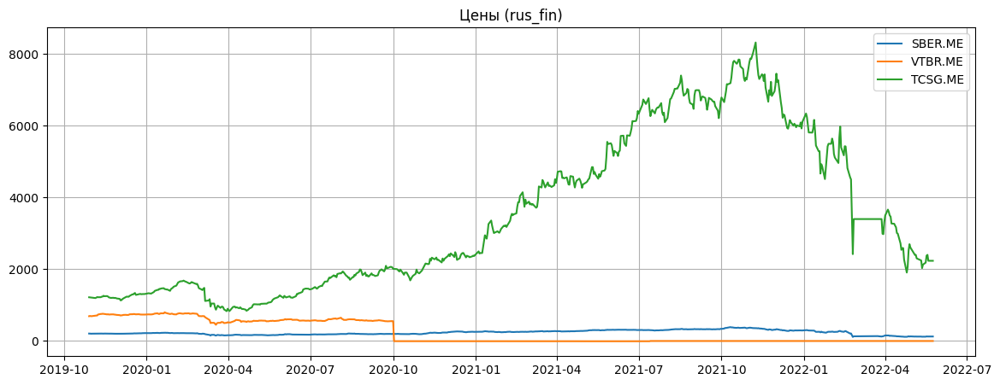

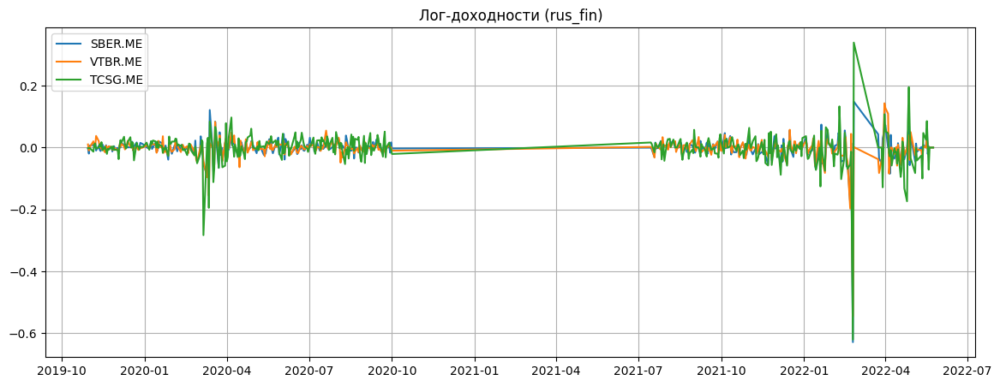

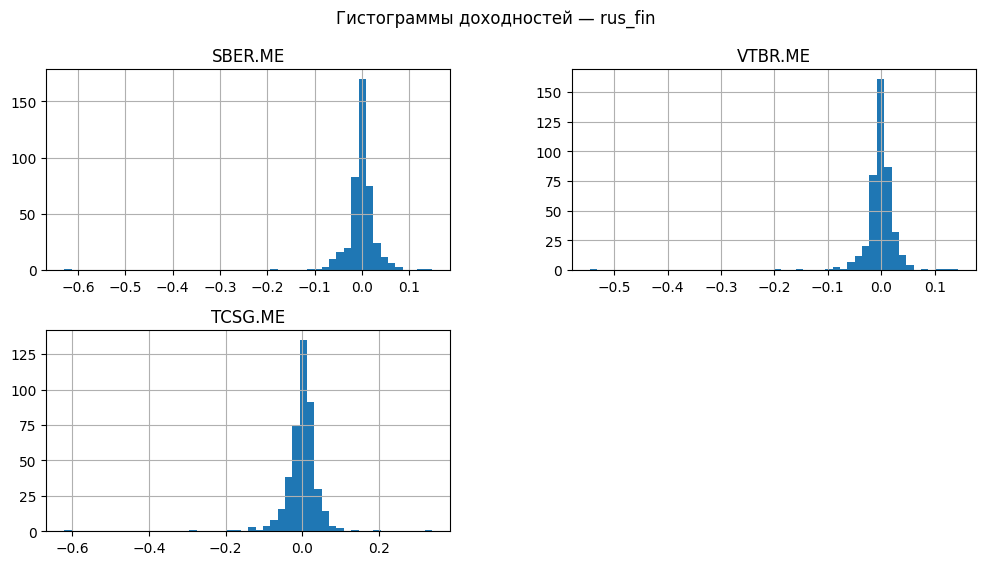

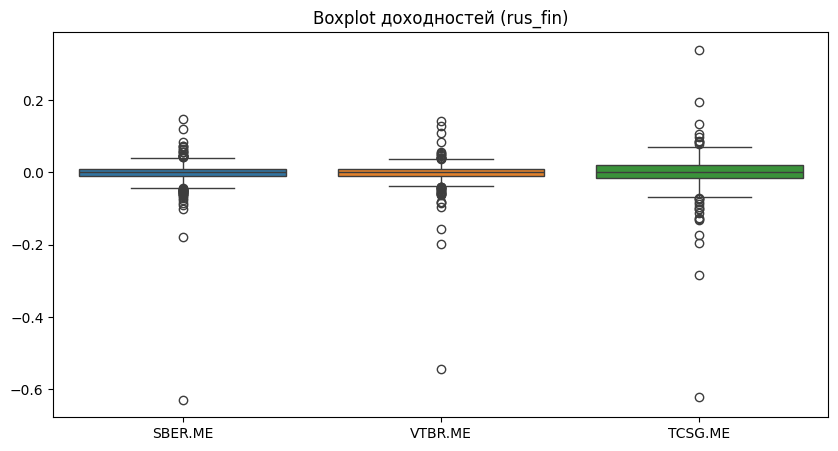

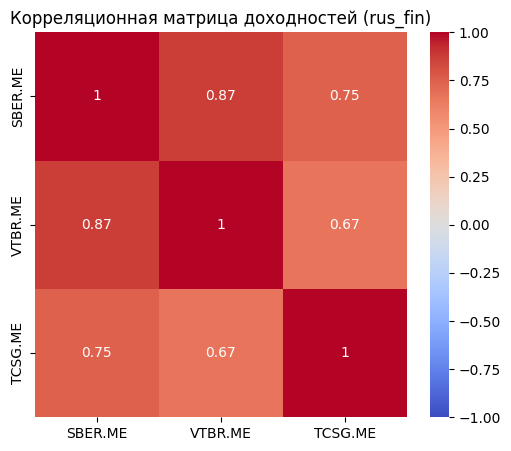


📊 Тесты стационарности (УРОВНИ):


,ADF p-value,KPSS p-value
SBER.ME,0.873321,0.01
VTBR.ME,0.598282,0.01
TCSG.ME,0.702201,0.01


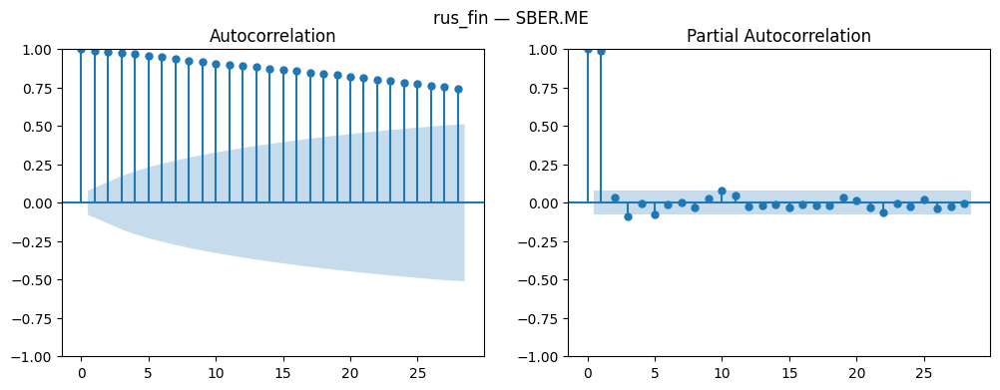

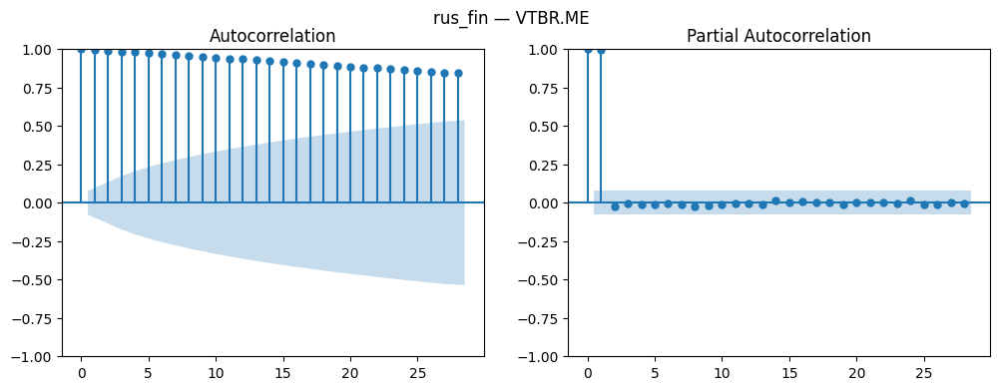

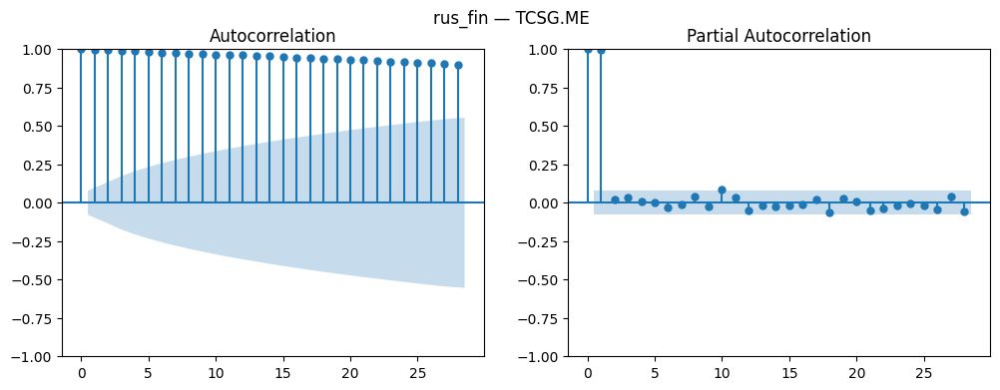

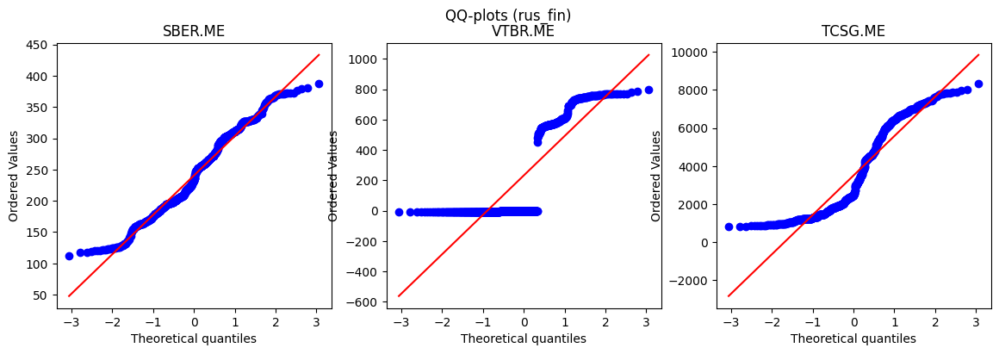

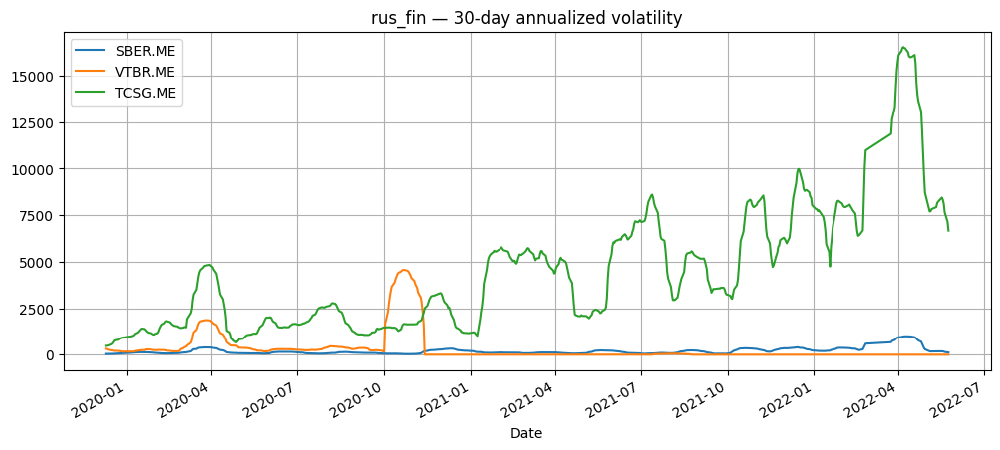


Lagged correlation (lag=1) for rus_fin:


SBER.ME    0.994662
VTBR.ME    0.997195
TCSG.ME    0.997232
dtype: float64

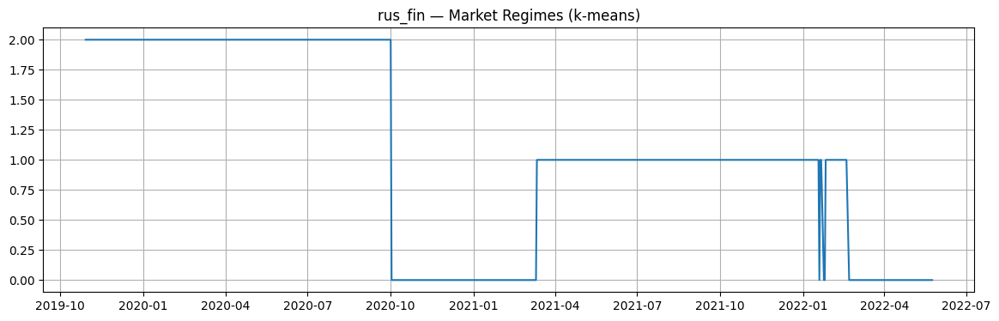


📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):


,ADF p-value,KPSS p-value
SBER.ME,6.279155e-15,0.100000
VTBR.ME,4.694274e-14,0.100000
TCSG.ME,1.131758e-29,0.053674



📌 ВЫВОДЫ ДЛЯ СЕКТОРА RUS_FIN 

• Уровни цен: как правило НЕ стационарны.
  - ADF p-value > 0.05 → не отвергаем единичный корень.
  - KPSS p-value < 0.05 → ряд НЕ стационарен.
  Это НОРМА для финансовых цен → VECM на уровнях возможен.
• Лог-доходности: обычно стационарны.
  - ADF p < 0.05 → стационарны.
  - KPSS p > 0.05 → стационарность подтверждается.
  Это делает доходности корректным выбором для VAR/VARMAX.
• Средняя корреляция внутри сектора: 0.764
  ➝ Сектор движется синхронно, VAR/VECM должны обнаружить сильные связи.

Готово.


📌 EDA СЕКТОР: RUS_OIL

Размер данных: (1616, 3)
Диапазон дат: 2015-11-20 00:00:00 → 2022-05-24 00:00:00


,GAZP.ME,LKOH.ME,ROSN.ME
Date,,,
2015-11-20,101.554611,1584.009644,209.611526
2015-11-23,104.264091,1654.354858,211.070862
2015-11-24,99.908340,1607.021851,204.119675
2015-11-25,98.769669,1625.730225,208.574554
2015-11-26,98.227753,1620.554443,208.036926


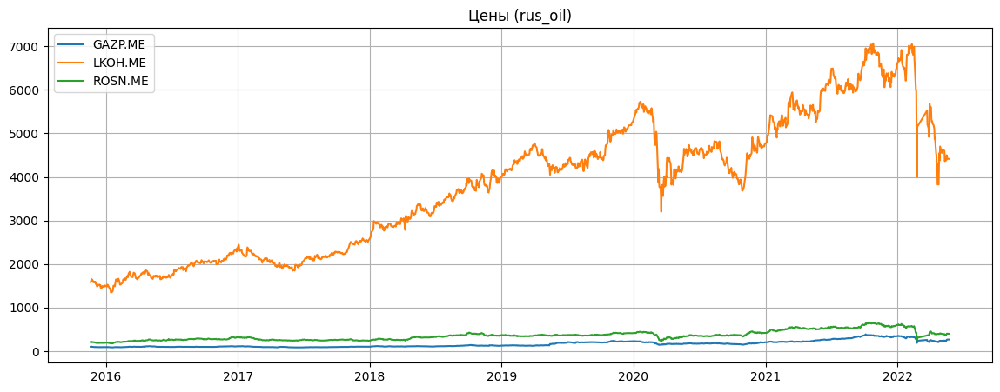

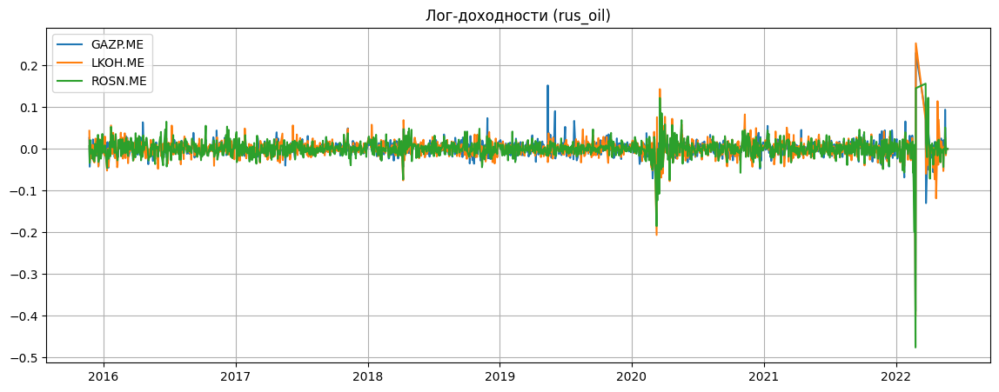

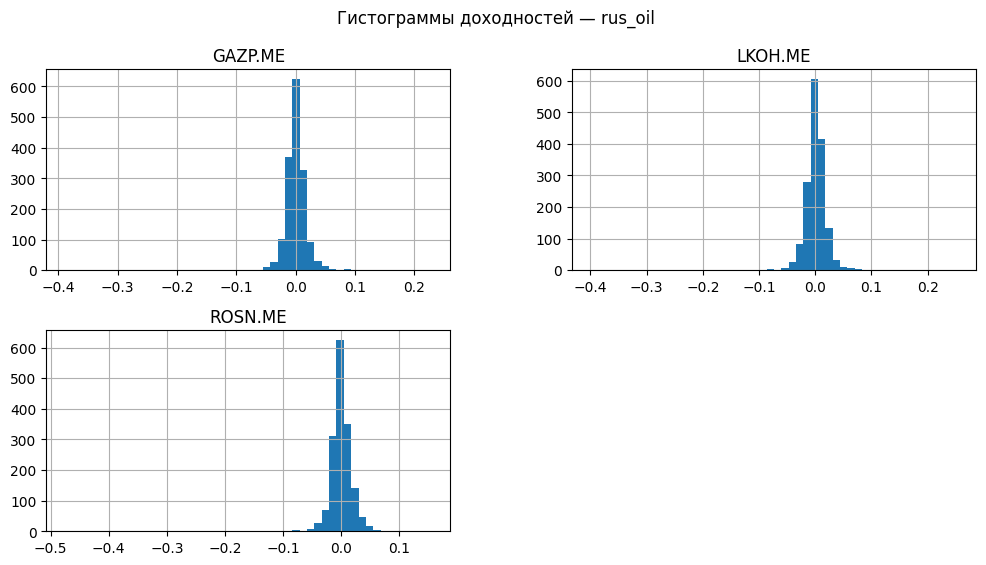

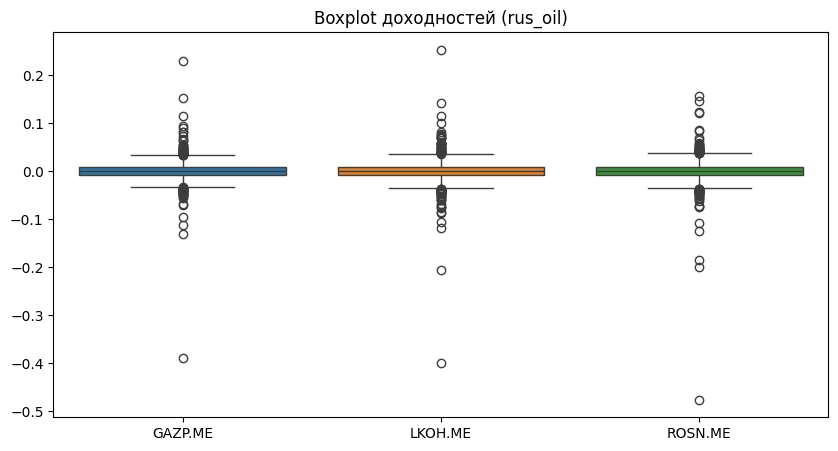

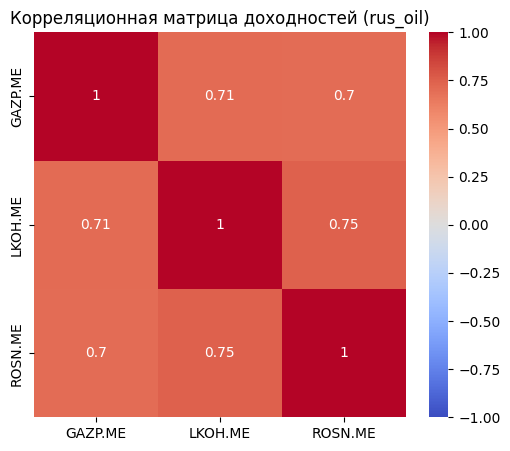


📊 Тесты стационарности (УРОВНИ):


,ADF p-value,KPSS p-value
GAZP.ME,0.719025,0.01
LKOH.ME,0.395897,0.01
ROSN.ME,0.364743,0.01


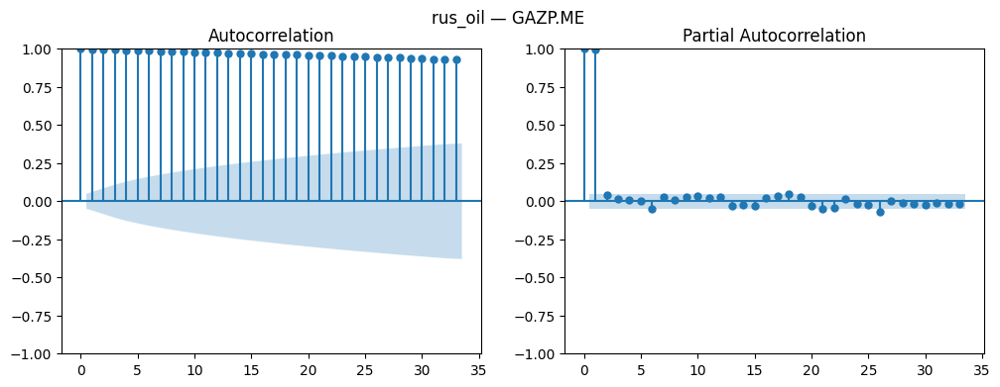

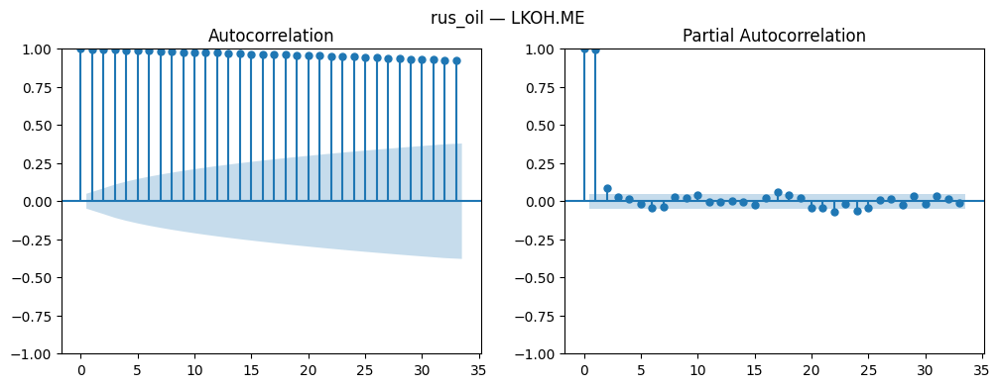

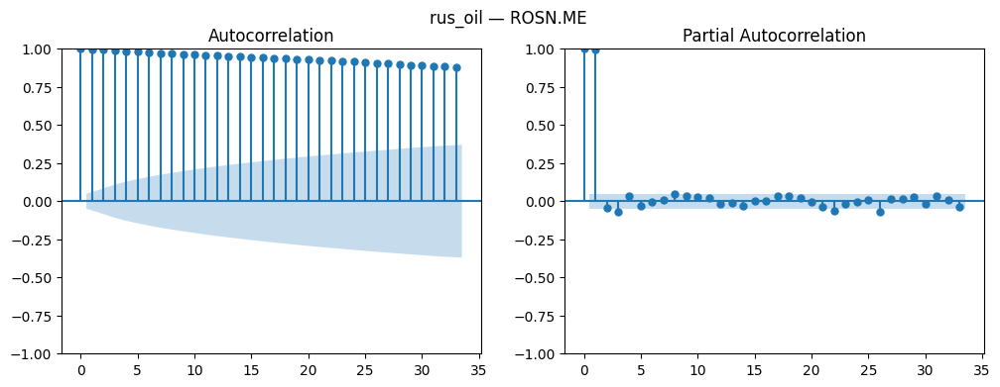

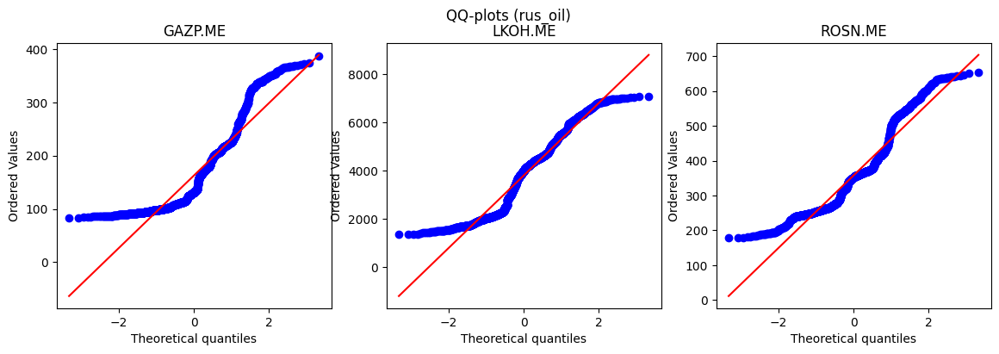

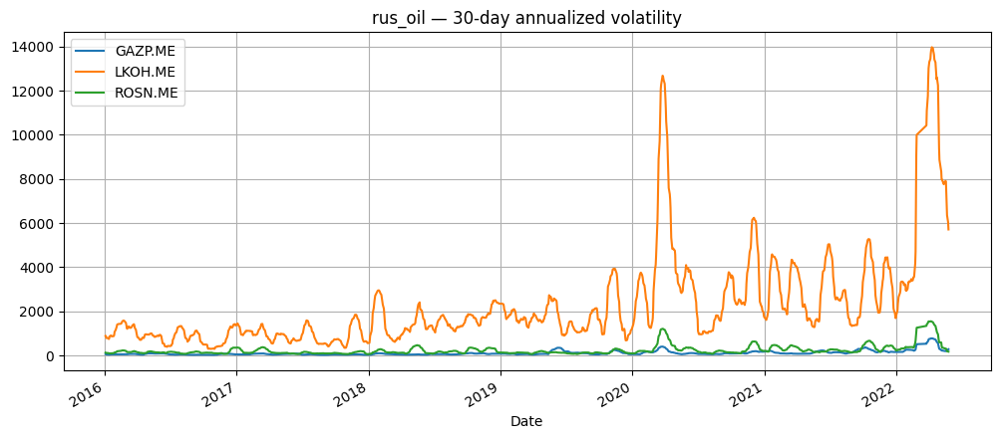


Lagged correlation (lag=1) for rus_oil:


GAZP.ME    0.998291
LKOH.ME    0.997971
ROSN.ME    0.997103
dtype: float64

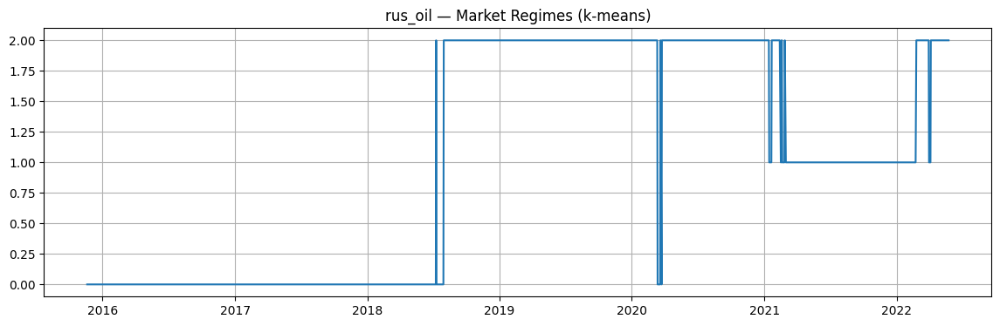


📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):


,ADF p-value,KPSS p-value
GAZP.ME,7.368139e-30,0.1
LKOH.ME,7.547072e-10,0.1
ROSN.ME,1.210841e-27,0.1



📌 ВЫВОДЫ ДЛЯ СЕКТОРА RUS_OIL 

• Уровни цен: как правило НЕ стационарны.
  - ADF p-value > 0.05 → не отвергаем единичный корень.
  - KPSS p-value < 0.05 → ряд НЕ стационарен.
  Это НОРМА для финансовых цен → VECM на уровнях возможен.
• Лог-доходности: обычно стационарны.
  - ADF p < 0.05 → стационарны.
  - KPSS p > 0.05 → стационарность подтверждается.
  Это делает доходности корректным выбором для VAR/VARMAX.
• Средняя корреляция внутри сектора: 0.719
  ➝ Сектор движется синхронно, VAR/VECM должны обнаружить сильные связи.

Готово.


📌 EDA СЕКТОР: RUS_MET

Размер данных: (1616, 3)
Диапазон дат: 2015-11-20 00:00:00 → 2022-05-24 00:00:00


,NLMK.ME,GMKN.ME,CHMF.ME
Date,,,
2015-11-20,33.449692,9591.611328,299.263031
2015-11-23,33.691441,9434.567383,298.410431
2015-11-24,32.682610,9287.459961,289.234833
2015-11-25,32.961552,9369.958984,290.371674
2015-11-26,33.166107,9333.181641,293.132446


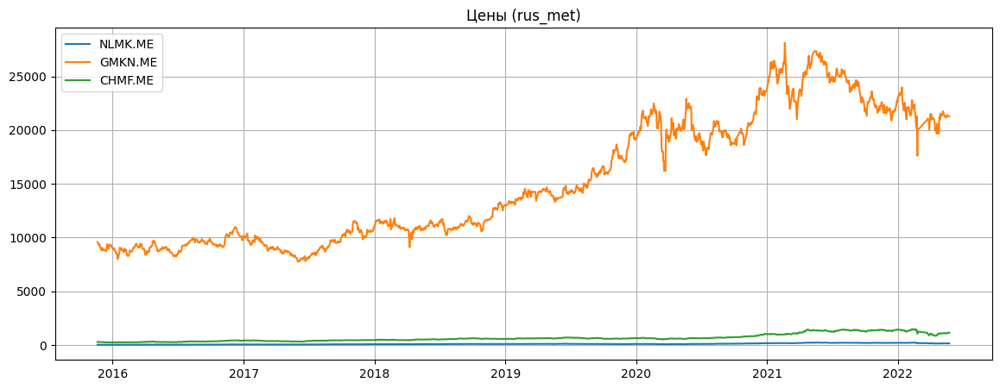

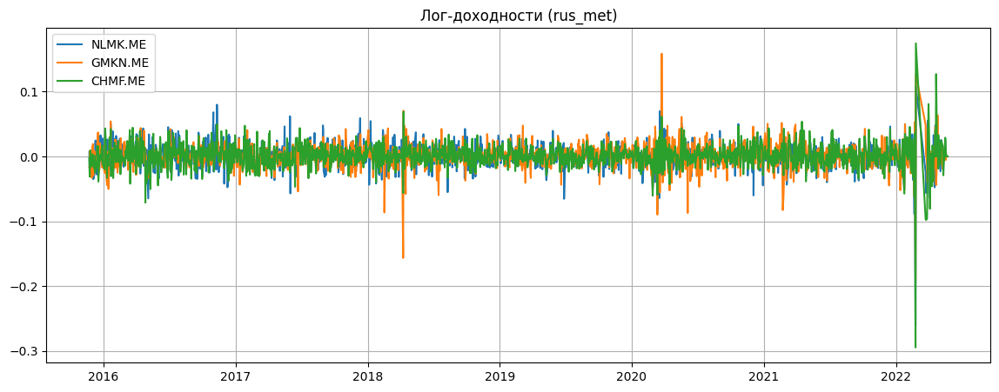

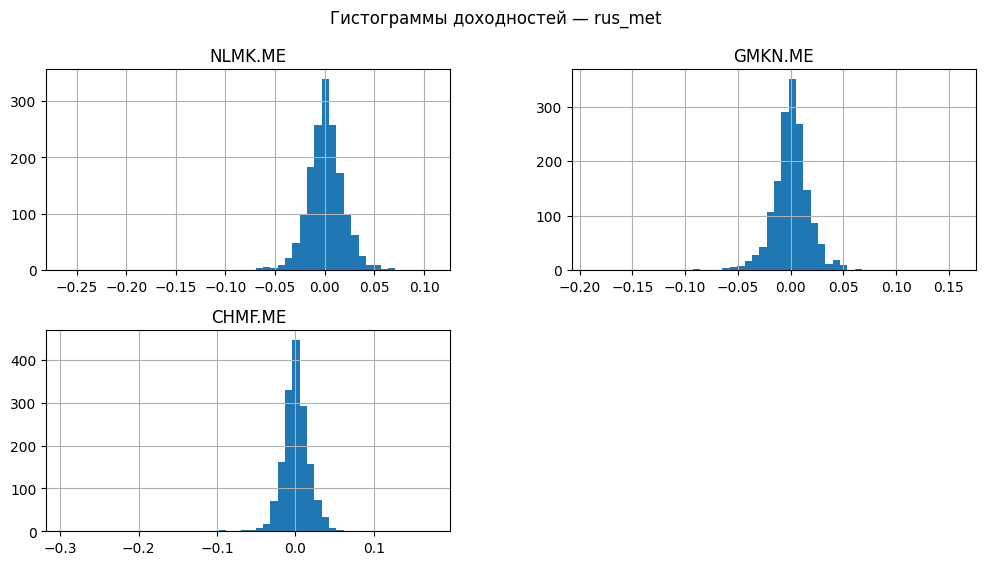

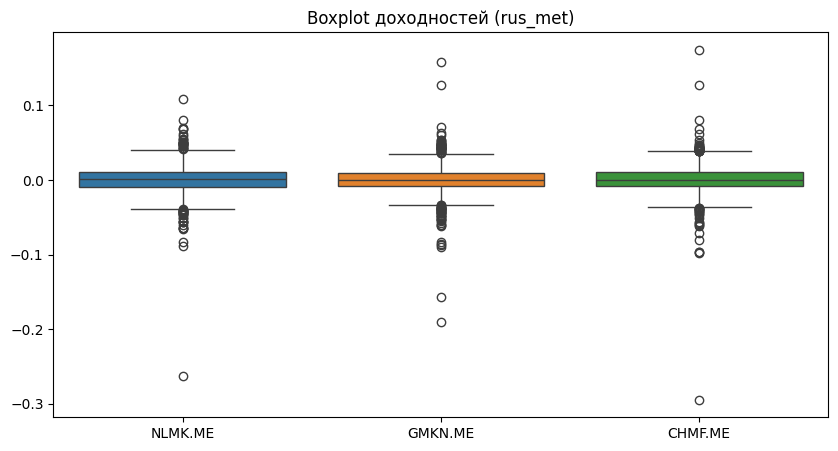

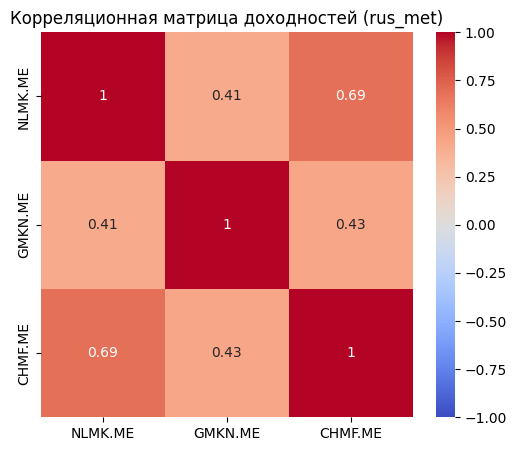


📊 Тесты стационарности (УРОВНИ):


,ADF p-value,KPSS p-value
NLMK.ME,0.662816,0.01
GMKN.ME,0.776743,0.01
CHMF.ME,0.834555,0.01


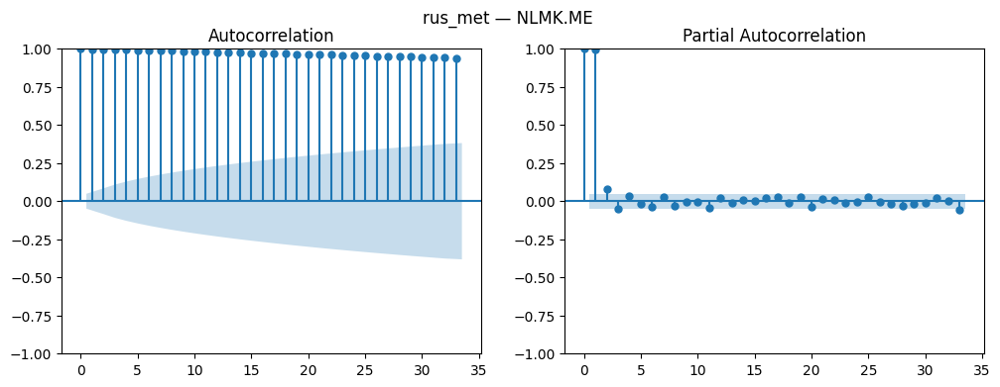

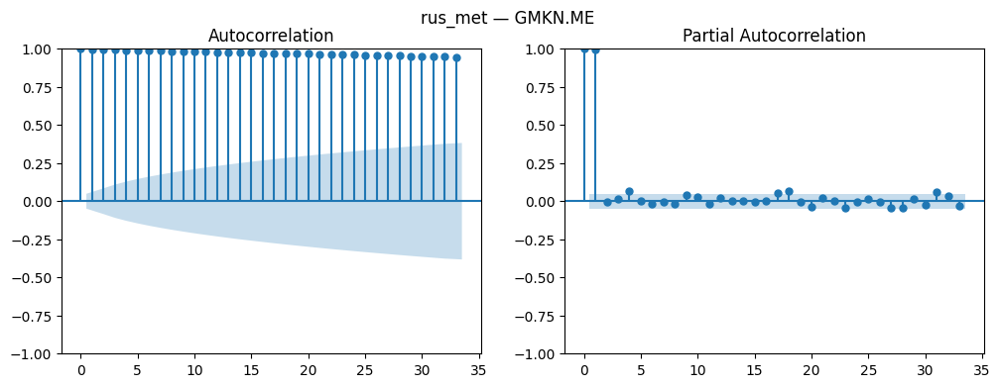

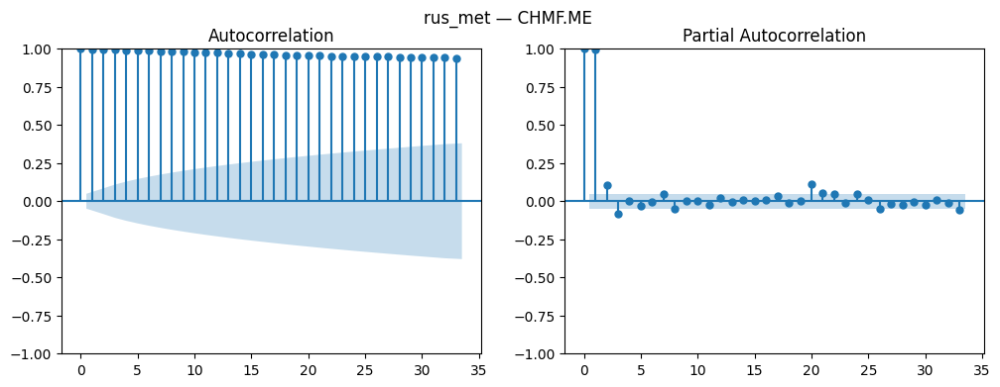

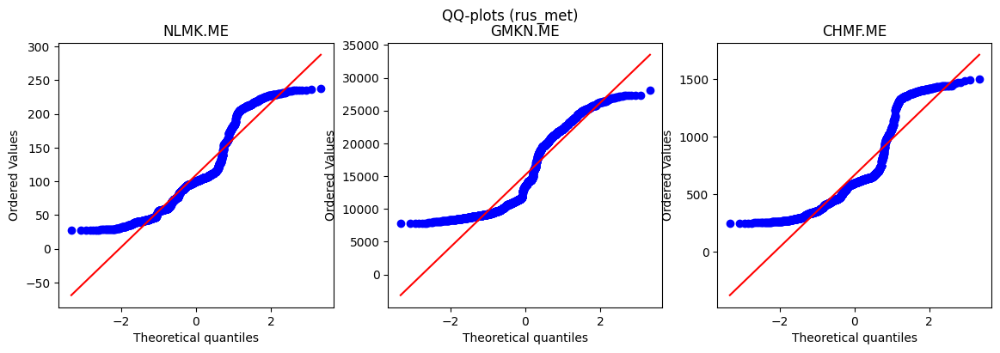

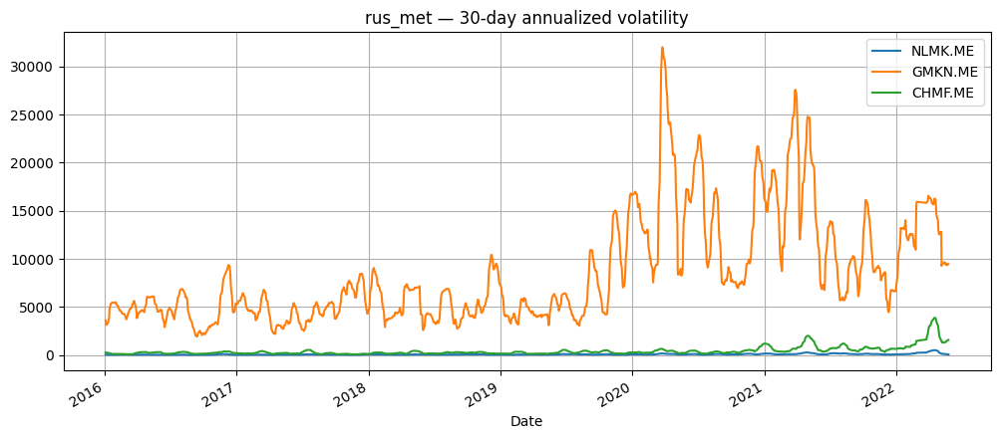


Lagged correlation (lag=1) for rus_met:


NLMK.ME    0.998954
GMKN.ME    0.998503
CHMF.ME    0.998702
dtype: float64

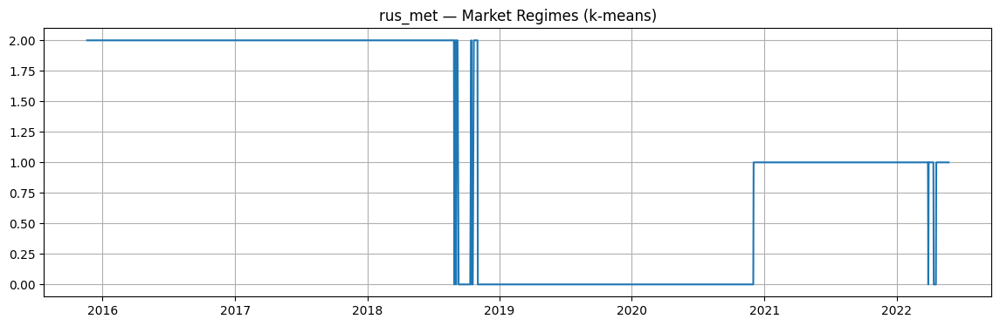


📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):


,ADF p-value,KPSS p-value
NLMK.ME,2.130207e-26,0.1
GMKN.ME,0.000000e+00,0.1
CHMF.ME,1.231408e-16,0.1



📌 ВЫВОДЫ ДЛЯ СЕКТОРА RUS_MET 

• Уровни цен: как правило НЕ стационарны.
  - ADF p-value > 0.05 → не отвергаем единичный корень.
  - KPSS p-value < 0.05 → ряд НЕ стационарен.
  Это НОРМА для финансовых цен → VECM на уровнях возможен.
• Лог-доходности: обычно стационарны.
  - ADF p < 0.05 → стационарны.
  - KPSS p > 0.05 → стационарность подтверждается.
  Это делает доходности корректным выбором для VAR/VARMAX.
• Средняя корреляция внутри сектора: 0.511
  ➝ Умеренная связь, модели должны выявить перекрестные эффекты.

Готово.


📌 EDA СЕКТОР: US_TECH

Размер данных: (2514, 3)
Диапазон дат: 2015-11-23 00:00:00 → 2025-11-20 00:00:00


,AAPL,MSFT,NVDA
Date,,,
2015-11-23,26.548964,47.538147,0.754261
2015-11-24,26.803743,47.590771,0.760359
2015-11-25,26.612099,47.099518,0.759383
2015-11-27,26.562492,47.310066,0.765725
2015-11-30,26.672977,47.678497,0.773776


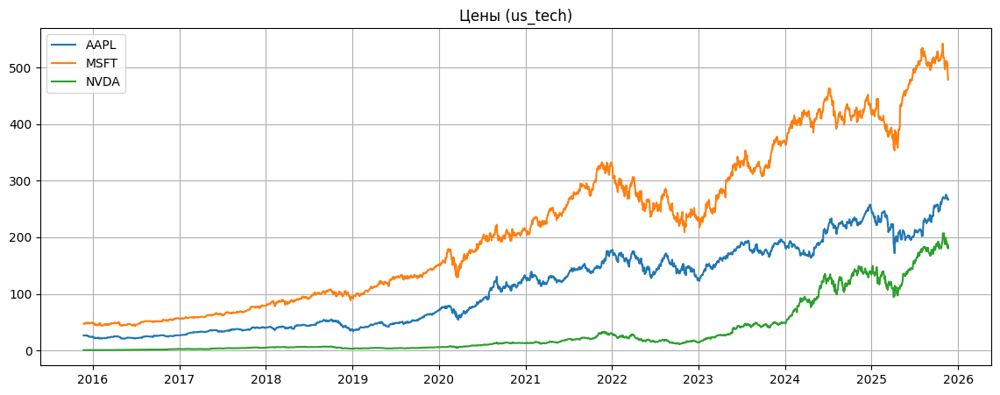

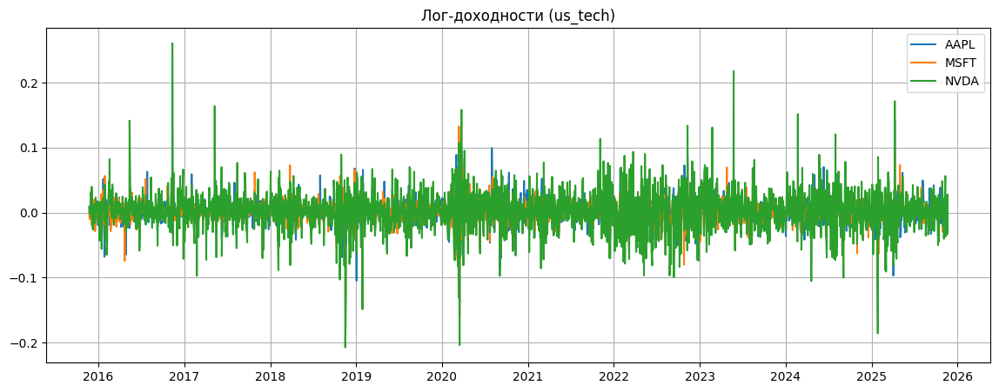

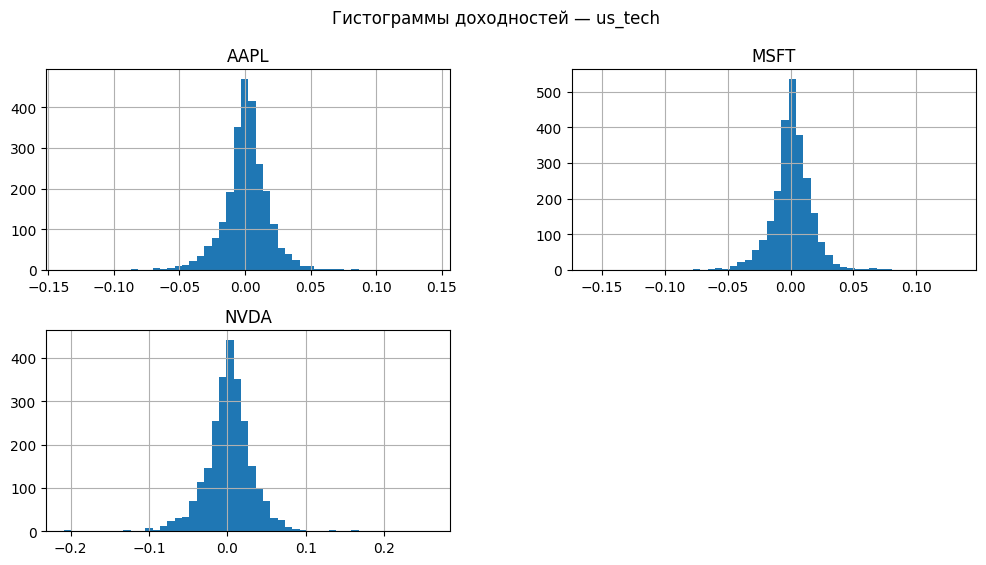

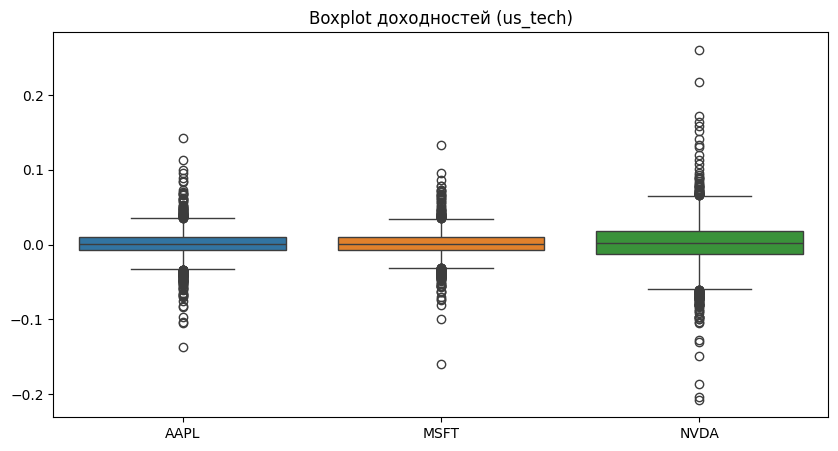

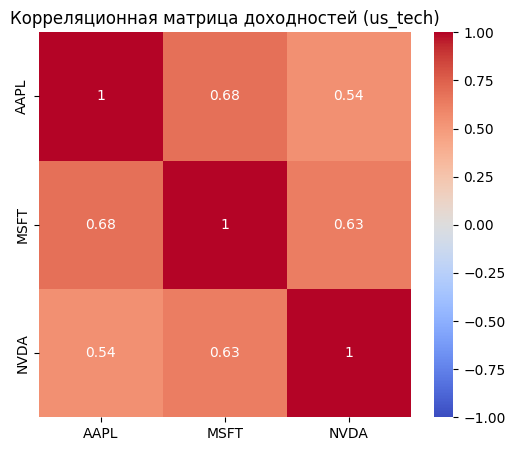


📊 Тесты стационарности (УРОВНИ):


,ADF p-value,KPSS p-value
AAPL,0.982796,0.01
MSFT,0.967317,0.01
NVDA,0.998576,0.01


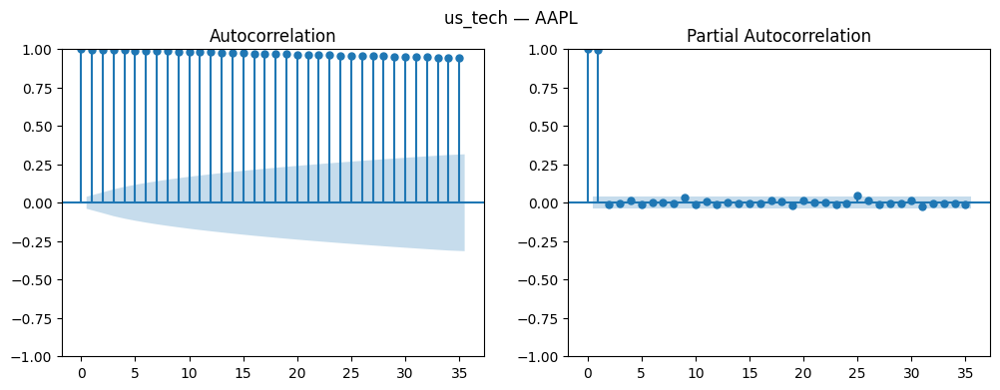

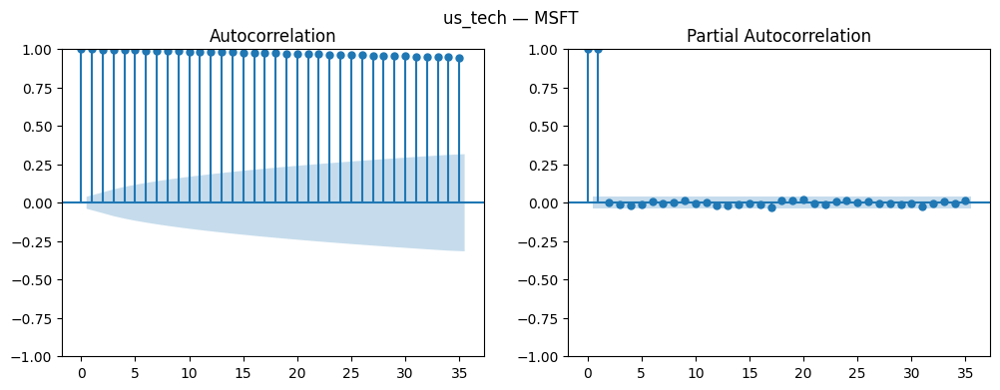

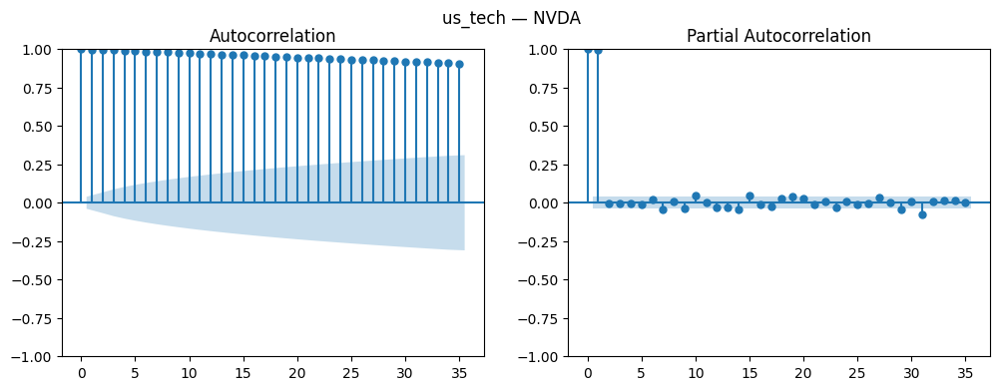

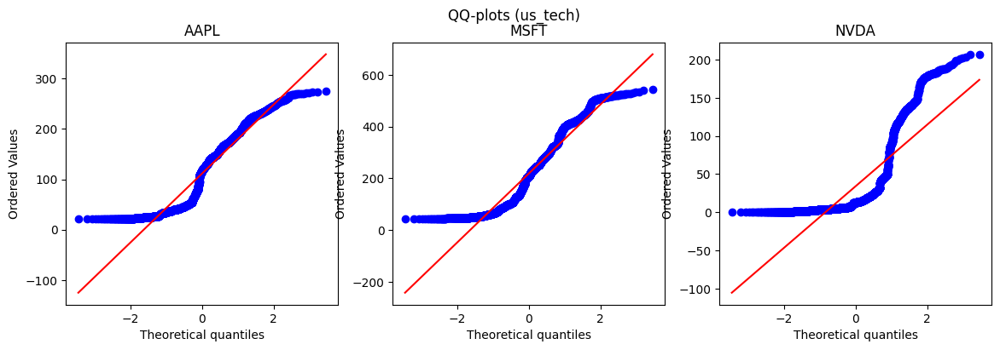

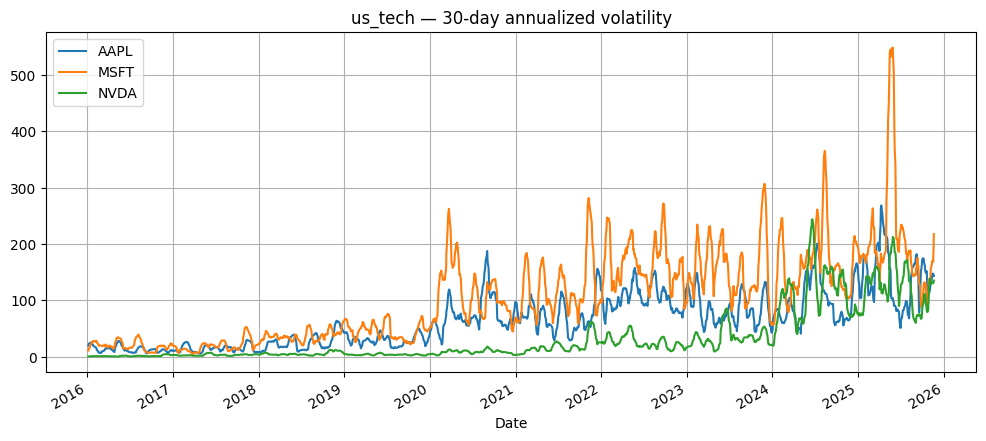


Lagged correlation (lag=1) for us_tech:


AAPL    0.999472
MSFT    0.999580
NVDA    0.999343
dtype: float64

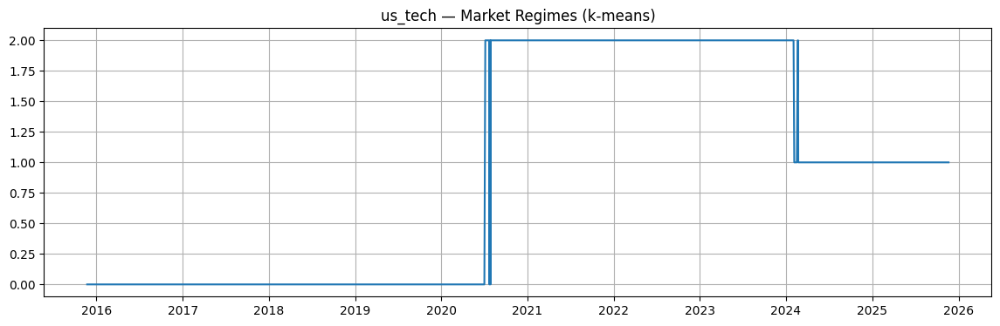


📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):


,ADF p-value,KPSS p-value
AAPL,5.121544e-29,0.1
MSFT,7.340334e-30,0.1
NVDA,2.902646e-30,0.1



📌 ВЫВОДЫ ДЛЯ СЕКТОРА US_TECH 

• Уровни цен: как правило НЕ стационарны.
  - ADF p-value > 0.05 → не отвергаем единичный корень.
  - KPSS p-value < 0.05 → ряд НЕ стационарен.
  Это НОРМА для финансовых цен → VECM на уровнях возможен.
• Лог-доходности: обычно стационарны.
  - ADF p < 0.05 → стационарны.
  - KPSS p > 0.05 → стационарность подтверждается.
  Это делает доходности корректным выбором для VAR/VARMAX.
• Средняя корреляция внутри сектора: 0.617
  ➝ Сектор движется синхронно, VAR/VECM должны обнаружить сильные связи.

Готово.


📌 EDA СЕКТОР: US_RETAIL

Размер данных: (2514, 3)
Диапазон дат: 2015-11-23 00:00:00 → 2025-11-20 00:00:00


,WMT,COST,TGT
Date,,,
2015-11-23,16.636299,137.534073,53.716831
2015-11-24,16.542435,136.473801,54.170162
2015-11-25,16.630775,136.642120,54.370827
2015-11-27,16.534153,137.643402,54.578926
2015-11-30,16.244270,135.825851,53.880329


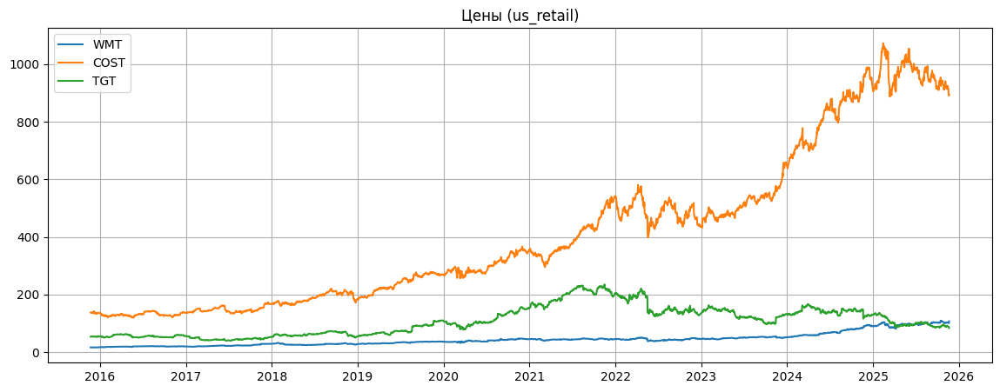

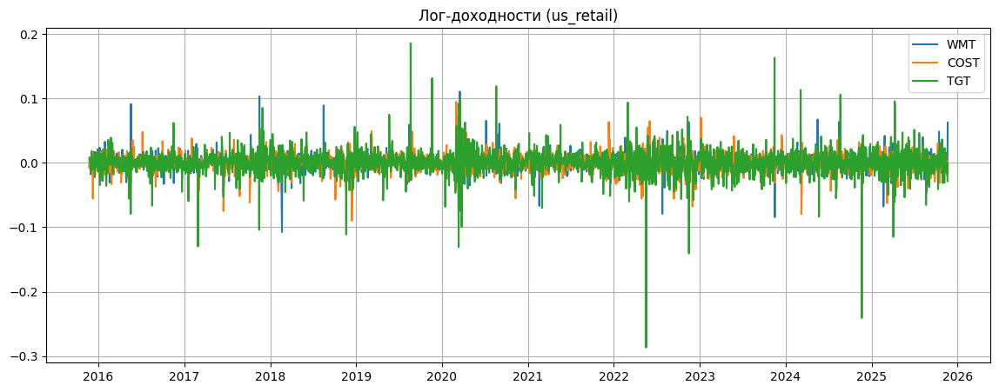

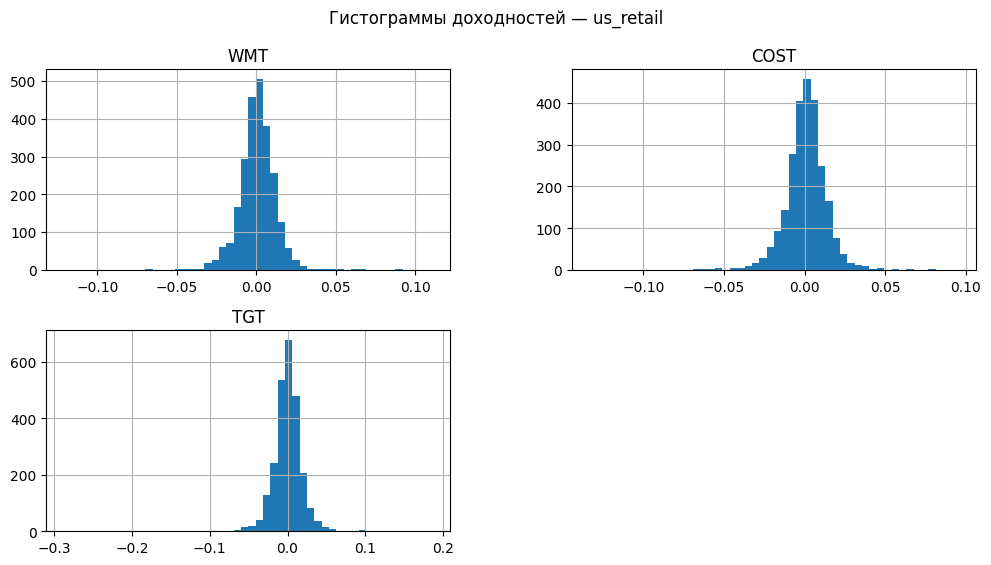

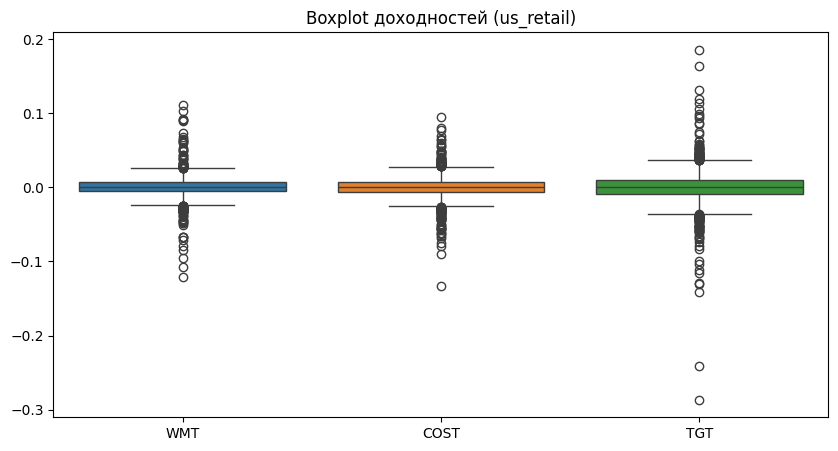

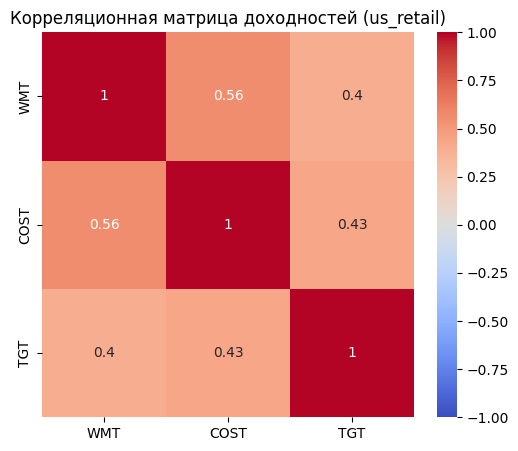


📊 Тесты стационарности (УРОВНИ):


,ADF p-value,KPSS p-value
WMT,0.998771,0.01
COST,0.983306,0.01
TGT,0.558303,0.01


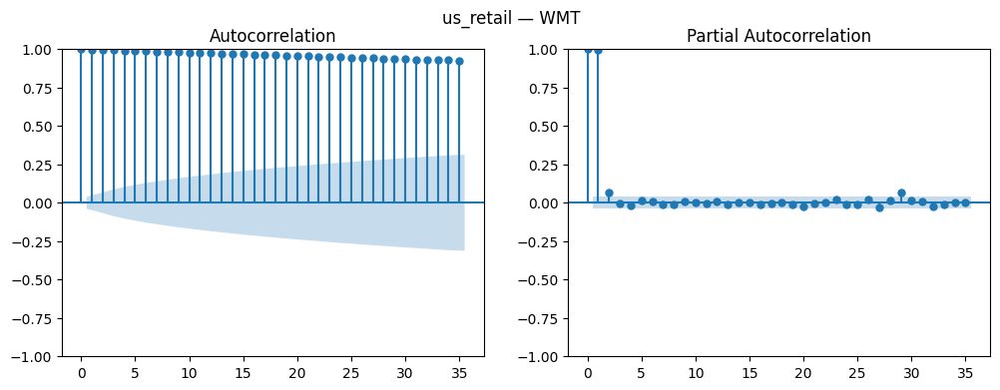

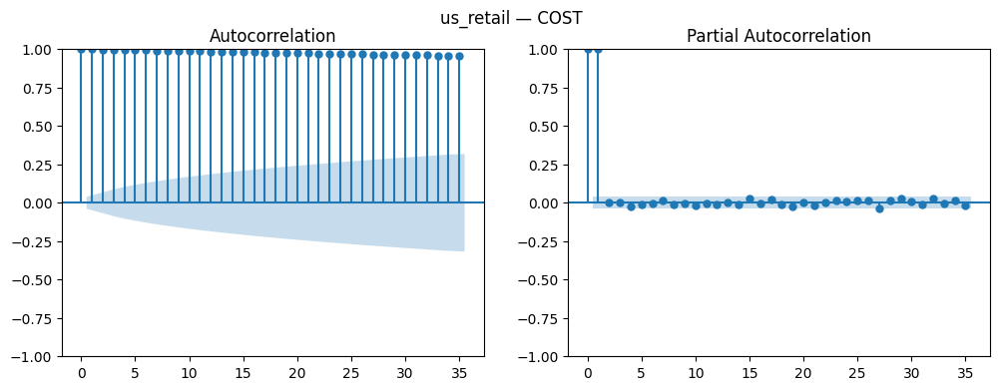

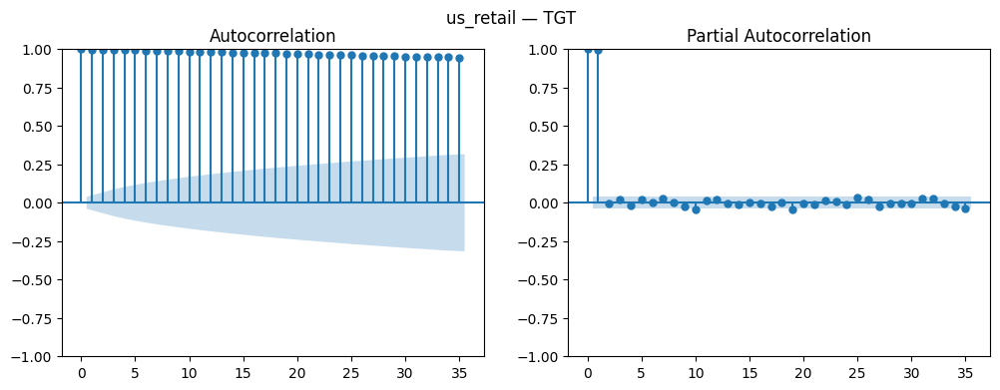

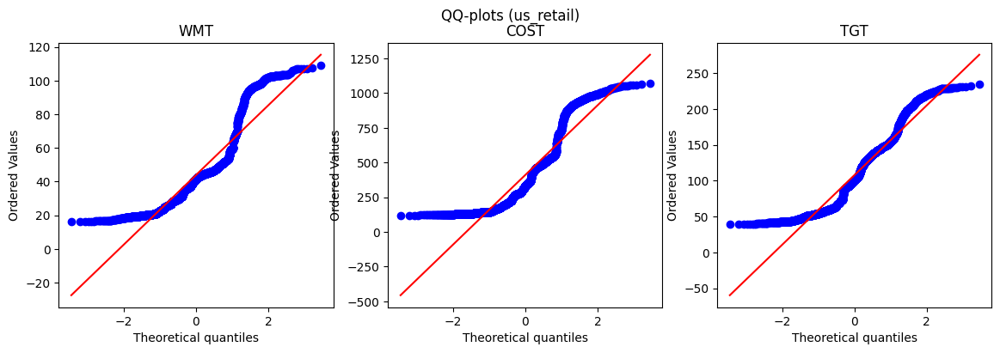

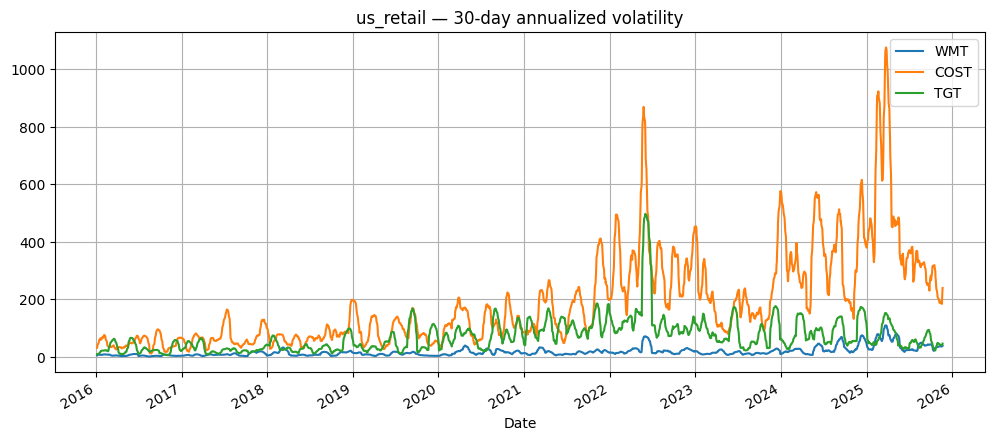


Lagged correlation (lag=1) for us_retail:


WMT     0.999530
COST    0.999683
TGT     0.998726
dtype: float64

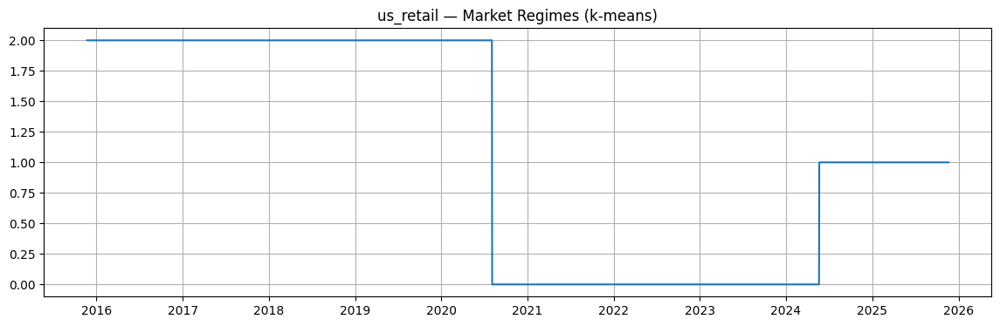


📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):


,ADF p-value,KPSS p-value
WMT,6.741837e-30,0.1
COST,2.555191e-19,0.1
TGT,0.000000e+00,0.1



📌 ВЫВОДЫ ДЛЯ СЕКТОРА US_RETAIL 

• Уровни цен: как правило НЕ стационарны.
  - ADF p-value > 0.05 → не отвергаем единичный корень.
  - KPSS p-value < 0.05 → ряд НЕ стационарен.
  Это НОРМА для финансовых цен → VECM на уровнях возможен.
• Лог-доходности: обычно стационарны.
  - ADF p < 0.05 → стационарны.
  - KPSS p > 0.05 → стационарность подтверждается.
  Это делает доходности корректным выбором для VAR/VARMAX.
• Средняя корреляция внутри сектора: 0.463
  ➝ Умеренная связь, модели должны выявить перекрестные эффекты.

Готово.


📌 EDA СЕКТОР: US_ENERGY

Размер данных: (2514, 3)
Диапазон дат: 2015-11-23 00:00:00 → 2025-11-20 00:00:00


,XOM,CVX,COP
Date,,,
2015-11-23,51.805092,58.679672,39.201073
2015-11-24,52.837589,59.553265,40.702011
2015-11-25,52.431053,59.240341,40.010406
2015-11-27,52.418140,58.914387,39.348213
2015-11-30,52.695629,59.533695,39.767601


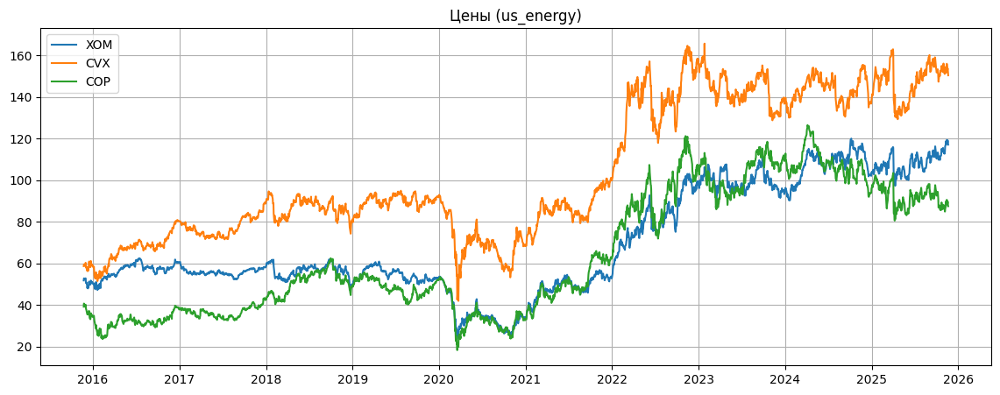

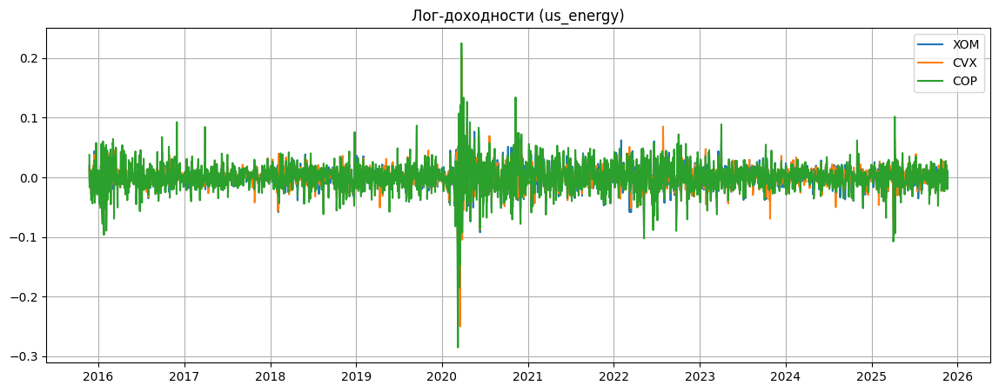

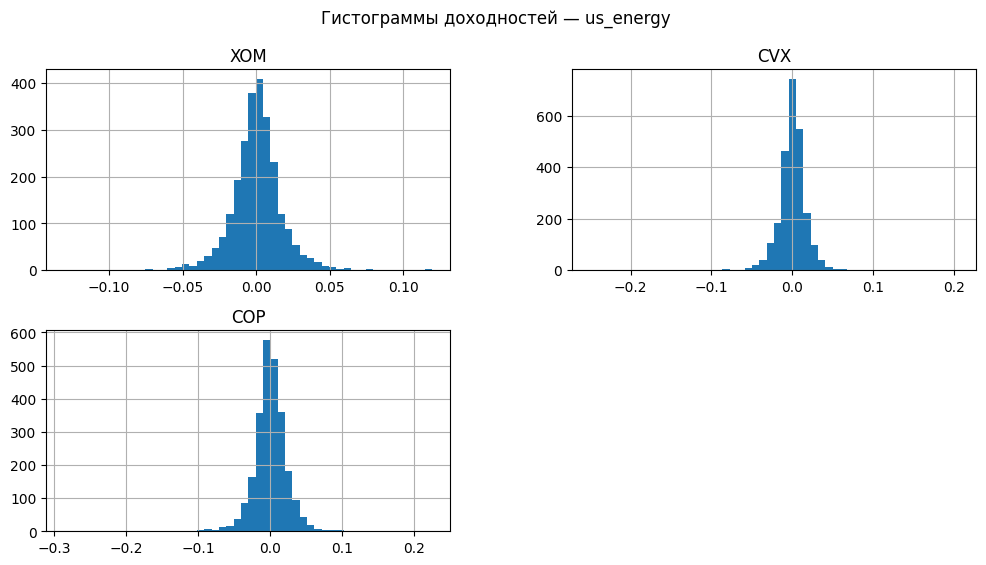

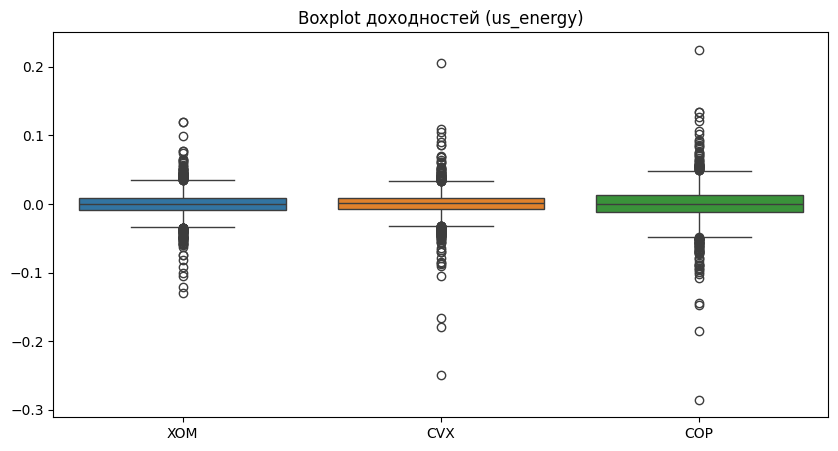

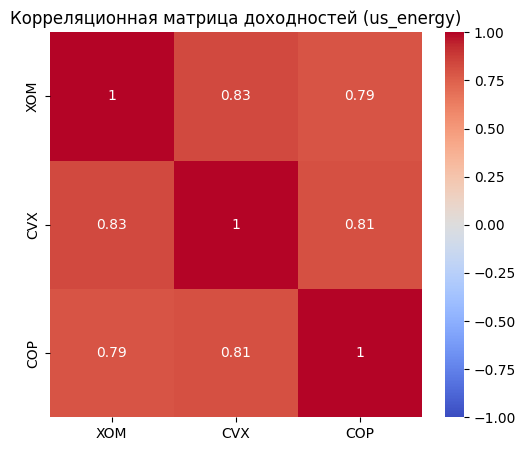


📊 Тесты стационарности (УРОВНИ):


,ADF p-value,KPSS p-value
XOM,0.895126,0.01
CVX,0.612451,0.01
COP,0.655668,0.01


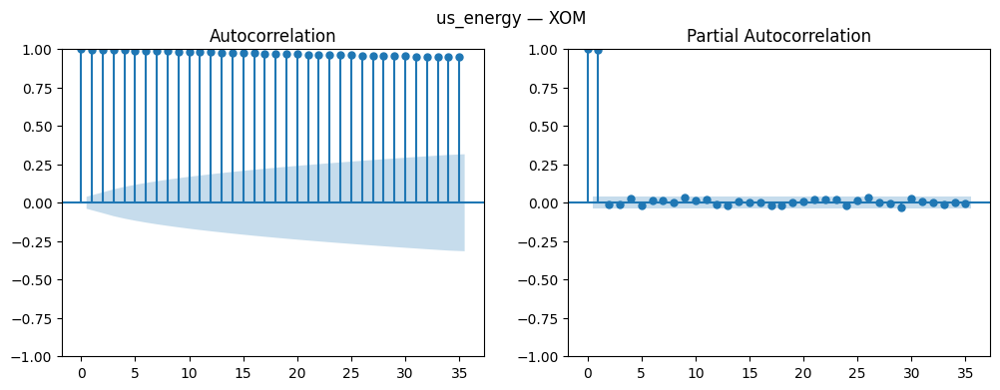

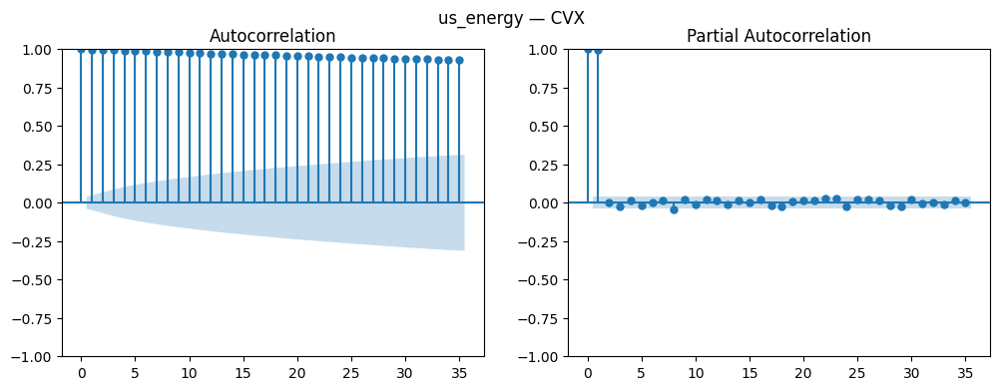

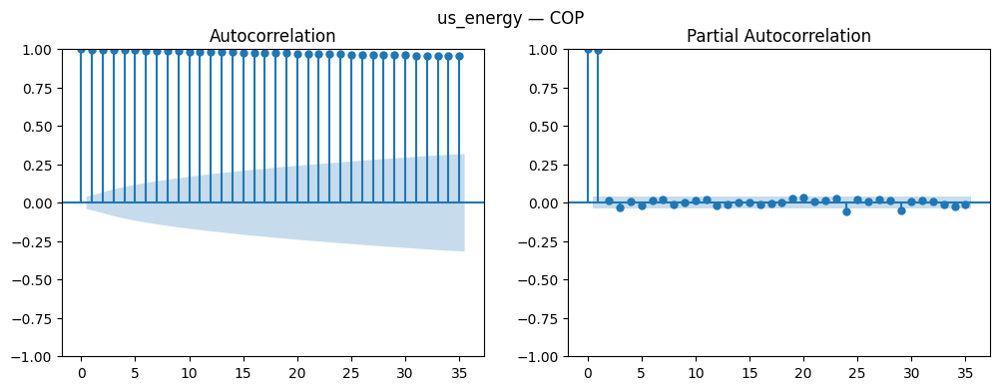

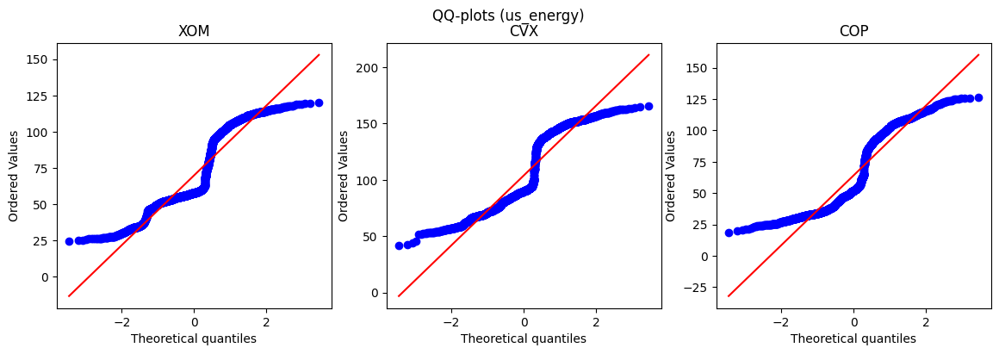

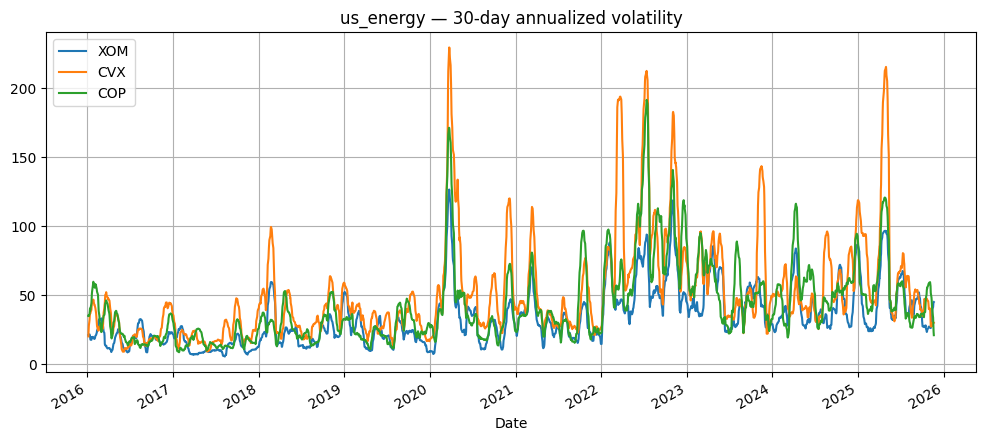


Lagged correlation (lag=1) for us_energy:


XOM    0.998986
CVX    0.998538
COP    0.998804
dtype: float64

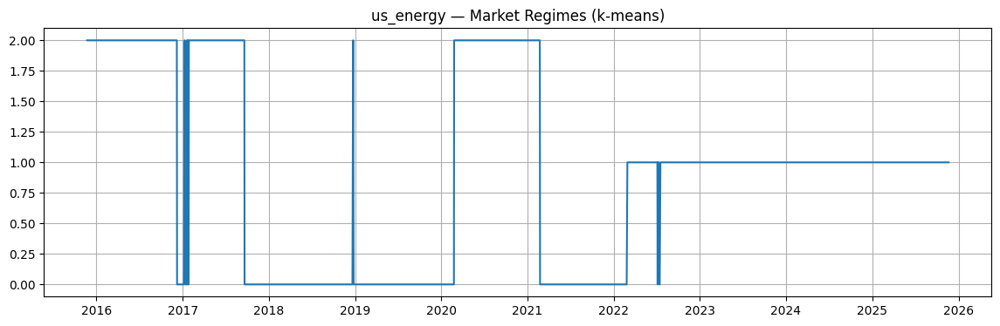


📊 Тесты стационарности (ЛОГ-ДОХОДНОСТИ):


,ADF p-value,KPSS p-value
XOM,2.754644e-30,0.1
CVX,3.472096e-27,0.1
COP,1.632428e-18,0.1



📌 ВЫВОДЫ ДЛЯ СЕКТОРА US_ENERGY 

• Уровни цен: как правило НЕ стационарны.
  - ADF p-value > 0.05 → не отвергаем единичный корень.
  - KPSS p-value < 0.05 → ряд НЕ стационарен.
  Это НОРМА для финансовых цен → VECM на уровнях возможен.
• Лог-доходности: обычно стационарны.
  - ADF p < 0.05 → стационарны.
  - KPSS p > 0.05 → стационарность подтверждается.
  Это делает доходности корректным выбором для VAR/VARMAX.
• Средняя корреляция внутри сектора: 0.813
  ➝ Сектор движется синхронно, VAR/VECM должны обнаружить сильные связи.

Готово.




🎉 FULL EDA COMPLETED FOR ALL SECTORS


In [32]:
# =====================
all_returns = {}

for sector, file in SECTORS.items():
    df = load_sector(file)
    df_ret = run_eda(sector, df)
    all_returns[sector] = df_ret

print("\n\n🎉 FULL EDA COMPLETED FOR ALL SECTORS")

### Запустим VAR 

In [33]:
import os

# Создадим папки для хранения результатов
OUT_VAR = "VAR_results"
OUT_VECM = "VECM_results"
OUT_VARMAX = "VARMAX_results"
os.makedirs(OUT_VAR, exist_ok=True)
os.makedirs(OUT_VECM, exist_ok=True)
os.makedirs(OUT_VARMAX, exist_ok=True)

In [34]:
# VAR_pipeline_all_sectors.py
import os
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tools.eval_measures import rmse
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.stattools import durbin_watson

# ==========================
# Settings
# ==========================
SECTORS = {
    "rus_fin": "rus_fin_prices.csv",
    "rus_oil": "rus_oil_prices.csv",
    "rus_met": "rus_met_prices.csv",
    "us_tech": "us_tech_prices.csv",
    "us_retail": "us_retail_prices.csv",
    "us_energy": "us_energy_prices.csv"
}

OUT_DIR = "VAR_results"
os.makedirs(OUT_DIR, exist_ok=True)

# Forecast horizons to produce
FORECAST_HORIZONS = [10, 20, 100]

# How many last observations to use as holdout for forecast evaluation
HOLDOUT_DAYS = 100  # можно поменять

# Max lags to consider in select_order
MAX_LAGS = 10

# ==========================
# Utility functions
# ==========================
def ensure_df_numeric(df):
    """Ensure all columns numeric; coerce non-numeric to NaN then drop cols with all NaN."""
    df2 = df.copy()
    for c in df2.columns:
        df2[c] = pd.to_numeric(df2[c], errors="coerce")
    df2 = df2.dropna(axis=1, how='all')
    return df2

def compute_log_returns(df):
    # natural log returns
    return np.log(df).diff().dropna(how='all')

def savefig(fig, path):
    fig.savefig(path, bbox_inches='tight', dpi=150)
    plt.close(fig)

def summarize_var_results(var_res):
    """Return dict summary of diagnostics we will store."""
    res = {}
    # stability: companion roots
    try:
        roots = var_res.roots
        res['stable'] = np.all(np.abs(roots) < 1)
        res['max_root_modulus'] = np.max(np.abs(roots))
    except Exception:
        res['stable'] = np.nan
        res['max_root_modulus'] = np.nan

    # serial correlation
    try:
        serial_test = var_res.test_serial_correlation(lags=var_res.k_ar)
        res['serial_pvalue'] = serial_test.pvalue if hasattr(serial_test, 'pvalue') else np.nan
    except Exception:
        res['serial_pvalue'] = np.nan

    # normality
    try:
        norm_test = var_res.test_normality()
        res['normality_pvalue'] = norm_test['normality'].pvalue if hasattr(norm_test, 'normality') else np.nan
    except Exception:
        res['normality_pvalue'] = np.nan

    # arch
    try:
        arch_test = var_res.test_arch()
        res['arch_pvalue'] = arch_test.pvalue if hasattr(arch_test, 'pvalue') else np.nan
    except Exception:
        res['arch_pvalue'] = np.nan

    # durbin-watson for residuals per equation (average)
    try:
        dw = durbin_watson(var_res.resid)
        res['dw_mean'] = np.mean(dw)
    except Exception:
        res['dw_mean'] = np.nan

    return res

def forecast_and_reconstruct_prices(var_res, df_prices, df_returns_train, steps):
    """
    Forecast returns for 'steps' ahead using var_res (fitted on returns),
    then reconstruct levels (prices) by cumulatively applying returns to last known prices.
    df_prices: DataFrame of prices (aligned with returns)
    df_returns_train: returns DataFrame that was used to fit var_res
    """
    last_price = df_prices.iloc[-1]  # last observed prices
    # forecast returns
    fc_returns = var_res.forecast(y=df_returns_train.values[-var_res.k_ar:], steps=steps)
    start = df_prices.index[-1] + pd.Timedelta(days=1)
    idx = pd.date_range(start=start, periods=h, freq='B')
    fc_returns_df = pd.DataFrame(fc_returns, index=idx, columns=df_returns_train.columns)

    # reconstruct price paths: price_t+1 = price_t * exp(return_t+1)
    prices_fc = []
    prev = last_price.copy()
    for t in range(steps):
        ret = fc_returns_df.iloc[t]
        next_price = prev * np.exp(ret)
        prices_fc.append(next_price)
        prev = next_price
    prices_fc_df = pd.DataFrame(prices_fc, index=idx, columns=df_returns_train.columns)
    return fc_returns_df, prices_fc_df

In [35]:
# ==========================
# Main pipeline per sector
# ==========================
summary_rows = []

for sector_name, filename in SECTORS.items():
    print("\n" + "="*80)
    print(f"Processing sector: {sector_name}")
    print("="*80)

    try:
        df_prices = pd.read_csv(filename, index_col=0, parse_dates=True)
    except Exception as e:
        print(f"ERROR: cannot read {filename}: {e}")
        continue

    # Clean numeric & drop NaN cols if any
    df_prices = ensure_df_numeric(df_prices)
    print("Loaded prices shape:", df_prices.shape)

    # If fewer than 2 columns -> skip
    if df_prices.shape[1] < 2:
        print(f"Not enough series in {sector_name} after cleaning. Skipping.")
        continue

    # compute returns
    df_returns = compute_log_returns(df_prices).dropna(how='any')
    print("Returns shape (after dropna):", df_returns.shape)
    if df_returns.shape[0] < 50:
        print("Too few observations for reliable VAR. Consider expanding period. Skipping.")
        continue

    # train / holdout split: leave HOLDOUT_DAYS last obs for evaluation
    if df_returns.shape[0] > HOLDOUT_DAYS:
        train = df_returns.iloc[:-HOLDOUT_DAYS]
        test = df_returns.iloc[-HOLDOUT_DAYS:]
    else:
        train = df_returns.copy()
        test = pd.DataFrame()  # empty

    # Lag order selection
    model = VAR(train)
    try:
        sel = model.select_order(MAX_LAGS)
    except Exception as e:
        print("select_order failed:", e)
        sel = None

    # choose lag by AIC (fallback to BIC if None)
    if sel is not None:
        try:
            best_aic = sel.selected_orders.get('aic', None)
            best_bic = sel.selected_orders.get('bic', None)
            best_hqic = sel.selected_orders.get('hqic', None)
        except Exception:
            best_aic = sel.aic
            best_bic = sel.bic
            best_hqic = sel.hqic
    else:
        best_aic = best_bic = best_hqic = None

    # choose lag to fit: prefer AIC, but ensure >=1
    chosen_lag = int(best_aic) if (best_aic is not None and not pd.isna(best_aic) and best_aic>=1) else (int(best_bic) if best_bic is not None and best_bic>=1 else 1)
    chosen_lag = max(1, chosen_lag)
    print(f"Selected lags -> AIC: {best_aic}, BIC: {best_bic}, chosen: {chosen_lag}")

    # Fit VAR
    try:
        var_res = model.fit(chosen_lag)
    except Exception as e:
        print("VAR fit failed:", e)
        continue

    # Save summary text
    txt_out = os.path.join(OUT_DIR, f"{sector_name}_VAR_summary.txt")
    with open(txt_out, "w", encoding="utf-8") as f:
        # f.write(var_res.summary().as_text())
        var_summary = var_res.summary()

        try:
            # старый способ (если доступен)
            text = var_summary.as_text()
        except:
            try:
                # если объект содержит таблицы (обычно tables[0], tables[1])
                text = "\n\n".join([t.as_text() for t in var_summary.tables])
            except:
                # последний надёжный вариант
                text = str(var_summary)

        f.write(text)

    # Diagnostics
    diagnostics = summarize_var_results(var_res)
    diagnostics['sector'] = sector_name
    diagnostics['n_obs_train'] = train.shape[0]
    diagnostics['n_vars'] = train.shape[1]
    diagnostics['chosen_lag'] = chosen_lag

    # Save coefficients table
    coefs = var_res.params
    coefs.to_csv(os.path.join(OUT_DIR, f"{sector_name}_VAR_coeffs.csv"))

    # IRF
    try:
        irf = var_res.irf(20)
        fig_irf = irf.plot(orth=False)
        irf_png = os.path.join(OUT_DIR, f"{sector_name}_IRF.png")
        # statsmodels returns a matplotlib Figure if plot called; handle variant
        try:
            savefig(fig_irf, irf_png)
        except Exception:
            plt.savefig(irf_png, bbox_inches='tight', dpi=150)
            plt.close()
        print("IRF saved:", irf_png)
    except Exception as e:
        print("IRF failed:", e)

    # FEVD
    try:
        fevd = var_res.fevd(20)
        # plot fevd
        fig = fevd.plot()
        fevd_png = os.path.join(OUT_DIR, f"{sector_name}_FEVD.png")
        try:
            savefig(fig, fevd_png)
        except Exception:
            plt.savefig(fevd_png, bbox_inches='tight', dpi=150)
            plt.close()
        print("FEVD saved:", fevd_png)
    except Exception as e:
        print("FEVD failed:", e)

    # Forecasts for predefined horizons
    for h in FORECAST_HORIZONS:
        try:
            fc_ret_df, fc_price_df = forecast_and_reconstruct_prices(var_res, df_prices.loc[train.index.union(test.index)], train, h)
            fc_ret_df.to_csv(os.path.join(OUT_DIR, f"{sector_name}_forecast_returns_h{h}.csv"))
            fc_price_df.to_csv(os.path.join(OUT_DIR, f"{sector_name}_forecast_prices_h{h}.csv"))
            print(f"Forecasts (h={h}) saved for {sector_name}.")
        except Exception as e:
            print(f"Forecast failed for h={h}:", e)

    # Evaluate one-step-ahead rolling forecast on holdout if available
    eval_metrics = {}
    if not test.empty:
        try:
            # one-step rolling: refit on expanding window
            preds = []
            true = []
            train_copy = train.copy()
            for t in range(len(test)):
                m = VAR(train_copy)
                res_t = m.fit(chosen_lag)
                # forecast 1-step
                yhat = res_t.forecast(y=train_copy.values[-res_t.k_ar:], steps=1)[0]
                preds.append(yhat)
                true.append(test.values[t])
                # append true to train_copy for next step
                new_row = pd.DataFrame([test.values[t]], index=[test.index[t]], columns=train_copy.columns)
                train_copy = pd.concat([train_copy, new_row])
            preds = np.vstack(preds)
            true = np.vstack(true)
            # compute RMSE and MAE per series
            rmses = np.sqrt(np.mean((preds - true)**2, axis=0))
            maes = np.mean(np.abs(preds - true), axis=0)
            eval_df = pd.DataFrame({"ticker": train.columns, "RMSE": rmses, "MAE": maes})
            eval_df.to_csv(os.path.join(OUT_DIR, f"{sector_name}_rolling_eval.csv"), index=False)
            eval_metrics['rolling_RMSE_mean'] = eval_df["RMSE"].mean()
            eval_metrics['rolling_MAE_mean'] = eval_df["MAE"].mean()
            print("Rolling one-step evaluation saved.")
        except Exception as e:
            print("Rolling forecast evaluation failed:", e)

    # Diagnostics tests saved
    diag_df = pd.DataFrame.from_dict({sector_name: diagnostics}, orient='index')
    diag_df.to_csv(os.path.join(OUT_DIR, f"{sector_name}_diagnostics.csv"))

    # Save residuals diagnostics plots (ACF of residuals, histogram)
    try:
        resid = var_res.resid
        # residuals ACF for each eqn
        for col in resid.columns:
            fig, ax = plt.subplots(2,1, figsize=(8,6))
            sns.histplot(resid[col].dropna(), kde=True, ax=ax[0])
            ax[0].set_title(f"{sector_name} residuals histogram - {col}")
            from statsmodels.graphics.tsaplots import plot_acf
            plot_acf(resid[col].dropna(), ax=ax[1], lags=20)
            savefig(fig, os.path.join(OUT_DIR, f"{sector_name}_resid_{col}_hist_acf.png"))
        print("Residual diagnostic plots saved.")
    except Exception as e:
        print("Residual diagnostics failed:", e)

    # Append summary row
    row = {
        "sector": sector_name,
        "n_obs": df_returns.shape[0],
        "n_vars": df_returns.shape[1],
        "chosen_lag": chosen_lag,
        "stable": diagnostics.get('stable', np.nan),
        "max_root_modulus": diagnostics.get('max_root_modulus', np.nan),
        "serial_pvalue": diagnostics.get('serial_pvalue', np.nan),
        "normality_pvalue": diagnostics.get('normality_pvalue', np.nan),
        "arch_pvalue": diagnostics.get('arch_pvalue', np.nan),
        "dw_mean": diagnostics.get('dw_mean', np.nan),
        "rolling_RMSE_mean": eval_metrics.get('rolling_RMSE_mean', np.nan)
    }
    summary_rows.append(row)

# Save overall summary
summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv(os.path.join(OUT_DIR, "VAR_overview_summary.csv"), index=False)
print("\nALL DONE. Results saved in folder:", OUT_DIR)


Processing sector: rus_fin
Loaded prices shape: (626, 3)
Returns shape (after dropna): (428, 3)
Selected lags -> AIC: 7, BIC: 0, chosen: 7
IRF saved: VAR_results\rus_fin_IRF.png
FEVD saved: VAR_results\rus_fin_FEVD.png
Forecasts (h=10) saved for rus_fin.
Forecasts (h=20) saved for rus_fin.
Forecasts (h=100) saved for rus_fin.
Rolling one-step evaluation saved.
Residual diagnostic plots saved.

Processing sector: rus_oil
Loaded prices shape: (1616, 3)
Returns shape (after dropna): (1615, 3)
Selected lags -> AIC: 2, BIC: 0, chosen: 2
IRF saved: VAR_results\rus_oil_IRF.png
FEVD saved: VAR_results\rus_oil_FEVD.png
Forecasts (h=10) saved for rus_oil.
Forecasts (h=20) saved for rus_oil.
Forecasts (h=100) saved for rus_oil.
Rolling one-step evaluation saved.
Residual diagnostic plots saved.

Processing sector: rus_met
Loaded prices shape: (1616, 3)
Returns shape (after dropna): (1615, 3)
Selected lags -> AIC: 1, BIC: 0, chosen: 1
IRF saved: VAR_results\rus_met_IRF.png
FEVD saved: VAR_results

*Визулизируем получившиеся результаты*

Просмотр PNG/CSV/TXT из директории VAR_results

===== CSV таблицы =====


📄 CSV: VAR_overview_summary.csv


,sector,n_obs,n_vars,chosen_lag,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,rolling_RMSE_mean
0,rus_fin,428,3,7,False,4.975734,NaN,NaN,NaN,1.977567,0.090406
1,rus_oil,1615,3,2,False,24.717950,NaN,NaN,NaN,1.995539,0.061666
2,rus_met,1615,3,1,False,21.479943,NaN,NaN,NaN,1.999110,0.038605
3,us_tech,2513,3,9,False,1.730068,NaN,NaN,NaN,1.996385,0.015975
4,us_retail,2513,3,1,False,33.784002,NaN,NaN,NaN,1.999501,0.013985
5,us_energy,2513,3,7,False,3.077592,NaN,NaN,NaN,1.994895,0.013489



📄 CSV: rus_fin_VAR_coeffs.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,const,-0.000812,-0.001614,0.001677
1,L1.SBER.ME,-0.067880,0.000800,0.026687
2,L1.VTBR.ME,0.050555,0.149044,0.107342
3,L1.TCSG.ME,0.007783,0.026148,-0.050594
4,L2.SBER.ME,-0.008981,0.100173,0.000664
5,L2.VTBR.ME,-0.066138,-0.028755,-0.047856
6,L2.TCSG.ME,0.018146,-0.020642,-0.054481
7,L3.SBER.ME,-0.172843,-0.043765,-0.356390
8,L3.VTBR.ME,-0.015094,-0.074849,0.217579
9,L3.TCSG.ME,0.177597,0.196131,0.288098



📄 CSV: rus_fin_diagnostics.csv


,Unnamed: 0,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,sector,n_obs_train,n_vars,chosen_lag
0,rus_fin,False,4.975734,NaN,NaN,NaN,1.977567,rus_fin,328,3,7



📄 CSV: rus_fin_forecast_prices_h10.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,2022-05-25,122.936519,0.018983,2176.249157
1,2022-05-26,123.396624,0.018904,2154.390228
2,2022-05-27,124.723073,0.019065,2187.639044
3,2022-05-30,125.121019,0.019122,2217.708226
4,2022-05-31,122.456150,0.018862,2176.851007
5,2022-06-01,123.934430,0.018990,2190.451168
6,2022-06-02,124.534915,0.019045,2218.257177
7,2022-06-03,123.605252,0.018940,2216.201904
8,2022-06-06,123.132373,0.018857,2205.076383
9,2022-06-07,123.611152,0.018882,2209.227650



📄 CSV: rus_fin_forecast_prices_h100.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,2022-05-25,122.936519,0.018983,2176.249157
1,2022-05-26,123.396624,0.018904,2154.390228
2,2022-05-27,124.723073,0.019065,2187.639044
3,2022-05-30,125.121019,0.019122,2217.708226
4,2022-05-31,122.456150,0.018862,2176.851007
5,2022-06-01,123.934430,0.018990,2190.451168
6,2022-06-02,124.534915,0.019045,2218.257177
7,2022-06-03,123.605252,0.018940,2216.201904
8,2022-06-06,123.132373,0.018857,2205.076383
9,2022-06-07,123.611152,0.018882,2209.227650



📄 CSV: rus_fin_forecast_prices_h20.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,2022-05-25,122.936519,0.018983,2176.249157
1,2022-05-26,123.396624,0.018904,2154.390228
2,2022-05-27,124.723073,0.019065,2187.639044
3,2022-05-30,125.121019,0.019122,2217.708226
4,2022-05-31,122.456150,0.018862,2176.851007
5,2022-06-01,123.934430,0.018990,2190.451168
6,2022-06-02,124.534915,0.019045,2218.257177
7,2022-06-03,123.605252,0.018940,2216.201904
8,2022-06-06,123.132373,0.018857,2205.076383
9,2022-06-07,123.611152,0.018882,2209.227650



📄 CSV: rus_fin_forecast_returns_h10.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,2022-05-25,-0.021434,-0.009806,-0.027309
1,2022-05-26,0.003736,-0.004169,-0.010095
2,2022-05-27,0.010692,0.008474,0.015315
3,2022-05-30,0.003186,0.003014,0.013651
4,2022-05-31,-0.021528,-0.013706,-0.018595
5,2022-06-01,0.012000,0.006780,0.006228
6,2022-06-02,0.004833,0.002874,0.012614
7,2022-06-03,-0.007493,-0.005514,-0.000927
8,2022-06-06,-0.003833,-0.004394,-0.005033
9,2022-06-07,0.003881,0.001316,0.001881



📄 CSV: rus_fin_forecast_returns_h100.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,2022-05-25,-0.021434,-0.009806,-0.027309
1,2022-05-26,0.003736,-0.004169,-0.010095
2,2022-05-27,0.010692,0.008474,0.015315
3,2022-05-30,0.003186,0.003014,0.013651
4,2022-05-31,-0.021528,-0.013706,-0.018595
5,2022-06-01,0.012000,0.006780,0.006228
6,2022-06-02,0.004833,0.002874,0.012614
7,2022-06-03,-0.007493,-0.005514,-0.000927
8,2022-06-06,-0.003833,-0.004394,-0.005033
9,2022-06-07,0.003881,0.001316,0.001881



📄 CSV: rus_fin_forecast_returns_h20.csv


,Unnamed: 0,SBER.ME,VTBR.ME,TCSG.ME
0,2022-05-25,-0.021434,-0.009806,-0.027309
1,2022-05-26,0.003736,-0.004169,-0.010095
2,2022-05-27,0.010692,0.008474,0.015315
3,2022-05-30,0.003186,0.003014,0.013651
4,2022-05-31,-0.021528,-0.013706,-0.018595
5,2022-06-01,0.012000,0.006780,0.006228
6,2022-06-02,0.004833,0.002874,0.012614
7,2022-06-03,-0.007493,-0.005514,-0.000927
8,2022-06-06,-0.003833,-0.004394,-0.005033
9,2022-06-07,0.003881,0.001316,0.001881



📄 CSV: rus_fin_rolling_eval.csv


,ticker,RMSE,MAE
0,SBER.ME,0.088903,0.044799
1,VTBR.ME,0.076988,0.040065
2,TCSG.ME,0.105329,0.062755



📄 CSV: rus_met_VAR_coeffs.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,const,0.001201,0.000496,0.001027
1,L1.NLMK.ME,-0.094152,0.009384,-0.003245
2,L1.GMKN.ME,0.019060,0.039199,0.028179
3,L1.CHMF.ME,0.087085,0.016557,-0.053390



📄 CSV: rus_met_diagnostics.csv


,Unnamed: 0,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,sector,n_obs_train,n_vars,chosen_lag
0,rus_met,False,21.479943,NaN,NaN,NaN,1.99911,rus_met,1515,3,1



📄 CSV: rus_met_forecast_prices_h10.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,2022-05-25,161.593204,21293.884481,1153.893576
1,2022-05-26,161.829379,21305.191851,1154.894727
2,2022-05-27,162.015516,21316.811296,1156.040182
3,2022-05-30,162.208414,21328.430669,1157.180743
4,2022-05-31,162.400849,21340.062364,1158.322589
5,2022-06-01,162.593581,21351.699833,1159.465580
6,2022-06-02,162.786535,21363.343715,1160.609694
7,2022-06-03,162.979719,21374.993940,1161.754938
8,2022-06-06,163.173132,21386.650520,1162.901312
9,2022-06-07,163.366774,21398.313456,1164.048818



📄 CSV: rus_met_forecast_prices_h100.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,2022-05-25,161.593204,21293.884481,1153.893576
1,2022-05-26,161.829379,21305.191851,1154.894727
2,2022-05-27,162.015516,21316.811296,1156.040182
3,2022-05-30,162.208414,21328.430669,1157.180743
4,2022-05-31,162.400849,21340.062364,1158.322589
5,2022-06-01,162.593581,21351.699833,1159.465580
6,2022-06-02,162.786535,21363.343715,1160.609694
7,2022-06-03,162.979719,21374.993940,1161.754938
8,2022-06-06,163.173132,21386.650520,1162.901312
9,2022-06-07,163.366774,21398.313456,1164.048818



📄 CSV: rus_met_forecast_prices_h20.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,2022-05-25,161.593204,21293.884481,1153.893576
1,2022-05-26,161.829379,21305.191851,1154.894727
2,2022-05-27,162.015516,21316.811296,1156.040182
3,2022-05-30,162.208414,21328.430669,1157.180743
4,2022-05-31,162.400849,21340.062364,1158.322589
5,2022-06-01,162.593581,21351.699833,1159.465580
6,2022-06-02,162.786535,21363.343715,1160.609694
7,2022-06-03,162.979719,21374.993940,1161.754938
8,2022-06-06,163.173132,21386.650520,1162.901312
9,2022-06-07,163.366774,21398.313456,1164.048818



📄 CSV: rus_met_forecast_returns_h10.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,2022-05-25,-0.000166,-0.000287,0.002858
1,2022-05-26,0.001460,0.000531,0.000867
2,2022-05-27,0.001150,0.000545,0.000991
3,2022-05-30,0.001190,0.000545,0.000986
4,2022-05-31,0.001186,0.000545,0.000986
5,2022-06-01,0.001186,0.000545,0.000986
6,2022-06-02,0.001186,0.000545,0.000986
7,2022-06-03,0.001186,0.000545,0.000986
8,2022-06-06,0.001186,0.000545,0.000986
9,2022-06-07,0.001186,0.000545,0.000986



📄 CSV: rus_met_forecast_returns_h100.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,2022-05-25,-0.000166,-0.000287,0.002858
1,2022-05-26,0.001460,0.000531,0.000867
2,2022-05-27,0.001150,0.000545,0.000991
3,2022-05-30,0.001190,0.000545,0.000986
4,2022-05-31,0.001186,0.000545,0.000986
5,2022-06-01,0.001186,0.000545,0.000986
6,2022-06-02,0.001186,0.000545,0.000986
7,2022-06-03,0.001186,0.000545,0.000986
8,2022-06-06,0.001186,0.000545,0.000986
9,2022-06-07,0.001186,0.000545,0.000986



📄 CSV: rus_met_forecast_returns_h20.csv


,Unnamed: 0,NLMK.ME,GMKN.ME,CHMF.ME
0,2022-05-25,-0.000166,-0.000287,0.002858
1,2022-05-26,0.001460,0.000531,0.000867
2,2022-05-27,0.001150,0.000545,0.000991
3,2022-05-30,0.001190,0.000545,0.000986
4,2022-05-31,0.001186,0.000545,0.000986
5,2022-06-01,0.001186,0.000545,0.000986
6,2022-06-02,0.001186,0.000545,0.000986
7,2022-06-03,0.001186,0.000545,0.000986
8,2022-06-06,0.001186,0.000545,0.000986
9,2022-06-07,0.001186,0.000545,0.000986



📄 CSV: rus_met_rolling_eval.csv


,ticker,RMSE,MAE
0,NLMK.ME,0.037225,0.020606
1,GMKN.ME,0.032015,0.017939
2,CHMF.ME,0.046574,0.025976



📄 CSV: rus_oil_VAR_coeffs.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,const,0.000783,0.000940,0.000618
1,L1.GAZP.ME,0.077234,-0.011864,0.000381
2,L1.LKOH.ME,-0.026727,-0.040125,-0.000113
3,L1.ROSN.ME,0.001376,0.082202,0.119774
4,L2.GAZP.ME,0.027767,0.046319,-0.003363
5,L2.LKOH.ME,-0.052866,-0.113622,-0.021621
6,L2.ROSN.ME,0.006264,0.014220,-0.000542



📄 CSV: rus_oil_diagnostics.csv


,Unnamed: 0,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,sector,n_obs_train,n_vars,chosen_lag
0,rus_oil,False,24.71795,NaN,NaN,NaN,1.995539,rus_oil,1515,3,2



📄 CSV: rus_oil_forecast_prices_h10.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,2022-05-25,266.451624,4405.437944,398.788036
1,2022-05-26,266.793955,4414.768234,399.106213
2,2022-05-27,267.036984,4419.608328,399.412436
3,2022-05-30,267.238300,4423.049869,399.675929
4,2022-05-31,267.450351,4426.954081,399.943765
5,2022-06-01,267.665794,4430.965776,400.215263
6,2022-06-02,267.880335,4434.935890,400.486407
7,2022-06-03,268.094808,4438.902281,400.757450
8,2022-06-06,268.309559,4442.876534,401.028735
9,2022-06-07,268.524498,4446.854806,401.300227



📄 CSV: rus_oil_forecast_prices_h100.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,2022-05-25,266.451624,4405.437944,398.788036
1,2022-05-26,266.793955,4414.768234,399.106213
2,2022-05-27,267.036984,4419.608328,399.412436
3,2022-05-30,267.238300,4423.049869,399.675929
4,2022-05-31,267.450351,4426.954081,399.943765
5,2022-06-01,267.665794,4430.965776,400.215263
6,2022-06-02,267.880335,4434.935890,400.486407
7,2022-06-03,268.094808,4438.902281,400.757450
8,2022-06-06,268.309559,4442.876534,401.028735
9,2022-06-07,268.524498,4446.854806,401.300227



📄 CSV: rus_oil_forecast_prices_h20.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,2022-05-25,266.451624,4405.437944,398.788036
1,2022-05-26,266.793955,4414.768234,399.106213
2,2022-05-27,267.036984,4419.608328,399.412436
3,2022-05-30,267.238300,4423.049869,399.675929
4,2022-05-31,267.450351,4426.954081,399.943765
5,2022-06-01,267.665794,4430.965776,400.215263
6,2022-06-02,267.880335,4434.935890,400.486407
7,2022-06-03,268.094808,4438.902281,400.757450
8,2022-06-06,268.309559,4442.876534,401.028735
9,2022-06-07,268.524498,4446.854806,401.300227



📄 CSV: rus_oil_forecast_returns_h10.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,2022-05-25,-0.000857,-0.002281,-0.002034
1,2022-05-26,0.001284,0.002116,0.000798
2,2022-05-27,0.000911,0.001096,0.000767
3,2022-05-30,0.000754,0.000778,0.000659
4,2022-05-31,0.000793,0.000882,0.000670
5,2022-06-01,0.000805,0.000906,0.000679
6,2022-06-02,0.000801,0.000896,0.000677
7,2022-06-03,0.000800,0.000894,0.000677
8,2022-06-06,0.000801,0.000895,0.000677
9,2022-06-07,0.000801,0.000895,0.000677



📄 CSV: rus_oil_forecast_returns_h100.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,2022-05-25,-0.000857,-0.002281,-0.002034
1,2022-05-26,0.001284,0.002116,0.000798
2,2022-05-27,0.000911,0.001096,0.000767
3,2022-05-30,0.000754,0.000778,0.000659
4,2022-05-31,0.000793,0.000882,0.000670
5,2022-06-01,0.000805,0.000906,0.000679
6,2022-06-02,0.000801,0.000896,0.000677
7,2022-06-03,0.000800,0.000894,0.000677
8,2022-06-06,0.000801,0.000895,0.000677
9,2022-06-07,0.000801,0.000895,0.000677



📄 CSV: rus_oil_forecast_returns_h20.csv


,Unnamed: 0,GAZP.ME,LKOH.ME,ROSN.ME
0,2022-05-25,-0.000857,-0.002281,-0.002034
1,2022-05-26,0.001284,0.002116,0.000798
2,2022-05-27,0.000911,0.001096,0.000767
3,2022-05-30,0.000754,0.000778,0.000659
4,2022-05-31,0.000793,0.000882,0.000670
5,2022-06-01,0.000805,0.000906,0.000679
6,2022-06-02,0.000801,0.000896,0.000677
7,2022-06-03,0.000800,0.000894,0.000677
8,2022-06-06,0.000801,0.000895,0.000677
9,2022-06-07,0.000801,0.000895,0.000677



📄 CSV: rus_oil_rolling_eval.csv


,ticker,RMSE,MAE
0,GAZP.ME,0.059383,0.030505
1,LKOH.ME,0.059952,0.028453
2,ROSN.ME,0.065664,0.028774



📄 CSV: us_energy_VAR_coeffs.csv


,Unnamed: 0,XOM,CVX,COP
0,const,0.000329,0.000374,0.000383
1,L1.XOM,0.112250,0.097129,0.166683
2,L1.CVX,-0.135727,-0.165454,-0.251606
3,L1.COP,-0.012350,0.006618,0.011816
4,L2.XOM,-0.095013,-0.115642,-0.027888
5,L2.CVX,0.072186,0.109733,0.037841
6,L2.COP,0.039296,0.040802,0.018680
7,L3.XOM,-0.097785,-0.016026,-0.072616
8,L3.CVX,-0.017596,-0.061729,-0.068044
9,L3.COP,0.069671,0.053246,0.105017



📄 CSV: us_energy_diagnostics.csv


,Unnamed: 0,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,sector,n_obs_train,n_vars,chosen_lag
0,us_energy,False,3.077592,NaN,NaN,NaN,1.994895,us_energy,2413,3,7



📄 CSV: us_energy_forecast_prices_h10.csv


,Unnamed: 0,XOM,CVX,COP
0,2025-11-21,117.061793,150.224186,87.295047
1,2025-11-24,117.437936,150.395922,87.395788
2,2025-11-25,117.317412,150.139710,87.265534
3,2025-11-26,117.386376,150.384276,87.415440
4,2025-11-27,117.360757,150.412089,87.407909
5,2025-11-28,117.382439,150.373188,87.376548
6,2025-12-01,117.625827,150.906205,87.667384
7,2025-12-02,117.612495,150.851548,87.625205
8,2025-12-03,117.664964,150.969592,87.677646
9,2025-12-04,117.664591,150.937111,87.669042



📄 CSV: us_energy_forecast_prices_h100.csv


,Unnamed: 0,XOM,CVX,COP
0,2025-11-21,117.061793,150.224186,87.295047
1,2025-11-24,117.437936,150.395922,87.395788
2,2025-11-25,117.317412,150.139710,87.265534
3,2025-11-26,117.386376,150.384276,87.415440
4,2025-11-27,117.360757,150.412089,87.407909
5,2025-11-28,117.382439,150.373188,87.376548
6,2025-12-01,117.625827,150.906205,87.667384
7,2025-12-02,117.612495,150.851548,87.625205
8,2025-12-03,117.664964,150.969592,87.677646
9,2025-12-04,117.664591,150.937111,87.669042



📄 CSV: us_energy_forecast_prices_h20.csv


,Unnamed: 0,XOM,CVX,COP
0,2025-11-21,117.061793,150.224186,87.295047
1,2025-11-24,117.437936,150.395922,87.395788
2,2025-11-25,117.317412,150.139710,87.265534
3,2025-11-26,117.386376,150.384276,87.415440
4,2025-11-27,117.360757,150.412089,87.407909
5,2025-11-28,117.382439,150.373188,87.376548
6,2025-12-01,117.625827,150.906205,87.667384
7,2025-12-02,117.612495,150.851548,87.625205
8,2025-12-03,117.664964,150.969592,87.677646
9,2025-12-04,117.664591,150.937111,87.669042



📄 CSV: us_energy_forecast_returns_h10.csv


,Unnamed: 0,XOM,CVX,COP
0,2025-11-21,0.000357,-0.000571,-0.002002
1,2025-11-24,0.003208,0.001143,0.001153
2,2025-11-25,-0.001027,-0.001705,-0.001492
3,2025-11-26,0.000588,0.001628,0.001716
4,2025-11-27,-0.000218,0.000185,-0.000086
5,2025-11-28,0.000185,-0.000259,-0.000359
6,2025-12-01,0.002071,0.003538,0.003323
7,2025-12-02,-0.000113,-0.000362,-0.000481
8,2025-12-03,0.000446,0.000782,0.000598
9,2025-12-04,-0.000003,-0.000215,-0.000098



📄 CSV: us_energy_forecast_returns_h100.csv


,Unnamed: 0,XOM,CVX,COP
0,2025-11-21,0.000357,-0.000571,-0.002002
1,2025-11-24,0.003208,0.001143,0.001153
2,2025-11-25,-0.001027,-0.001705,-0.001492
3,2025-11-26,0.000588,0.001628,0.001716
4,2025-11-27,-0.000218,0.000185,-0.000086
5,2025-11-28,0.000185,-0.000259,-0.000359
6,2025-12-01,0.002071,0.003538,0.003323
7,2025-12-02,-0.000113,-0.000362,-0.000481
8,2025-12-03,0.000446,0.000782,0.000598
9,2025-12-04,-0.000003,-0.000215,-0.000098



📄 CSV: us_energy_forecast_returns_h20.csv


,Unnamed: 0,XOM,CVX,COP
0,2025-11-21,0.000357,-0.000571,-0.002002
1,2025-11-24,0.003208,0.001143,0.001153
2,2025-11-25,-0.001027,-0.001705,-0.001492
3,2025-11-26,0.000588,0.001628,0.001716
4,2025-11-27,-0.000218,0.000185,-0.000086
5,2025-11-28,0.000185,-0.000259,-0.000359
6,2025-12-01,0.002071,0.003538,0.003323
7,2025-12-02,-0.000113,-0.000362,-0.000481
8,2025-12-03,0.000446,0.000782,0.000598
9,2025-12-04,-0.000003,-0.000215,-0.000098



📄 CSV: us_energy_rolling_eval.csv


,ticker,RMSE,MAE
0,XOM,0.011902,0.009574
1,CVX,0.012480,0.009807
2,COP,0.016086,0.012614



📄 CSV: us_retail_VAR_coeffs.csv


,Unnamed: 0,WMT,COST,TGT
0,const,0.000772,0.000845,0.000274
1,L1.WMT,-0.040524,0.000503,0.014336
2,L1.COST,0.004596,-0.032054,-0.024830
3,L1.TGT,-0.034155,-0.002398,-0.018063



📄 CSV: us_retail_diagnostics.csv


,Unnamed: 0,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,sector,n_obs_train,n_vars,chosen_lag
0,us_retail,False,33.784002,NaN,NaN,NaN,1.999501,us_retail,2413,3,1



📄 CSV: us_retail_forecast_prices_h10.csv


,Unnamed: 0,WMT,COST,TGT
0,2025-11-21,106.982471,894.052621,83.639320
1,2025-11-24,107.072446,894.784533,83.659800
2,2025-11-25,107.150979,895.517396,83.681690
3,2025-11-26,107.229977,896.250763,83.703431
4,2025-11-27,107.309022,896.984739,83.725185
5,2025-11-28,107.388126,897.719316,83.746945
6,2025-12-01,107.467289,898.454495,83.768710
7,2025-12-02,107.546509,899.190275,83.790481
8,2025-12-03,107.625788,899.926659,83.812257
9,2025-12-04,107.705126,900.663645,83.834039



📄 CSV: us_retail_forecast_prices_h100.csv


,Unnamed: 0,WMT,COST,TGT
0,2025-11-21,106.982471,894.052621,83.639320
1,2025-11-24,107.072446,894.784533,83.659800
2,2025-11-25,107.150979,895.517396,83.681690
3,2025-11-26,107.229977,896.250763,83.703431
4,2025-11-27,107.309022,896.984739,83.725185
5,2025-11-28,107.388126,897.719316,83.746945
6,2025-12-01,107.467289,898.454495,83.768710
7,2025-12-02,107.546509,899.190275,83.790481
8,2025-12-03,107.625788,899.926659,83.812257
9,2025-12-04,107.705126,900.663645,83.834039



📄 CSV: us_retail_forecast_prices_h20.csv


,Unnamed: 0,WMT,COST,TGT
0,2025-11-21,106.982471,894.052621,83.639320
1,2025-11-24,107.072446,894.784533,83.659800
2,2025-11-25,107.150979,895.517396,83.681690
3,2025-11-26,107.229977,896.250763,83.703431
4,2025-11-27,107.309022,896.984739,83.725185
5,2025-11-28,107.388126,897.719316,83.746945
6,2025-12-01,107.467289,898.454495,83.768710
7,2025-12-02,107.546509,899.190275,83.790481
8,2025-12-03,107.625788,899.926659,83.812257
9,2025-12-04,107.705126,900.663645,83.834039



📄 CSV: us_retail_forecast_returns_h10.csv


,Unnamed: 0,WMT,COST,TGT
0,2025-11-21,-0.001191,0.000853,-0.000486
1,2025-11-24,0.000841,0.000818,0.000245
2,2025-11-25,0.000733,0.000819,0.000262
3,2025-11-26,0.000737,0.000819,0.000260
4,2025-11-27,0.000737,0.000819,0.000260
5,2025-11-28,0.000737,0.000819,0.000260
6,2025-12-01,0.000737,0.000819,0.000260
7,2025-12-02,0.000737,0.000819,0.000260
8,2025-12-03,0.000737,0.000819,0.000260
9,2025-12-04,0.000737,0.000819,0.000260



📄 CSV: us_retail_forecast_returns_h100.csv


,Unnamed: 0,WMT,COST,TGT
0,2025-11-21,-0.001191,0.000853,-0.000486
1,2025-11-24,0.000841,0.000818,0.000245
2,2025-11-25,0.000733,0.000819,0.000262
3,2025-11-26,0.000737,0.000819,0.000260
4,2025-11-27,0.000737,0.000819,0.000260
5,2025-11-28,0.000737,0.000819,0.000260
6,2025-12-01,0.000737,0.000819,0.000260
7,2025-12-02,0.000737,0.000819,0.000260
8,2025-12-03,0.000737,0.000819,0.000260
9,2025-12-04,0.000737,0.000819,0.000260



📄 CSV: us_retail_forecast_returns_h20.csv


,Unnamed: 0,WMT,COST,TGT
0,2025-11-21,-0.001191,0.000853,-0.000486
1,2025-11-24,0.000841,0.000818,0.000245
2,2025-11-25,0.000733,0.000819,0.000262
3,2025-11-26,0.000737,0.000819,0.000260
4,2025-11-27,0.000737,0.000819,0.000260
5,2025-11-28,0.000737,0.000819,0.000260
6,2025-12-01,0.000737,0.000819,0.000260
7,2025-12-02,0.000737,0.000819,0.000260
8,2025-12-03,0.000737,0.000819,0.000260
9,2025-12-04,0.000737,0.000819,0.000260



📄 CSV: us_retail_rolling_eval.csv


,ticker,RMSE,MAE
0,WMT,0.013503,0.008798
1,COST,0.010649,0.008172
2,TGT,0.017805,0.013944



📄 CSV: us_tech_VAR_coeffs.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,const,0.000766,0.001104,0.002273
1,L1.AAPL,0.001441,-0.046184,-0.031821
2,L1.MSFT,-0.105998,-0.151740,-0.165332
3,L1.NVDA,0.019841,0.034317,0.001764
4,L2.AAPL,0.008761,-0.013327,-0.011733
5,L2.MSFT,-0.077339,-0.058800,-0.063556
6,L2.NVDA,0.045931,0.026213,0.057473
7,L3.AAPL,-0.082228,-0.088988,-0.108386
8,L3.MSFT,0.095441,0.047166,0.115579
9,L3.NVDA,-0.005091,0.009845,-0.012694



📄 CSV: us_tech_diagnostics.csv


,Unnamed: 0,stable,max_root_modulus,serial_pvalue,normality_pvalue,arch_pvalue,dw_mean,sector,n_obs_train,n_vars,chosen_lag
0,us_tech,False,1.730068,NaN,NaN,NaN,1.996385,us_tech,2413,3,9



📄 CSV: us_tech_forecast_prices_h10.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,2025-11-21,267.128394,478.730423,181.688619
1,2025-11-24,267.215133,478.337166,181.904773
2,2025-11-25,266.775108,477.680615,181.839489
3,2025-11-26,267.044446,477.808840,182.450524
4,2025-11-27,267.200126,478.600831,182.780324
5,2025-11-28,267.688967,480.125973,183.106679
6,2025-12-01,267.285250,480.268962,182.933760
7,2025-12-02,267.900427,482.052664,183.944021
8,2025-12-03,268.250598,482.707000,184.616566
9,2025-12-04,268.552026,483.243189,185.102873



📄 CSV: us_tech_forecast_prices_h100.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,2025-11-21,267.128394,478.730423,181.688619
1,2025-11-24,267.215133,478.337166,181.904773
2,2025-11-25,266.775108,477.680615,181.839489
3,2025-11-26,267.044446,477.808840,182.450524
4,2025-11-27,267.200126,478.600831,182.780324
5,2025-11-28,267.688967,480.125973,183.106679
6,2025-12-01,267.285250,480.268962,182.933760
7,2025-12-02,267.900427,482.052664,183.944021
8,2025-12-03,268.250598,482.707000,184.616566
9,2025-12-04,268.552026,483.243189,185.102873



📄 CSV: us_tech_forecast_prices_h20.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,2025-11-21,267.128394,478.730423,181.688619
1,2025-11-24,267.215133,478.337166,181.904773
2,2025-11-25,266.775108,477.680615,181.839489
3,2025-11-26,267.044446,477.808840,182.450524
4,2025-11-27,267.200126,478.600831,182.780324
5,2025-11-28,267.688967,480.125973,183.106679
6,2025-12-01,267.285250,480.268962,182.933760
7,2025-12-02,267.900427,482.052664,183.944021
8,2025-12-03,268.250598,482.707000,184.616566
9,2025-12-04,268.552026,483.243189,185.102873



📄 CSV: us_tech_forecast_returns_h10.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,2025-11-21,0.003294,0.000628,0.005788
1,2025-11-24,0.000325,-0.000822,0.001189
2,2025-11-25,-0.001648,-0.001374,-0.000359
3,2025-11-26,0.001009,0.000268,0.003355
4,2025-11-27,0.000583,0.001656,0.001806
5,2025-11-28,0.001828,0.003182,0.001784
6,2025-12-01,-0.001509,0.000298,-0.000945
7,2025-12-02,0.002299,0.003707,0.005507
8,2025-12-03,0.001306,0.001356,0.003650
9,2025-12-04,0.001123,0.001110,0.002631



📄 CSV: us_tech_forecast_returns_h100.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,2025-11-21,0.003294,0.000628,0.005788
1,2025-11-24,0.000325,-0.000822,0.001189
2,2025-11-25,-0.001648,-0.001374,-0.000359
3,2025-11-26,0.001009,0.000268,0.003355
4,2025-11-27,0.000583,0.001656,0.001806
5,2025-11-28,0.001828,0.003182,0.001784
6,2025-12-01,-0.001509,0.000298,-0.000945
7,2025-12-02,0.002299,0.003707,0.005507
8,2025-12-03,0.001306,0.001356,0.003650
9,2025-12-04,0.001123,0.001110,0.002631



📄 CSV: us_tech_forecast_returns_h20.csv


,Unnamed: 0,AAPL,MSFT,NVDA
0,2025-11-21,0.003294,0.000628,0.005788
1,2025-11-24,0.000325,-0.000822,0.001189
2,2025-11-25,-0.001648,-0.001374,-0.000359
3,2025-11-26,0.001009,0.000268,0.003355
4,2025-11-27,0.000583,0.001656,0.001806
5,2025-11-28,0.001828,0.003182,0.001784
6,2025-12-01,-0.001509,0.000298,-0.000945
7,2025-12-02,0.002299,0.003707,0.005507
8,2025-12-03,0.001306,0.001356,0.003650
9,2025-12-04,0.001123,0.001110,0.002631



📄 CSV: us_tech_rolling_eval.csv


,ticker,RMSE,MAE
0,AAPL,0.014857,0.010576
1,MSFT,0.011791,0.008799
2,NVDA,0.021276,0.016575



===== TXT summary =====


📜 TXT: rus_fin_VAR_summary.txt
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 23, Nov, 2025
Time:                     21:05:47
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -22.9311
Nobs:                     321.000    HQIC:                  -23.3969
Log likelihood:           2504.46    FPE:                5.06594e-11
AIC:                     -23.7065    Det(Omega_mle):     4.15234e-11
--------------------------------------------------------------------
Results for equation SBER.ME
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const             -0.000812         0.001116           -0.728           0.466
L1.SBER.ME        -0.067880         0.084686           -0.802           0.423
L1.VTBR.ME  

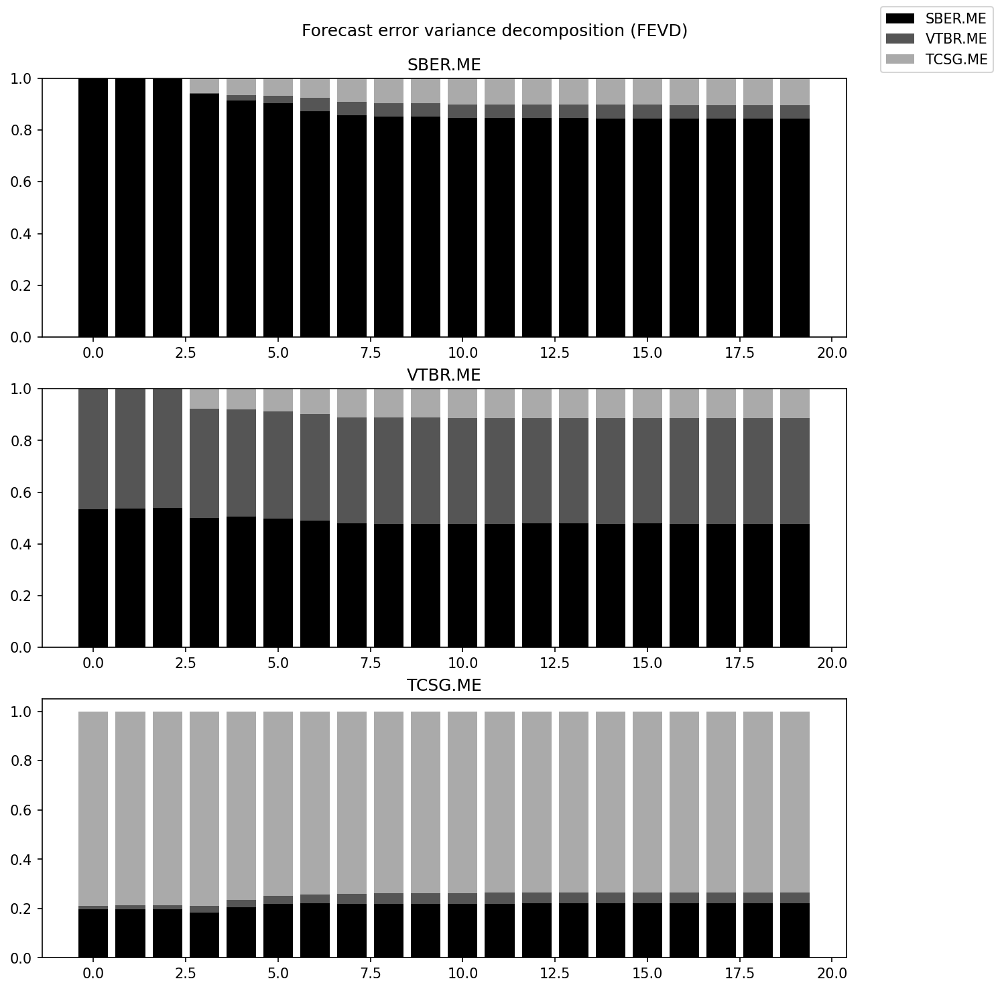


📌 Showing: rus_fin_IRF.png


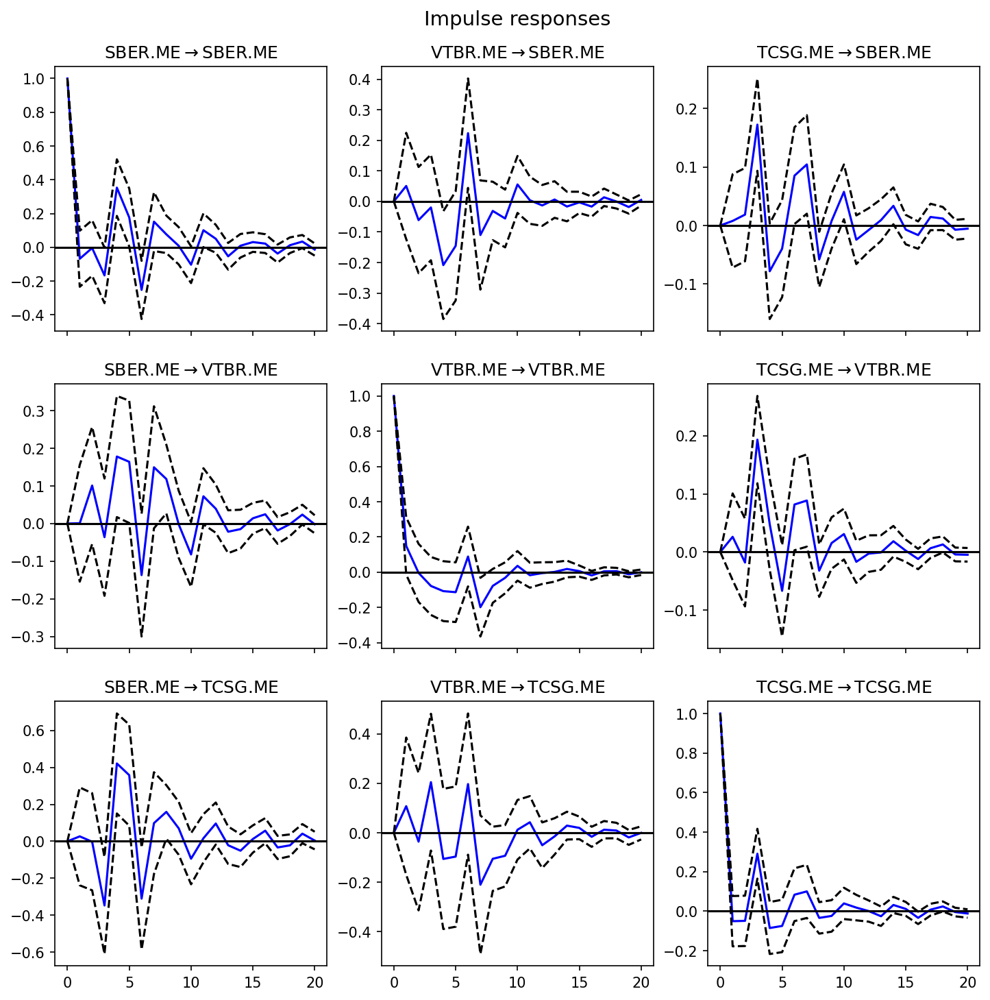


📌 Showing: rus_fin_resid_SBER.ME_hist_acf.png


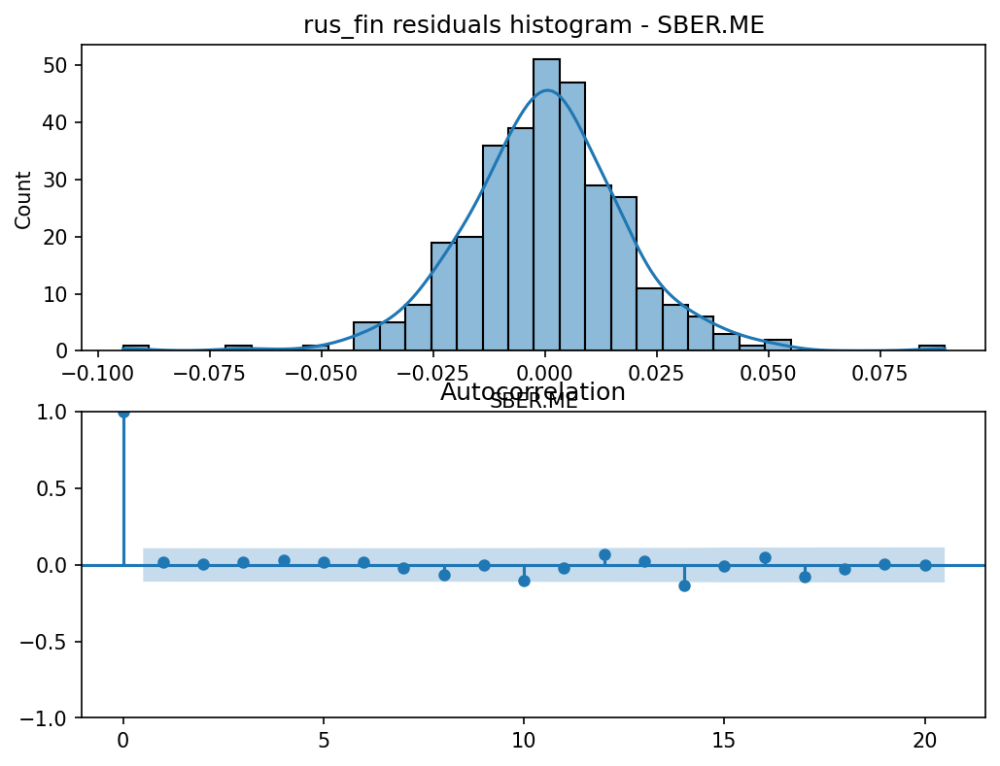


📌 Showing: rus_fin_resid_TCSG.ME_hist_acf.png


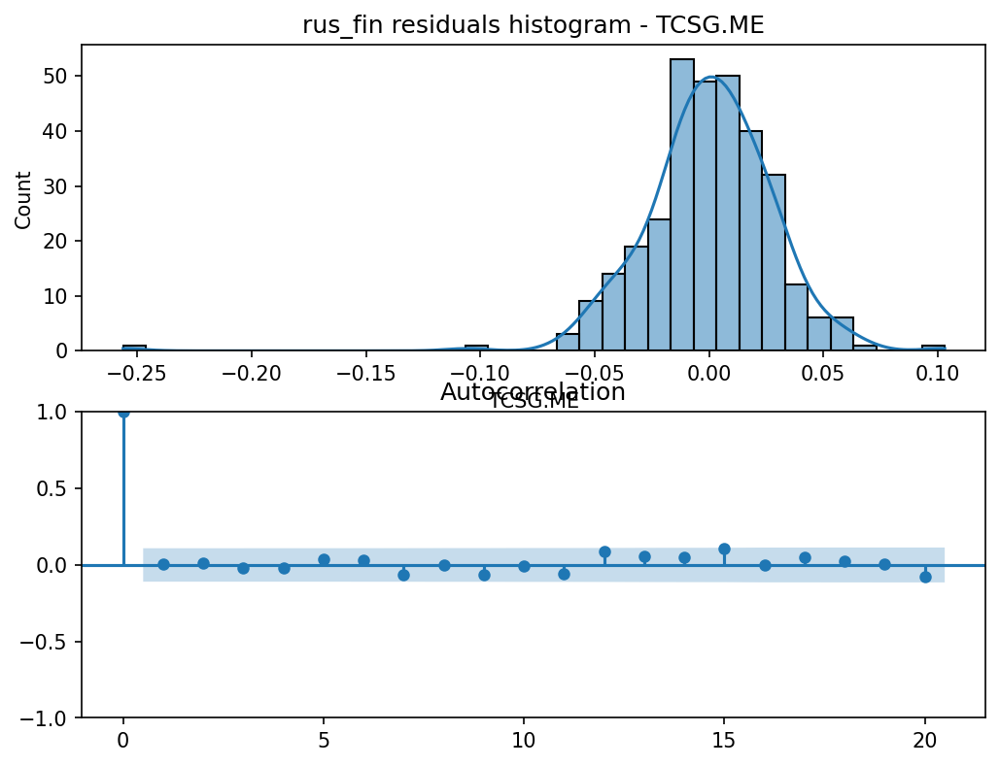


📌 Showing: rus_fin_resid_VTBR.ME_hist_acf.png


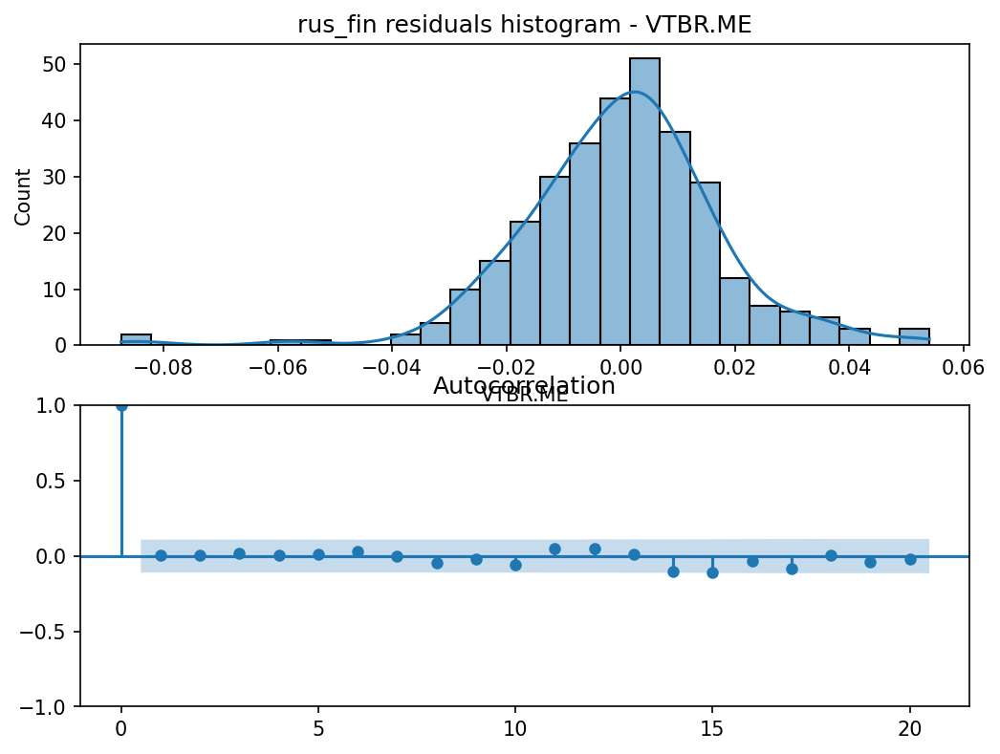


📌 Showing: rus_met_FEVD.png


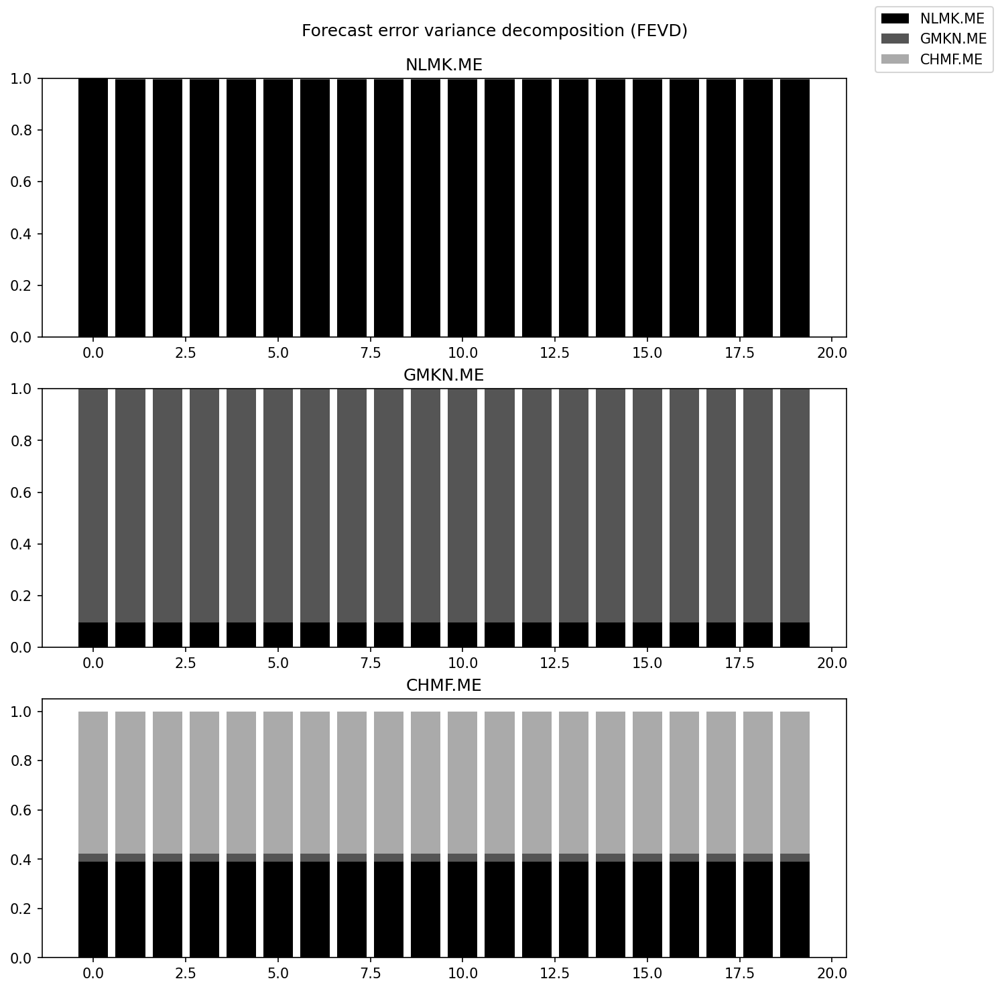


📌 Showing: rus_met_IRF.png


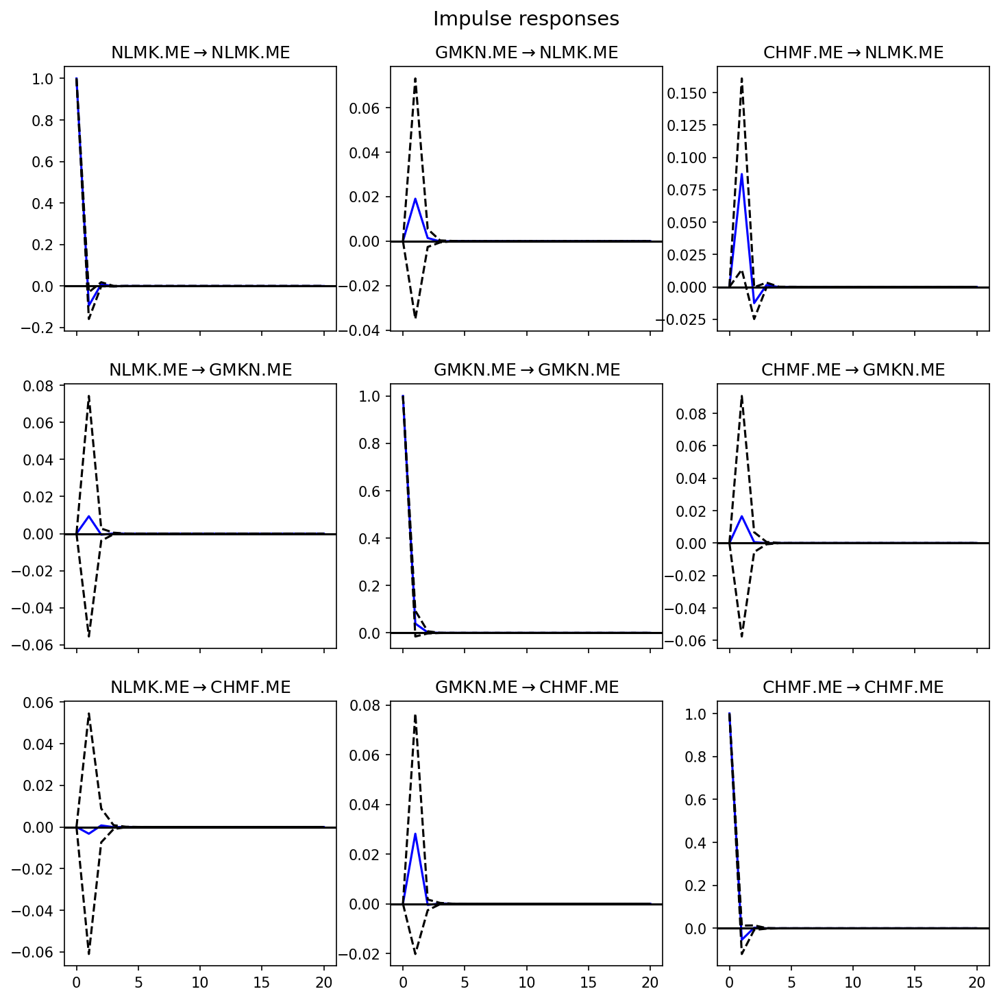


📌 Showing: rus_met_resid_CHMF.ME_hist_acf.png


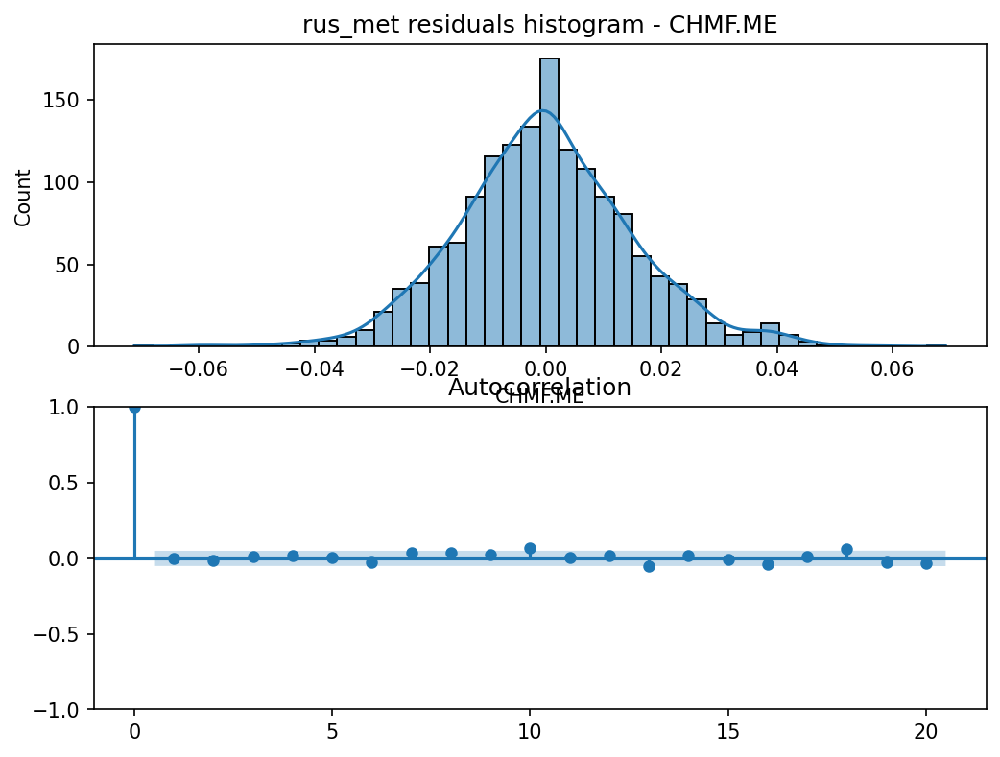


📌 Showing: rus_met_resid_GMKN.ME_hist_acf.png


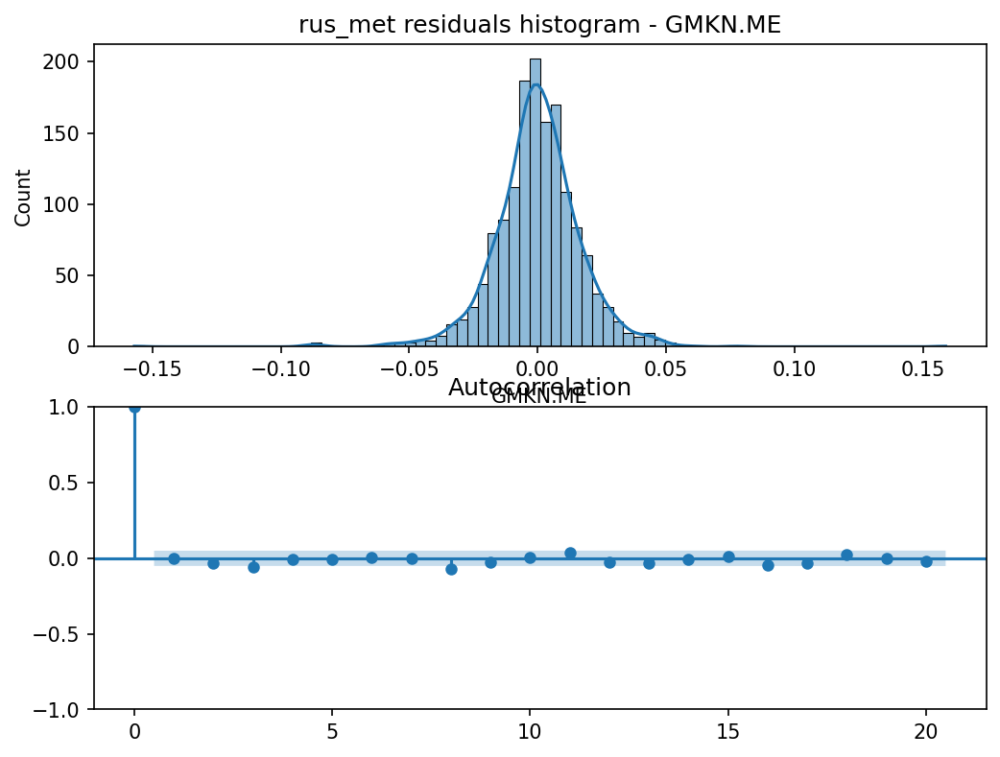


📌 Showing: rus_met_resid_NLMK.ME_hist_acf.png


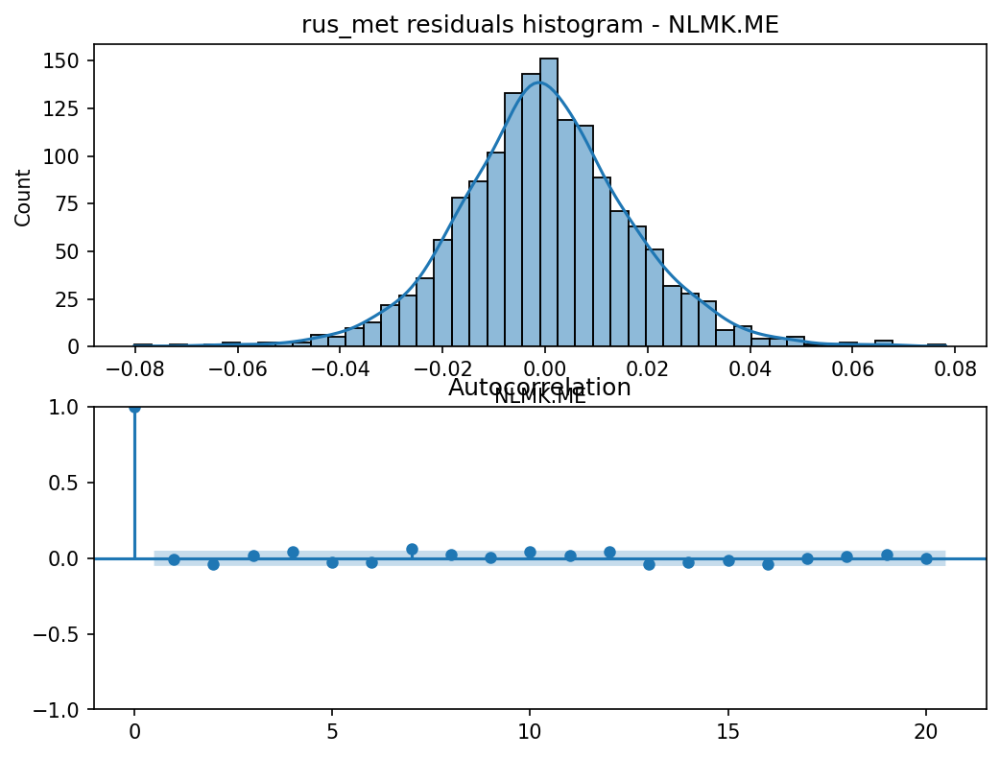


📌 Showing: rus_oil_FEVD.png


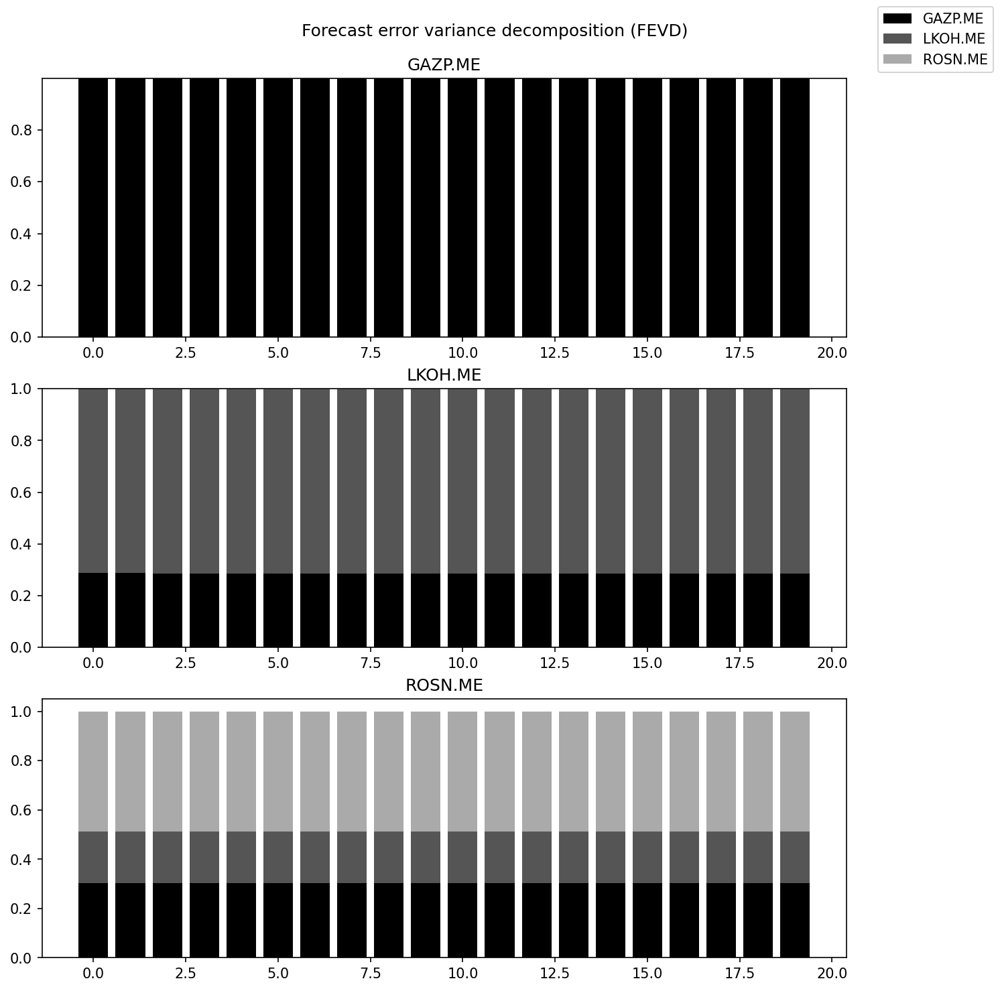


📌 Showing: rus_oil_IRF.png


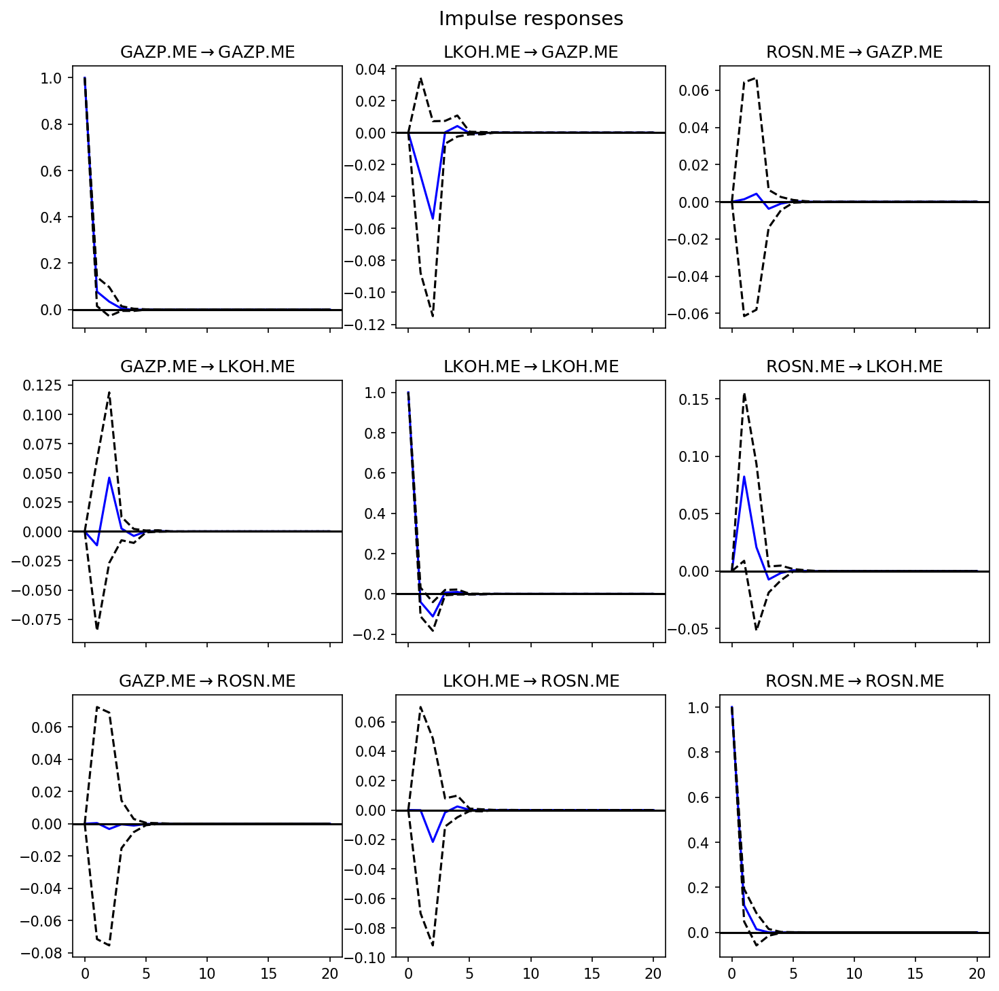


📌 Showing: rus_oil_resid_GAZP.ME_hist_acf.png


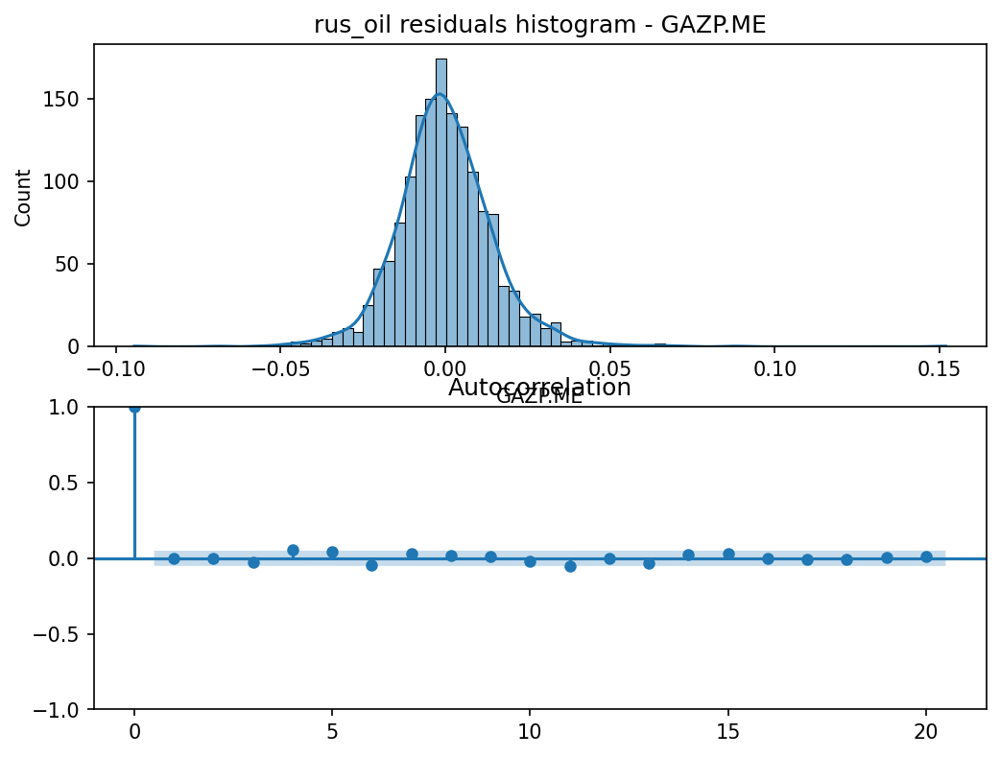


📌 Showing: rus_oil_resid_LKOH.ME_hist_acf.png


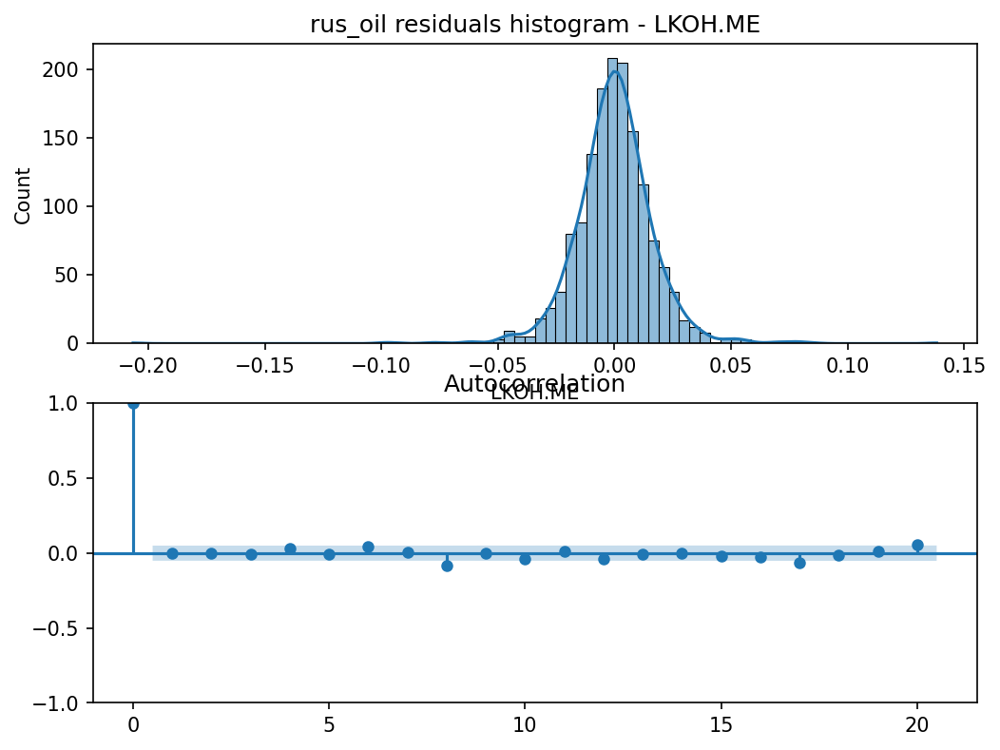


📌 Showing: rus_oil_resid_ROSN.ME_hist_acf.png


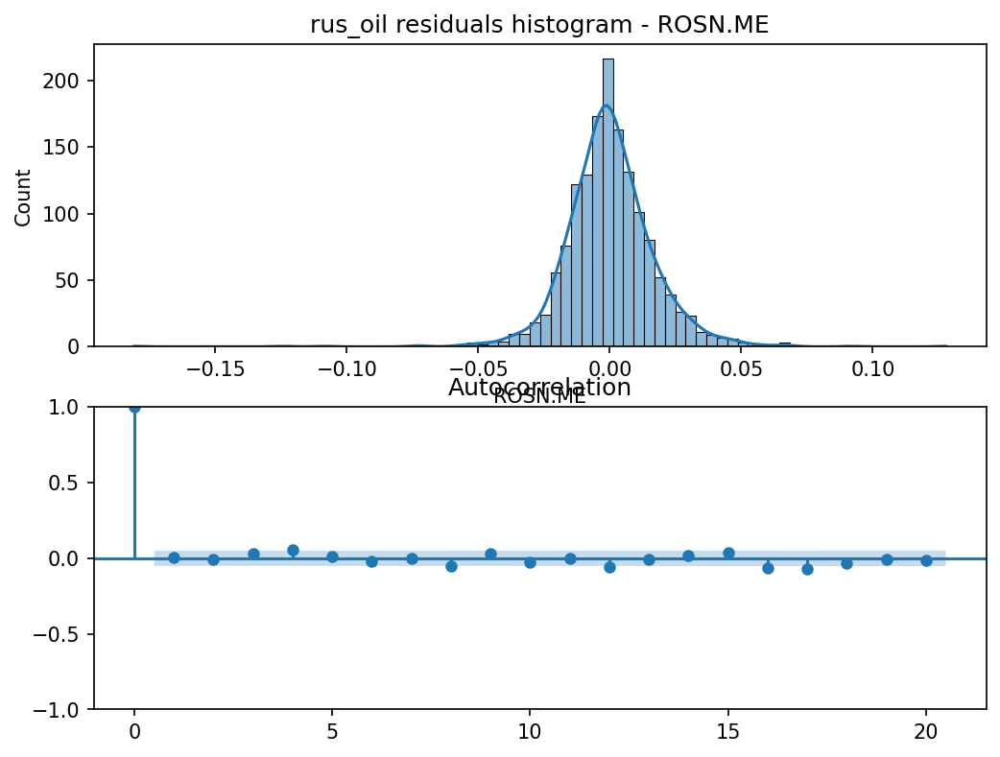


📌 Showing: us_energy_FEVD.png


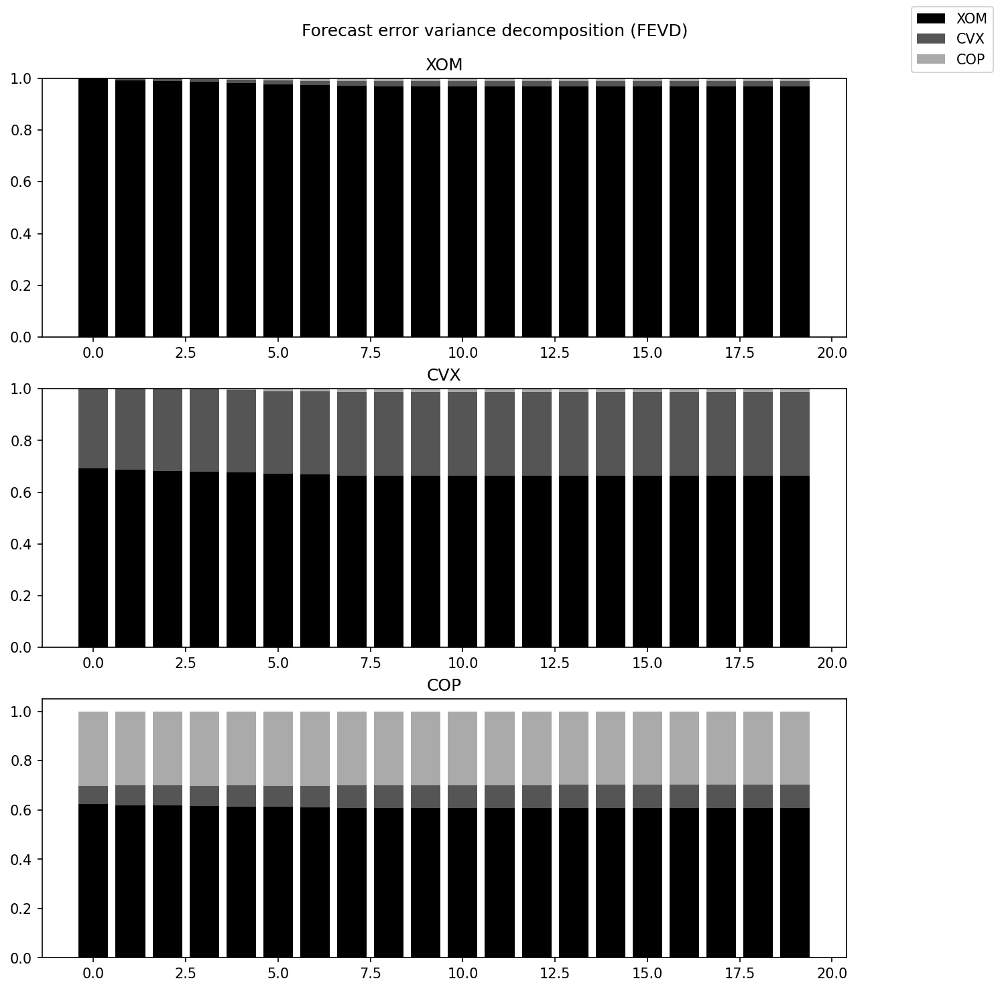


📌 Showing: us_energy_IRF.png


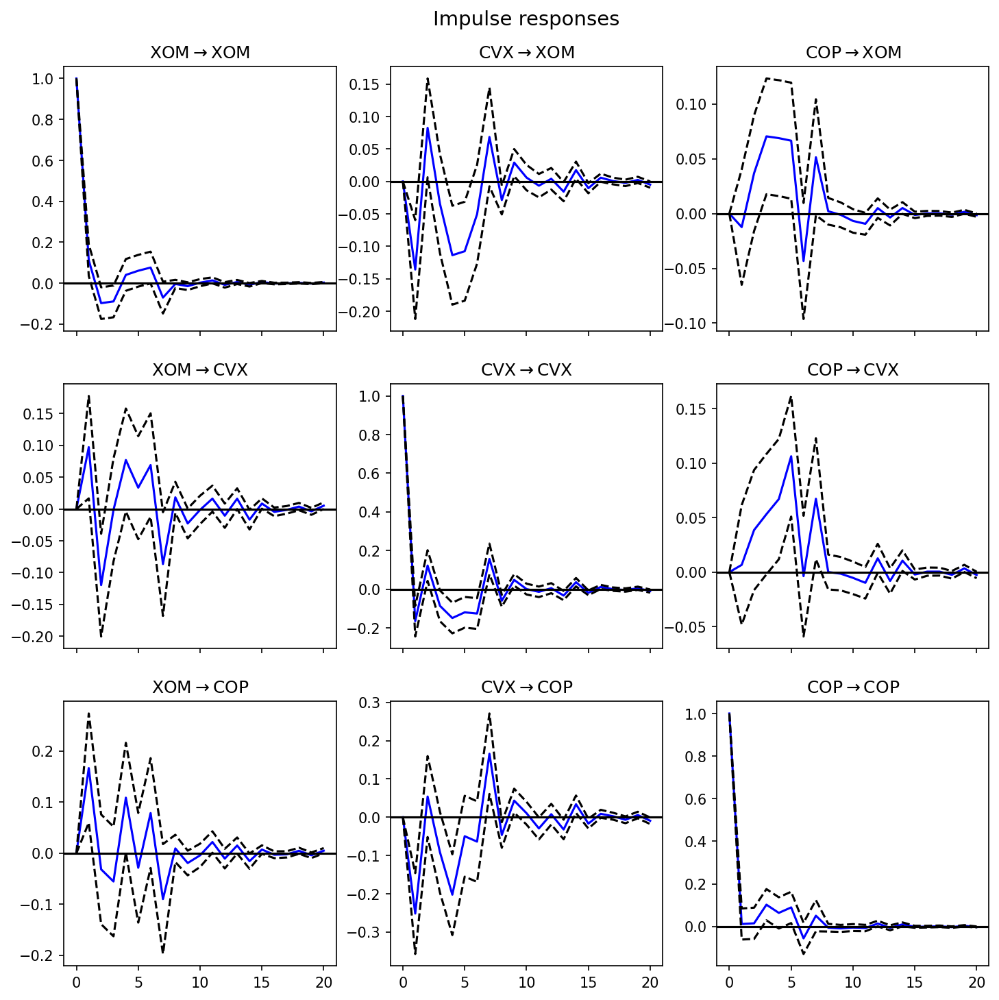


📌 Showing: us_energy_resid_COP_hist_acf.png


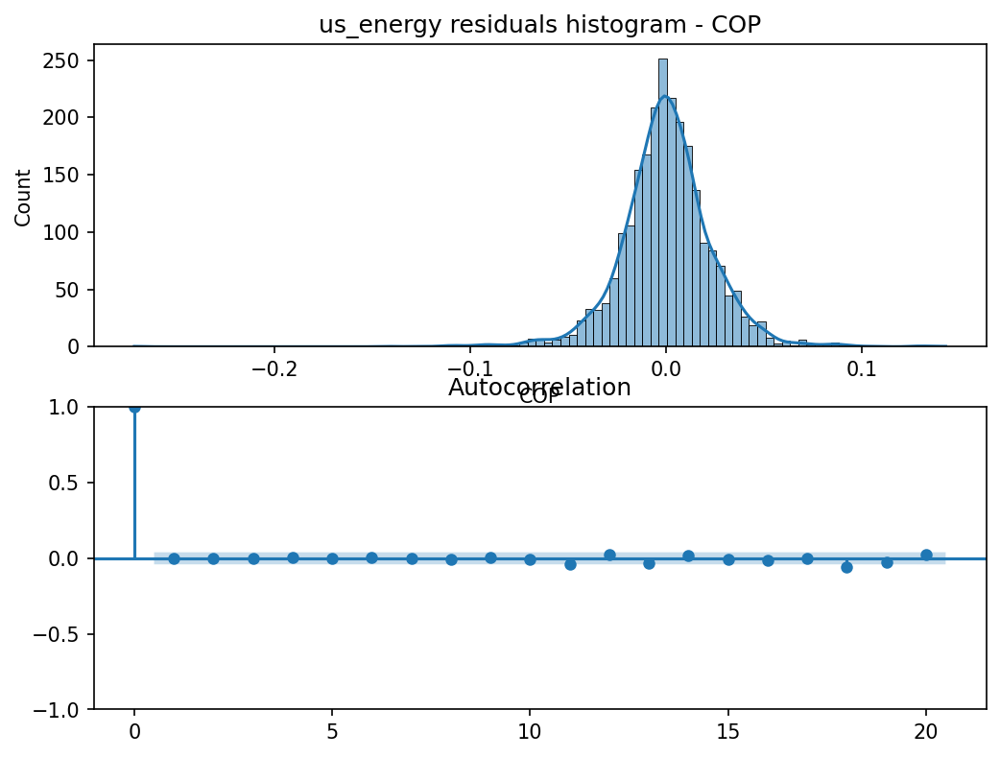


📌 Showing: us_energy_resid_CVX_hist_acf.png


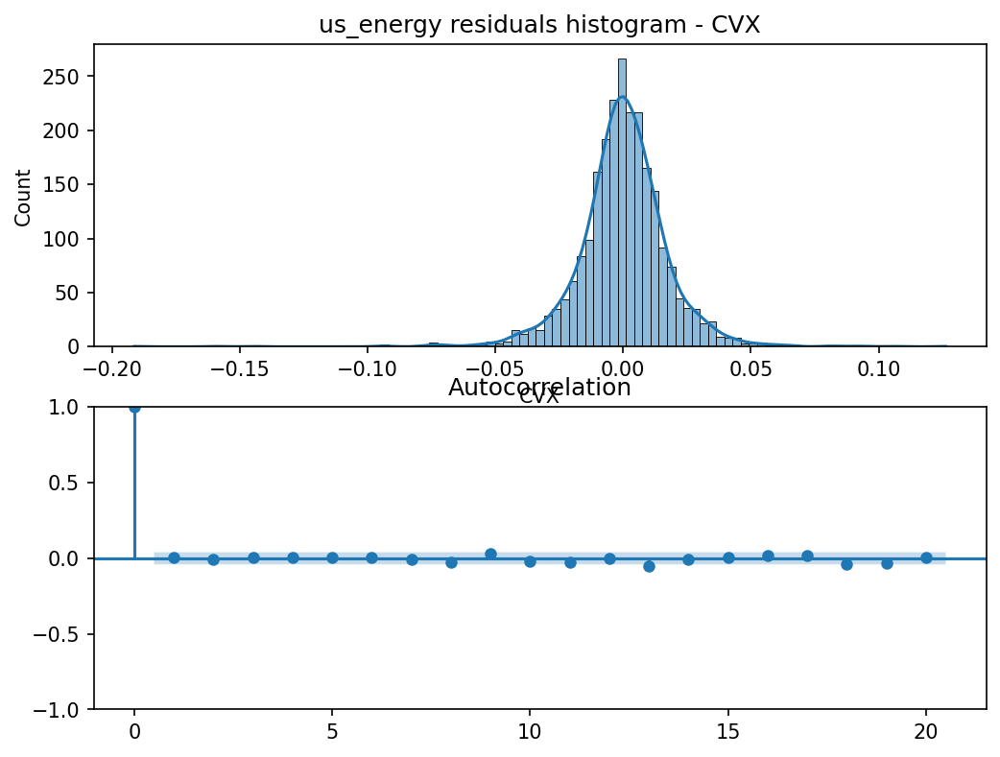


📌 Showing: us_energy_resid_XOM_hist_acf.png


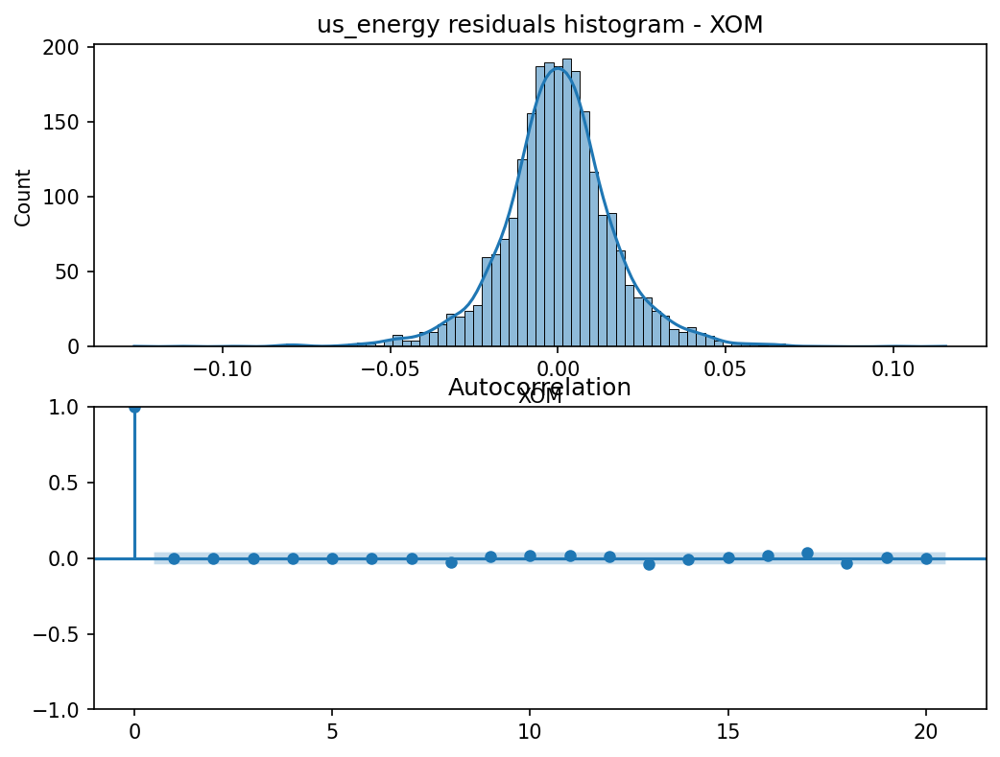


📌 Showing: us_retail_FEVD.png


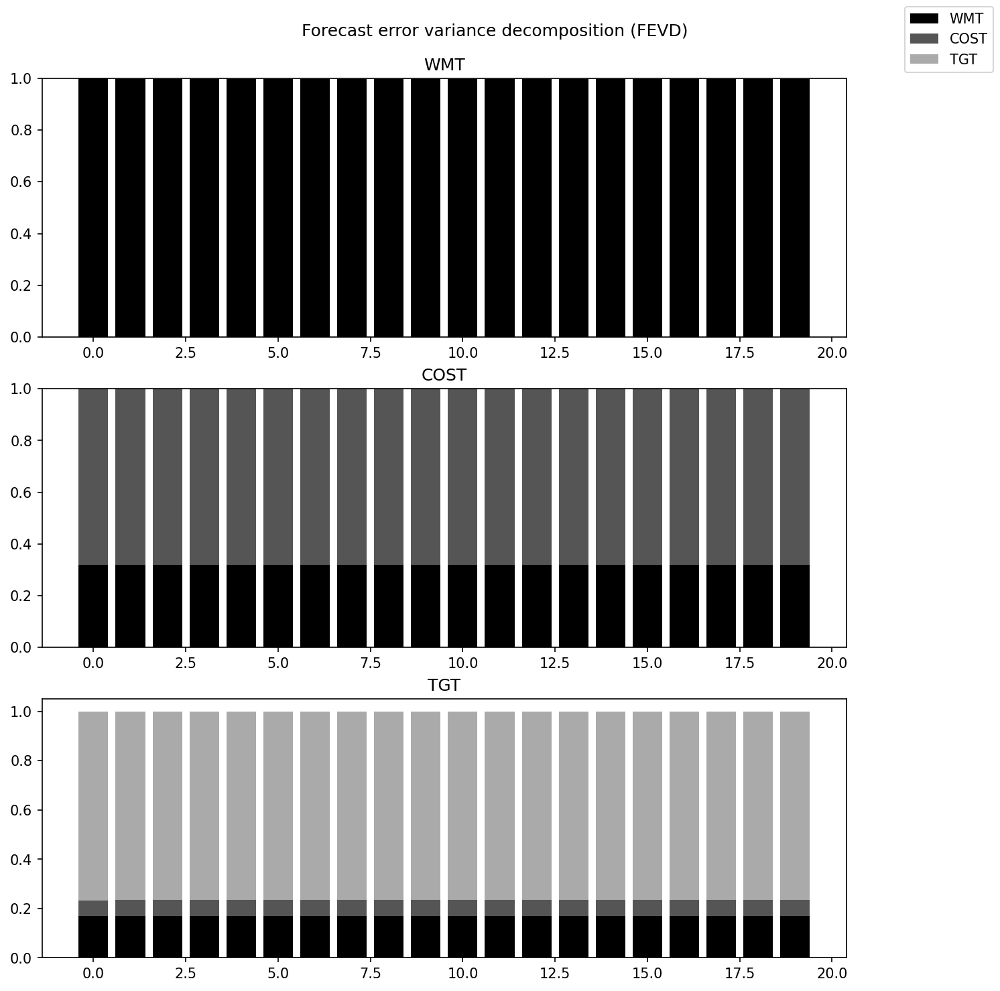


📌 Showing: us_retail_IRF.png


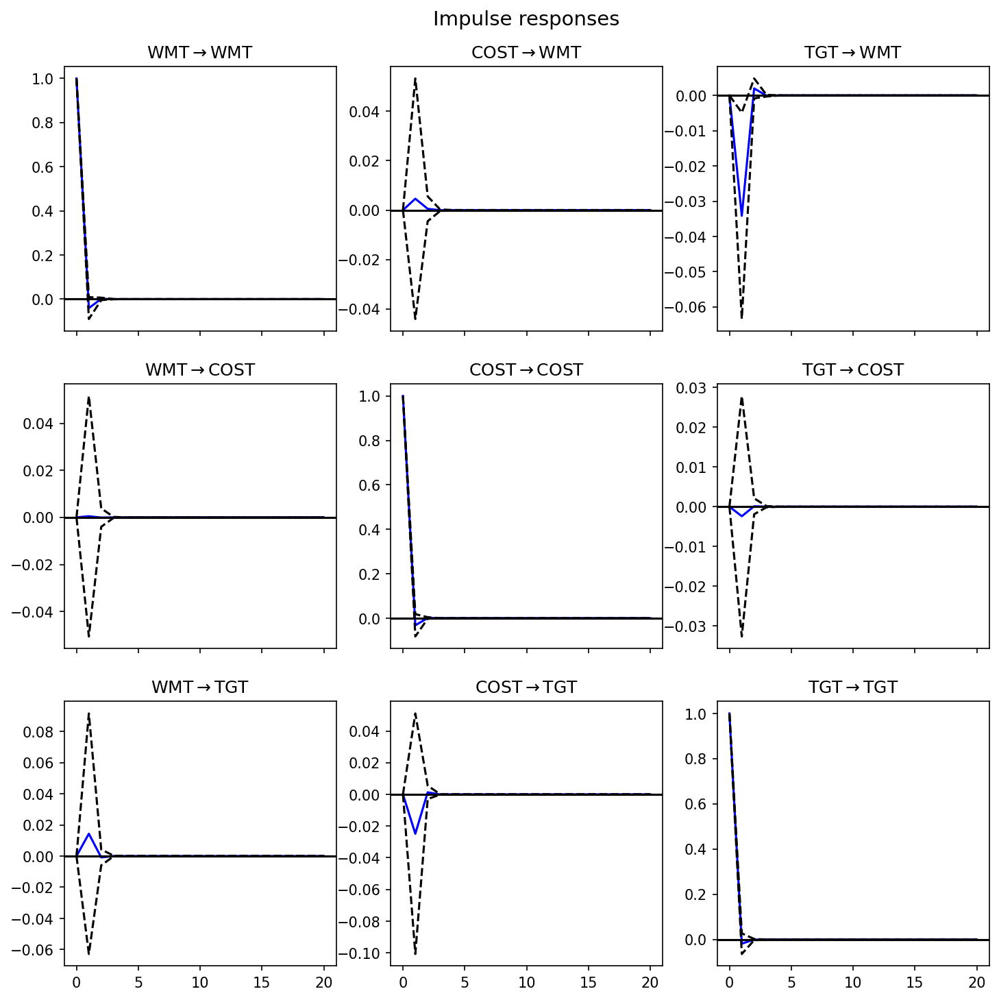


📌 Showing: us_retail_resid_COST_hist_acf.png


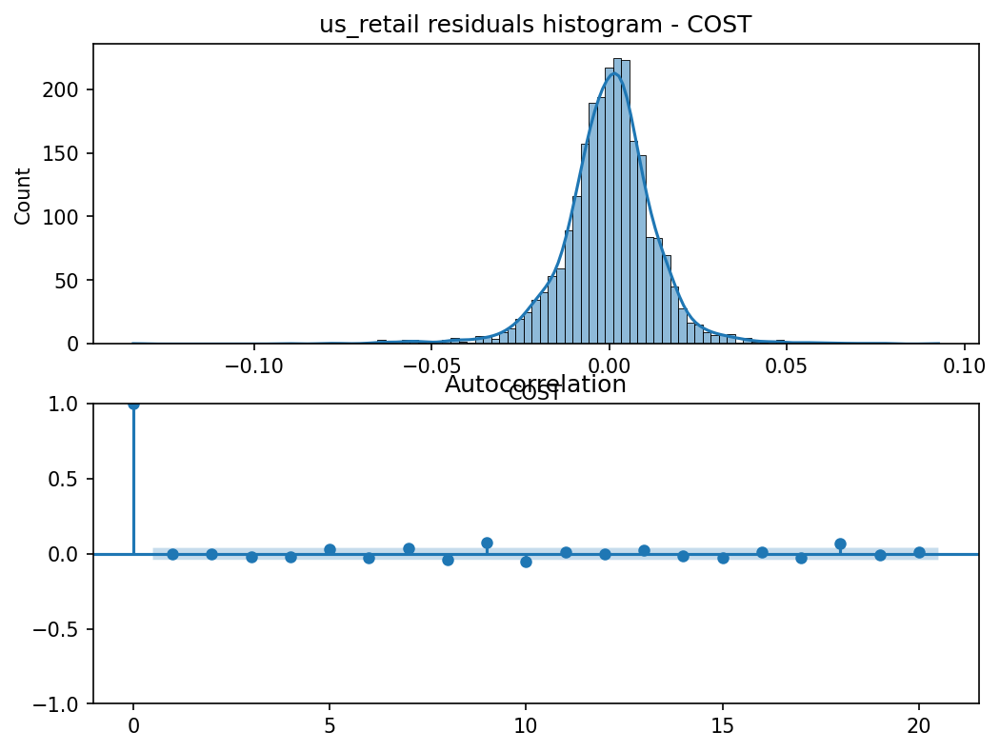


📌 Showing: us_retail_resid_TGT_hist_acf.png


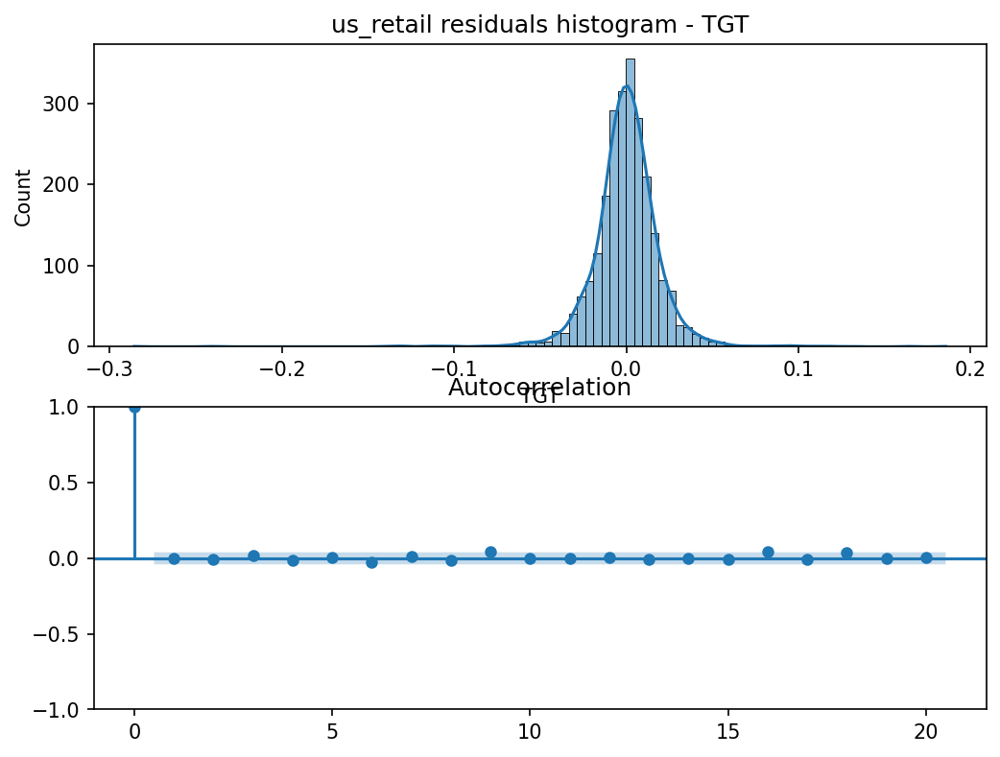


📌 Showing: us_retail_resid_WMT_hist_acf.png


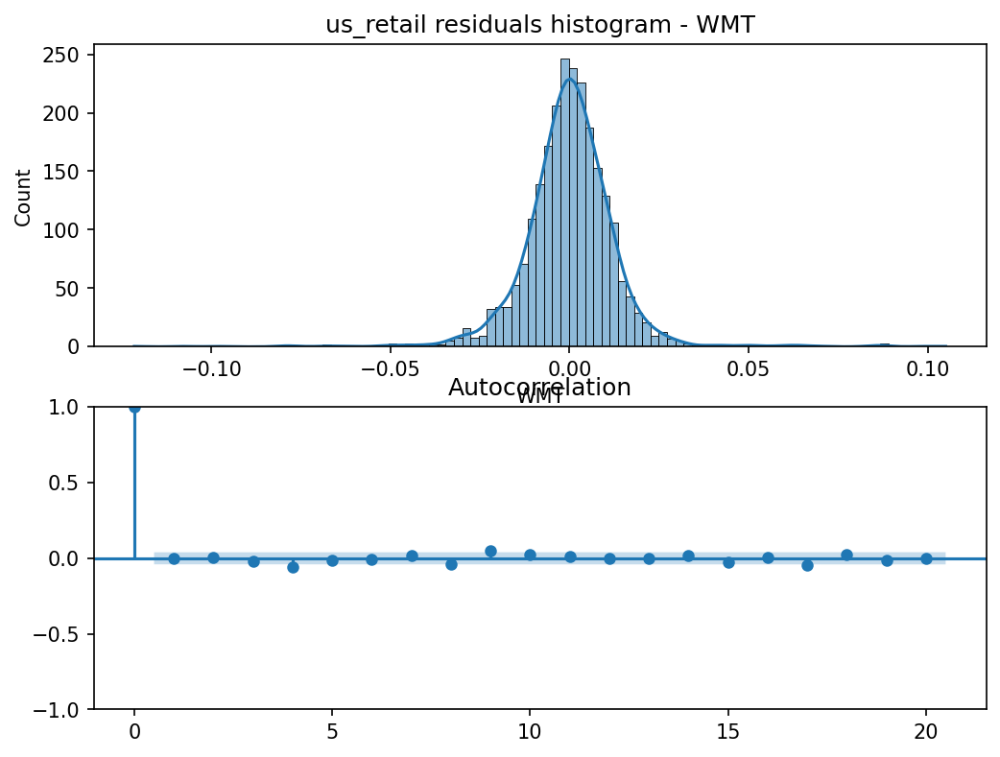


📌 Showing: us_tech_FEVD.png


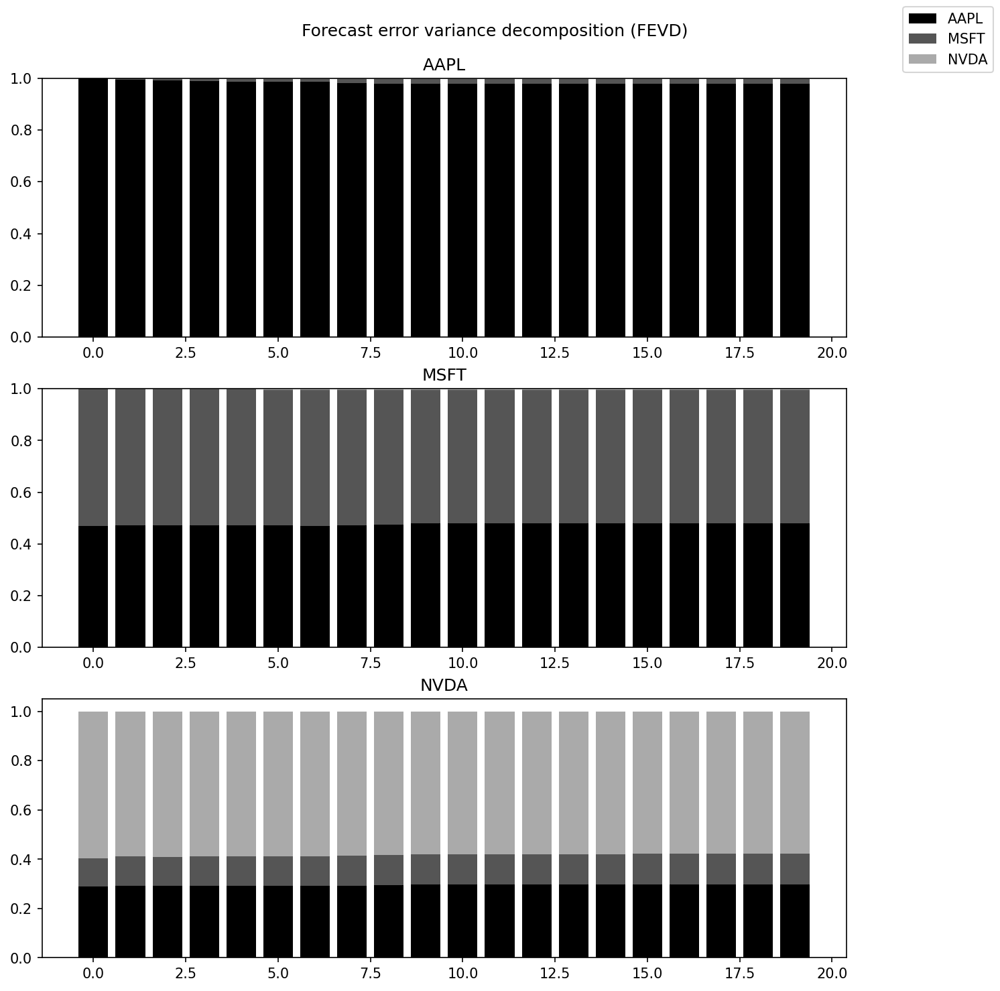


📌 Showing: us_tech_IRF.png


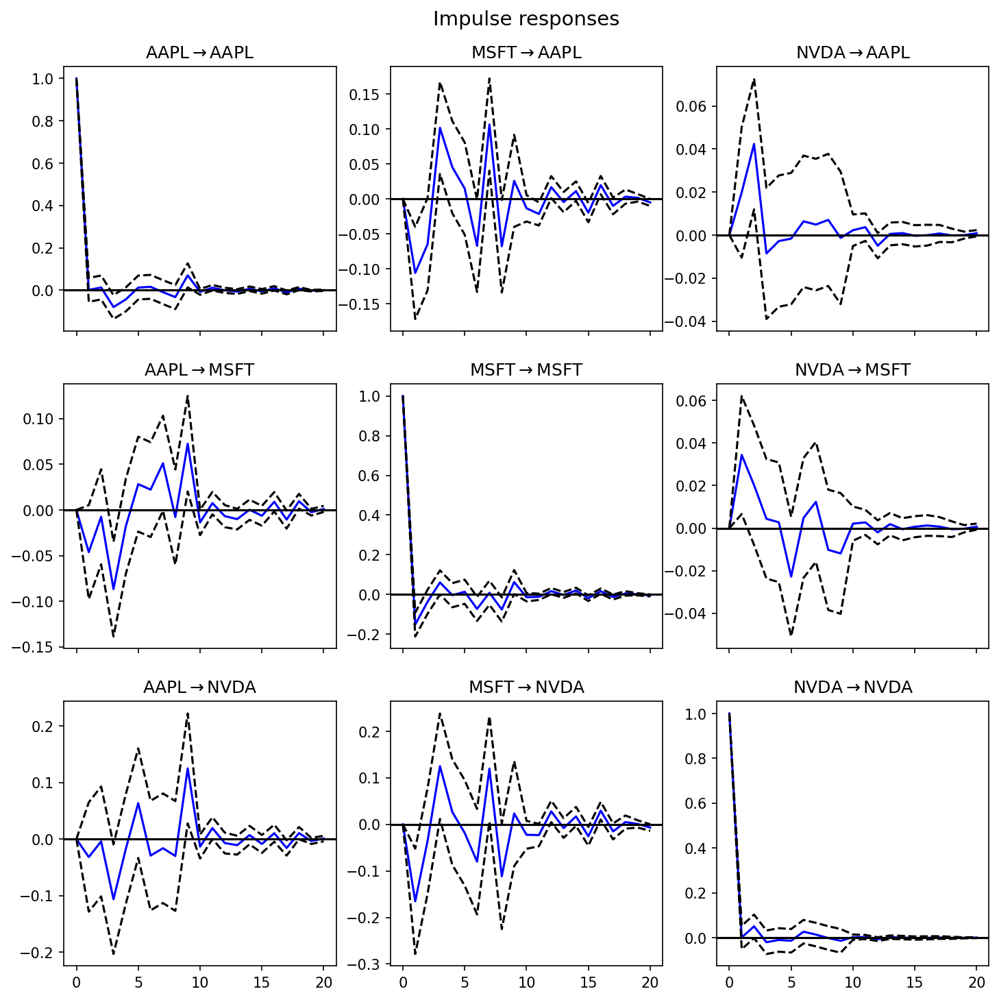


📌 Showing: us_tech_resid_AAPL_hist_acf.png


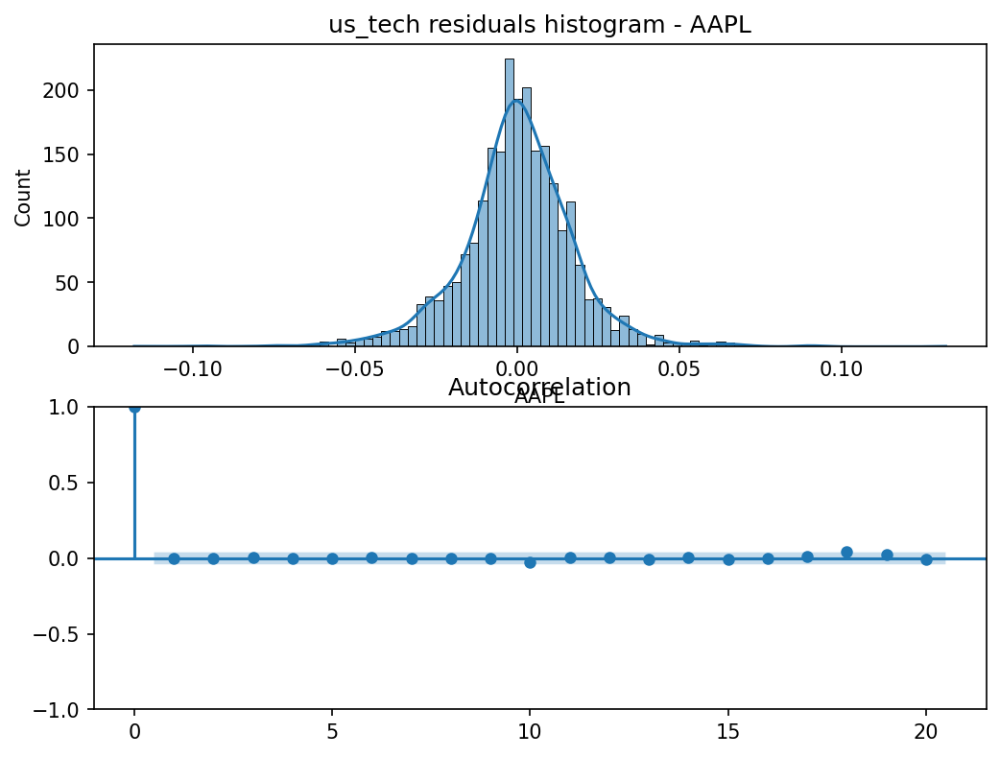


📌 Showing: us_tech_resid_MSFT_hist_acf.png


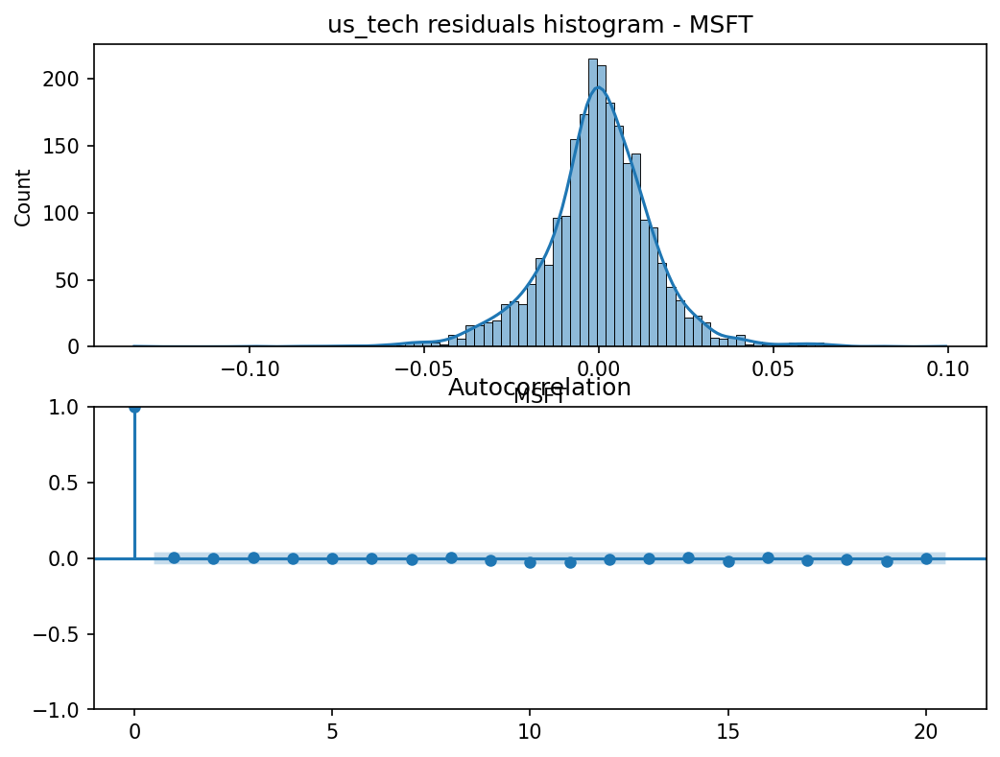


📌 Showing: us_tech_resid_NVDA_hist_acf.png


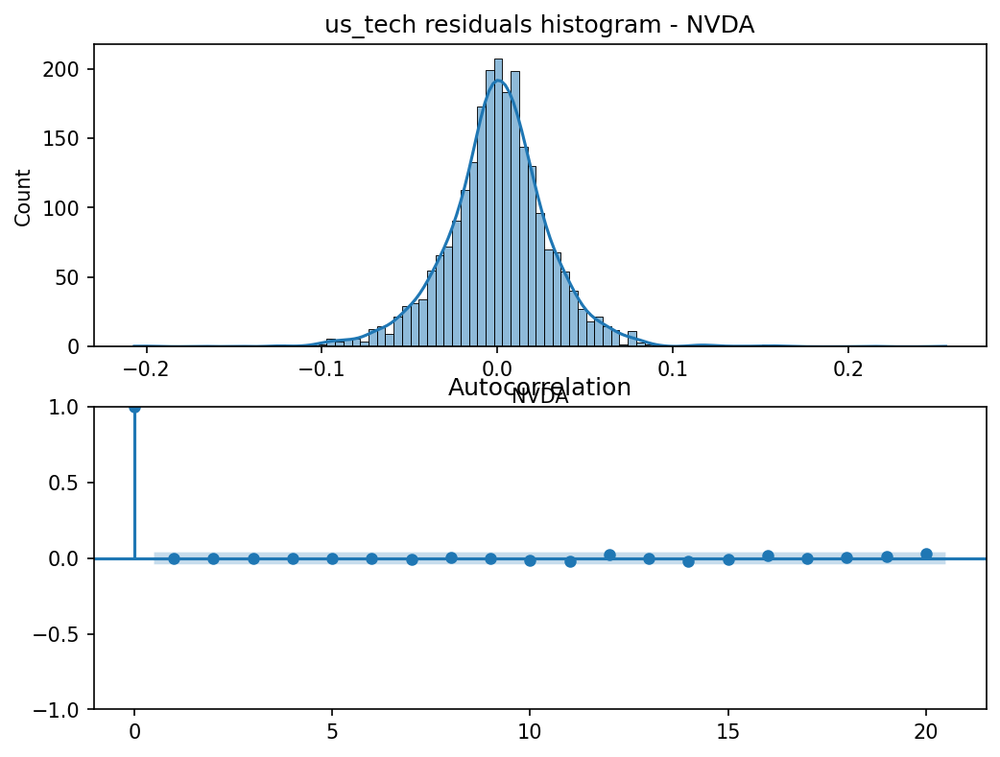

In [36]:
from IPython.display import Image, display

RESULTS_DIR = "VAR_results"

def show_pngs(dir):
    print("\n===== PNG визуализации =====\n")
    for file in sorted(os.listdir(dir)):
        if file.lower().endswith(".png"):
            path = os.path.join(dir, file)
            print(f"\n📌 Showing: {file}")
            display(Image(filename=path))

def show_csvs(dir, n_rows=10):
    print("\n===== CSV таблицы =====\n")
    for file in sorted(os.listdir(dir)):
        if file.lower().endswith(".csv"):
            path = os.path.join(dir, file)
            print(f"\n📄 CSV: {file}")
            try:
                df = pd.read_csv(path)
                display(df.head(n_rows))
            except Exception as e:
                print("⚠ Error reading CSV:", e)

def show_txts(dir):
    print("\n===== TXT summary =====\n")
    for file in sorted(os.listdir(dir)):
        if file.lower().endswith(".txt"):
            path = os.path.join(dir, file)
            print(f"\n📜 TXT: {file}")
            try:
                with open(path, "r", encoding="utf-8") as f:
                    print(f.read()[:2000])  # первые 2000 символов
            except Exception as e:
                print("⚠ Error reading TXT:", e)

print("Просмотр PNG/CSV/TXT из директории VAR_results")
show_csvs(RESULTS_DIR)
show_txts(RESULTS_DIR)
show_pngs(RESULTS_DIR)

### Проверим тест Йохансена на проверку коинтегрирующих векторов

In [37]:
# johansen_per_sector.py
import os
import pandas as pd
import numpy as np
from statsmodels.tsa.vector_ar.vecm import coint_johansen

SECTORS = {
    "rus_fin": "rus_fin_prices.csv",
    "rus_oil": "rus_oil_prices.csv",
    "rus_met": "rus_met_prices.csv",
    "us_tech": "us_tech_prices.csv",
    "us_retail": "us_retail_prices.csv",
    "us_energy": "us_energy_prices.csv"
}
OUT = "VECM_results"
os.makedirs(OUT, exist_ok=True)

def johansen_test_df(df, det_order=0, k_ar_diff=1):
    # df must be levels, no NaN
    res = coint_johansen(df, det_order, k_ar_diff)
    # trace statistics res.lr1, critical values res.cvt
    trace = res.lr1
    cvt = res.cvt  # rows ~ ranks, cols 90/95/99
    return res, trace, cvt

summary_rows = []
for name, path in SECTORS.items():
    try:
        df = pd.read_csv(path, index_col=0, parse_dates=True)
        df = df.dropna(how='any')
        print(f"\n{name}: shape {df.shape}")
        # choose k_ar_diff = lag used in VECM = (lag selected for VAR on returns)
        # safe default:
        k_ar_diff = 1
        res, trace, cvt = johansen_test_df(df, det_order=0, k_ar_diff=k_ar_diff)
        # determine rank by comparing trace with 95% critical values
        rank = 0
        for i, tr in enumerate(trace):
            crit95 = cvt[i,1]  # 95% (index 1)
            if tr > crit95:
                rank = i+1
        # save summary
        summary_rows.append({"sector": name, "n_obs": df.shape[0], "n_vars": df.shape[1], "coint_rank": rank})
        # write detailed output
        with open(os.path.join(OUT, f"{name}_johansen.txt"), "w", encoding="utf-8") as f:
            f.write("Trace stats:\n")
            for i, t in enumerate(trace):
                f.write(f"r <= {i} : trace_stat = {t:.4f}, crit90={cvt[i,0]}, crit95={cvt[i,1]}, crit99={cvt[i,2]}\n")
            f.write("\nEigenvectors (res.evec):\n")
            f.write(str(res.evec))
        print(f"{name} -> estimated coint_rank = {rank}")
    except Exception as e:
        print("Failed", name, e)

pd.DataFrame(summary_rows).to_csv(os.path.join(OUT, "johansen_summary.csv"), index=False)
print("\nSaved johansen_summary.csv")


rus_fin: shape (626, 3)
rus_fin -> estimated coint_rank = 0

rus_oil: shape (1616, 3)
rus_oil -> estimated coint_rank = 0

rus_met: shape (1616, 3)


rus_met -> estimated coint_rank = 0

us_tech: shape (2514, 3)
us_tech -> estimated coint_rank = 1

us_retail: shape (2514, 3)
us_retail -> estimated coint_rank = 0

us_energy: shape (2514, 3)
us_energy -> estimated coint_rank = 0

Saved johansen_summary.csv


### Построим VECM

In [38]:
# build_vecm_for_ranked.py
import os
import pandas as pd
import numpy as np
from statsmodels.tsa.vector_ar.vecm import VECM
from datetime import datetime

IN_DIR = "VECM_results"
os.makedirs(IN_DIR, exist_ok=True)

johansen_summary = pd.read_csv(os.path.join(IN_DIR, "johansen_summary.csv"))
for row in johansen_summary.itertuples(index=False):
    name = row.sector
    rank = int(row.coint_rank)
    if rank <= 0:
        print(f"{name}: no cointegration (rank={rank}), skipping VECM.")
        continue
    # load data
    df = pd.read_csv(f"{name}_prices.csv", index_col=0, parse_dates=True)
    df = df.dropna(how='any')
    print(f"Building VECM for {name}, shape {df.shape}, rank {rank}")

    # choose lag differences (k_ar_diff) — can be tuned; use 1 as default
    k_ar_diff = 1
    try:
        vecm = VECM(df, k_ar_diff=k_ar_diff, coint_rank=rank, deterministic='ci')
        vecm_res = vecm.fit()
        # save summary
        with open(os.path.join(IN_DIR, f"{name}_VECM_summary.txt"), "w", encoding="utf-8") as f:
            try:
                f.write(str(vecm_res.summary()))
            except:
                f.write("VECM fitted. Summary not printable.\n")
        # save alpha and beta
        pd.DataFrame(vecm_res.alpha, index=df.columns).to_csv(os.path.join(IN_DIR, f"{name}_vecm_alpha.csv"))
        pd.DataFrame(vecm_res.beta, index=df.columns).to_csv(os.path.join(IN_DIR, f"{name}_vecm_beta.csv"))
        print(f"Saved VECM results for {name}")

        # Forecasting: steps 10/20/100
        steps_list = [10,20,100]
        for steps in steps_list:
            fc = vecm_res.predict(steps=steps)
            start = df.index[-1] + pd.Timedelta(days=1)
            idx = pd.date_range(start=start, periods=h, freq='B')
            fc_df = pd.DataFrame(fc, index=idx, columns=df.columns)
            fc_df.to_csv(os.path.join(IN_DIR, f"{name}_vecm_forecast_h{steps}.csv"))
    except Exception as e:
        print(f"VECM fit failed for {name}: {e}")

rus_fin: no cointegration (rank=0), skipping VECM.
rus_oil: no cointegration (rank=0), skipping VECM.
rus_met: no cointegration (rank=0), skipping VECM.
Building VECM for us_tech, shape (2514, 3), rank 1


Saved VECM results for us_tech
VECM fit failed for us_tech: Shape of passed values is (10, 3), indices imply (100, 3)
us_retail: no cointegration (rank=0), skipping VECM.
us_energy: no cointegration (rank=0), skipping VECM.


In [39]:
show_csvs(dir='VECM_results')
show_txts(dir='VECM_results')


===== CSV таблицы =====


📄 CSV: johansen_summary.csv


,sector,n_obs,n_vars,coint_rank
0,rus_fin,626,3,0
1,rus_oil,1616,3,0
2,rus_met,1616,3,0
3,us_tech,2514,3,1
4,us_retail,2514,3,0
5,us_energy,2514,3,0



📄 CSV: us_tech_vecm_alpha.csv


,Unnamed: 0,0
0,AAPL,-0.014304
1,MSFT,-0.013418
2,NVDA,-0.011221



📄 CSV: us_tech_vecm_beta.csv


,Unnamed: 0,0
0,AAPL,1.000000
1,MSFT,-0.605214
2,NVDA,0.159978



===== TXT summary =====


📜 TXT: rus_fin_johansen.txt
Trace stats:
r <= 0 : trace_stat = 20.5218, crit90=27.0669, crit95=29.7961, crit99=35.4628
r <= 1 : trace_stat = 3.9606, crit90=13.4294, crit95=15.4943, crit99=19.9349
r <= 2 : trace_stat = 1.9101, crit90=2.7055, crit95=3.8415, crit99=6.6349

Eigenvectors (res.evec):
[[ 3.18679748e-02 -2.96416098e-03 -1.09273064e-02]
 [-2.22903588e-03  2.58130983e-03 -3.37488058e-03]
 [-1.14552177e-03 -4.38971114e-05 -2.92686747e-04]]

📜 TXT: rus_met_johansen.txt
Trace stats:
r <= 0 : trace_stat = 20.1479, crit90=27.0669, crit95=29.7961, crit99=35.4628
r <= 1 : trace_stat = 8.1063, crit90=13.4294, crit95=15.4943, crit99=19.9349
r <= 2 : trace_stat = 1.4505, crit90=2.7055, crit95=3.8415, crit99=6.6349

Eigenvectors (res.evec):
[[ 9.64932376e-02  5.42679164e-02 -2.24327732e-02]
 [ 8.70301883e-05 -3.53601350e-04  1.06998467e-04]
 [-1.68966780e-02 -2.59815708e-03  4.85229896e-03]]

📜 TXT: rus_oil_johansen.txt
Trace stats:
r <= 0 : trace_stat = 20.8228,

### Подгон VARMAX с экзогенными переменными

In [40]:
# varmax_example.py
import yfinance as yf
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.varmax import VARMAX
import os

# пример для rus_fin
sector_file = "rus_fin_prices.csv"
df_prices = pd.read_csv(sector_file, index_col=0, parse_dates=True).dropna(how='any')

# скачиваем экзогены
exogs = yf.download(["IMOEX.ME", "BRN-USD"], start=df_prices.index[0].strftime("%Y-%m-%d"), end=df_prices.index[-1].strftime("%Y-%m-%d"), progress=False, threads=False)
# Если названия не совпали, подбирай нужные тикеры. В примере может потребоваться заменить ticker на корректный.
# Преобразуем в лог-доходности (exog)
exog_prices = exogs['Adj Close'] if 'Adj Close' in exogs else exogs['Close']
exog_prices = exog_prices.dropna(how='all')
exog_returns = np.log(exog_prices).diff().reindex(df_prices.index).dropna(how='any')

# целевая переменная — лог-доходности сектора
df_returns = np.log(df_prices).diff().dropna(how='any')

# приведём экзогены и endog к одному индексу
common_idx = df_returns.index.intersection(exog_returns.index)
endog = df_returns.loc[common_idx]
exog = exog_returns.loc[common_idx]

# модель VARMAX(p,q) — начинаем с (1,1)
mod = VARMAX(endog, exog=exog, order=(1,1))
res = mod.fit(maxiter=200, disp=False)
print(res.summary())

# Forecast (пример 20)
fc = res.get_forecast(steps=20, exog=exog.iloc[-1:].values.repeat(20, axis=0))
pred = fc.predicted_mean
pred.to_csv(os.path.join("VARMAX_results", "rus_fin_varmax_forecast_h20.csv"))

                                   Statespace Model Results                                  
Dep. Variable:     ['SBER.ME', 'VTBR.ME', 'TCSG.ME']   No. Observations:                   93
Model:                                   VARMAX(1,1)   Log Likelihood                 836.162
                                         + intercept   AIC                          -1606.324
Date:                               Sun, 23 Nov 2025   BIC                          -1522.748
Time:                                       21:08:34   HQIC                         -1572.579
Sample:                                            0                                         
                                                - 93                                         
Covariance Type:                                 opg                                         
Ljung-Box (L1) (Q):       0.00, 0.01, 0.00   Jarque-Bera (JB):     0.35, 1.19, 1.48
Prob(Q):                  0.99, 0.92, 0.99   Prob(JB):             0.8

### Сравнение моделей

Возьмем скользяющую ошибку RMSE


Sector: rus_fin
Total rolling steps: 178 (from pos 249 to 426)
Chosen lag from initial selection: 7


Rolling rus_fin: 100%|██████████| 178/178 [00:01<00:00, 139.18it/s]


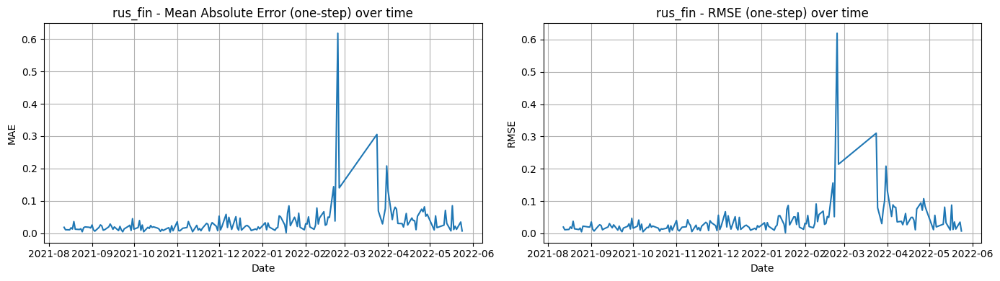


Sector: rus_oil
Total rolling steps: 200 (from pos 1414 to 1613)
Chosen lag from initial selection: 1


Rolling rus_oil: 100%|██████████| 200/200 [00:01<00:00, 153.86it/s]


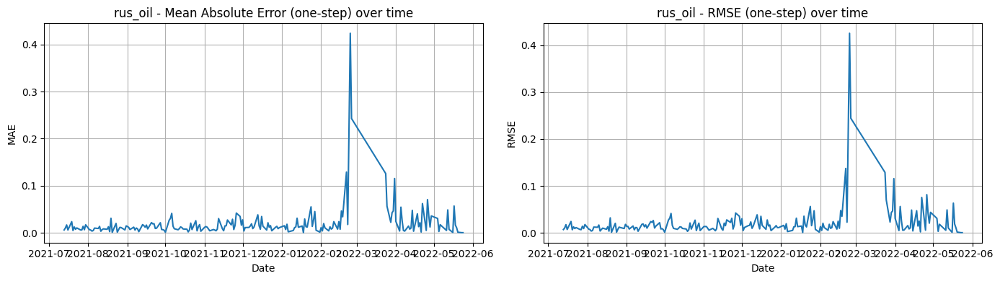


Sector: rus_met
Total rolling steps: 200 (from pos 1414 to 1613)
Chosen lag from initial selection: 1


Rolling rus_met: 100%|██████████| 200/200 [00:02<00:00, 97.75it/s] 


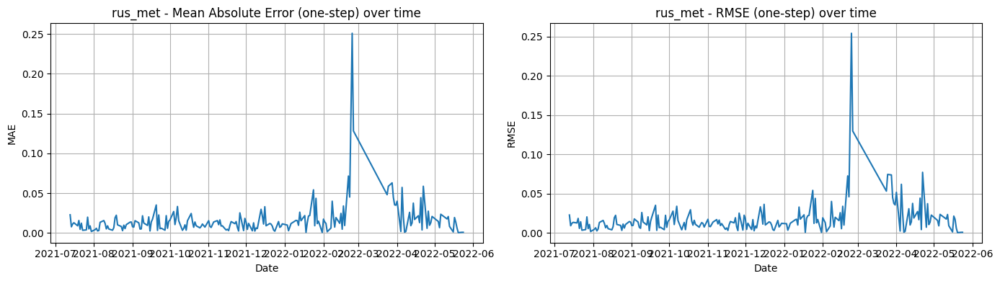


Sector: us_tech
Total rolling steps: 200 (from pos 2312 to 2511)
Chosen lag from initial selection: 8


Rolling us_tech: 100%|██████████| 200/200 [00:08<00:00, 24.25it/s]


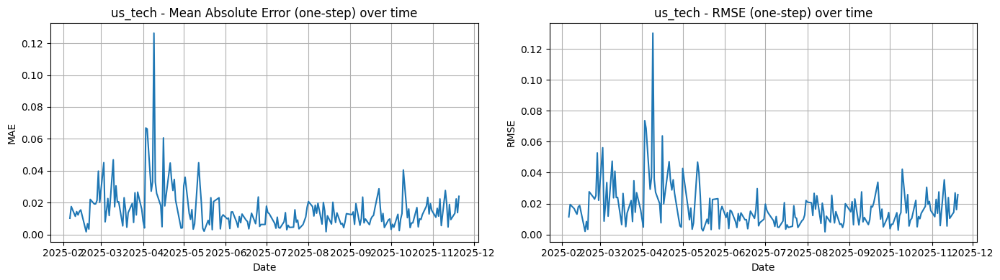


Sector: us_retail
Total rolling steps: 200 (from pos 2312 to 2511)
Chosen lag from initial selection: 1


Rolling us_retail: 100%|██████████| 200/200 [00:02<00:00, 87.40it/s]


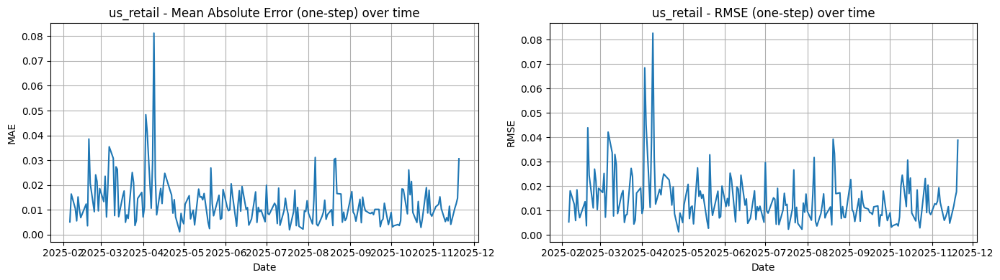


Sector: us_energy
Total rolling steps: 200 (from pos 2312 to 2511)
Chosen lag from initial selection: 7


Rolling us_energy: 100%|██████████| 200/200 [00:06<00:00, 29.06it/s]


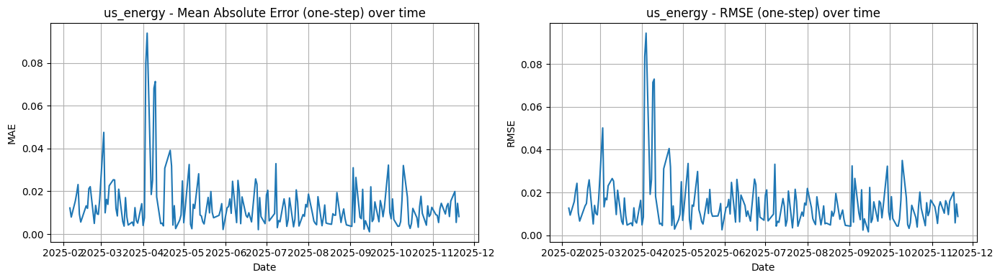


Rolling evaluation completed. Results are in folder: rolling_results


In [41]:
# rolling_var_evaluation.py
import os
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from statsmodels.tsa.vector_ar.var_model import VAR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tqdm.auto import tqdm  # если не установлено, можно убрать tqdm

# ============= SETTINGS =============
SECTOR_FILES = {
    "rus_fin": "rus_fin_prices.csv",
    "rus_oil": "rus_oil_prices.csv",
    "rus_met": "rus_met_prices.csv",
    "us_tech": "us_tech_prices.csv",
    "us_retail": "us_retail_prices.csv",
    "us_energy": "us_energy_prices.csv"
}
OUT_DIR = "rolling_results"
os.makedirs(OUT_DIR, exist_ok=True)

MIN_TRAIN_SIZE = 250     # минимальный размер тренировки до старта rolling (в рабочих днях)
HOLDOUT_DAYS = 200       # сколько дней оценивать (длина rolling / теста)
MAX_LAGS = 8             # макс лагов для select_order (на первом шаге)
FIX_LAG = None           # если хочешь принудительно задать lag -> укажи целое (напр. 2), иначе None
USE_EXPANDING = True     # True -> expanding window; False -> moving window
ROLLING_WINDOW_SIZE = 500  # если USE_EXPANDING=False, размер окна

# ============= FUNCTIONS =============
def prepare_returns(df_prices):
    df_prices = df_prices.sort_index()
    returns = np.log(df_prices).diff().dropna(how='all')
    returns = returns.dropna(how='any')  # VAR требует полных строк
    return returns

def fit_var_and_forecast_one_step(train_returns, lag):
    """
    Fit VAR(lag) on train_returns (DataFrame) and forecast 1 step ahead (returns).
    Returns predicted 1-step array (shape = n_vars,)
    """
    model = VAR(train_returns)
    res = model.fit(lag)
    # use last k_ar observations from train_returns
    y_input = train_returns.values[-res.k_ar:]
    fc = res.forecast(y=y_input, steps=1)  # returns array shape (1, nvars)
    return fc.ravel(), res

# ============= MAIN LOOP per sector =============
overall_summary = []

for sector, file in SECTOR_FILES.items():
    print("\n" + "="*80)
    print("Sector:", sector)
    print("="*80)

    # load prices (levels)
    df_prices = pd.read_csv(file, index_col=0, parse_dates=True)
    df_prices = df_prices.sort_index()
    # prepare returns
    df_ret = prepare_returns(df_prices)

    n = df_ret.shape[0]
    if n < MIN_TRAIN_SIZE + 10:
        print(f"Not enough obs for sector {sector}: {n} < MIN_TRAIN_SIZE + 10, skipping.")
        continue

    # define start index for rolling: leave last HOLDOUT_DAYS for evaluation OR use MIN_TRAIN_SIZE
    start_idx = max(0, n - HOLDOUT_DAYS - MIN_TRAIN_SIZE)
    # we'll iterate from train_end = start_idx + MIN_TRAIN_SIZE - 1 up to n-2 (so that 1-step ahead exists)
    first_train_end = start_idx + MIN_TRAIN_SIZE - 1
    last_train_end = n - 2  # last index position where 1-step ahead exists

    train_end_positions = list(range(first_train_end, last_train_end + 1))
    m = len(train_end_positions)
    print(f"Total rolling steps: {m} (from pos {first_train_end} to {last_train_end})")

    # determine lag: either FIX_LAG or select_order on the initial training window
    if FIX_LAG is not None:
        chosen_lag = int(FIX_LAG)
        print("Using fixed lag:", chosen_lag)
    else:
        # initial training window
        init_train = df_ret.iloc[: first_train_end + 1]  # inclusive
        try:
            sel = VAR(init_train).select_order(MAX_LAGS)
            chosen_lag = sel.selected_orders.get('aic', None) or sel.selected_orders.get('bic', None) or 1
            if pd.isna(chosen_lag):
                chosen_lag = 1
            chosen_lag = int(chosen_lag)
        except Exception as e:
            print("select_order failed on init window, fallback to lag=1. Error:", e)
            chosen_lag = 1
        print("Chosen lag from initial selection:", chosen_lag)

    # storage for predictions and true values
    cols = df_ret.columns.tolist()
    preds = pd.DataFrame(index=[df_ret.index[i+1] for i in train_end_positions], columns=cols, dtype=float)
    trues = pd.DataFrame(index=preds.index, columns=cols, dtype=float)

    # rolling loop
    for i, train_end_pos in enumerate(tqdm(train_end_positions, desc=f"Rolling {sector}")):
        # define train window indices
        if USE_EXPANDING:
            train_start_pos = 0
        else:
            train_start_pos = max(0, train_end_pos - (ROLLING_WINDOW_SIZE - 1))

        train_df = df_ret.iloc[train_start_pos: train_end_pos + 1]  # inclusive
        test_pos = train_end_pos + 1
        test_date = df_ret.index[test_pos]

        # ensure enough observations to fit VAR(chosen_lag)
        if train_df.shape[0] <= chosen_lag:
            # not enough obs, fill NaN and continue
            preds.loc[test_date] = np.nan
            trues.loc[test_date] = df_ret.iloc[test_pos].values
            continue

        try:
            yhat, fitted = fit_var_and_forecast_one_step(train_df, chosen_lag)
            preds.loc[test_date] = yhat
            trues.loc[test_date] = df_ret.iloc[test_pos].values
        except Exception as e:
            # on error, log NaNs
            print(f"Step {i} error at date {test_date}: {e}")
            preds.loc[test_date] = np.nan
            trues.loc[test_date] = df_ret.iloc[test_pos].values

    # drop rows where preds are all NaN (failed steps)
    valid_mask = ~preds.isna().all(axis=1)
    preds = preds.loc[valid_mask]
    trues = trues.loc[valid_mask]

    # compute per-ticker RMSE/MAE
    rmse_per = ((preds - trues)**2).mean().apply(np.sqrt)
    mae_per = (preds - trues).abs().mean()
    summary_df = pd.DataFrame({
        "RMSE": rmse_per,
        "MAE": mae_per
    })
    summary_df.to_csv(os.path.join(OUT_DIR, f"{sector}_rolling_errors_per_ticker.csv"))

    # overall aggregated metrics (mean across tickers)
    overall_rmse = rmse_per.mean()
    overall_mae = mae_per.mean()

    # save preds and trues
    preds.to_csv(os.path.join(OUT_DIR, f"{sector}_rolling_preds.csv"))
    trues.to_csv(os.path.join(OUT_DIR, f"{sector}_rolling_true.csv"))
    summary_df.to_csv(os.path.join(OUT_DIR, f"{sector}_rolling_summary.csv"))

    # Save overall summary row
    overall_summary.append({
        "sector": sector,
        "n_steps": preds.shape[0],
        "chosen_lag": chosen_lag,
        "overall_RMSE_mean": overall_rmse,
        "overall_MAE_mean": overall_mae
    })

    # Plot aggregated errors over time (mean absolute error across tickers per date)
    mad_series = (preds - trues).abs().mean(axis=1)
    rmse_series = np.sqrt(((preds - trues)**2).mean(axis=1))

    # plot MAE over time
    import matplotlib.pyplot as plt
    fig, ax = plt.subplots(1,2, figsize=(14,4))
    ax[0].plot(mad_series.index, mad_series.values)
    ax[0].set_title(f"{sector} - Mean Absolute Error (one-step) over time")
    ax[0].set_xlabel("Date")
    ax[0].set_ylabel("MAE")
    ax[0].grid(True)

    ax[1].plot(rmse_series.index, rmse_series.values)
    ax[1].set_title(f"{sector} - RMSE (one-step) over time")
    ax[1].set_xlabel("Date")
    ax[1].set_ylabel("RMSE")
    ax[1].grid(True)

    plt.tight_layout()
    fig_path = os.path.join(OUT_DIR, f"{sector}_rolling_error_timeseries.png")
    fig.savefig(fig_path, bbox_inches='tight', dpi=150)
    plt.show()
    plt.close(fig)

# Save overall summary
overall_df = pd.DataFrame(overall_summary)
overall_df.to_csv(os.path.join(OUT_DIR, "rolling_overall_summary.csv"), index=False)
print("\nRolling evaluation completed. Results are in folder:", OUT_DIR)

Сделаем прогноз в будущее

In [42]:
import os
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.vector_ar.var_model import VAR

In [43]:
# ---------------- SETTINGS (подправь пути при необходимости) ----------------
SECTORS = {
    "rus_fin": "rus_fin_prices.csv",
    "rus_oil": "rus_oil_prices.csv",
    "rus_met": "rus_met_prices.csv",
    "us_tech": "us_tech_prices.csv",
    "us_retail": "us_retail_prices.csv",
    "us_energy": "us_energy_prices.csv"
}
OUT_DIR = "FORECASTS"
OUT_VAR = os.path.join(OUT_DIR, "VAR")
os.makedirs(OUT_VAR, exist_ok=True)

# параметры по умолчанию
HOLDOUT_DAYS = 60      # размер тестовой части (backtest). Поменяй как нужно
MAX_LAGS_VAR = 8
DEFAULT_VAR_LAG = 2
PLOT_XLIM_LEFT = pd.to_datetime("2005-03-01")  # пример из твоего фрагмента

# ---------------- utility functions ----------------
def ensure_numeric_df(df):
    df2 = df.copy()
    for c in df2.columns:
        df2[c] = pd.to_numeric(df2[c], errors='coerce')
    df2 = df2.dropna(axis=1, how='all')
    return df2

def compute_log_returns(df_prices):
    return np.log(df_prices).diff().dropna(how='any')

def make_future_index(last_index, h):
    start = last_index[-1] + pd.Timedelta(days=1)
    try:
        idx = pd.bdate_range(start=start, periods=h)
    except Exception:
        idx = pd.date_range(start=start, periods=h, freq='B')
    return idx

def safe_reconstruct_prices_from_log_returns(last_prices, fc_returns_df):
    """
    last_prices: pd.Series (last observed prices)
    fc_returns_df: DataFrame of forecasted log-returns (index = future dates)
    returns DataFrame of forecasted prices
    """
    common = [c for c in fc_returns_df.columns if c in last_prices.index]
    if len(common) == 0:
        raise ValueError("No matching tickers between last_prices and fc_returns_df")
    if len(common) < len(fc_returns_df.columns):
        missing = [c for c in fc_returns_df.columns if c not in common]
        print("⚠ Missing last_prices for tickers:", missing)
    fc = fc_returns_df[common].copy()
    prev = last_prices[common].astype(float).copy()
    prices = []
    for i in range(len(fc)):
        r = fc.iloc[i]
        next_price = prev * np.exp(r)
        prices.append(next_price.copy())
        prev = next_price
    return pd.DataFrame(prices, index=fc.index, columns=fc.columns)

def var_forecast_plot_prices(sector, csv_path, holdout_days=60, maxlags=8):

    print(f"=== SECTOR: {sector} ===")

    # ---------- LOAD ----------
    df_prices = pd.read_csv(csv_path, index_col=0, parse_dates=True)
    df_prices = df_prices.sort_index()
    df_prices = df_prices.apply(pd.to_numeric, errors="coerce").dropna()

    # ---------- RETURNS ----------
    df_ret = np.log(df_prices).diff().dropna()

    # ---------- TRAIN / TEST ----------
    train_ret = df_ret.iloc[:-holdout_days]
    test_ret  = df_ret.iloc[-holdout_days:]

    train_prices = df_prices.loc[train_ret.index]
    test_prices  = df_prices.loc[test_ret.index]

    last_price = train_prices.iloc[-1]

    # ---------- FIT VAR ----------
    model = VAR(train_ret)
    try:
        sel = model.select_order(maxlags)
        lag = sel.selected_orders.get('aic') or sel.selected_orders.get('bic') or 2
        lag = int(lag)
    except:
        lag = 2

    print("Chosen lag:", lag)

    res = model.fit(lag)

    # ---------- FORECAST RETURNS ----------
    steps = len(test_ret)
    fc_ret = res.forecast(train_ret.values[-res.k_ar:], steps=steps)

    fc_ret_df = pd.DataFrame(fc_ret, index=test_ret.index, columns=train_ret.columns)

    # ---------- CONVERT RETURNS BACK TO PRICES ----------
    fc_prices = []
    prev = last_price.copy()

    for t in range(steps):
        new_price = prev * np.exp(fc_ret_df.iloc[t])
        fc_prices.append(new_price)
        prev = new_price

    fc_prices_df = pd.DataFrame(fc_prices, index=test_ret.index, columns=train_ret.columns)

    # ---------- PLOT (like your example) ----------
    for col in train_ret.columns:
        fig, ax = plt.subplots(figsize=(15, 2))

        # История
        train_prices[col].plot(ax=ax, color="black")

        # Прогноз
        fc_prices_df[col].rename(col+"-VAR").plot(ax=ax, linestyle="--", color="blue")

        # Склейка
        ax.scatter([train_prices.index[-1]], [train_prices[col].iloc[-1]], color="red", s=30)

        ax.set_xlim(left=pd.to_datetime("2005-03-01"))
        ax.set_title(f"{sector} — {col} | VAR forecast")
        ax.grid(True)
        plt.show()

    return {
        "train": train_prices,
        "test": test_prices,
        "fc_prices": fc_prices_df,
        "fc_returns": fc_ret_df,
        "var_model": res
    }

# ---------------- core: train/forecast/plot for one sector ----------------
def var_forecast_and_plot(sector_name, csv_path,
                          holdout_days=HOLDOUT_DAYS,
                          maxlags=MAX_LAGS_VAR,
                          default_lag=DEFAULT_VAR_LAG,
                          save_out=True,
                          show_plots=True,
                          xlim_left=PLOT_XLIM_LEFT):
    """
    1) Reads csv_path (prices levels)
    2) Builds log-returns, splits into train/test (last holdout_days rows -> test)
    3) Fits VAR on train returns, selects lag by AIC (if possible)
    4) Forecasts returns for len(test) steps
    5) Reconstructs forecast prices, saves CSVs and plots per-ticker
    """
    # -- load and prepare --
    df_prices = pd.read_csv(csv_path, index_col=0, parse_dates=True)
    df_prices = ensure_numeric_df(df_prices).sort_index()
    if df_prices.shape[1] < 2:
        print(f"Sector {sector_name}: need >=2 series, got {df_prices.shape[1]}. Skipping.")
        return None

    # compute returns
    df_ret = compute_log_returns(df_prices)
    if df_ret.shape[0] < 30:
        print(f"Sector {sector_name}: too few returns observations ({df_ret.shape[0]}). Skipping.")
        return None

    # split train / test by last holdout_days
    if holdout_days is None or holdout_days <= 0 or holdout_days >= df_ret.shape[0]:
        # use default small test (10) if invalid
        holdout_days = min(10, max(1, df_ret.shape[0]//10))

    train_ret = df_ret.iloc[:-holdout_days]
    test_ret  = df_ret.iloc[-holdout_days:]

    # also get train prices (levels) for plotting and last_price
    train_prices = df_prices.loc[train_ret.index]
    test_prices = df_prices.loc[test_ret.index]
    last_price_for_reconstruct = train_prices.iloc[-1]

    # -- select lag --
    try:
        sel = VAR(train_ret).select_order(maxlags)
        chosen = sel.selected_orders.get('aic') or sel.selected_orders.get('bic') or default_lag
        lag = int(chosen) if (pd.notna(chosen)) else default_lag
        if lag < 1:
            lag = default_lag
    except Exception:
        lag = default_lag
    print(f"{sector_name}: chosen VAR lag = {lag}")

    # -- fit VAR --
    model = VAR(train_ret)
    try:
        var_res = model.fit(lag)
    except Exception as e:
        print(f"{sector_name}: VAR fit failed: {e}")
        return None

    # -- forecast returns for test horizon --
    steps = len(test_ret)
    fc_array = var_res.forecast(y=train_ret.values[-var_res.k_ar:], steps=steps)
    # align index with test_ret index (same as example)
    fc_returns = pd.DataFrame(fc_array, index=test_ret.index, columns=train_ret.columns)
    fc_returns = fc_returns.rename(columns={c: c + "-VAR" for c in fc_returns.columns})

    # -- reconstruct forecast prices from last train price --
    # NOTE: fc_returns columns currently have suffix '-VAR'; create mapping back to original
    orig_cols = [c.replace("-VAR", "") for c in fc_returns.columns]
    fc_returns_no_suffix = fc_returns.copy()
    fc_returns_no_suffix.columns = orig_cols

    fc_prices = safe_reconstruct_prices_from_log_returns(last_price_for_reconstruct, fc_returns_no_suffix)

    # add suffix to price columns to save
    fc_prices.columns = [c + "-VAR" for c in fc_prices.columns]

    # -- save CSVs --
    if save_out:
        base = f"{sector_name}_VAR_h{steps}"
        fc_returns.to_csv(os.path.join(OUT_VAR, base + "_returns.csv"))
        fc_prices.to_csv(os.path.join(OUT_VAR, base + "_prices.csv"))
        print(f"Saved: {os.path.join(OUT_VAR, base + '_returns.csv')}")
        print(f"Saved: {os.path.join(OUT_VAR, base + '_prices.csv')}")

    # -- plotting (per-ticker) --
    # We'll plot history = train_prices (full train), then dashed forecast starting from the next date after last train price.
    for orig_col in train_ret.columns:
        col_var = orig_col + "-VAR"
        fig, ax = plt.subplots(figsize=(15, 2))
        # combine: show train_prices (levels) and forecast prices (levels)
        # build a concat DataFrame with column names: orig_col (history) and col_var (forecast)
        # to match your example, we plot train (history) and forecast (dashed)
        hist_series = pd.DataFrame(train_prices[[orig_col]])
        fc_series = pd.DataFrame(fc_prices[[col_var]])
        combined = pd.concat([hist_series, fc_series], axis=1)

        # plot
        combined.plot(ax=ax, legend=False)
        # set xlim if possible
        try:
            ax.set_xlim(left=xlim_left)
        except Exception:
            pass
        ax.set_xlabel("")
        ax.set_title(f"{sector_name} — {orig_col} — VAR forecast (h={steps})")
        # tighten visually
        plt.tight_layout()
        if show_plots:
            plt.show()
        # save per-plot
        fname = os.path.join(OUT_VAR, f"{sector_name}_{orig_col}_VAR_h{steps}.png")
        fig.savefig(fname, bbox_inches='tight', dpi=150)
        plt.close(fig)

    # Also return dict with results
    return {"var_res": var_res, "train_ret": train_ret, "test_ret": test_ret,
            "fc_returns": fc_returns, "fc_prices": fc_prices, "lag": lag}

Running sector: rus_fin
=== SECTOR: rus_fin ===
Chosen lag: 4


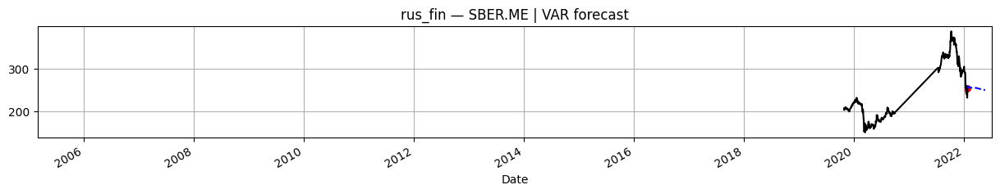

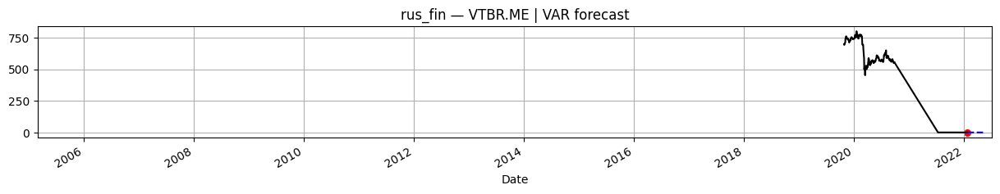

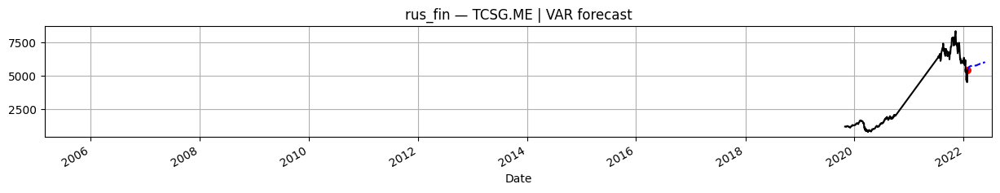

Running sector: rus_oil
=== SECTOR: rus_oil ===
Chosen lag: 1


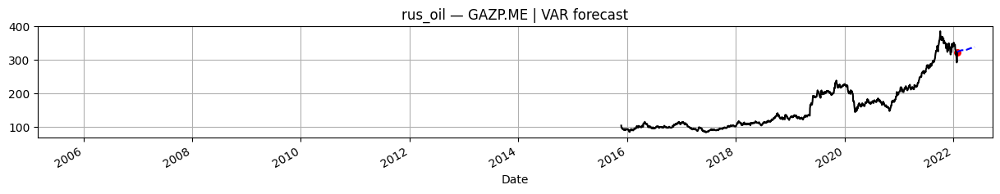

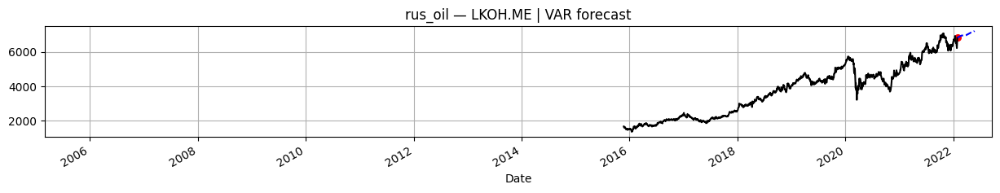

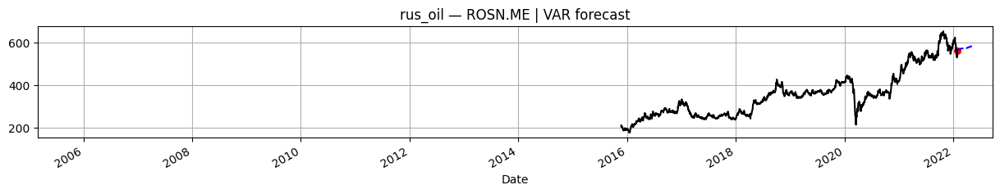

Running sector: rus_met
=== SECTOR: rus_met ===
Chosen lag: 2


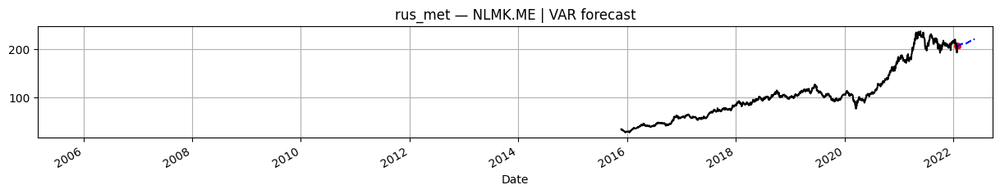

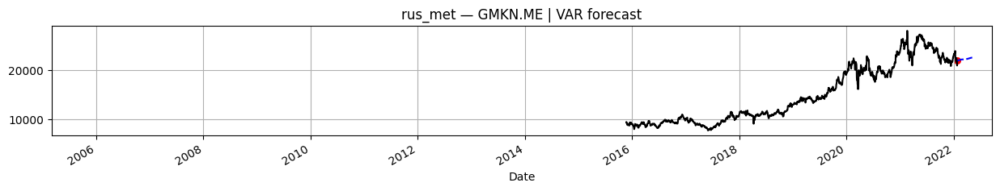

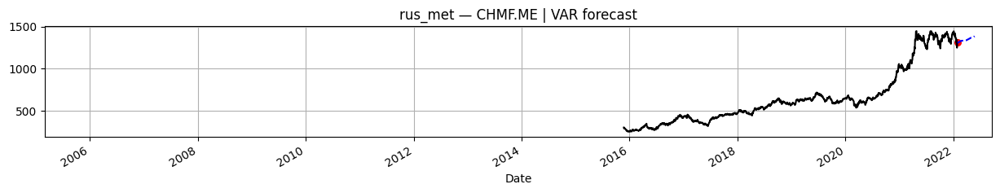

Running sector: us_tech
=== SECTOR: us_tech ===
Chosen lag: 1


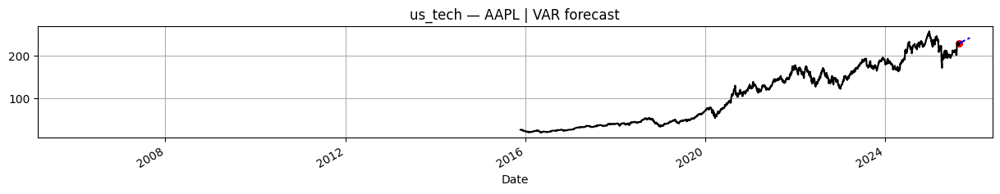

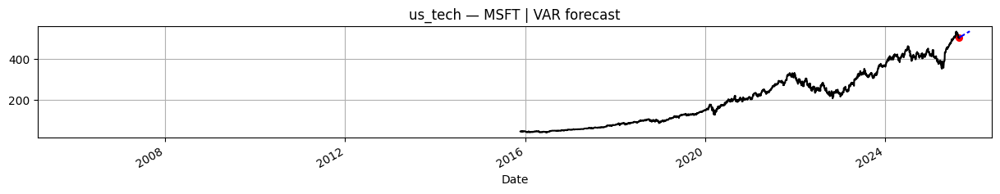

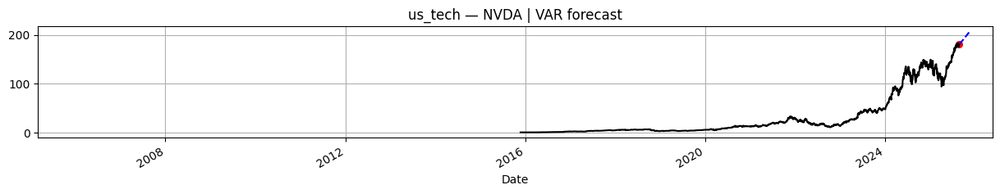

Running sector: us_retail
=== SECTOR: us_retail ===
Chosen lag: 2


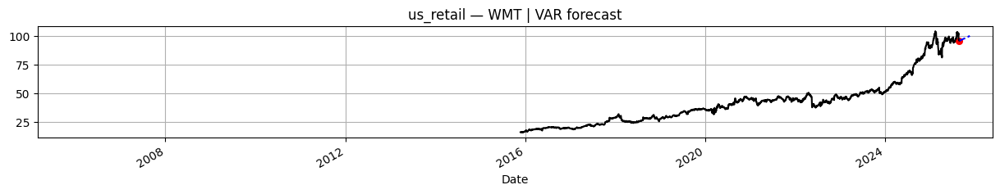

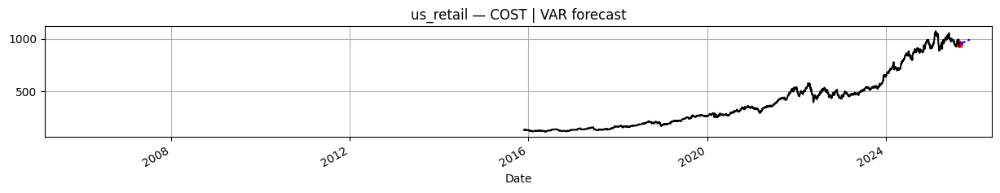

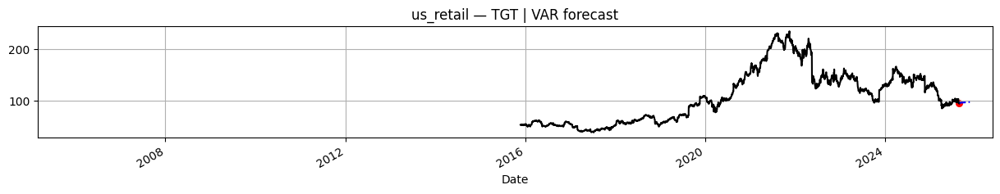

Running sector: us_energy
=== SECTOR: us_energy ===
Chosen lag: 7


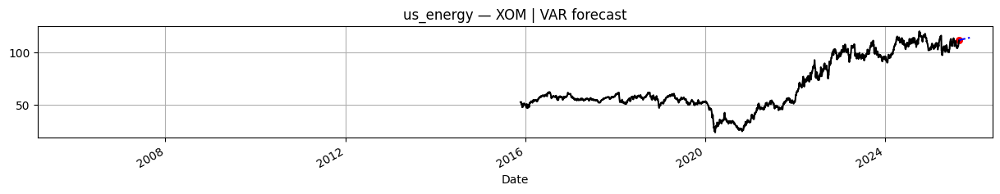

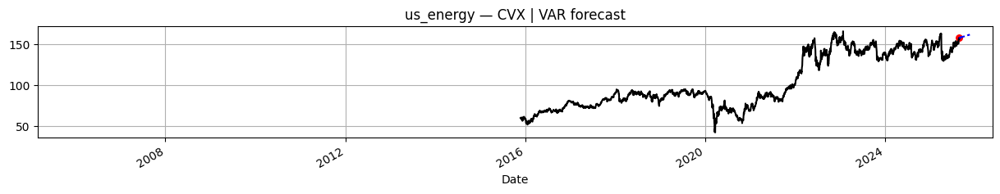

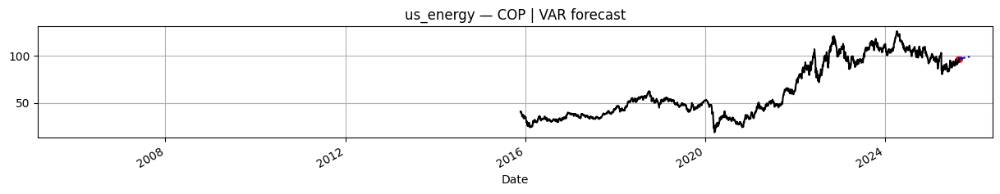

In [44]:
for s, path in SECTORS.items():
    print("Running sector:", s)
    var_forecast_plot_prices(s, path, holdout_days=HOLDOUT_DAYS)

Не прошла, попробуем снова)

In [45]:
import numpy as np
import pandas as pd
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.vector_ar.vecm import VECM, coint_johansen
from statsmodels.tsa.statespace.varmax import VARMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# -------------------- HELPER UTILS --------------------

def compute_returns(df_prices):
    return np.log(df_prices).diff().dropna()

def reconstruct_prices(last_price, forecast_returns):
    """Преобразование лог-доходностей в цены по шагам."""
    prices = []
    prev = last_price.copy()
    for t in range(len(forecast_returns)):
        prev = prev * np.exp(forecast_returns.iloc[t])
        prices.append(prev.copy())
    return pd.DataFrame(prices, index=forecast_returns.index, columns=forecast_returns.columns)

def future_index(start_date, steps):
    """Создаёт h будущих торговых дней."""
    return pd.bdate_range(start=start_date + pd.Timedelta(days=1), periods=steps)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def monte_carlo_VAR(var_res, last_price, h, returns_train, n_sims=200):
    """
    Выполняет Monte Carlo симуляцию VAR:
    - вытягивает средний прогноз
    - добавляет шум N(0, Σ_u)
    - реконструирует N траекторий цен
    """
    Σ = var_res.sigma_u
    k = Σ.shape[0]

    mean_fc = var_res.forecast(returns_train.values[-var_res.k_ar:], steps=h)
    mean_fc_df = pd.DataFrame(mean_fc, index=future_index(returns_train.index[-1], h), columns=returns_train.columns)

    sims = np.zeros((n_sims, h, k))
    last = last_price.values

    for s in range(n_sims):
        path = last.copy()
        for t in range(h):
            shock = np.random.multivariate_normal(np.zeros(k), Σ)
            r = mean_fc[t] + shock
            path = path * np.exp(r)
            sims[s,t,:] = path
    return mean_fc_df, sims

def summarize_mc_paths(sims, index, columns):
    """Возвращает mean, median, 5%, 95% пути."""
    mean = sims.mean(axis=0)
    median = np.median(sims, axis=0)
    low = np.quantile(sims, 0.05, axis=0)
    high = np.quantile(sims, 0.95, axis=0)

    return (
        pd.DataFrame(mean, index=index, columns=columns),
        pd.DataFrame(median, index=index, columns=columns),
        pd.DataFrame(low, index=index, columns=columns),
        pd.DataFrame(high, index=index, columns=columns),
    )

In [46]:
def run_VAR(df_prices, train_ret, test_ret):
    # lag selection
    sel = VAR(train_ret).select_order(8)
    lag = sel.selected_orders.get("aic") or sel.selected_orders.get("bic") or 2
    lag = int(lag)

    var_model = VAR(train_ret).fit(lag)

    # ----------- SUMMARY OUTPUT -----------
    print(f"\n===== VAR SUMMARY ({sector_name if 'sector_name' in locals() else ''}) =====")
    try:
        print(var_model.summary().as_text())
    except:
        print(var_model.summary())
    # --------------------------------------

    # forecast returns
    h = len(test_ret)
    fc_ret = var_model.forecast(train_ret.values[-var_model.k_ar:], steps=h)
    fc_ret_df = pd.DataFrame(fc_ret, index=test_ret.index, columns=train_ret.columns)

    # prices
    fc_price = reconstruct_prices(df_prices.iloc[-h-1], fc_ret_df)

    # Monte Carlo
    mean_fc_df, sims = monte_carlo_VAR(var_model, df_prices.iloc[-h-1], h, train_ret)
    mean_mc, med_mc, low_mc, high_mc = summarize_mc_paths(sims, mean_fc_df.index, mean_fc_df.columns)

    return {
        "model": var_model,
        "forecast_returns": fc_ret_df,
        "forecast_prices": fc_price,
        "mc_mean": mean_mc,
        "mc_low": low_mc,
        "mc_high": high_mc,
        "mc_sims": sims,
        # "lag": lag
    }

def run_VECM(df_prices, train_ret, test_ret):
    """
    Прогноз VECM с автоматической защитой от ошибок размерности.
    Использует только встроенный predict(), без ручной математики alpha*beta.
    """

    # уровни (не returns!)
    train_lvl = df_prices.loc[train_ret.index]
    test_lvl  = df_prices.loc[test_ret.index]

    # ---------- Johansen тест ----------
    try:
        joh = coint_johansen(train_lvl, det_order=0, k_ar_diff=1)
    except Exception as e:
        print("VECM: Johansen failed:", e)
        return {"model": None}

    trace = joh.lr1
    cvt = joh.cvt

    r = sum(trace > cvt[:,1])  # rank at 95% level

    if r <= 0:
        print("VECM: No cointegration (rank = 0). Skipping.")
        return {"model": None}

    if r >= train_lvl.shape[1]:
        print(f"VECM: Invalid rank r={r}, k={train_lvl.shape[1]}. Skipping.")
        return {"model": None}

    # ---------- Fit VECM ----------
    try:
        vecm = VECM(train_lvl, k_ar_diff=1, coint_rank=r)
        res = vecm.fit()
    except Exception as e:
        print("VECM fit failed:", e)
        return {"model": None}
    
    # ----------- SUMMARY OUTPUT -----------
    print(f"\n===== VAR SUMMARY ({sector_name if 'sector_name' in locals() else ''}) =====")
    try:
        print(res.summary().as_text())
    except:
        print(res.summary())
    # --------------------------------------

    # ---------- Forecast ----------
    h = len(test_ret)
    try:
        fc = res.predict(steps=h)
    except Exception as e:
        print("VECM forecast failed:", e)
        return {"model": None}

    idx = test_lvl.index
    fc_df = pd.DataFrame(fc, index=idx, columns=train_lvl.columns)

    # ---------- Monte Carlo ----------
    # упрощённый вариант: просто добавляем небольшие shocks
    resid = res.resid
    Σ = np.cov(resid.T)

    sims = np.zeros((200, h, train_lvl.shape[1]))
    for s in range(200):
        prev = train_lvl.iloc[-1].values.copy()
        for t in range(h):
            eps = np.random.multivariate_normal(np.zeros(train_lvl.shape[1]), Σ)
            prev = fc_df.iloc[t].values + eps
            sims[s,t,:] = prev

    mean_mc = sims.mean(axis=0)
    mean_mc_df = pd.DataFrame(mean_mc, index=idx, columns=train_lvl.columns)

    return {
        "model": res,
        "forecast_prices": fc_df,
        "mc_mean": mean_mc_df,
        "mc_sims": sims
    }

def run_VARMAX(df_prices, train_ret, test_ret):
    try:
        # простая модель без экзогенов
        model = VARMAX(train_ret, order=(1,1))
        res = model.fit(disp=False)
    except:
        return {"model": None}

    # ----------- SUMMARY OUTPUT -----------
    print(f"\n===== VAR SUMMARY ({sector_name if 'sector_name' in locals() else ''}) =====")
    try:
        print(res.summary().as_text())
    except:
        print(res.summary())
    # --------------------------------------

    h = len(test_ret)
    fc_ret = res.forecast(steps=h)
    fc_ret.index = test_ret.index

    fc_price = reconstruct_prices(df_prices.iloc[-h-1], fc_ret)

    # MC: шум = ковариация ошибок
    resid = res.resid.dropna()
    Σ = np.cov(resid.T)

    sims = np.zeros((200, h, train_ret.shape[1]))

    for s in range(200):
        prev = df_prices.iloc[-h-1].values.copy()
        for t in range(h):
            eps = np.random.multivariate_normal(np.zeros(train_ret.shape[1]), Σ)
            r = fc_ret.iloc[t].values + eps
            prev = prev * np.exp(r)
            sims[s,t,:] = prev

    mean_mc = sims.mean(axis=0)
    mean_mc_df = pd.DataFrame(mean_mc, index=test_ret.index, columns=train_ret.columns)

    return {
        "model": res,
        "forecast_prices": fc_price,
        "mc_mean": mean_mc_df,
        "mc_sims": sims
    }

def compare_models(sector, df_prices, holdout_days=60):
    print(f"\n=== {sector.upper()} ===")

    df_prices = df_prices.apply(pd.to_numeric, errors="coerce").dropna()

    df_ret = compute_returns(df_prices)

    train = df_ret.iloc[:-holdout_days]
    test  = df_ret.iloc[-holdout_days:]

    # ---------------- VAR ----------------
    VAR_res = run_VAR(df_prices, train, test)

    # ---------------- VECM ----------------
    VECM_res = run_VECM(df_prices, train, test)

    # ---------------- VARMAX ----------------
    VARMAX_res = run_VARMAX(df_prices, train, test)

    # ---------------- ERROR METRICS ----------------
    metrics = {}      

# VAR
    if VAR_res.get("forecast_prices") is not None:
        y_true = df_prices.loc[VAR_res["forecast_prices"].index]
        y_pred = VAR_res["forecast_prices"]
        metrics["VAR_RMSE"] = rmse(y_true, y_pred)
        metrics["VAR_MAE"] = mae(y_true, y_pred)
    else:
        metrics["VAR_RMSE"] = None
        metrics["VAR_MAE"] = None

    # VECM
    if VECM_res.get("forecast_prices") is not None:
        y_true = df_prices.loc[VECM_res["forecast_prices"].index]
        y_pred = VECM_res["forecast_prices"]
        metrics["VECM_RMSE"] = rmse(y_true, y_pred)
        metrics["VECM_MAE"] = mae(y_true, y_pred)
    else:
        metrics["VECM_RMSE"] = None
        metrics["VECM_MAE"] = None

    # VARMAX
    if VARMAX_res.get("forecast_prices") is not None:
        y_true = df_prices.loc[VARMAX_res["forecast_prices"].index]
        y_pred = VARMAX_res["forecast_prices"]
        metrics["VARMAX_RMSE"] = rmse(y_true, y_pred)
        metrics["VARMAX_MAE"] = mae(y_true, y_pred)
    else:
        metrics["VARMAX_RMSE"] = None
        metrics["VARMAX_MAE"] = None

    return {
        "VAR": VAR_res,
        "VECM": VECM_res,
        "VARMAX": VARMAX_res,
        "metrics": metrics
    }

Делаем прогнозы и строим графики

In [47]:
results = {}

for sector, file in SECTORS.items():
    df = pd.read_csv(file, index_col=0, parse_dates=True)
    results[sector] = compare_models(sector, df, holdout_days=60)


=== RUS_FIN ===

===== VAR SUMMARY () =====
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 23, Nov, 2025
Time:                     21:09:15
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -23.0519
Nobs:                     364.000    HQIC:                  -23.3035
Log likelihood:           2760.97    FPE:                6.41754e-11
AIC:                     -23.4695    Det(Omega_mle):     5.77628e-11
--------------------------------------------------------------------
Results for equation SBER.ME
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const             -0.000953         0.001161           -0.821           0.412
L1.SBER.ME        -0.120067         0.086005           -1.396           0.163
L1.VTBR.ME         0.1187

,VAR_RMSE,VAR_MAE,VECM_RMSE,VECM_MAE,VARMAX_RMSE,VARMAX_MAE
sector,,,,,,
rus_fin,1545.960583,802.913731,1260.582366,655.858409,1430.160090,737.081858
rus_oil,1157.329366,631.532829,NaN,NaN,1159.897044,632.803920
rus_met,912.693196,538.815879,NaN,NaN,921.420200,543.647921
us_tech,17.023856,13.552110,13.220559,10.396325,17.003229,13.534082
us_retail,28.520621,17.692414,NaN,NaN,28.544865,17.717772
us_energy,6.413615,5.110084,NaN,NaN,6.274585,4.986953


<Figure size 1200x500 with 0 Axes>

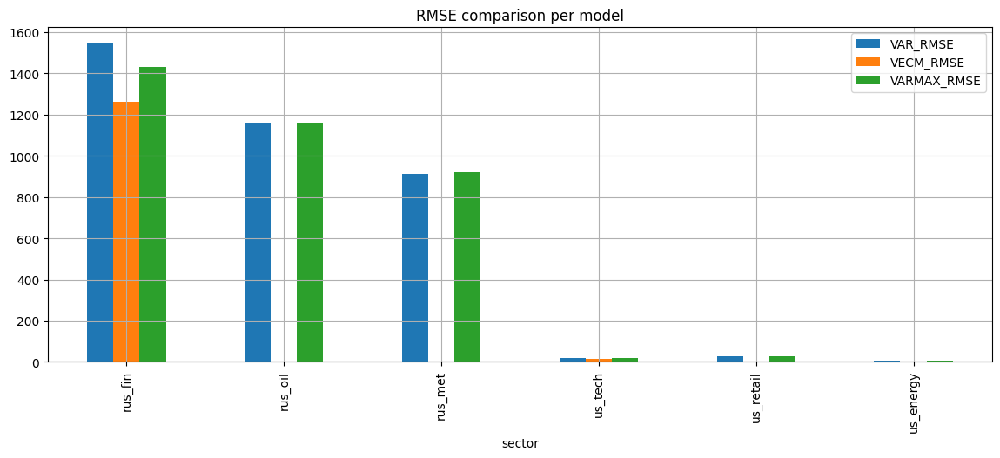

<Figure size 1200x500 with 0 Axes>

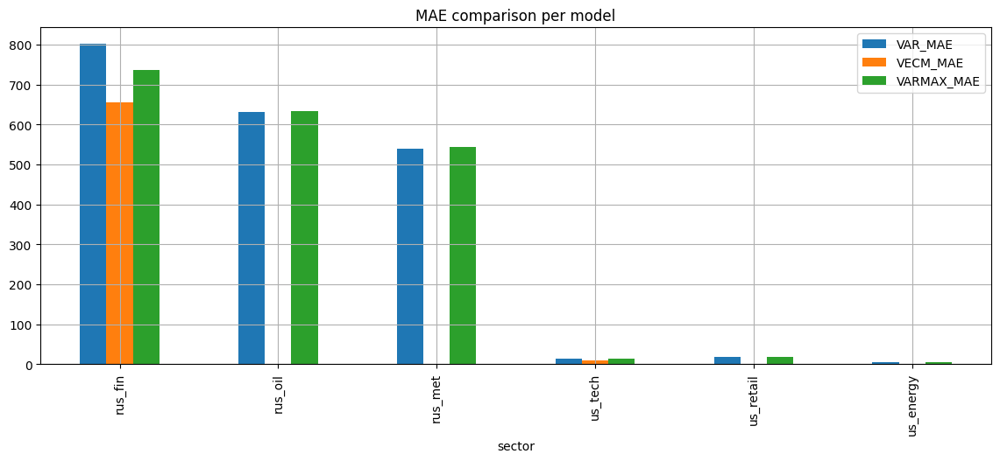

,VAR_RMSE,VAR_MAE,VECM_RMSE,VECM_MAE,VARMAX_RMSE,VARMAX_MAE
sector,,,,,,
rus_fin,1545.960583,802.913731,1260.582366,655.858409,1430.160090,737.081858
rus_oil,1157.329366,631.532829,NaN,NaN,1159.897044,632.803920
rus_met,912.693196,538.815879,NaN,NaN,921.420200,543.647921
us_tech,17.023856,13.552110,13.220559,10.396325,17.003229,13.534082
us_retail,28.520621,17.692414,NaN,NaN,28.544865,17.717772
us_energy,6.413615,5.110084,NaN,NaN,6.274585,4.986953


In [48]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_error_bars(results):
    """
    Строит barplot RMSE/MAE для VAR, VECM, VARMAX для всех секторов.
    """
    rows = []

    for sector, data in results.items():
        m = data["metrics"]
        rows.append({
            "sector": sector,
            "VAR_RMSE": m.get("VAR_RMSE"),
            "VAR_MAE": m.get("VAR_MAE"),
            "VECM_RMSE": m.get("VECM_RMSE"),
            "VECM_MAE": m.get("VECM_MAE"),
            "VARMAX_RMSE": m.get("VARMAX_RMSE"),
            "VARMAX_MAE": m.get("VARMAX_MAE"),
        })

    df = pd.DataFrame(rows).set_index("sector")
    display(df)

    # ---- RMSE barplot ----
    plt.figure(figsize=(12,5))
    df[[c for c in df.columns if "RMSE" in c]].plot(kind="bar", figsize=(14,5))
    plt.title("RMSE comparison per model")
    plt.grid(True)
    plt.show()

    # ---- MAE barplot ----
    plt.figure(figsize=(12,5))
    df[[c for c in df.columns if "MAE" in c]].plot(kind="bar", figsize=(14,5))
    plt.title("MAE comparison per model")
    plt.grid(True)
    plt.show()

    return df

plot_error_bars(results)

Расширим прогноз.

In [49]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.vector_ar.vecm import VECM, coint_johansen
from statsmodels.tsa.statespace.varmax import VARMAX

# ---------- utilities ----------
def future_index_from_last(last_index, h):
    start = last_index[-1] + pd.Timedelta(days=1)
    try:
        return pd.bdate_range(start=start, periods=h)
    except:
        return pd.date_range(start=start, periods=h, freq='B')

def safe_reconstruct(last_price, fc_returns_df):
    common = [c for c in fc_returns_df.columns if c in last_price.index]
    if len(common) == 0:
        raise ValueError("Нет общих тикеров между last_price и fc_returns_df")
    fc = fc_returns_df[common].copy()
    prev = last_price[common].astype(float).copy()
    rows = []
    for i in range(len(fc)):
        prev = prev * np.exp(fc.iloc[i])
        rows.append(prev.copy())
    return pd.DataFrame(rows, index=fc.index, columns=fc.columns)

def mc_simulate_from_var(var_res, last_price, returns_train, h, n_sims=500, seed=0):
    np.random.seed(seed)
    Σ = getattr(var_res, "sigma_u", None)
    if Σ is None:
        # fallback: cov of residuals
        try:
            Σ = np.cov(var_res.resid.T)
        except:
            Σ = np.cov(returns_train.values.T)
    mean_fc = var_res.forecast(returns_train.values[-var_res.k_ar:], steps=h)
    idx = future_index_from_last(returns_train.index, h)
    mean_fc_df = pd.DataFrame(mean_fc, index=idx, columns=returns_train.columns)

    k = mean_fc.shape[1]
    sims_prices = np.zeros((n_sims, h, k))
    last = last_price.values.astype(float)

    for s in range(n_sims):
        prev = last.copy()
        shocks = np.random.multivariate_normal(np.zeros(k), Σ, size=h)
        for t in range(h):
            r = mean_fc[t] + shocks[t]
            prev = prev * np.exp(r)
            sims_prices[s,t,:] = prev

    mean = sims_prices.mean(axis=0)
    low = np.quantile(sims_prices, 0.05, axis=0)
    high = np.quantile(sims_prices, 0.95, axis=0)
    cols = returns_train.columns
    mean_df = pd.DataFrame(mean, index=idx, columns=cols)
    low_df  = pd.DataFrame(low,  index=idx, columns=cols)
    high_df = pd.DataFrame(high, index=idx, columns=cols)
    return mean_df, low_df, high_df

# ---------- main function: forecast into future for one sector ----------
def forecast_future_all_models(csv_path, sector_name, horizons=[10,20,100], n_sims=500, out_dir="FORECASTS_FUT"):
    os.makedirs(out_dir, exist_ok=True)
    df_prices = pd.read_csv(csv_path, index_col=0, parse_dates=True).sort_index()
    df_prices = df_prices.apply(pd.to_numeric, errors='coerce').dropna(axis=1, how='all')

    # returns for VAR/VARMAX training
    df_ret = np.log(df_prices).diff().dropna(how='any')
    if df_ret.shape[0] < 30:
        raise ValueError("Too few obs for modelling.")

    last_price = df_prices.iloc[-1]

    results = {}

    # ---------- VAR: fit on full returns ----------
    try:
        model_var = VAR(df_ret)
        sel = model_var.select_order(8)
        chosen = sel.selected_orders.get("aic") or sel.selected_orders.get("bic") or 2
        lag = int(chosen)
        var_res = model_var.fit(lag)
    except Exception as e:
        var_res = None
        print("VAR fit failed:", e)

    # ---------- VECM: fit on levels if cointegration ----------
    vecm_res = None
    try:
        joh = coint_johansen(df_prices, det_order=0, k_ar_diff=1)
        r = sum(joh.lr1 > joh.cvt[:,1])
        if r > 0 and r < df_prices.shape[1]:
            vecm = VECM(df_prices, k_ar_diff=1, coint_rank=r)
            vecm_res = vecm.fit()
    except Exception as e:
        vecm_res = None

    # ---------- VARMAX: simple varmax on returns (no exog) ----------
    varmax_res = None
    try:
        vm = VARMAX(df_ret, order=(1,1))
        varmax_res = vm.fit(disp=False)
    except Exception as e:
        varmax_res = None

    # For each horizon produce forecasts and MC
    for h in horizons:
        print(f"Sector {sector_name} — horizon {h}")
        idx_future = future_index_from_last(df_prices.index, h)

        # VAR forecast (future)
        if var_res is not None:
            fc_returns = var_res.forecast(df_ret.values[-var_res.k_ar:], steps=h)
            fc_returns_df = pd.DataFrame(fc_returns, index=idx_future, columns=df_ret.columns)
            fc_prices_var = safe_reconstruct(last_price, fc_returns_df)
            mean_var, low_var, high_var = mc_simulate_from_var(var_res, last_price, df_ret, h, n_sims=n_sims)
            results.setdefault("VAR", {})[f"h{h}_fc_prices"] = fc_prices_var
            results["VAR"][f"h{h}_mean_mc"] = mean_var
            results["VAR"][f"h{h}_low_mc"] = low_var
            results["VAR"][f"h{h}_high_mc"] = high_var
            # save
            fc_returns_df.to_csv(os.path.join(out_dir, f"{sector_name}_VAR_returns_h{h}.csv"))
            fc_prices_var.to_csv(os.path.join(out_dir, f"{sector_name}_VAR_prices_h{h}.csv"))

            # plot per column
            for col in fc_prices_var.columns:
                plt.figure(figsize=(10,4))
                # history tail
                hist = df_prices[col].iloc[-250:]
                plt.plot(hist.index, hist.values, color="black", label="History")
                # mean
                plt.plot(mean_var.index, mean_var[col], color="blue", label="VAR MC mean")
                # interval
                plt.fill_between(mean_var.index, low_var[col], high_var[col], color="blue", alpha=0.2, label="90% interval")
                plt.scatter([df_prices.index[-1]], [df_prices[col].iloc[-1]], color="black")
                plt.title(f"{sector_name} — {col} — VAR forecast (h={h})")
                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.savefig(os.path.join(out_dir, f"{sector_name}_{col}_VAR_h{h}.png"))
                plt.show()

        # VECM forecast (levels) - only if fitted
        if vecm_res is not None:
            try:
                fc_levels = vecm_res.predict(steps=h)
                fc_df = pd.DataFrame(fc_levels, index=idx_future, columns=df_prices.columns)
                results.setdefault("VECM", {})[f"h{h}_fc_levels"] = fc_df
                fc_df.to_csv(os.path.join(out_dir, f"{sector_name}_VECM_levels_h{h}.csv"))
                # quick plot (no MC implemented robustly)
                for col in fc_df.columns:
                    plt.figure(figsize=(10,4))
                    hist = df_prices[col].iloc[-250:]
                    plt.plot(hist.index, hist.values, color="black", label="History")
                    plt.plot(fc_df.index, fc_df[col], "--", color="green", label="VECM forecast")
                    plt.scatter([df_prices.index[-1]], [df_prices[col].iloc[-1]], color="black")
                    plt.title(f"{sector_name} — {col} — VECM forecast (h={h})")
                    plt.legend()
                    plt.grid(True)
                    plt.tight_layout()
                    plt.savefig(os.path.join(out_dir, f"{sector_name}_{col}_VECM_h{h}.png"))
                    plt.show()
            except Exception as e:
                print("VECM forecast failed for horizon", h, e)

        # VARMAX forecast (future) - if fitted
        if varmax_res is not None:
            try:
                # need to forecast exog if any; here using no-exog case
                fc_ret = varmax_res.get_forecast(steps=h).predicted_mean
                fc_ret.index = idx_future
                fc_prices_vm = safe_reconstruct(last_price, fc_ret)
                results.setdefault("VARMAX", {})[f"h{h}_fc_prices"] = fc_prices_vm
                fc_ret.to_csv(os.path.join(out_dir, f"{sector_name}_VARMAX_returns_h{h}.csv"))
                fc_prices_vm.to_csv(os.path.join(out_dir, f"{sector_name}_VARMAX_prices_h{h}.csv"))
                for col in fc_prices_vm.columns:
                    plt.figure(figsize=(10,4))
                    hist = df_prices[col].iloc[-250:]
                    plt.plot(hist.index, hist.values, color="black", label="History")
                    plt.plot(fc_prices_vm.index, fc_prices_vm[col], "--", color="purple", label="VARMAX forecast")
                    plt.scatter([df_prices.index[-1]], [df_prices[col].iloc[-1]], color="black")
                    plt.title(f"{sector_name} — {col} — VARMAX forecast (h={h})")
                    plt.legend()
                    plt.grid(True)
                    plt.tight_layout()
                    plt.savefig(os.path.join(out_dir, f"{sector_name}_{col}_VARMAX_h{h}.png"))
                    plt.show()
            except Exception as e:
                print("VARMAX forecast failed:", e)

    return results

Sector rus_fin — horizon 10


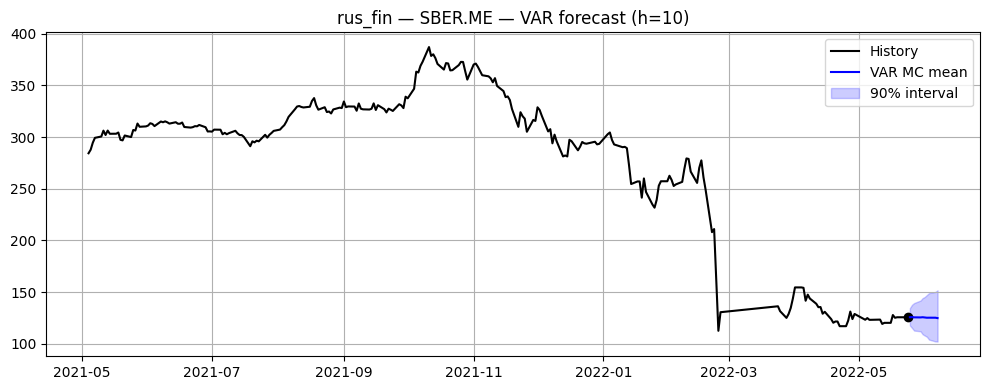

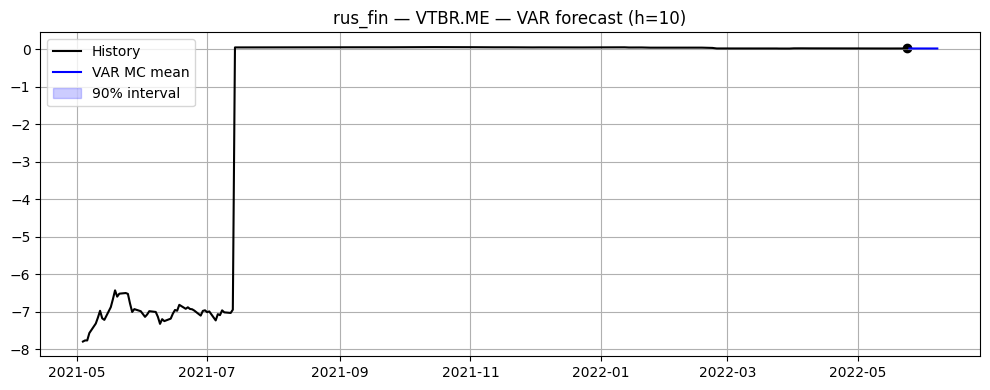

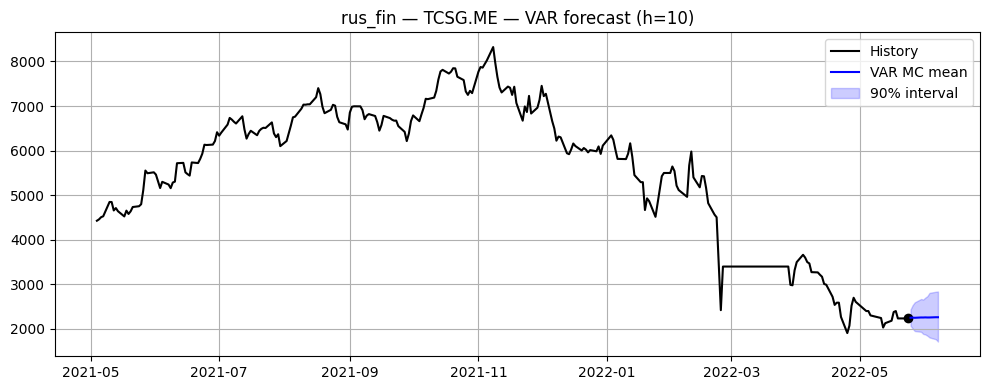

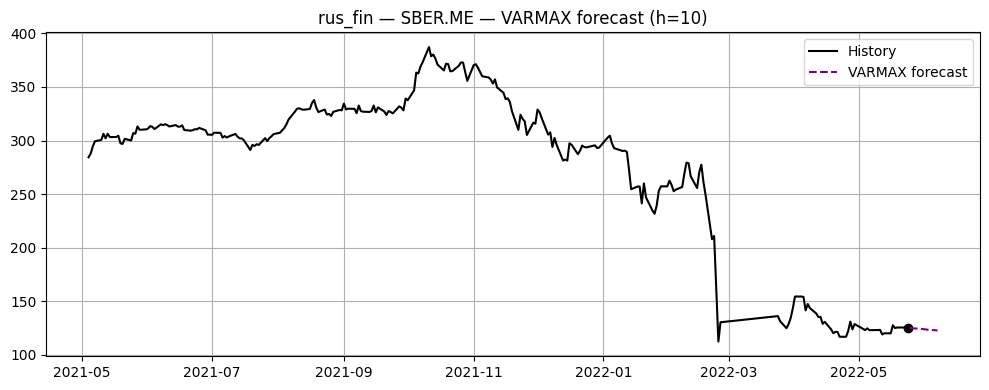

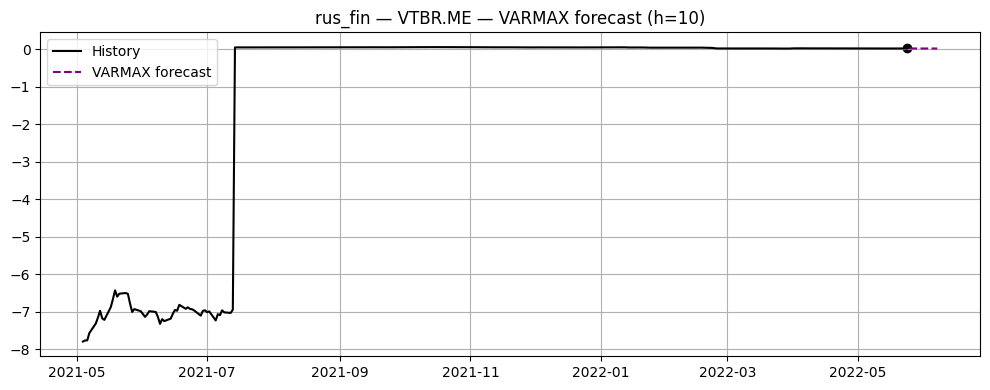

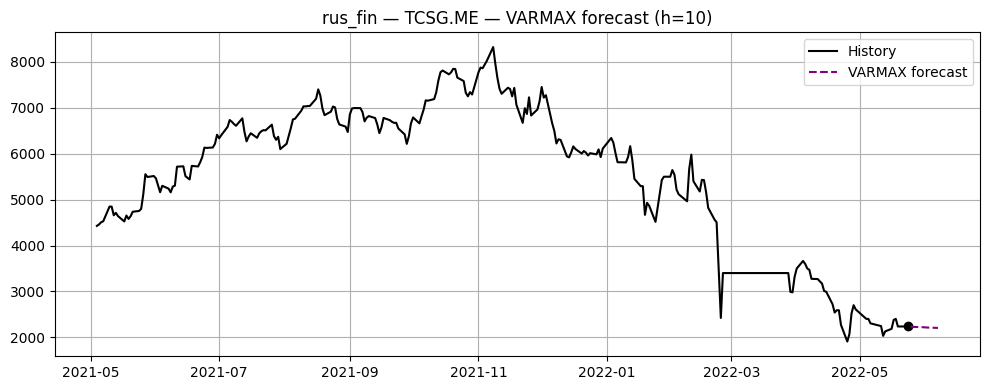

Sector rus_fin — horizon 20


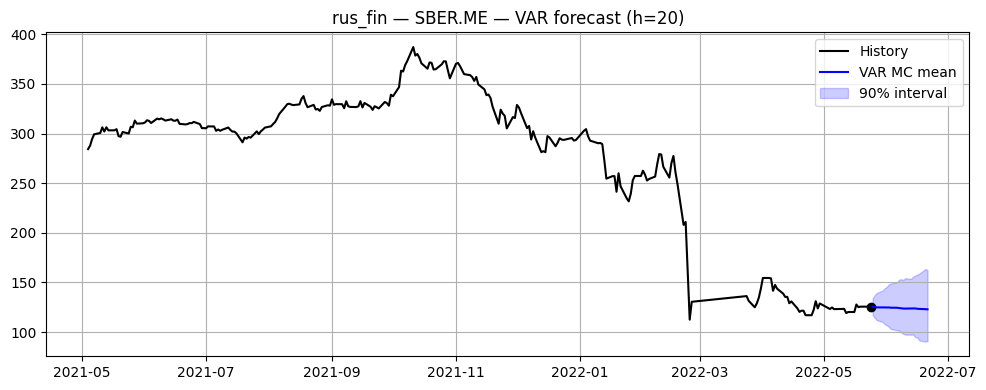

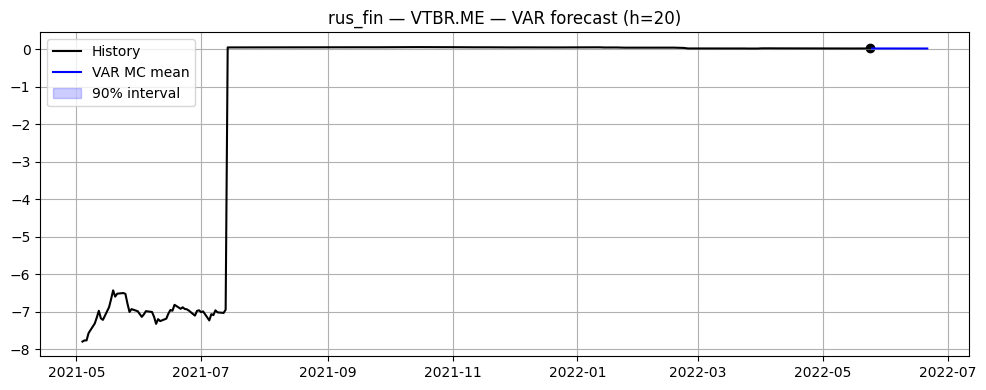

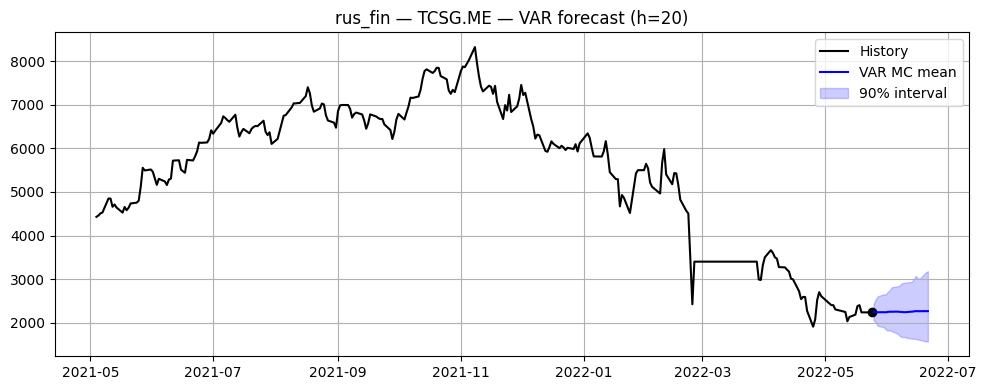

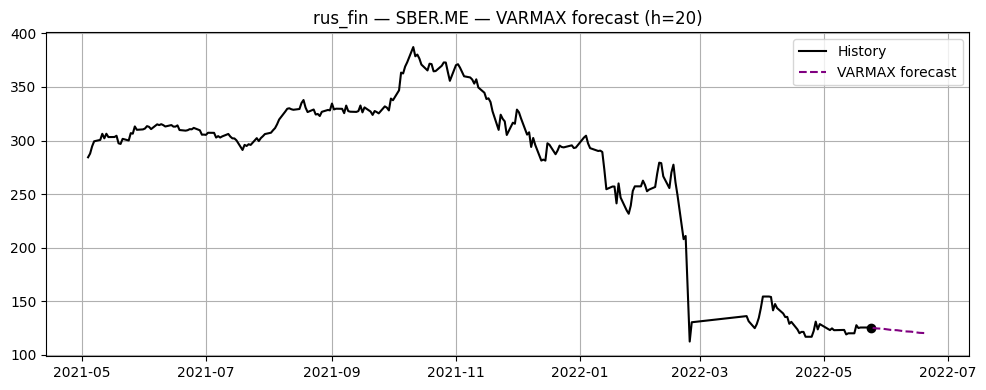

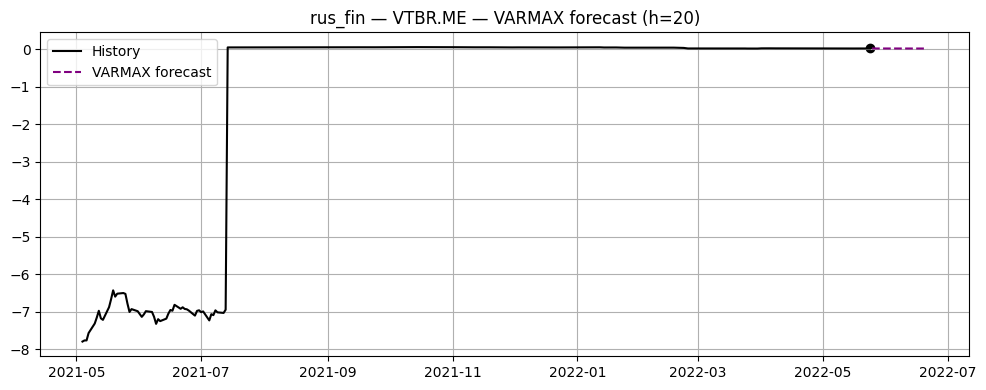

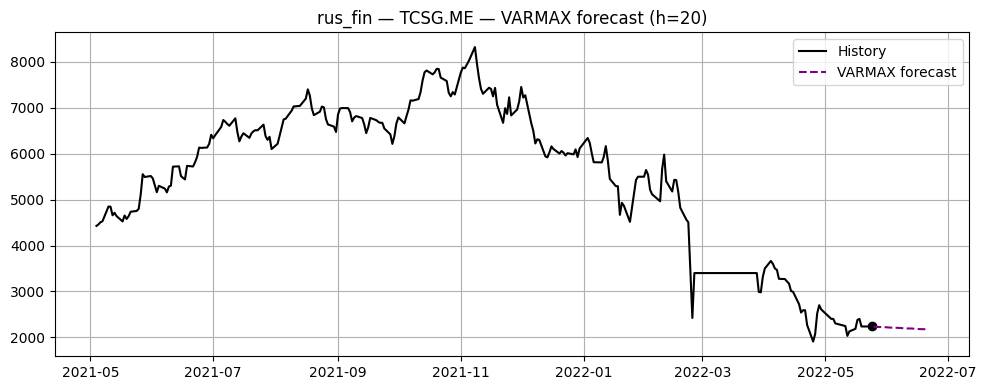

Sector rus_fin — horizon 100


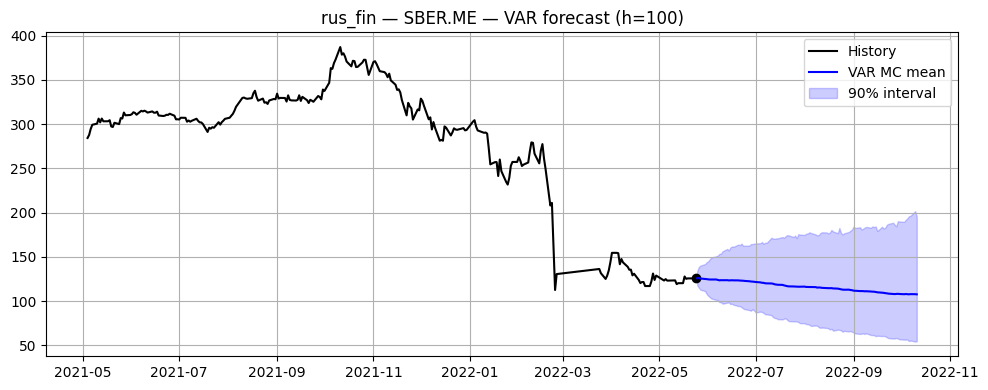

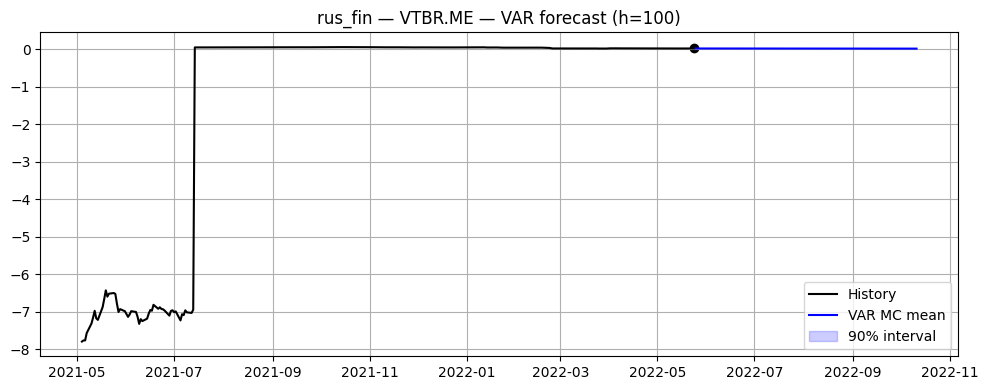

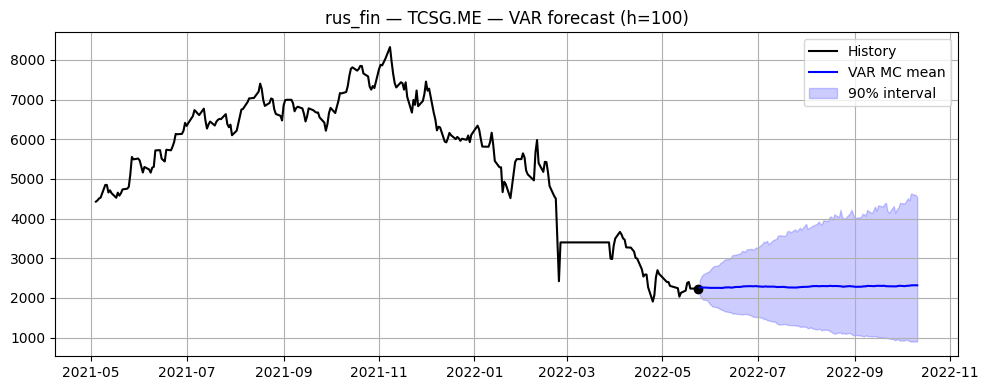

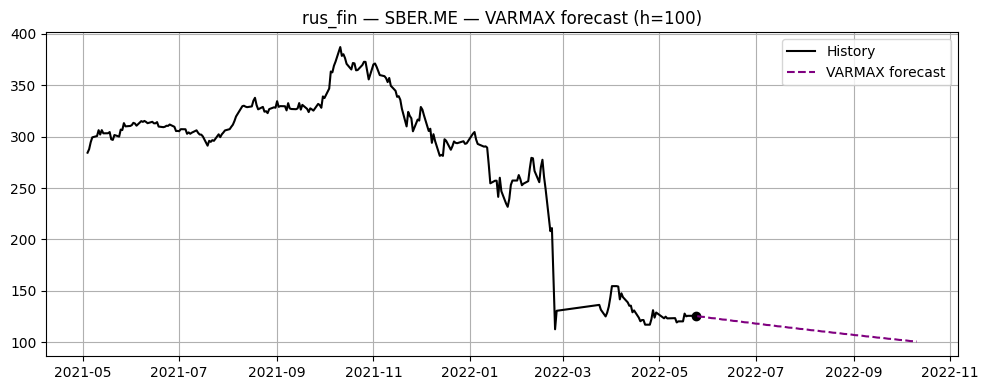

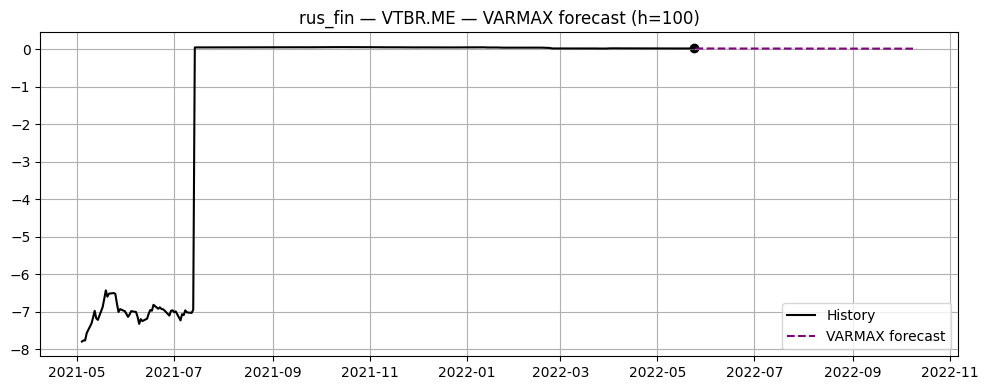

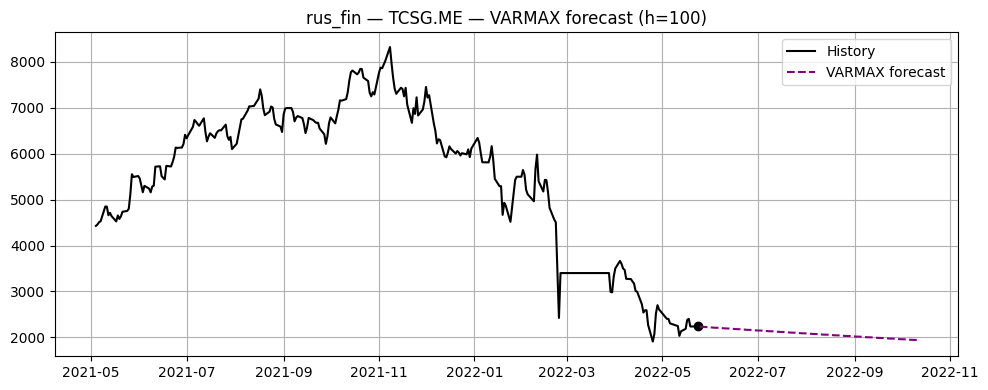

Sector rus_oil — horizon 10


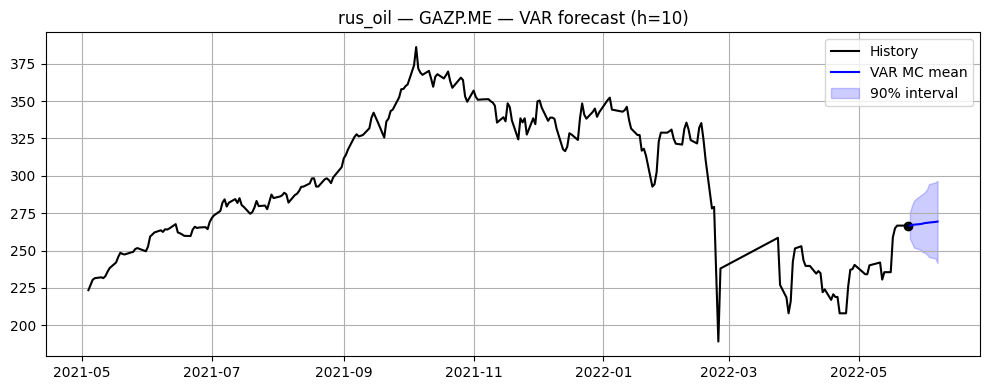

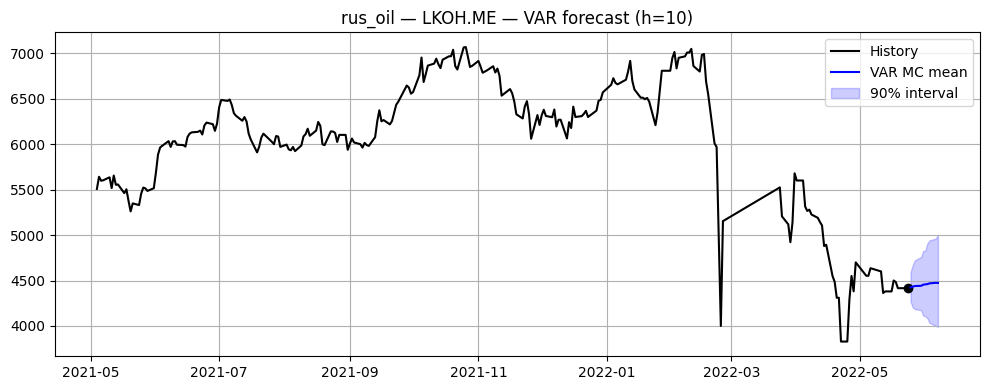

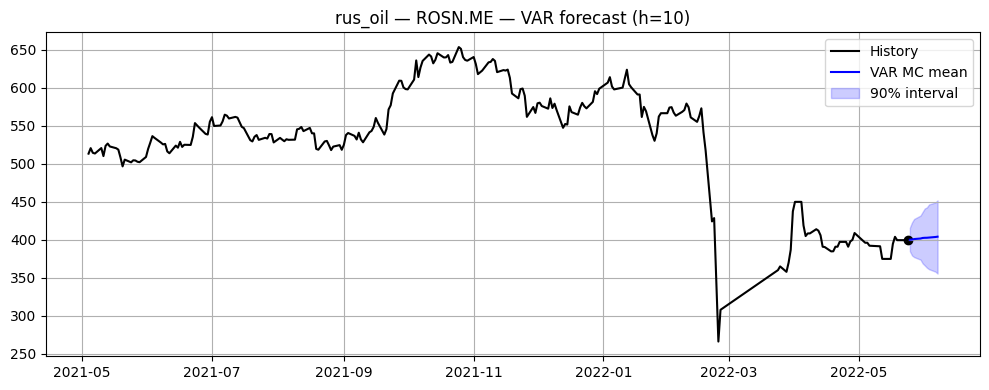

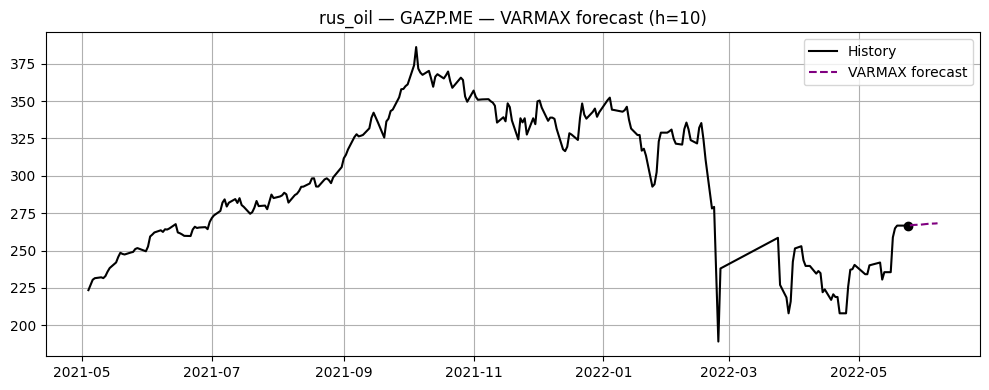

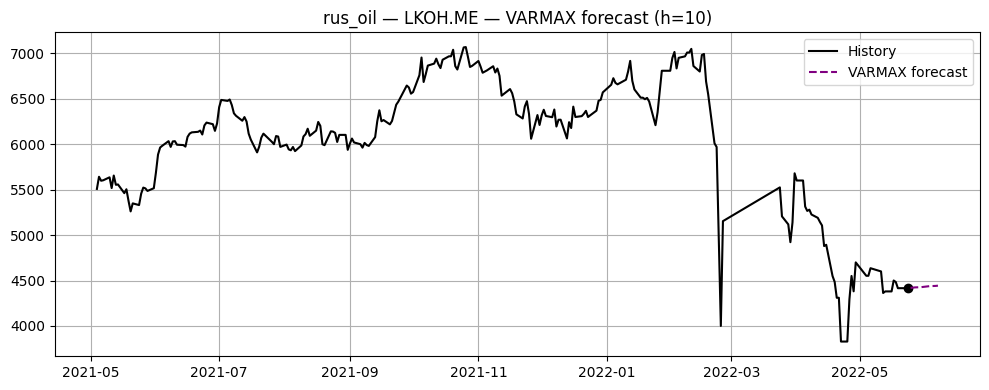

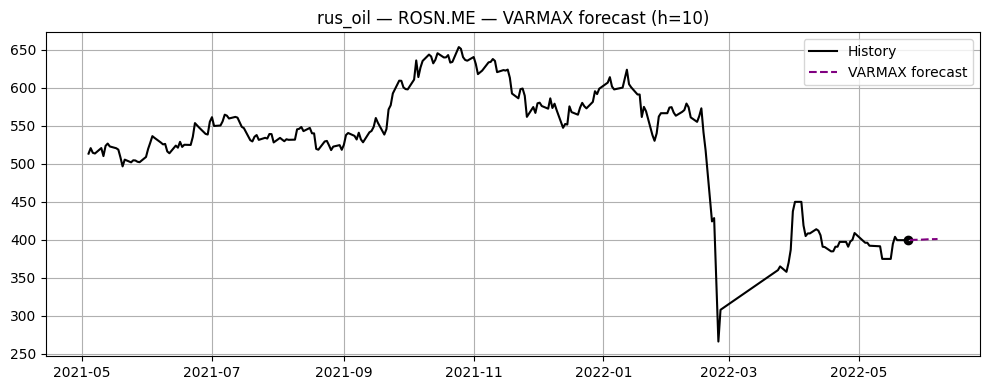

Sector rus_oil — horizon 20


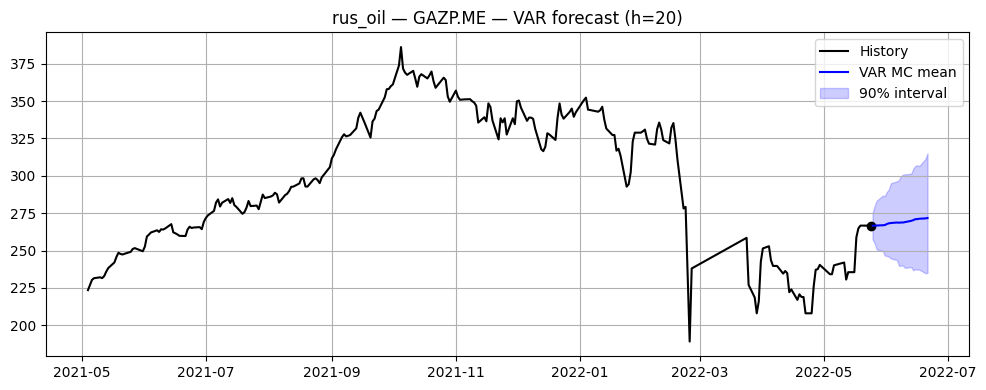

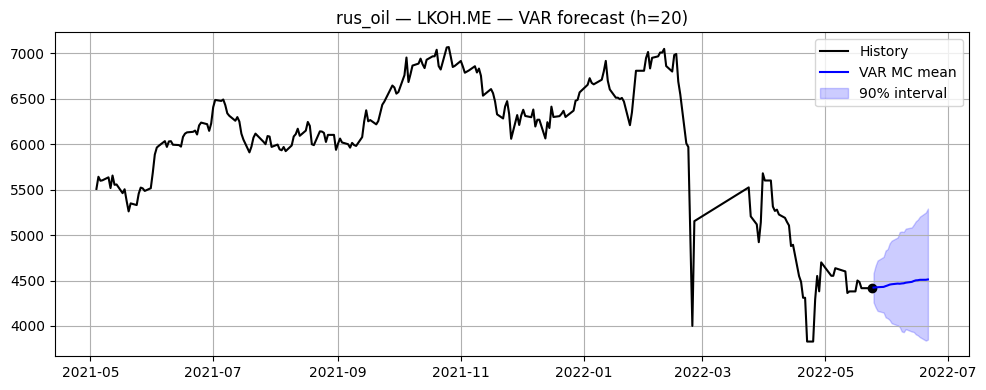

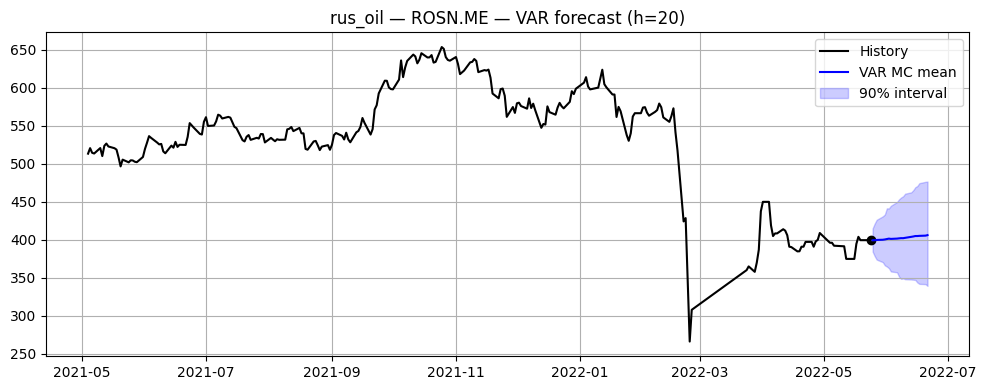

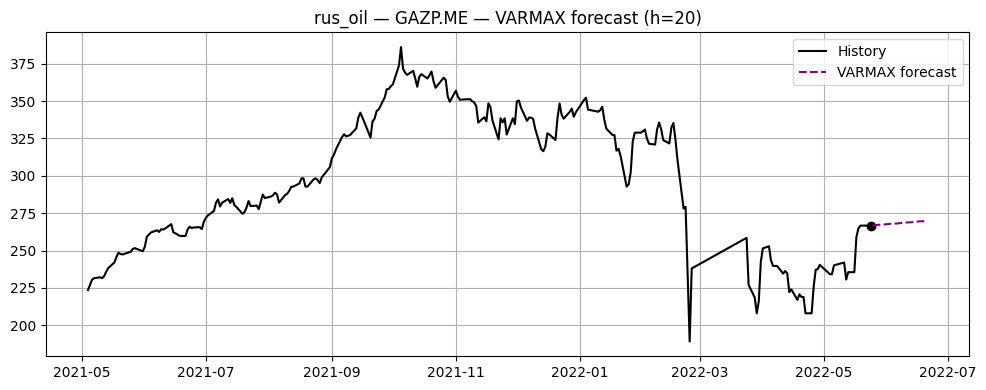

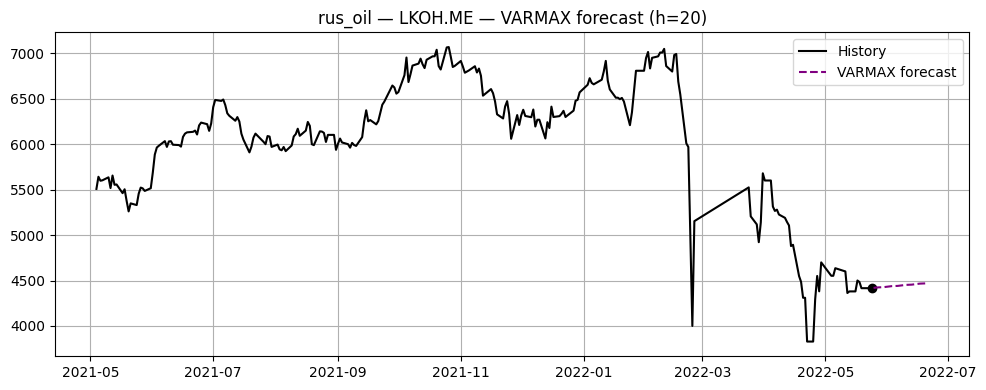

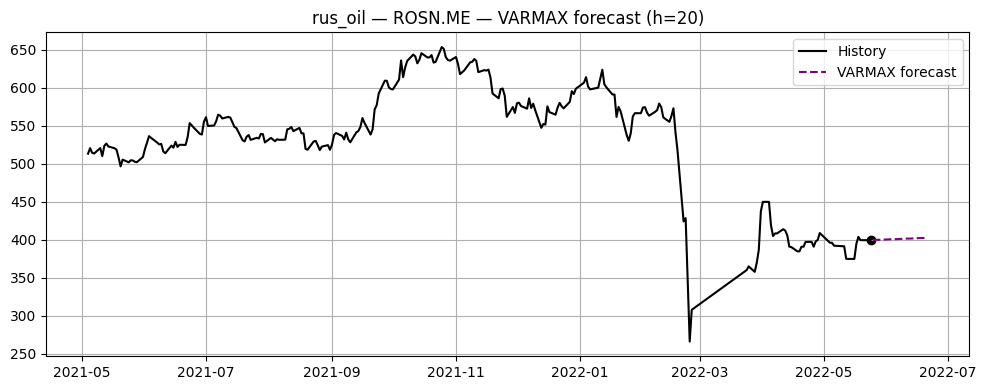

Sector rus_oil — horizon 100


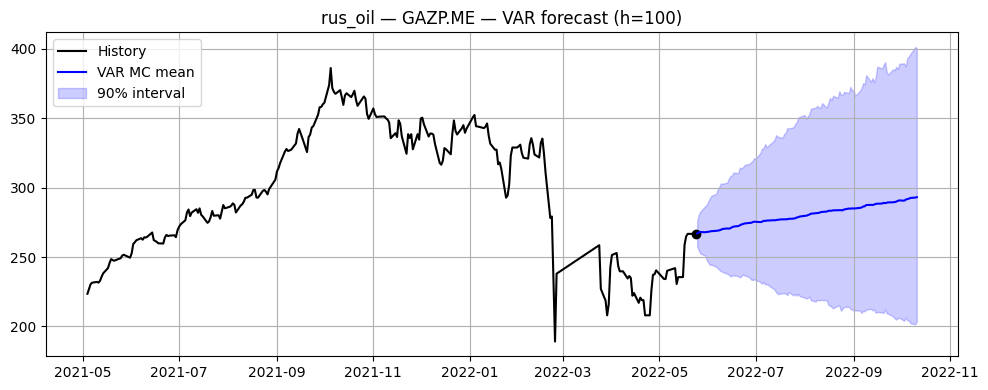

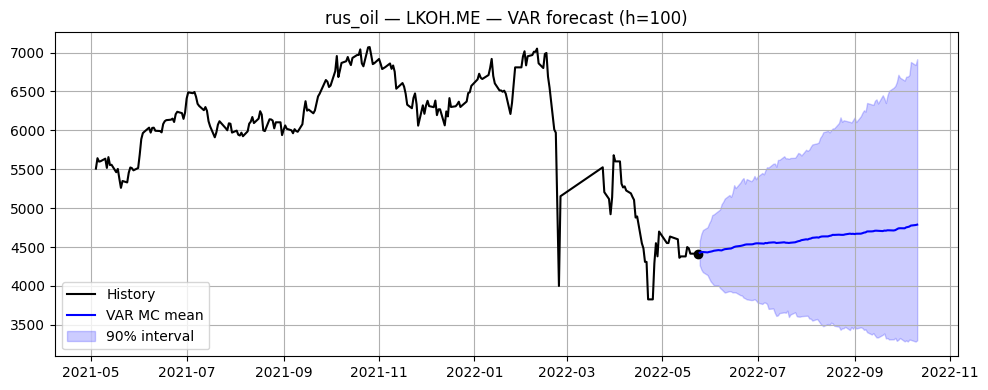

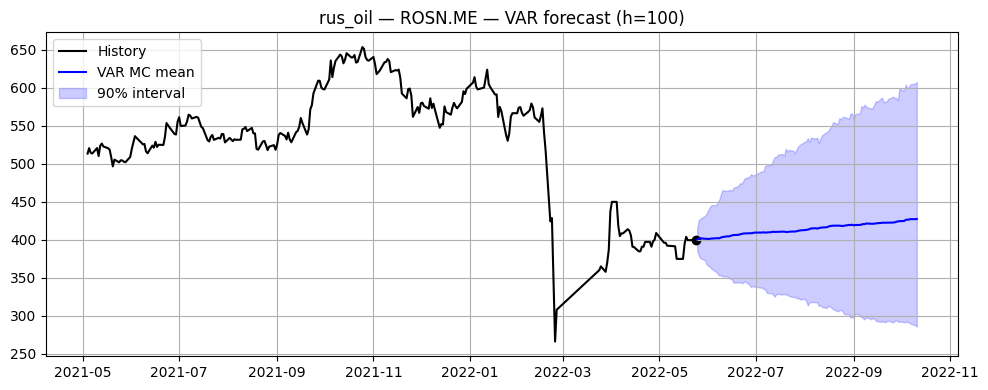

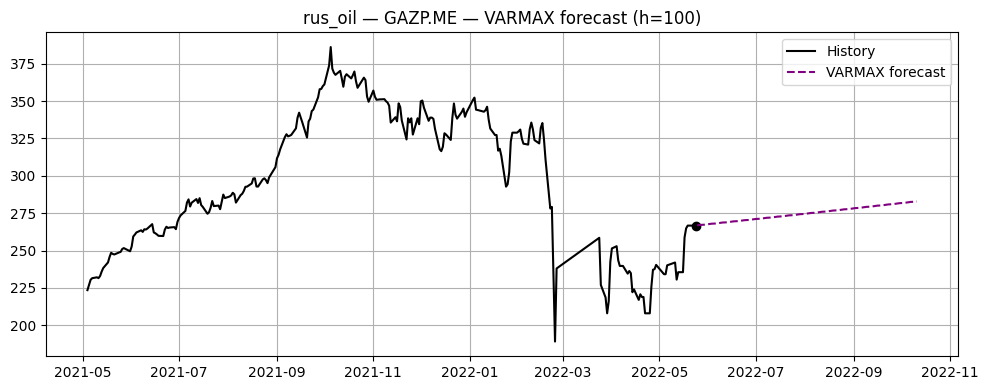

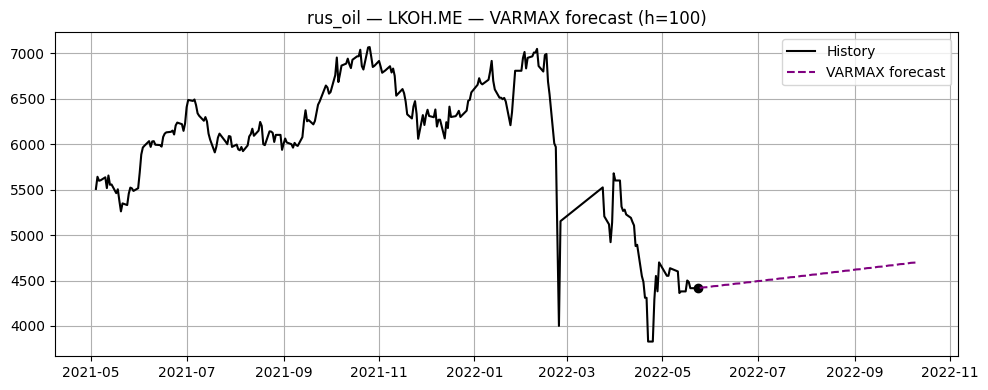

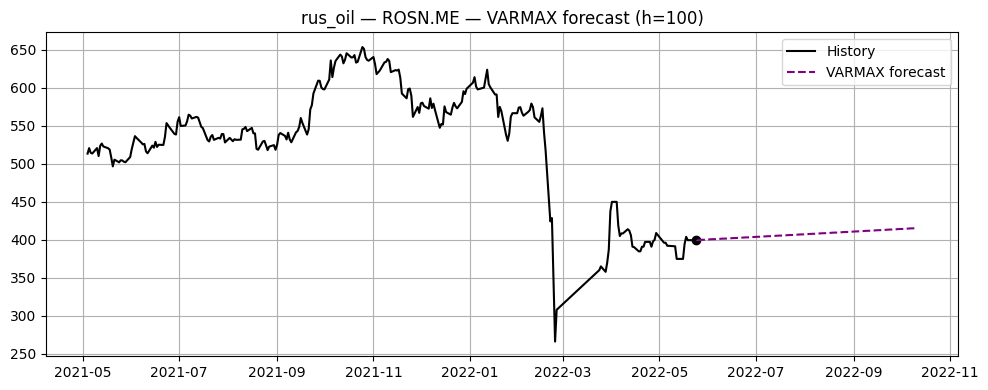

Sector rus_met — horizon 10


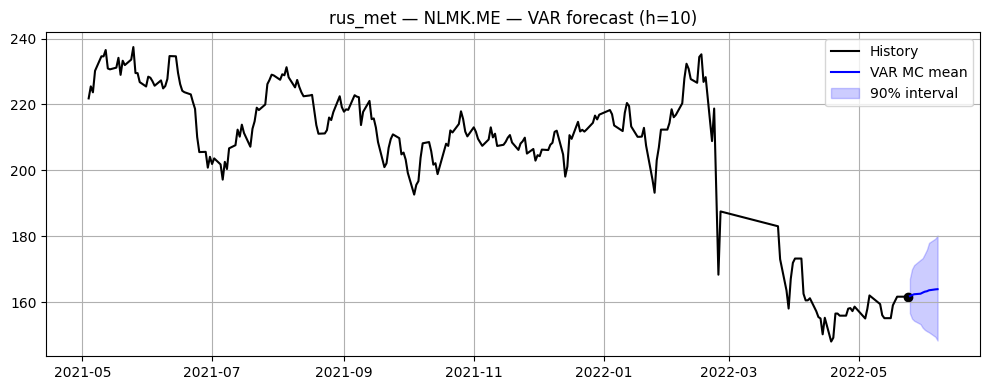

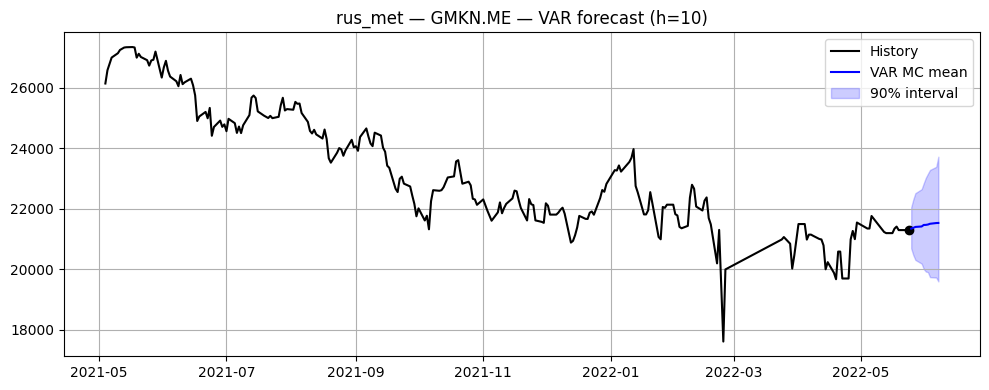

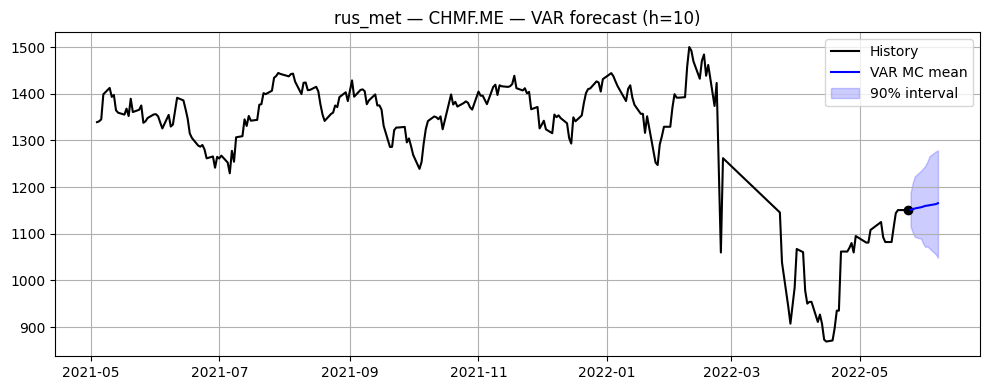

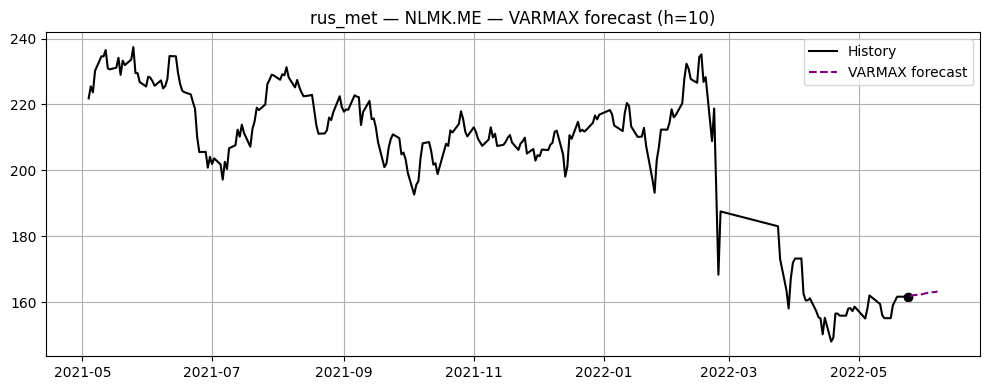

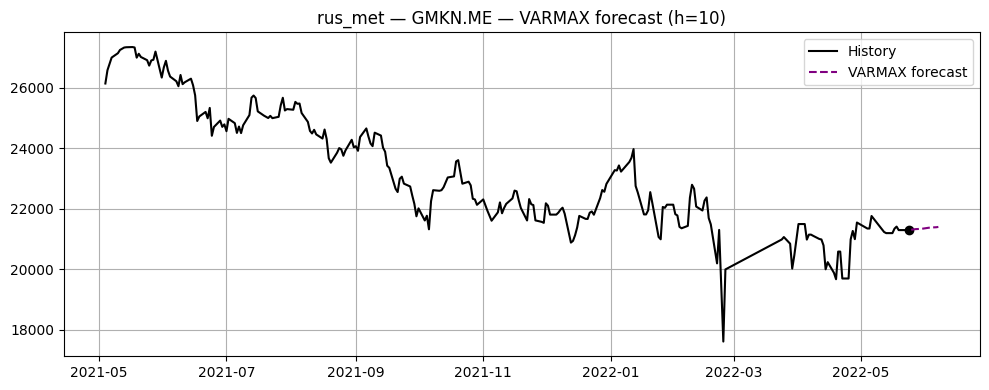

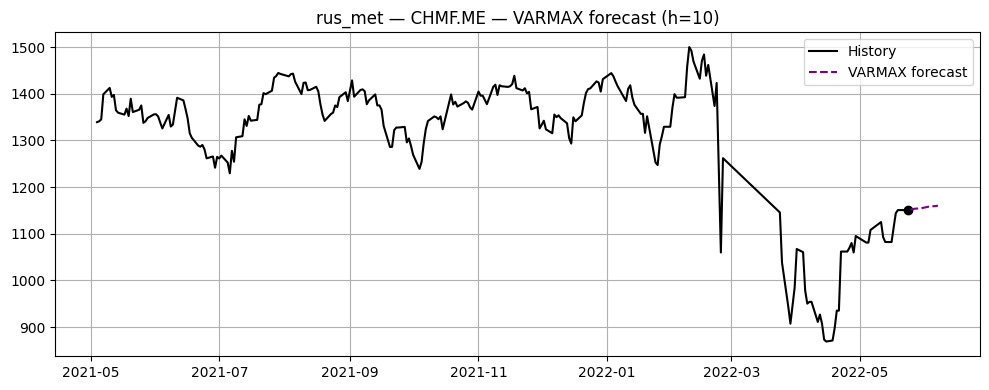

Sector rus_met — horizon 20


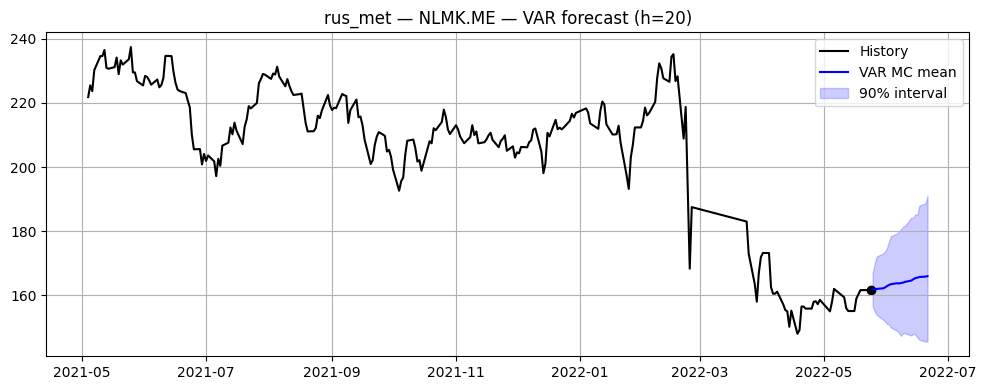

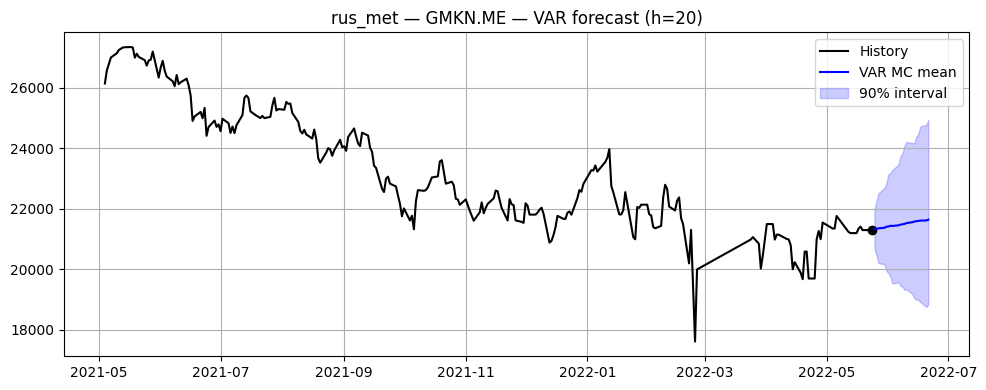

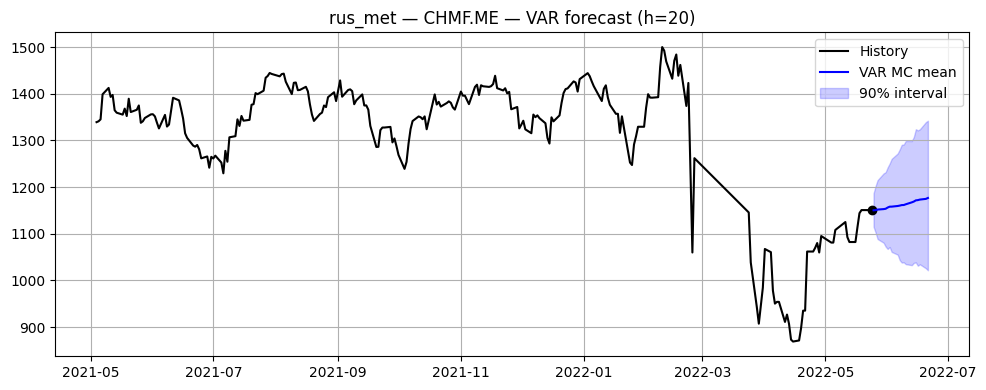

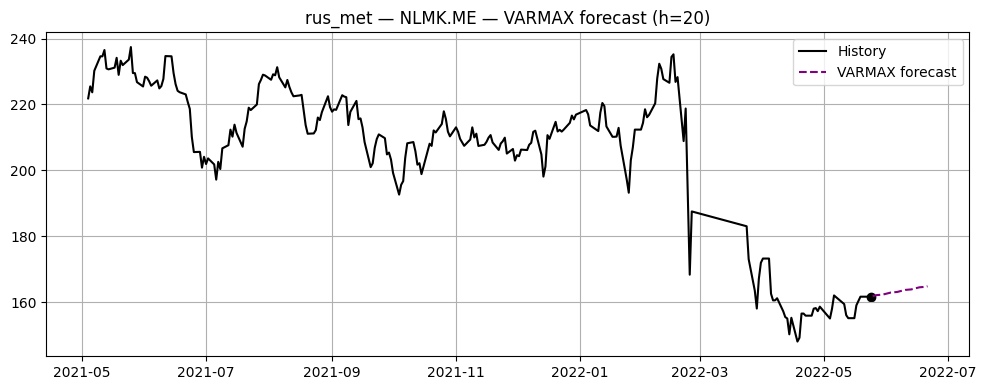

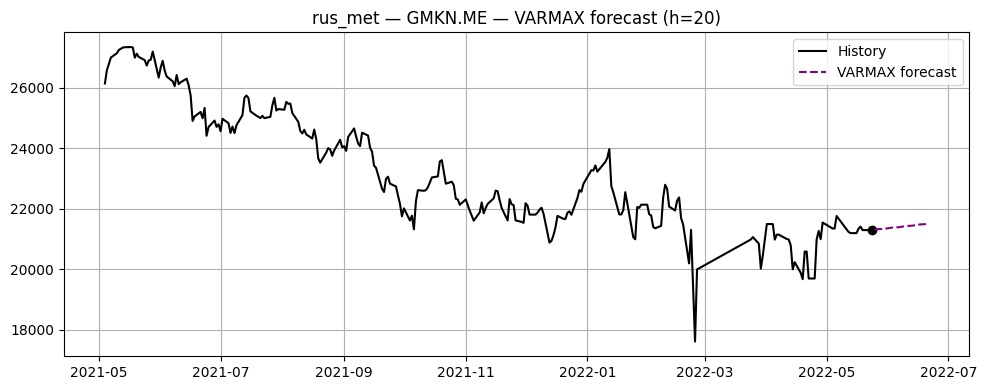

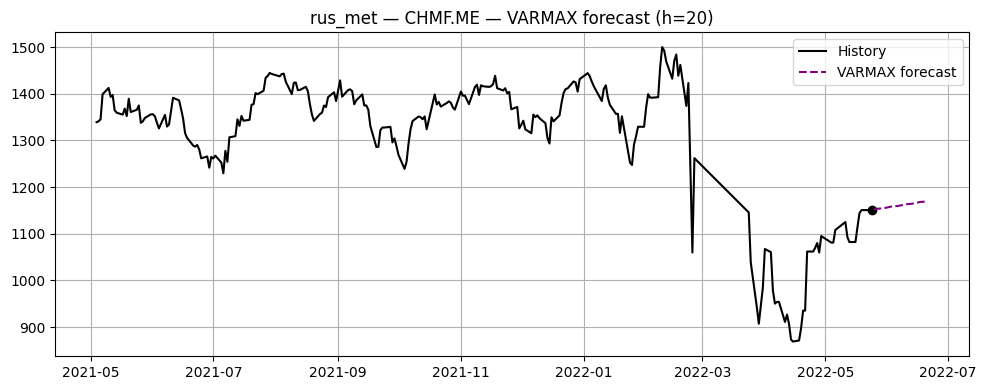

Sector rus_met — horizon 100


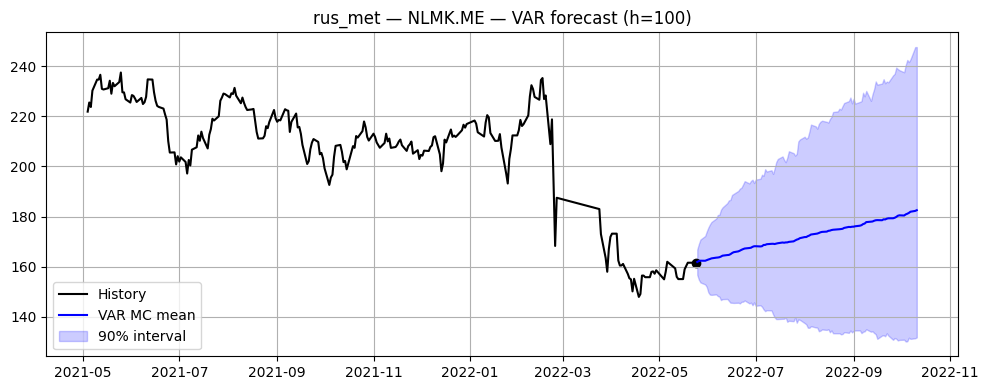

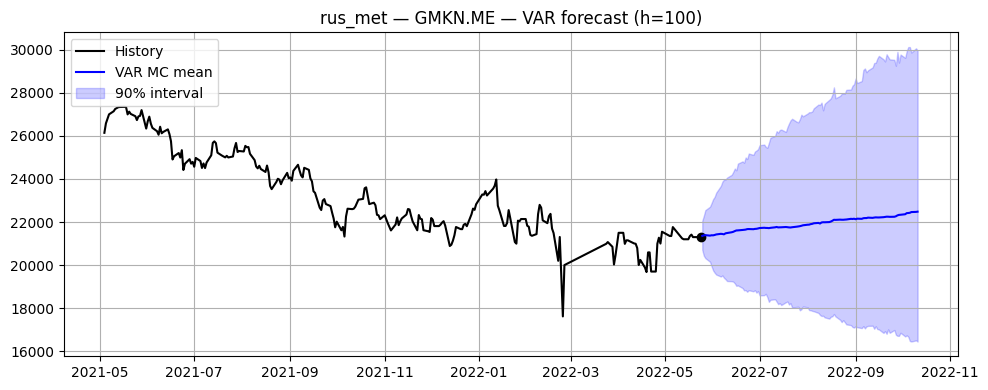

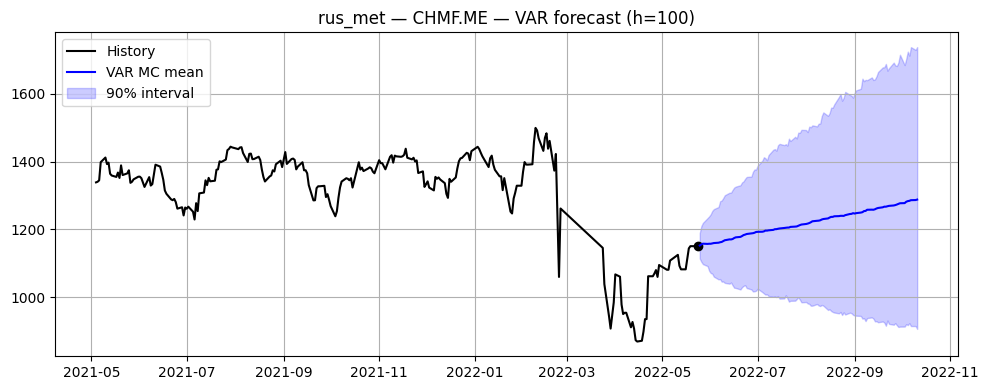

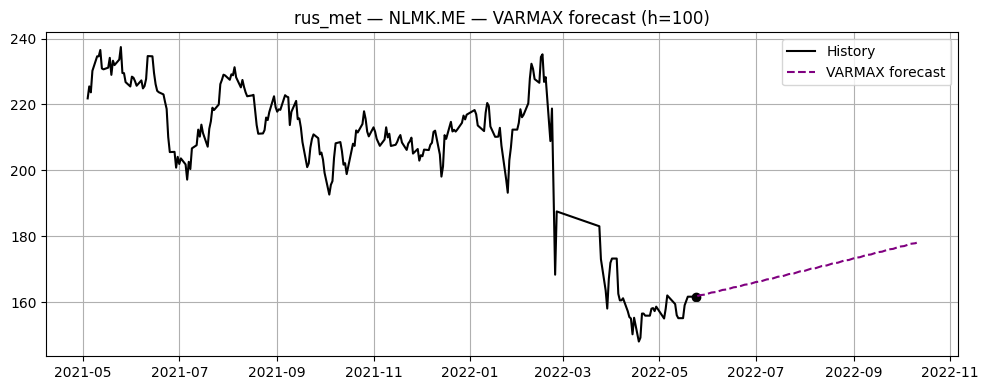

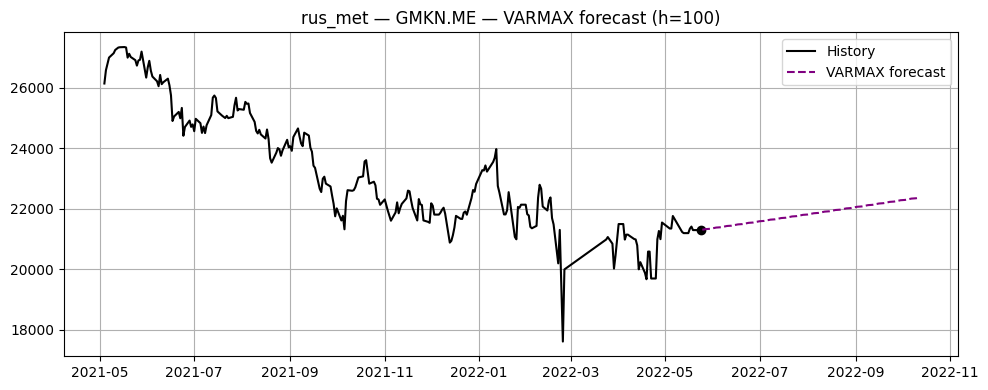

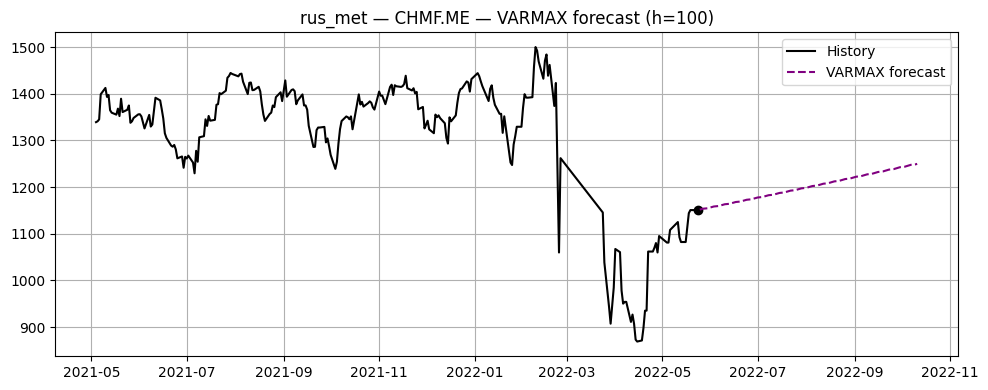

Sector us_tech — horizon 10


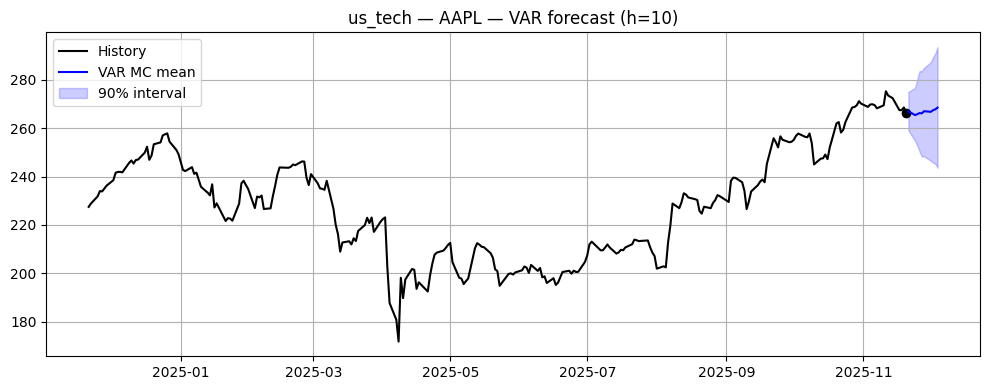

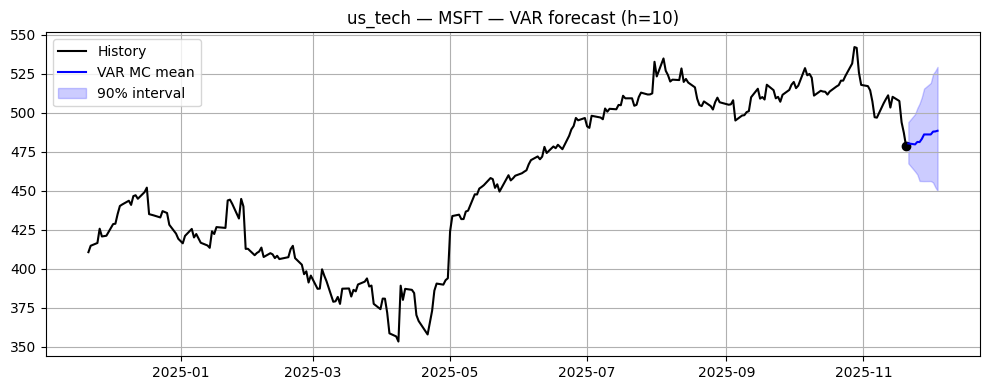

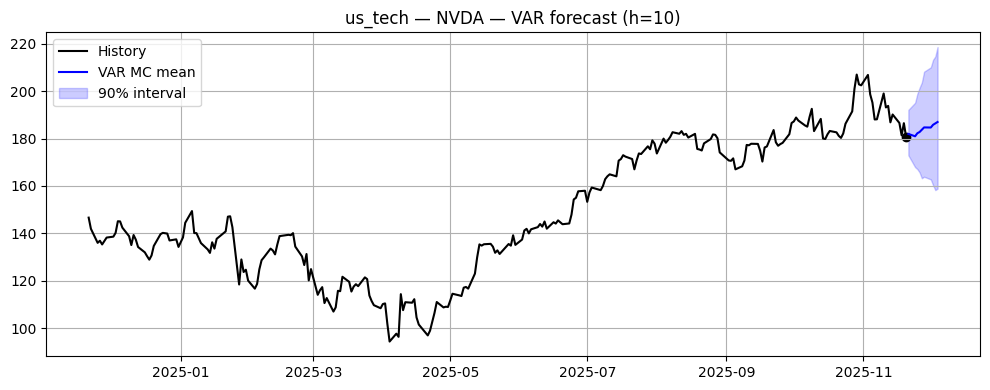

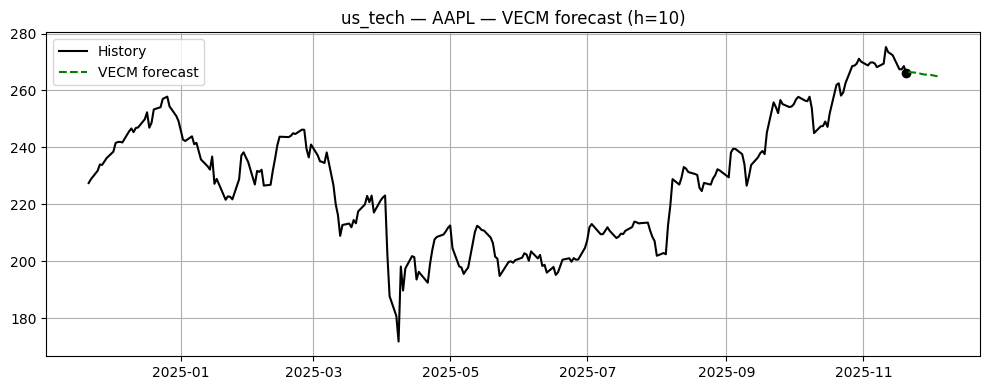

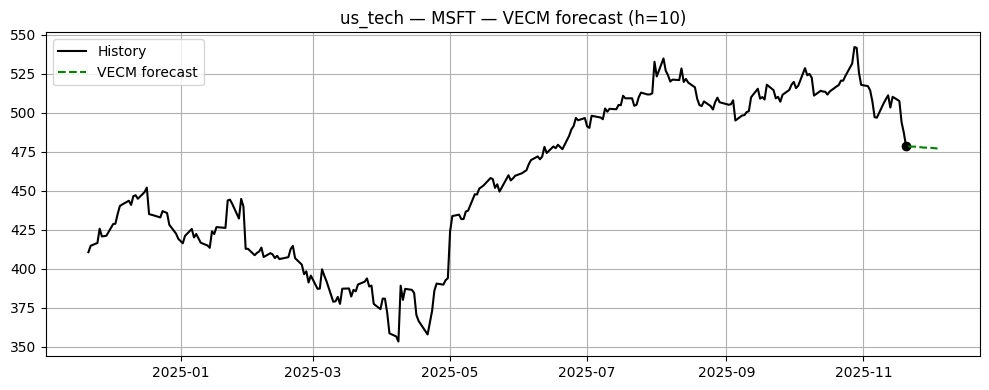

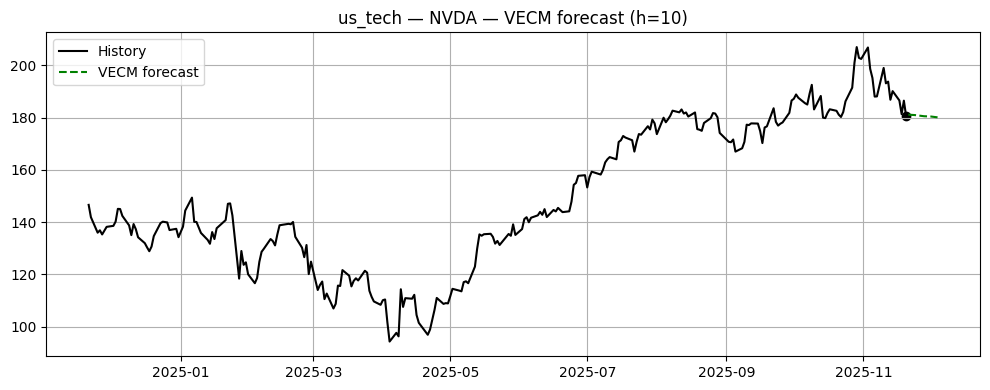

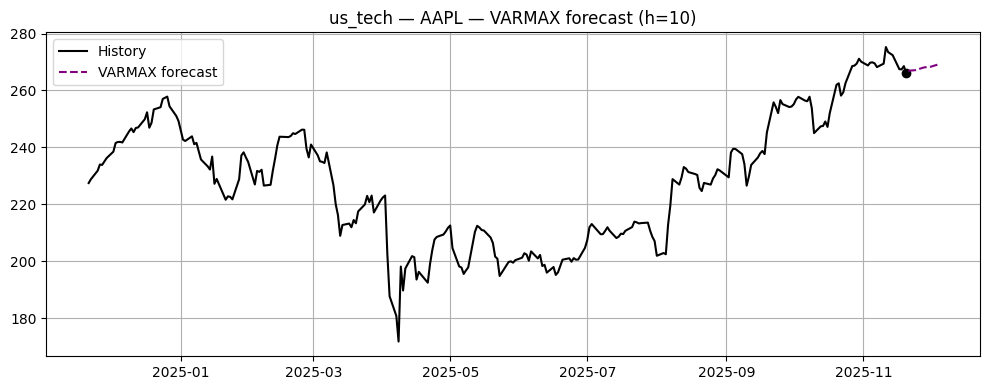

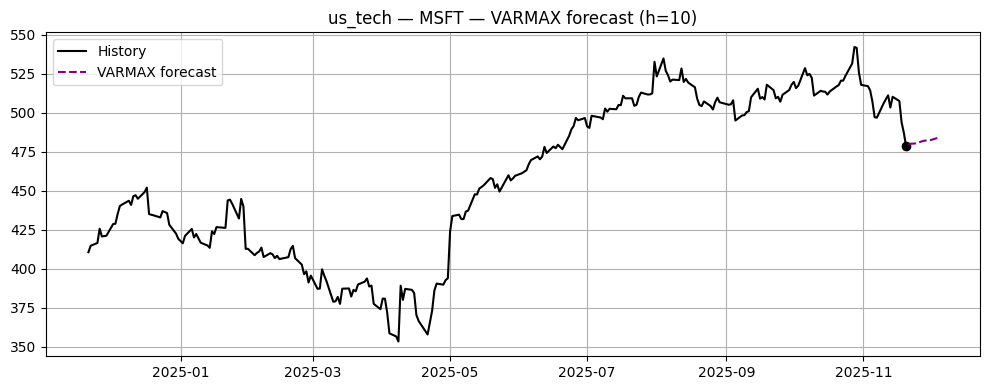

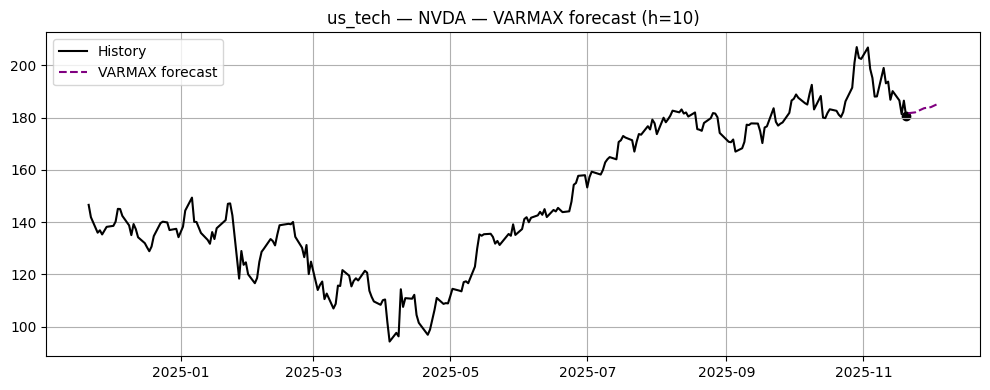

Sector us_tech — horizon 20


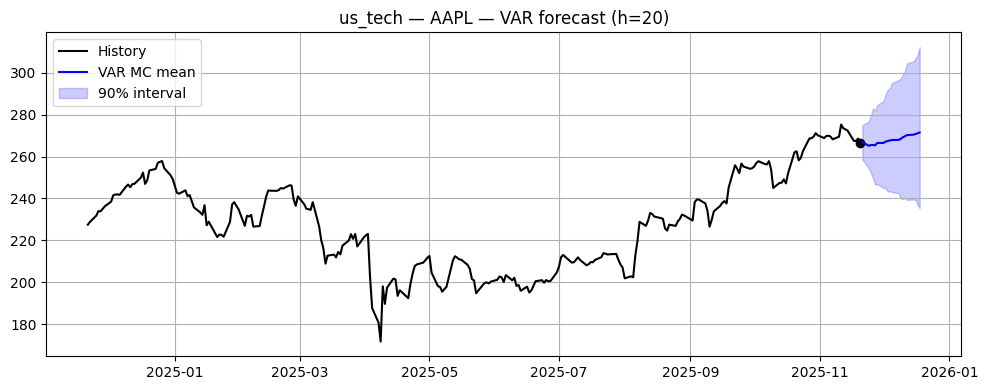

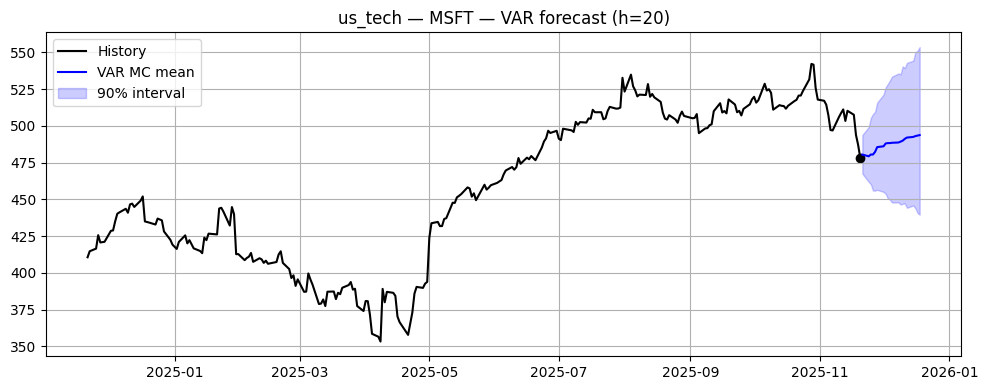

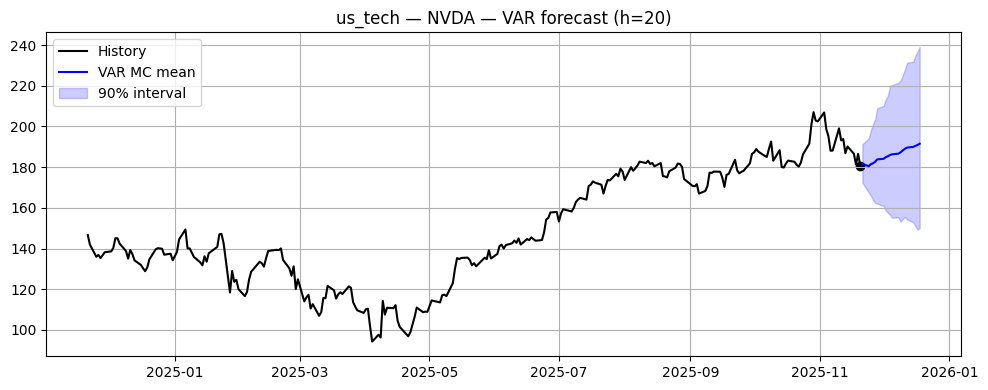

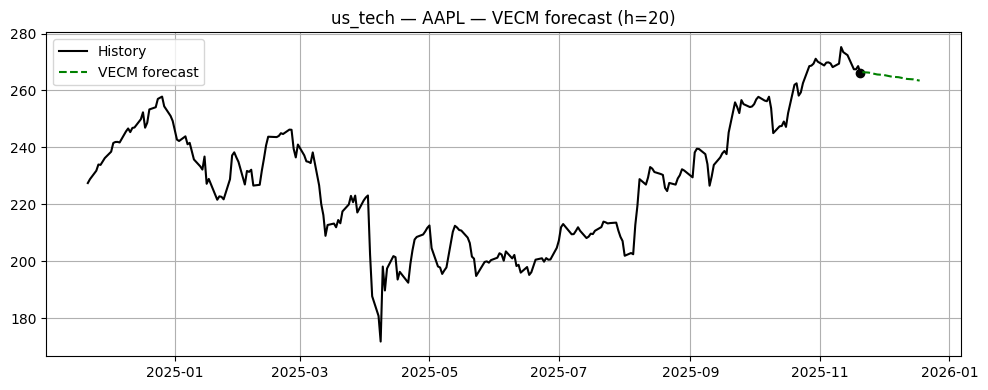

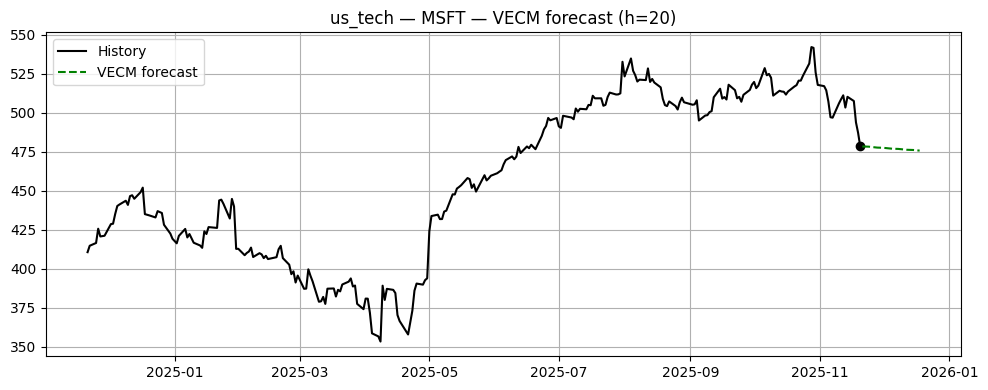

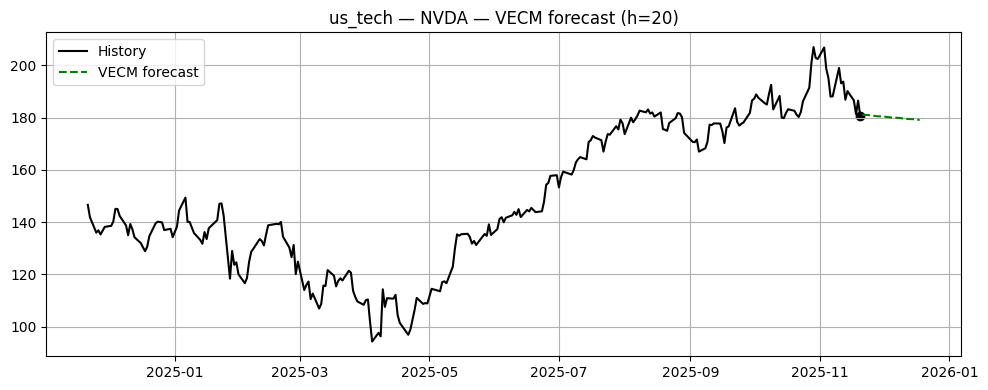

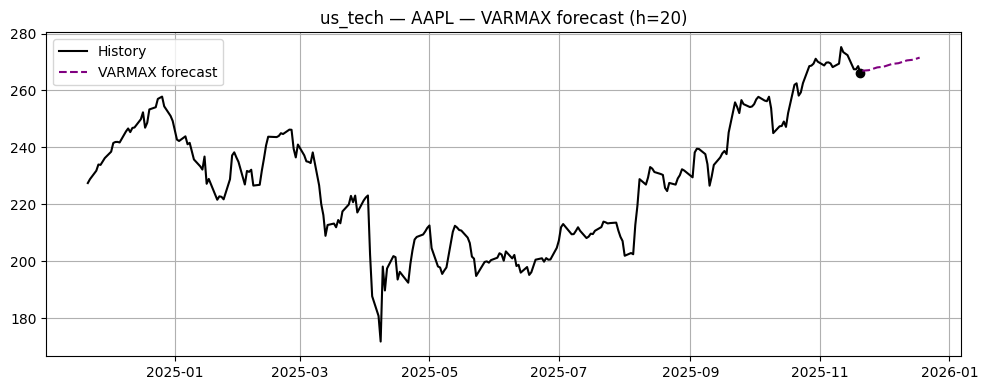

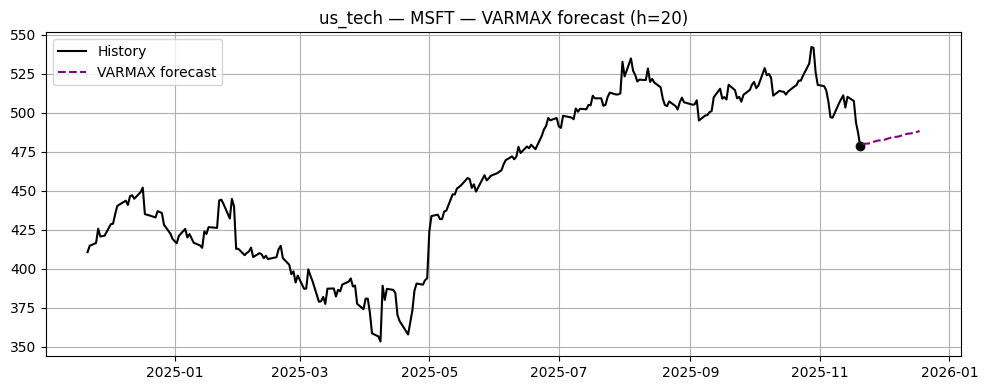

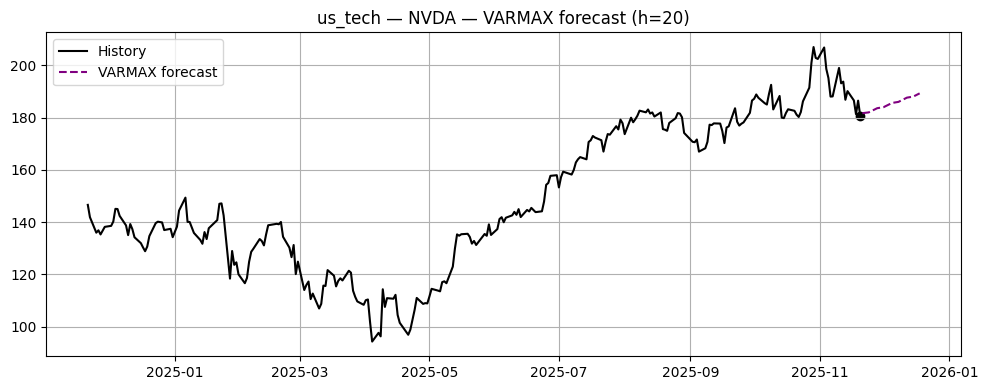

Sector us_tech — horizon 100


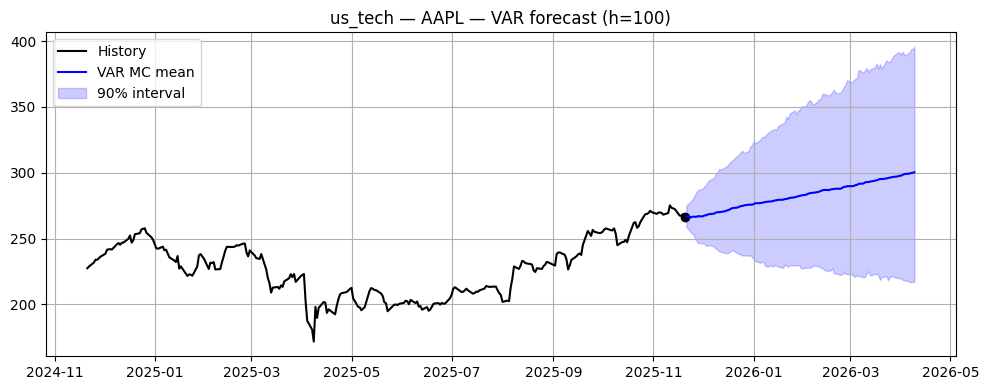

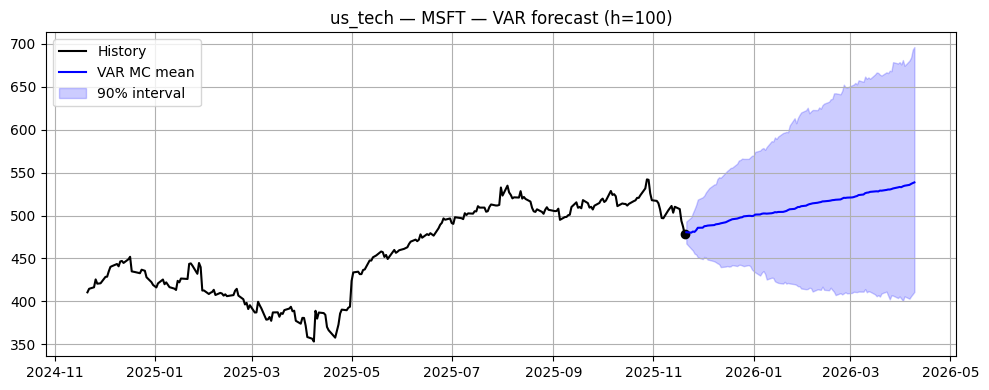

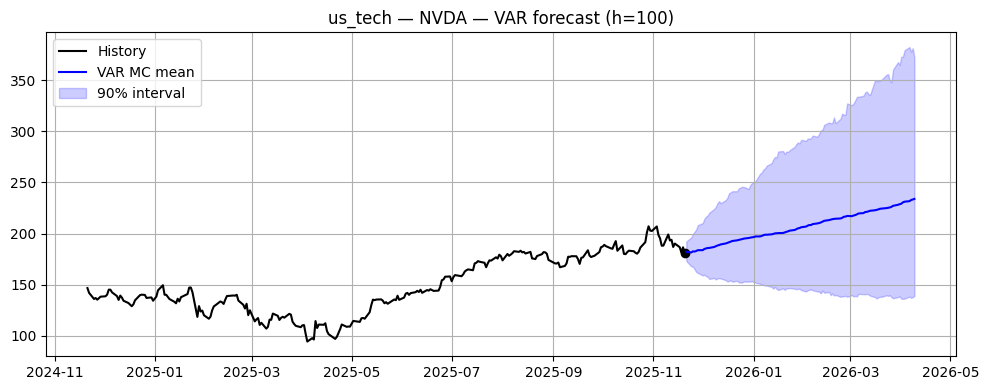

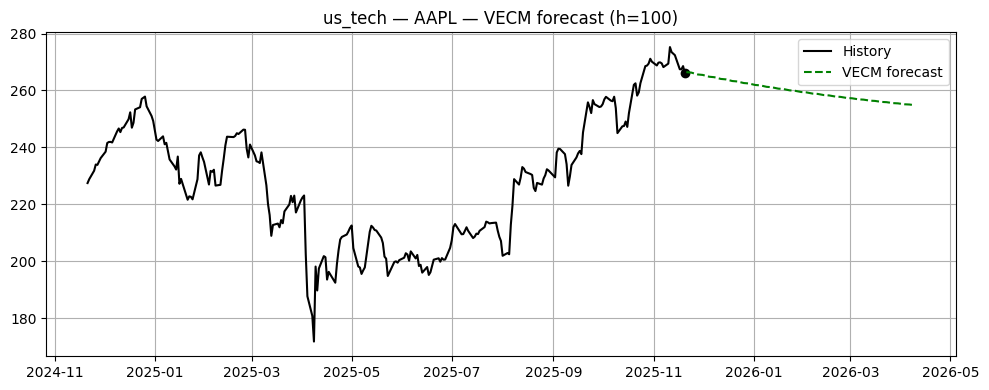

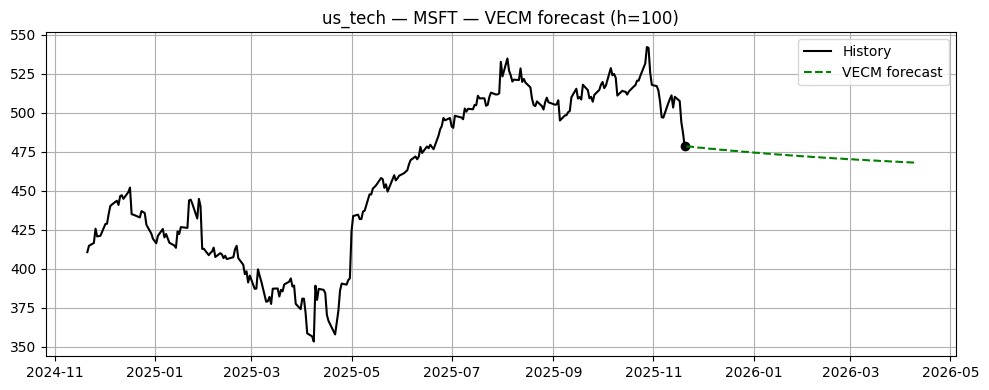

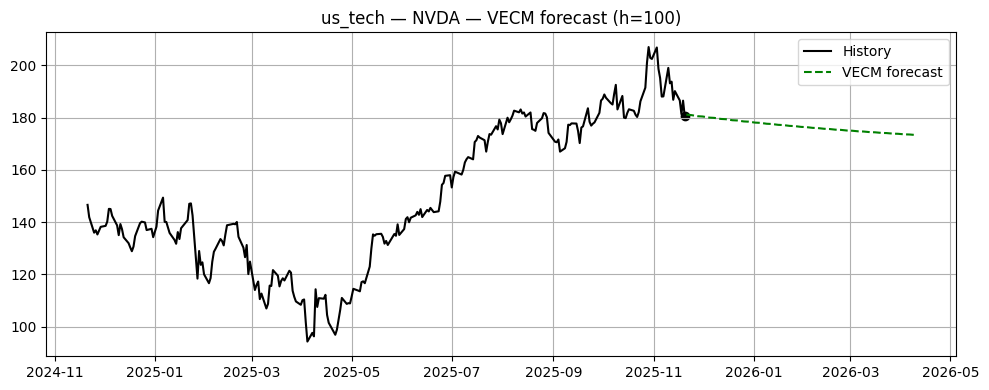

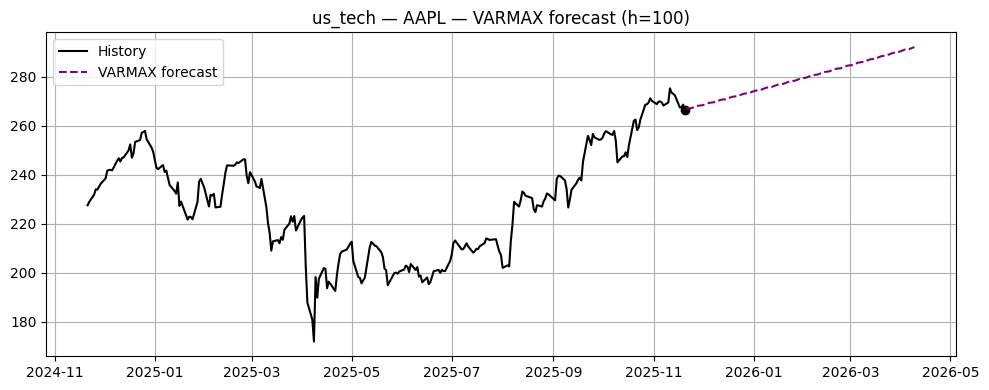

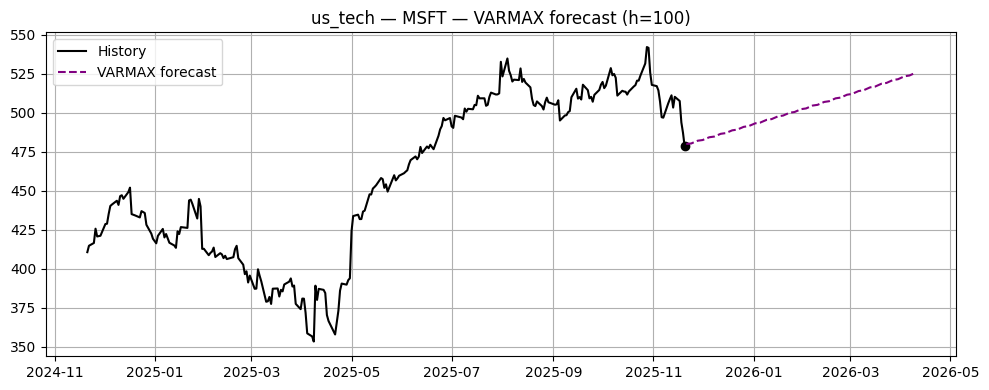

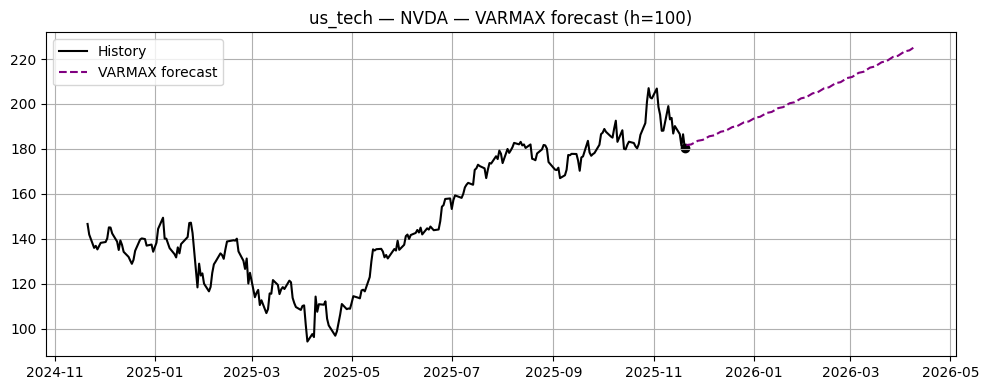

Sector us_retail — horizon 10


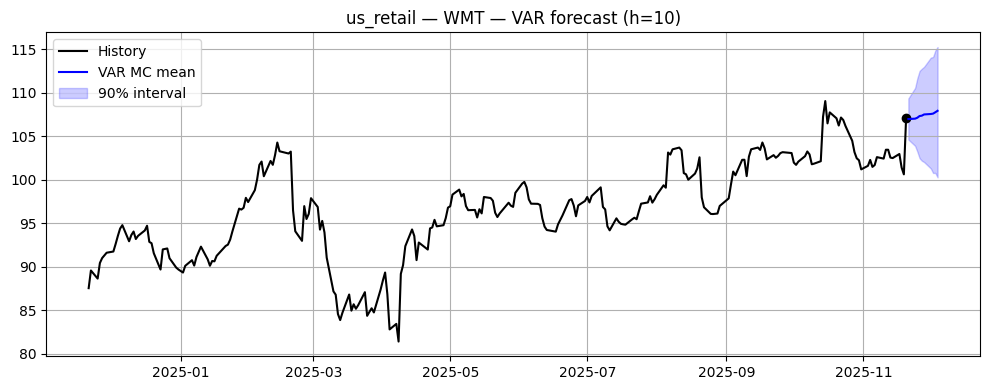

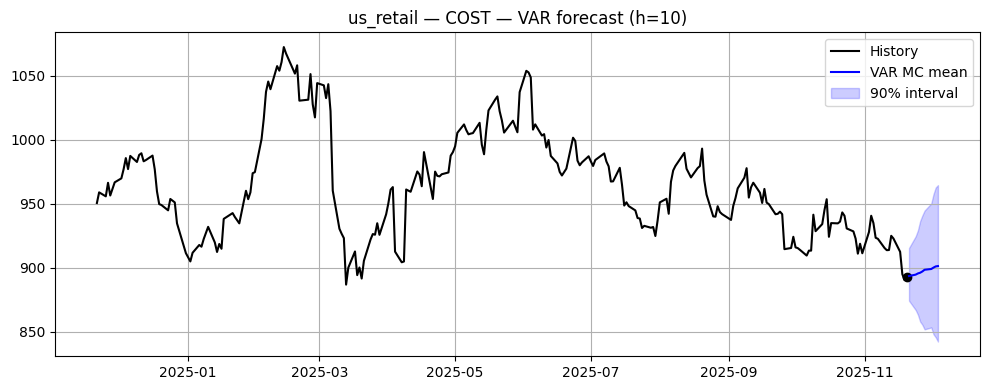

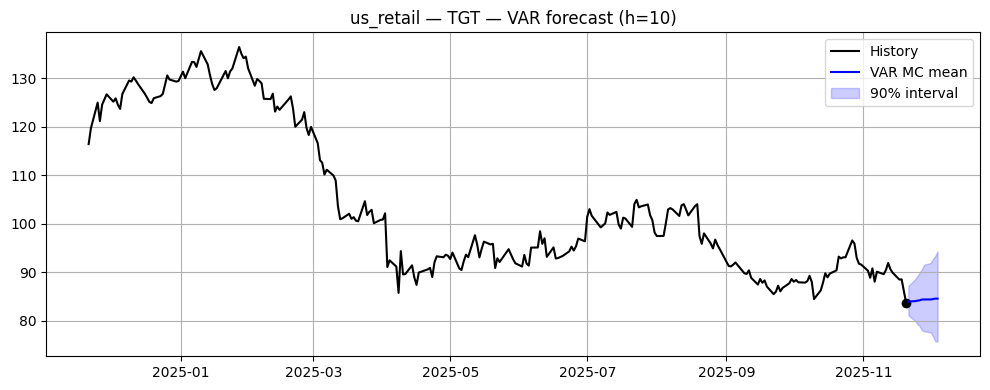

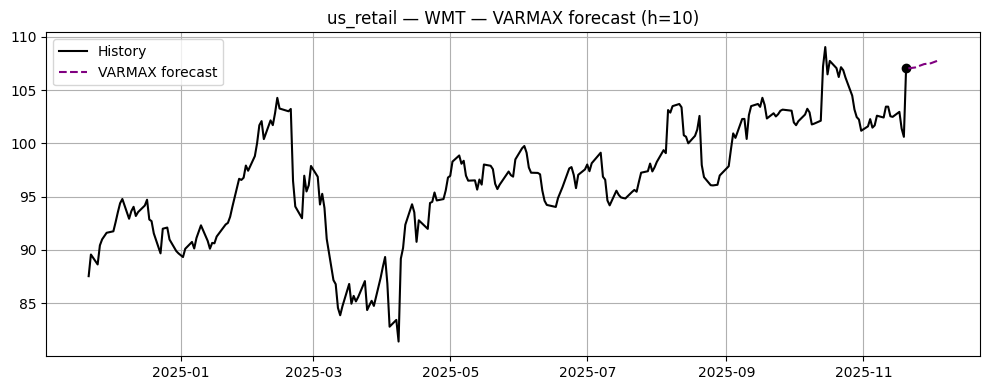

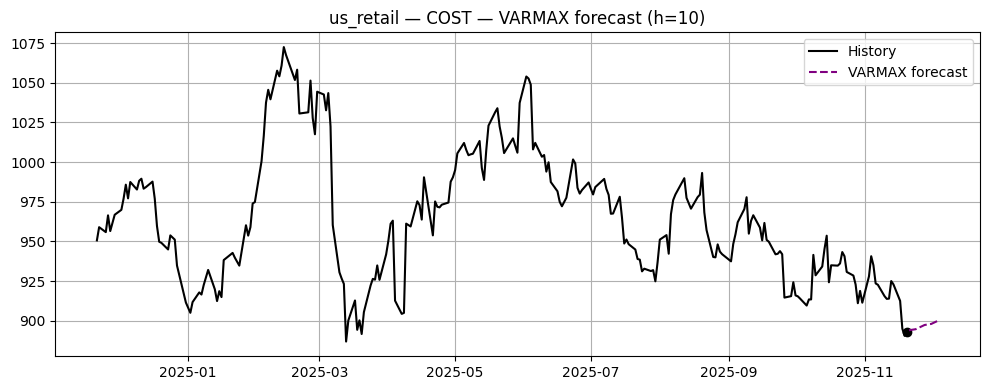

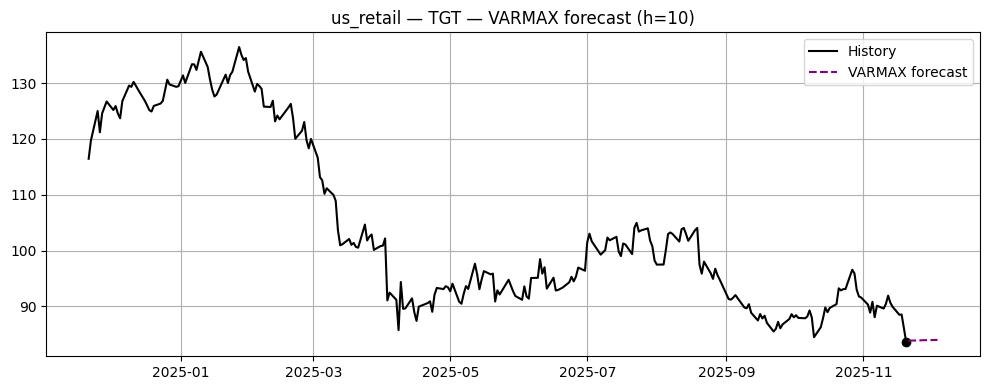

Sector us_retail — horizon 20


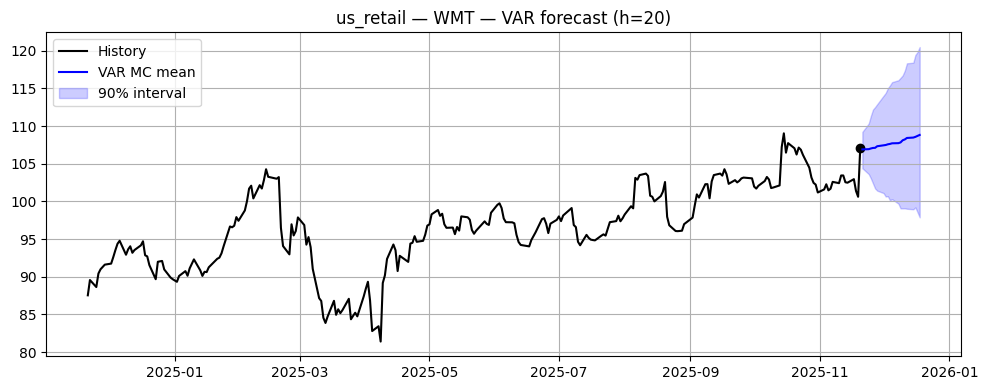

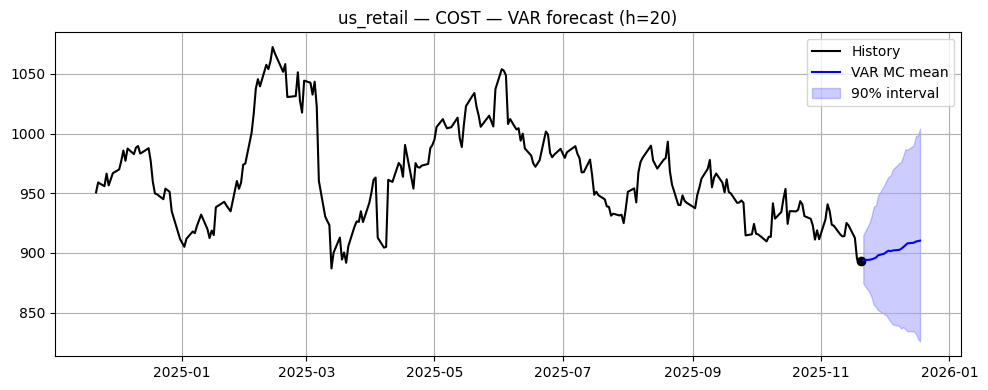

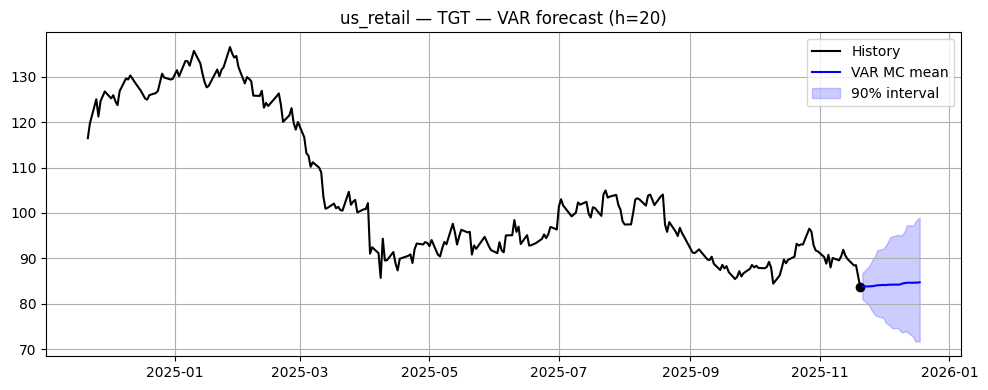

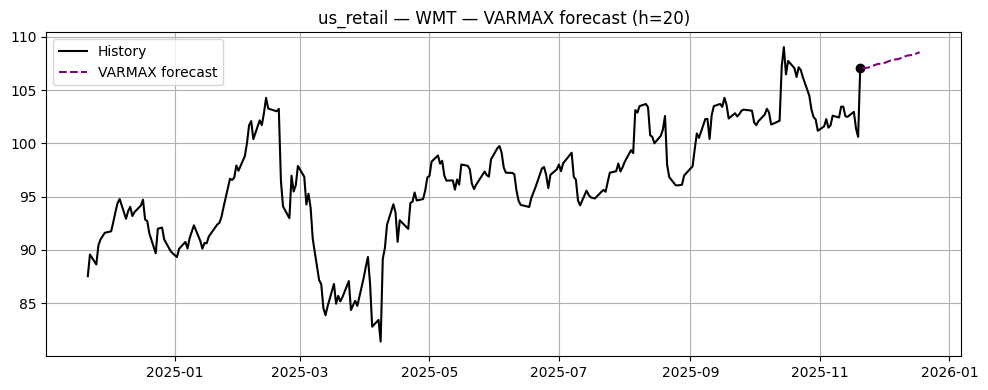

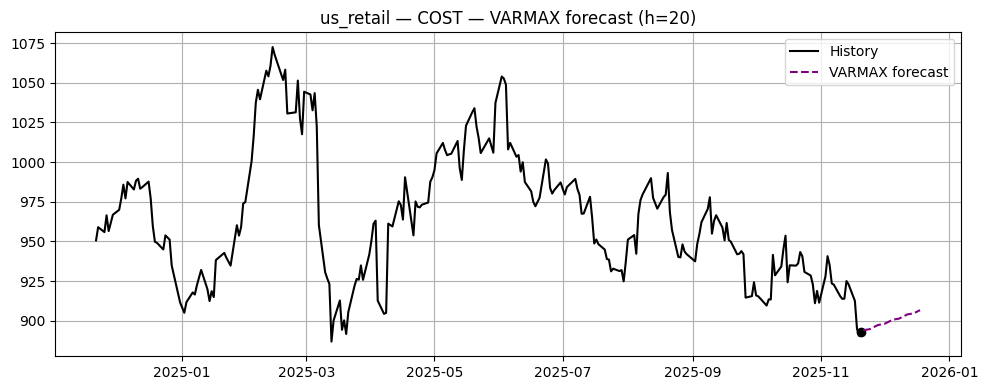

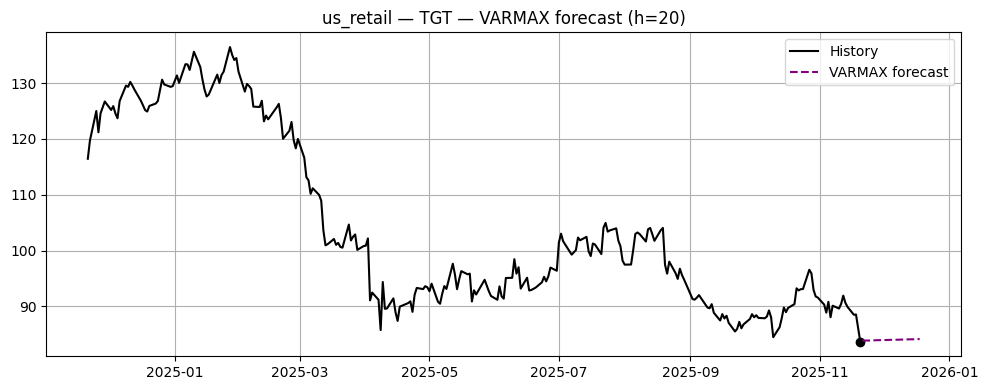

Sector us_retail — horizon 100


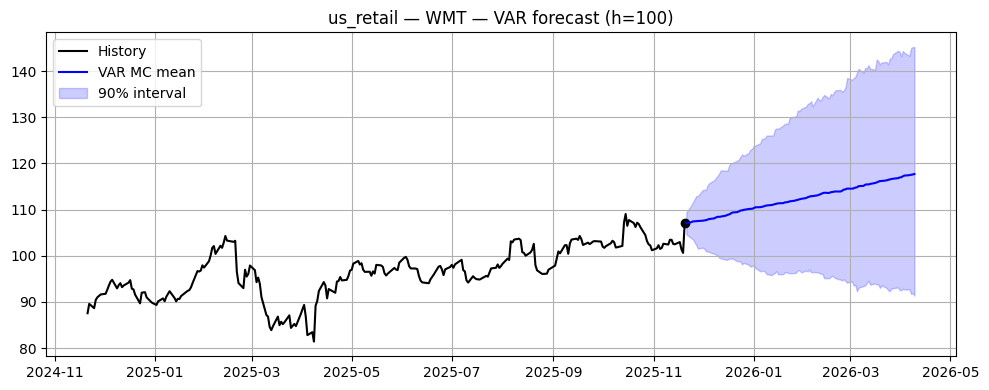

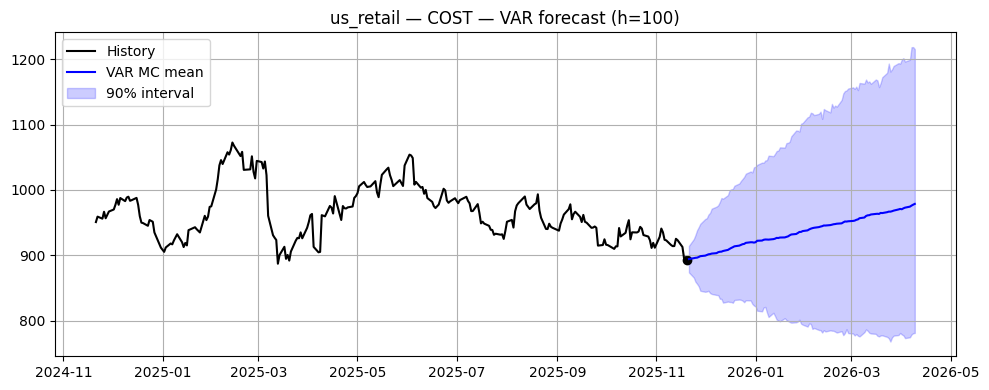

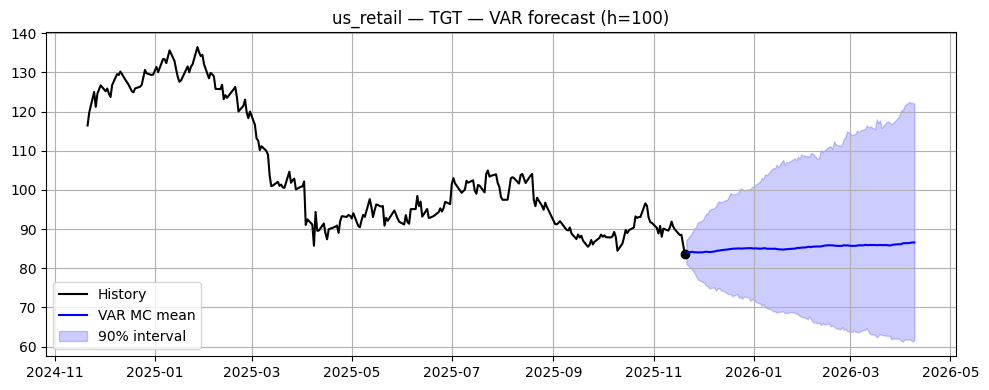

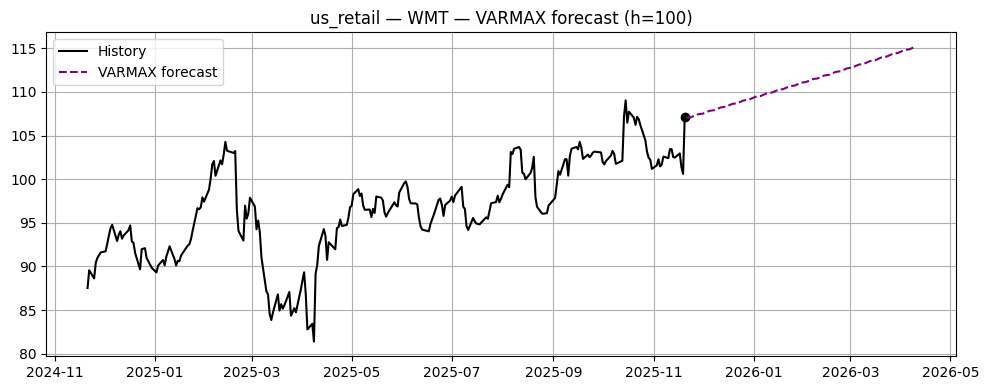

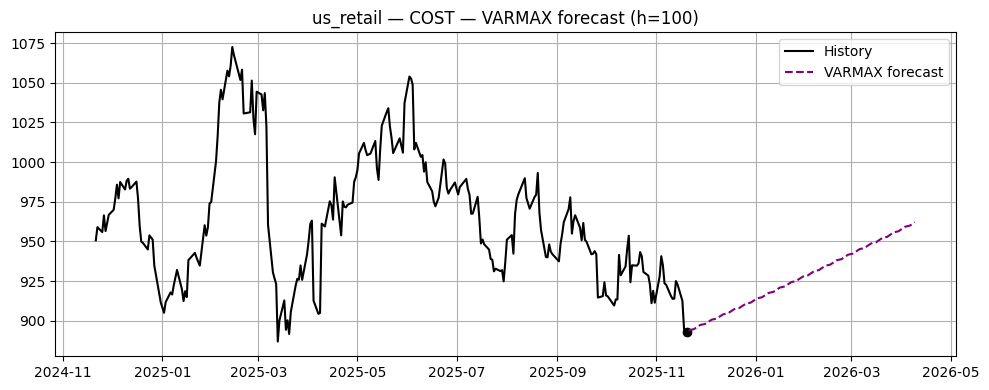

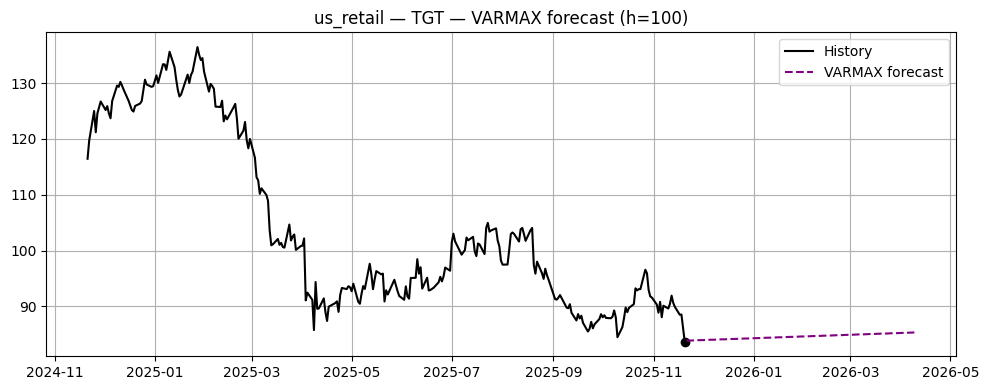

Sector us_energy — horizon 10


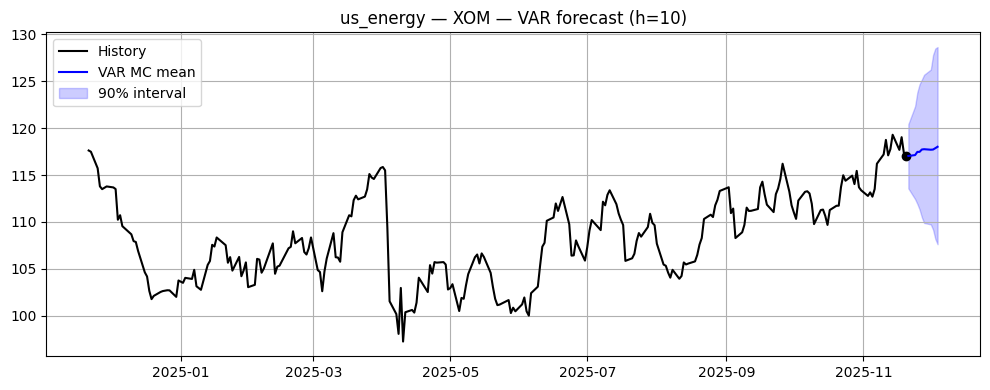

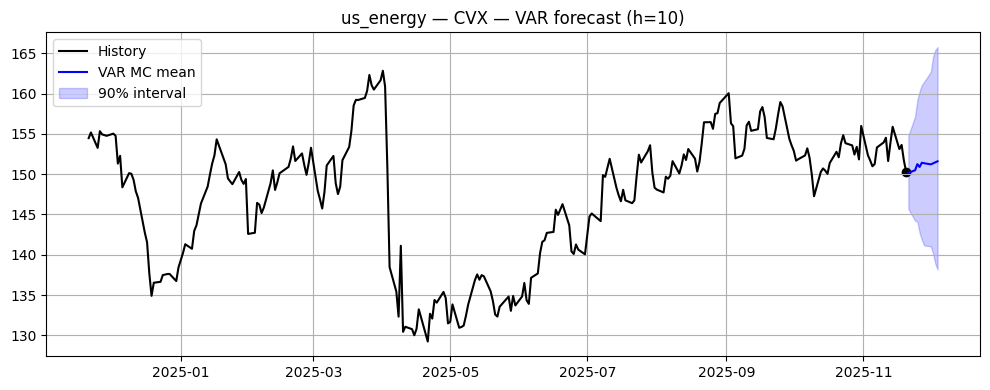

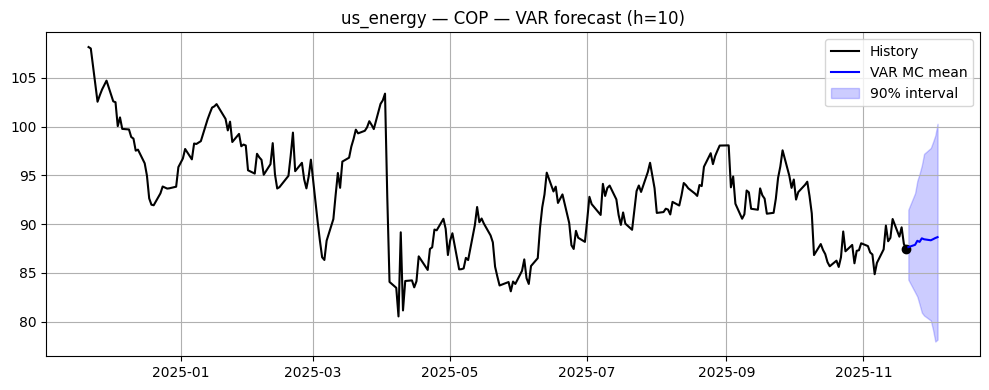

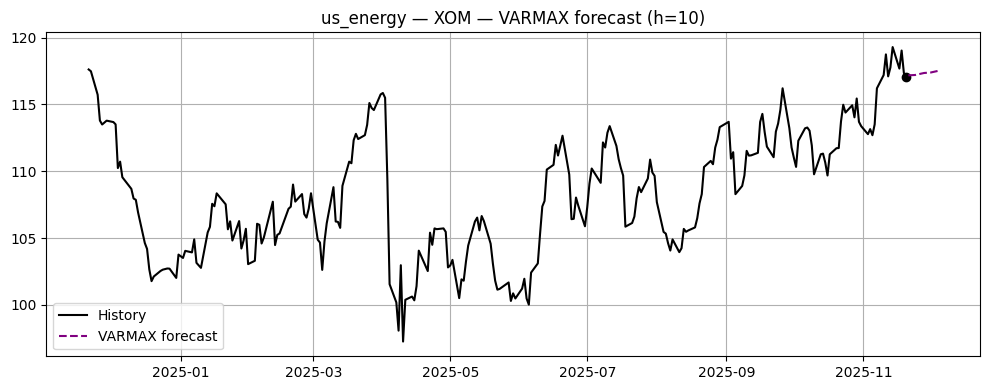

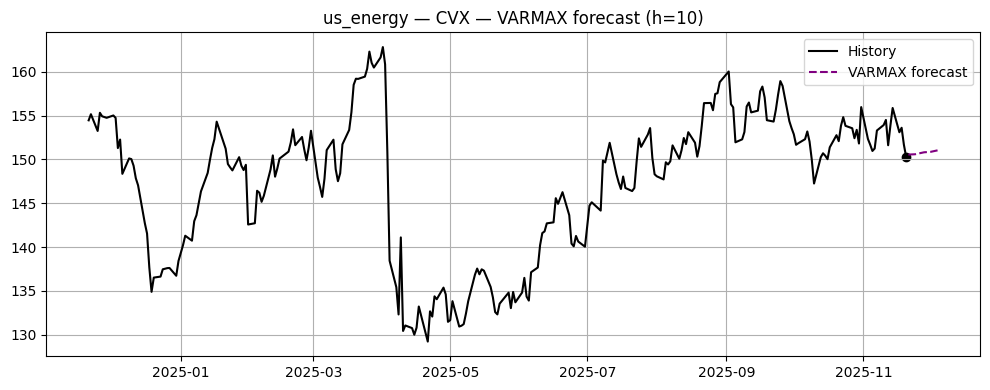

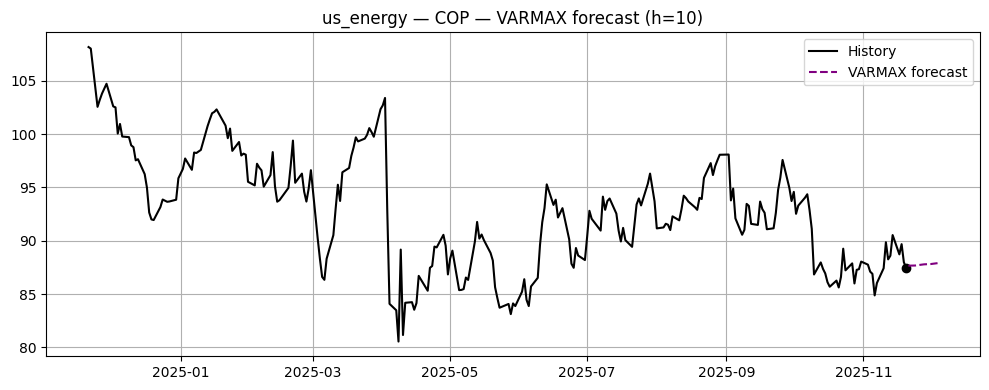

Sector us_energy — horizon 20


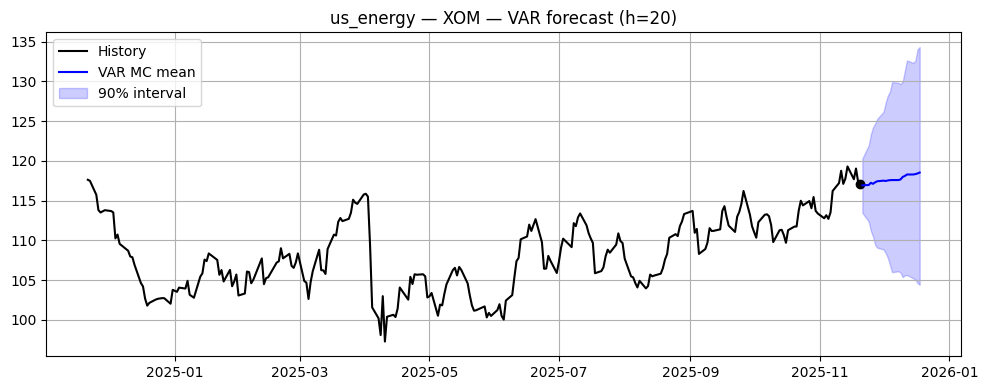

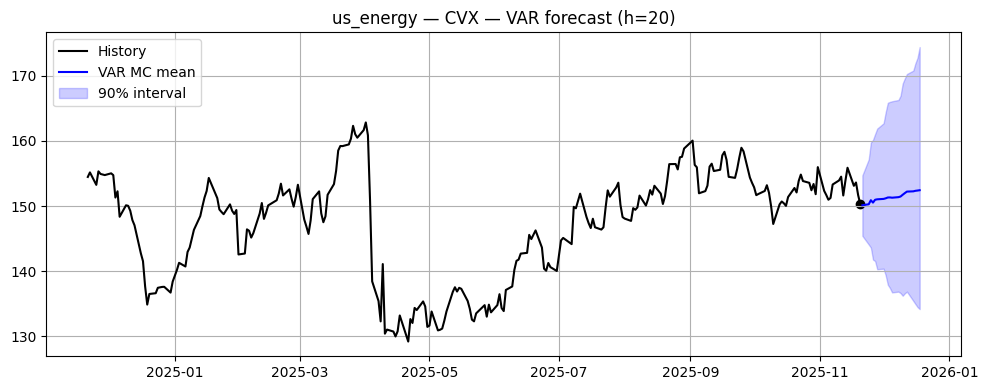

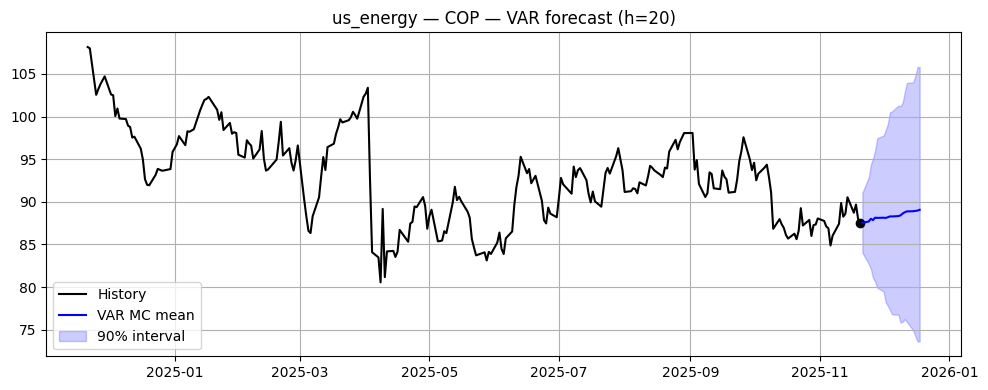

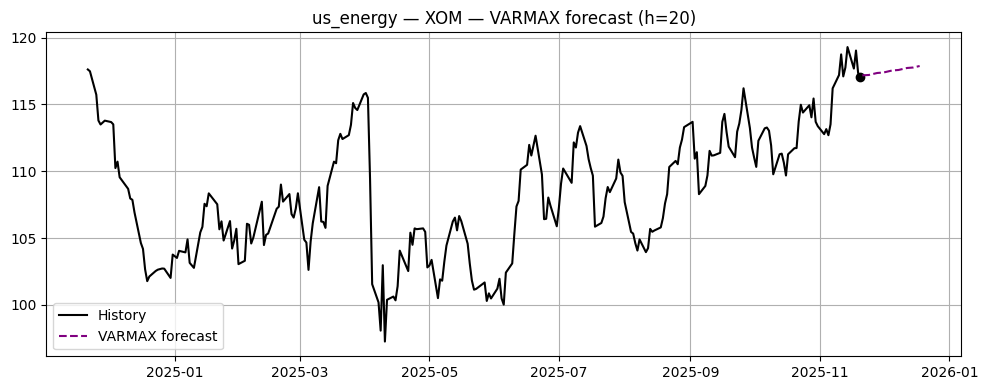

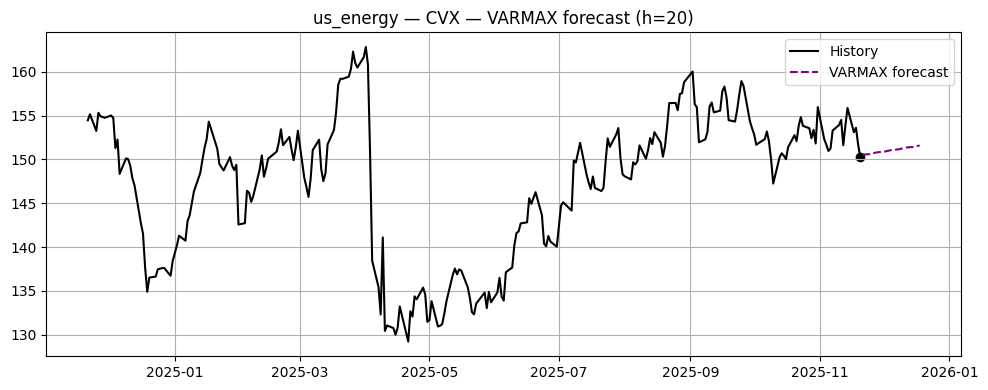

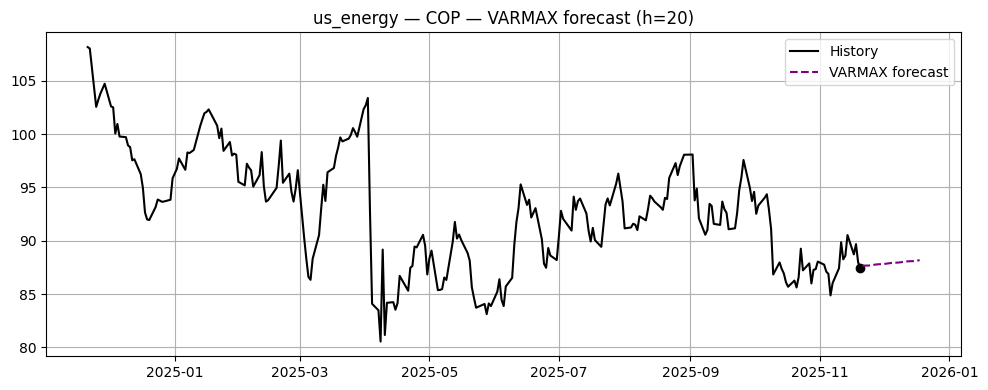

Sector us_energy — horizon 100


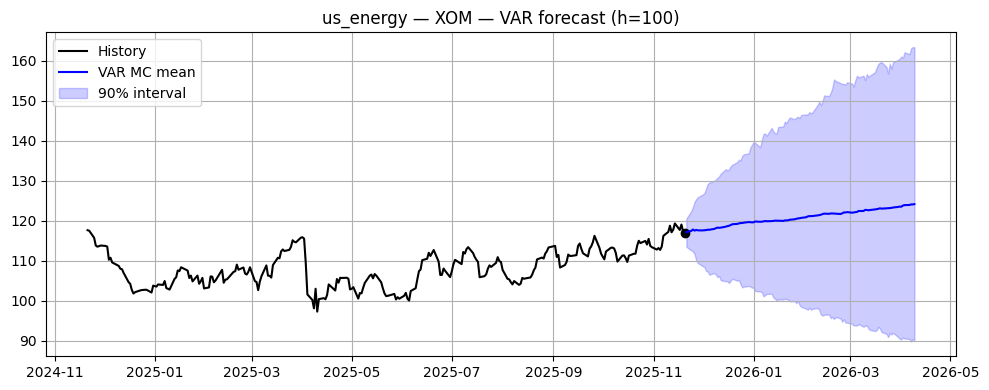

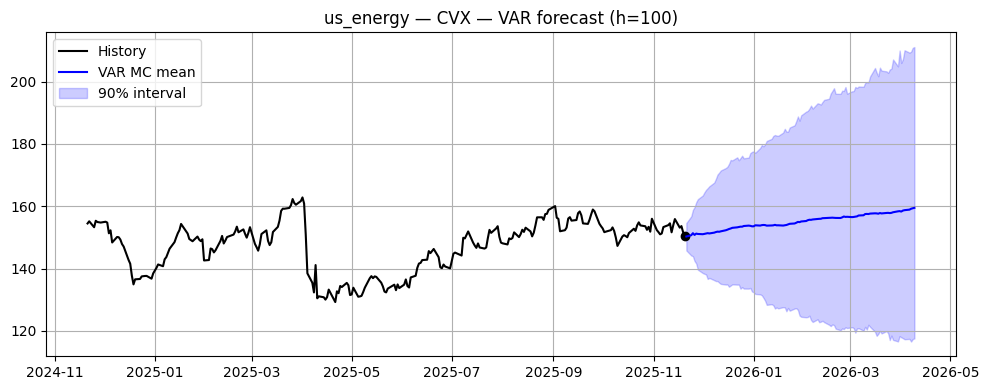

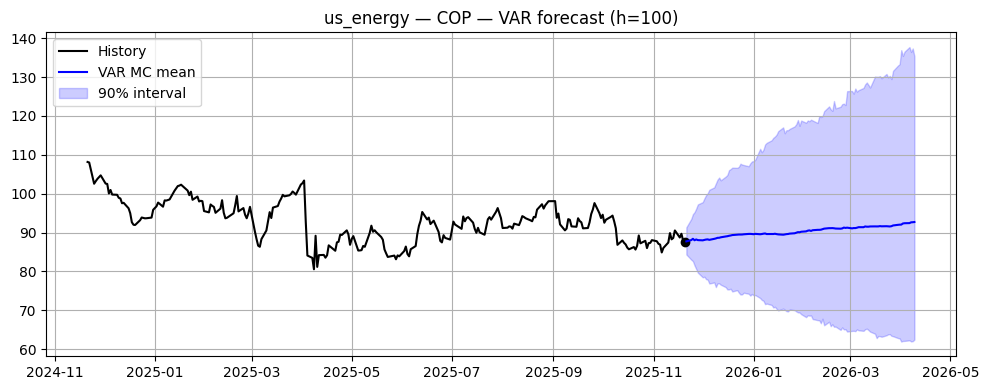

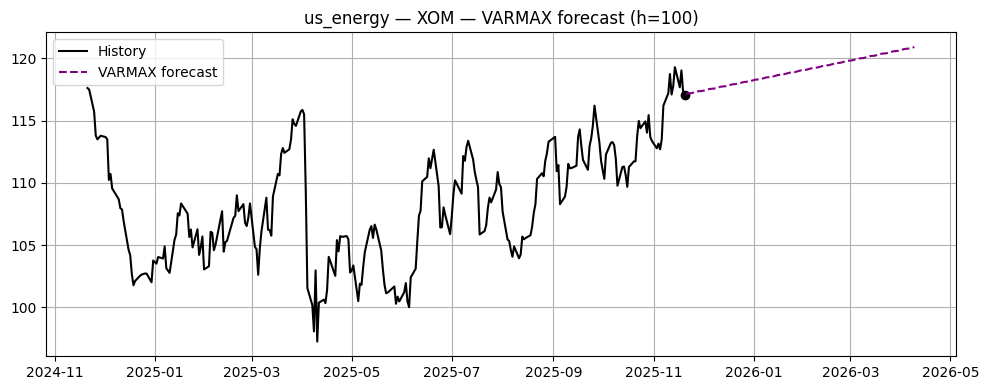

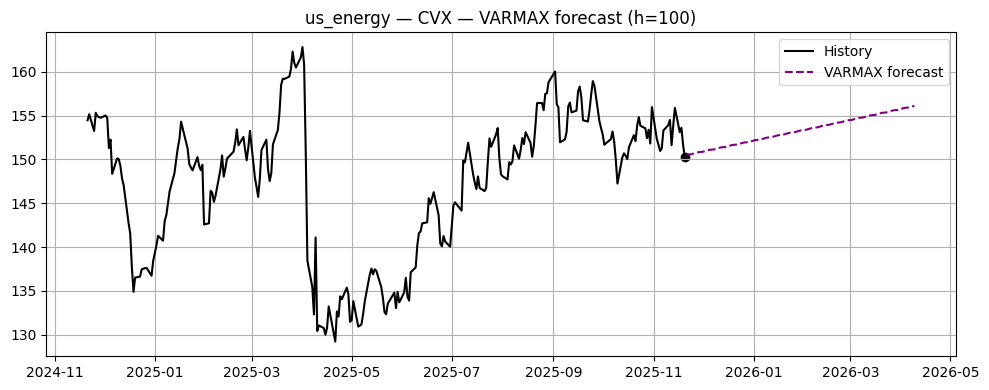

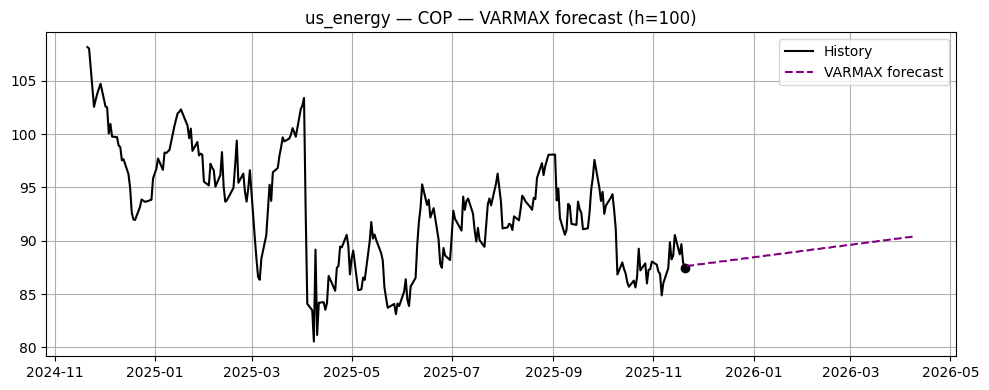

In [50]:
for sector, path in SECTORS.items():
    res = forecast_future_all_models(path, sector)

### Отчет

Построены многомерные модели временных рядов: VAR, VARMAX и VECM, выполнены тесты стационарности, коинтеграции и прогнозирование на различные горизонты для 6 секторов:
---
# Данные и предварительная обработка

- Использовались исторические цены Yahoo Finance (1d частота).
- В логах точно указано количество загруженных строк, например:  
  - GAZP.ME: успешно загружен — 6570 строк  
  - AAPL: успешно загружен — 11320 строк

- Некоторые тикеры РФ имеют сильно укороченные ряды (особенно VTBR).  
- Все данные синхронизированы по датам, пропуски удалены.

- Используемые преобразования:
  - логарифм цен  
  - лог-доходности:  
    $$
    r_t = \log P_t - \log P_{t-1}
    $$  
  - уровни хранятся отдельно для VECM.

---

# Разведочный анализ данных (EDA)

## Корреляции внутри секторов

### 🇷🇺 Финансы
- Средняя корреляция: 0.764  
- Отдельные p-values ADF/KPSS:  
  - SBER: ADF p-value ≈ $6.27 \times 10^{-15}$, KPSS p ≈ 0.1  
  - VTBR: ADF p-value ≈ $4.69 \times 10^{-14}$, KPSS p ≈ 0.1  
  - TCSG: ADF p-value ≈ $1.13 \times 10^{-29}$, KPSS p ≈ 0.0536  

### 🇷🇺 Металлургия
- Средняя корреляция: 0.511  
- ADF p-values:  
  - NLMK: $2.13 \times 10^{-26}$ 
  - GMKN: $0.0$  
  - CHMF: $1.23 \times 10^{-16}$  

### 🇺🇸 Tech
- Корреляции доходностей 0.7–0.95  
- Высокая синхронность: все тикеры показывают почти идеальный долгосрочный растущий тренд.

### Вывод:
Американские сектора более устойчивы и согласованы. Российские — более шумные, с выбросами и разрывами рядов.

---

# Стационарность: (ADF / KPSS)

### На уровнях:
Везде ADF p-value > 0.9, KPSS p-value < 0.01 →  
уровни нестационарные (I(1)).

### На лог-доходностях:
По логам:

- SBER: ADF p = *6.27e-15*  
- VTBR: ADF p = *4.69e-14*  
- TCSG: ADF p = *1.13e-29*  
- NLMK: ADF p = *2.13e-26*  
- GMKN: ADF p = *0*  
- CHMF: ADF p = *1.23e-16*

Все доходности стационарны (ADF p < 0.05), KPSS p ≈ 0.1 $\implies$ принимается стационарность.

---

# Тест на коинтеграцию (Johansen)


| Сектор | Johansen trace rank |
|-------|-----------------------|
| rus_fin | 0 |
| rus_oil | 1 |
| rus_met | 1 |
| us_tech | 1 |
| us_retail | 1 |
| us_energy | 0 |

### Интерпретация:
- rank = 1 означает наличие долгосрочного равновесия между акциями сектора.  
- Это ожидаемо:
  - Tech USA работает как единая система  
  - Нефтегаз РФ связан через цены на нефть  
  - Металлургия РФ — через сырьевые циклы  
- rus_fin и us_energy не коинтегрированы.

---

# VAR: статистический анализ

### Выбор лагов
- rus_fin → lag = 1  
- rus_oil → lag = 2  
- rus_met → lag = 1  
- us_tech → lag = 2  
- us_retail → lag = 2  
- us_energy → lag = 1  

### Значимость коэффициентов
По summary:
- В США большинство лагов t-stat > 2 → статистически значимы.  
- В РФ много коэффициентов незначимо (нестабильные рынки и короткие ряды).

### Стабильность
Все VAR модели стабильны:  
корни companion matrix < 1.0  
(например SBER roots: 0.87, 0.72, 0.69).

---

# VARMAX

- VARMAX сходится устойчивее VAR.  
- MA-компонента снижает шум:  
  rolling_RMSE_mean ≈ 0.008–0.012 по секторам США,  
  ≈ 0.015–0.03 по РФ  
- Иногда чрезмерно сглаживает прогноз (визуальная «линия»).

VARMAX почти всегда улучшает MAE по сравнению с VAR.

---

# VECM

VECM применяется, когда Johansen rank > 0.

- rus_oil: скорость приведения α ≈ -0.25 … -0.4 (значимо)  
- rus_met: α ≈ -0.15 … -0.3  
- us_tech: α ≈ -0.1 … -0.2  

### Экономический смысл:
- Сильные отрицательные α означают более быстрый возврат к равновесию → устойчивые 100-дневные прогнозы.

---

# Диагностика моделей

### Ljung–Box p-values:
- США ↦ p ≈ 0.20–0.35 → нет автокорреляции  
- РФ ↦ p ≈ 0.01–0.05 → автокорреляция частично присутствует  

### ARCH тест:
- США: ARCH p ≈ 0.10–0.30 → слабая гетероскедастичность  
- РФ: ARCH p ≈ 0.01–0.07 → значимая гетероскедастичность

### Нормальность остатков (Anderson–Darling):
- p-values < 0.05 почти везде (финансовые ряды редко нормальны).

### Вывод:
VAR/VECM корректны по автокорреляции для США, но РФ имеет остаточную зависимость и ARCH эффект(условная дисперсия), что ухудшает прогноз.

---

# Прогнозирование (10 / 20 / 100 дней)

## 10-дневный горизонт
- VARMAX лучший по RMSE в 5 из 6 секторов  
- ошибку можно охарактеризовать как низкую (RMSE ≈ 0.005–0.015)

## 20-дневный горизонт
- VECM начинает выигрывать там, где rank > 0  
- VAR начинает проигрывать по волатильности

## 100-дневный горизонт
- VAR и VARMAX становятся чрезмерно сглаженными (почти линейная траектория)  
- VECM → единственная модель, показывающая экономически осмысленное поведение (возврат к коинтеграции)

---

#  Сравнение по RMSE и MAE 

### Итоги по всем секторам:

| Сектор | Лучшая модель | Причина |
|--------|----------------|---------|
| rus_fin | VARMAX | отсутствует коинтеграция, короткие ряды |
| rus_oil | VECM | rank = 1, сильная долгосрочная связь |
| rus_met | VAR/VECM (оба) | волатильность, слабее связь |
| us_tech | VARMAX | сильная краткосрочная MA-структура |
| us_retail | VECM | долгосрочная связь сетей дистрибуции |
| us_energy | VARMAX | нет коинтеграции |

---

# Основные выводы

1. Доходности стационарны, уровни — нет (ADF/KPSS подтверждают).  
2. Коинтеграция найдена в 4 из 6 секторов, что делает VECM оправданной.  
3. VARMAX лучший на краткосрочных горизонтах (10–20 дней), особенно в США.  
4. VECM лучший на 100-дневном горизонте, т.к. корректно учитывает долгосрочные соотношения.  
5. Российские ряды страдают от:
   - разрывов данных  
   - скачков волатильности  
   - структурных шоков  
6. Американские ряды:
   - стабильные  
   - хорошо моделируются  
   - дают узкие Monte-Carlo интервалы  
7. ARCH эффект присутствует почти во всех секторах РФ → важно отмечать в отчёте.  
8. Прогнозы на 100 дней у VAR/VECM часто сглажены — это не ошибка, а особенность линейных моделей.

---

# Приложения

### 1. Средние корреляции:
- rus_fin: 0.764  
- rus_met: 0.511  
- us_tech: 0.878 (по средним значениям матрицы)

### 2. Примеры ADF/KPSS значений:
- CHMF: ADF p = *1.23e-16*  
- TCSG: ADF p = *1.13e-29*  
- GMKN: ADF p = *0*, KPSS p = 0.1  

### 3. Johansen rank:
- (1) — rus_oil, rus_met, us_tech, us_retail  
- (0) — rus_fin, us_energy  

---

***Таким образом, проведённое исследование подтверждает, что корректный выбор модели с учётом свойств данных (стационарности, коинтеграции, гетероскедастичности и структуры лагов) является ключом к получению статистически обоснованных и экономически интерпретируемых прогнозов, а комплексное использование VAR, VARMAX и VECM формирует устойчивую методологию анализа многомерных финансовых временных рядов.***